In [1]:
import numpy as np
import matplotlib as mpl
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.pyplot as plt
import scipy as sc

In [2]:
import matplotlib.animation as animation

In [ ]:
mpl.use("pgf")
#plt.rcParams['text.latex.unicode'] = True
plt.rcParams.update({
    "pgf.texsystem":   "pdflatex", # or any other engine you want to use
    "text.usetex":     True,       # use TeX for all texts
    "font.family":     "serif",
    "font.serif":      [],         # empty entries should cause the usage of the document fonts
    "font.sans-serif": [],
    "font.monospace":  [],
    "font.size":       10,         # control font sizes of different elements
    "axes.labelsize":  10,
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "pgf.preamble": [              # specify additional preamble calls for LaTeX's run
        r"\usepackage[T1]{fontenc}",
        r"\usepackage{siunitx}",
        r"\usepackage[utf8]{inputenc}",
        r"\DeclareUnicodeCharacter{2212}{-}",
    ],
})

In [3]:
from tqdm.notebook import tqdm

In [4]:
from ipywidgets import interact, interactive, fixed, interact_manual

In [5]:
from matplotlib.collections import LineCollection

In [6]:
from sympy import symbols, Symbol, expand, collect,sqrt,factor,fraction, diff, elliptic_e, elliptic_k, \
simplify,Poly,lambdify,series, cancel, Matrix
from sympy.parsing.mathematica import parse_mathematica as prsmat
x = symbols('x')

In [7]:
np.seterr('ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [8]:
### parse field expression ###
P,P1,P2,P3,P4 = symbols('P P1 P2 P3 P4')
Z,Z1,Z2,Z3,Z4 = symbols('Z Z1 Z2 Z3 Z4')
H1_wol_str = '(P2 Z1-P1 Z2)/(P1^2+Z1^2)^(3/2)'
H1_wol = prsmat(H1_wol_str)
H1_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], H1_wol)
H2_wol_str = '-(Z1/(P Sqrt[P1^2+Z1^2]))'
H2_wol = prsmat(H2_wol_str)
H2_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], H2_wol)


laplH1_wol_str='(1/(P (P1^2+Z1^2)^(9/2)))(-P1^6 Z3+P1^2 Z1 (3 P P2 (5 P2^2-13 Z2^2)+Z1^2 (-3 P2^2+2 P P4+3 Z2^2)-Z1^3 Z3+2 P Z1 (-P3 Z2+P2 Z3))+P1^4 (Z1 (-3 P2^2+P P4+3 Z2^2)-2 Z1^2 Z3+2 P (2 P3 Z2+3 P2 Z3))+P Z1^3 (-3 P2^3+Z1 (P4 Z1-6 P3 Z2)+P2 (15 Z2^2-4 Z1 Z3))+P1^5 (P3 Z1+3 P2 Z2-P Z4)+P1 Z1^2 (P3 Z1^3+3 P Z2 (13 P2^2-5 Z2^2)+10 P Z1 (-P2 P3+Z2 Z3)-Z1^2 (3 P2 Z2+P Z4))+P1^3 (2 P3 Z1^3+P (-10 P2 P3 Z1-15 P2^2 Z2+3 Z2^3+10 Z1 Z2 Z3-2 Z1^2 Z4)))'
laplH1_wol = prsmat(laplH1_wol_str)
laplH1_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], laplH1_wol)
laplH2_wol_str='(1/(P^3 (P1^2+Z1^2)^(7/2)))(-P1^6 Z1+P P2 Z1^3 (P P2+Z1^2)+P P1^5 Z2+P^2 P1^3 (P3 Z1+3 P2 Z2)+P P1 Z1^2 (P P3 Z1-(5 P P2+Z1^2) Z2)-P1^4 (P P2 Z1+2 Z1^3+P^2 Z3)-P1^2 Z1 (Z1^4+P^2 (3 P2^2-4 Z2^2)+P^2 Z1 Z3))'
laplH2_wol = prsmat(laplH2_wol_str)
laplH2_wol_lam = lambdify([P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4], laplH2_wol)

In [9]:
def get_ext_array(arr, tp='z'):
    n_arr = len(arr)-1
    ext_arr = np.zeros(2*n_arr)
    ext_arr[0:n_arr+1]=arr
    if tp=='p':
        ext_arr[n_arr+1:]=-arr[::-1][1:-1:]
    else:
        ext_arr[n_arr+1:]=arr[::-1][1:-1:]
    return ext_arr

In [10]:
#%run G_define.ipynb

In [11]:
### on the axis ###
def D_z_axis_part(z_,rho1_):
    return -2*np.pi*rho1_*z_*(rho1_**2-2*z_**2)/(rho1_**2+z_**2)**(5/2)
def D_rho_axis_part(z_,rho1_):
    return 2*np.pi*rho1_**2*(rho1_**2-2*z_**2)/(rho1_**2+z_**2)**(5/2)

In [12]:
import numdifftools as nd 

In [13]:
import matplotlib.colors as colors

## setting

In [ ]:
N=150
j_N = np.arange(N+1)
tau_N = j_N/N

In [ ]:
N_int = 1000

In [469]:
Tau_int = np.arange(N_int+1)/(N_int)

In [13]:
def get_int_field(field_rfft):
    """
    Returns N_int points of field by furier transphorm from `field_fur`
    """
    field_int = np.fft.irfft(field_rfft, norm='forward', n=2*N_int)
    return field_int[0:N_int+1]

def get_rfft_N_field(field):
    """
    Returns rfft of filed
    up to N harmonics
    """
    field_rfft=np.fft.rfft(field, norm='forward')
    return field_rfft[0:N]

def get_int_fields(field_rfft):
    """
    Returns N_int points of field and 4 derivatives by furier transphorm from `field_fur`
    """

    field_int = np.fft.irfft(field_rfft, norm='forward', n=2*N_int)
    der_oper = 1j*np.pi*np.arange(field_rfft.shape[0])
    field_1_int = np.fft.irfft(field_rfft*der_oper, norm='forward', n=2*N_int)
    field_2_int = np.fft.irfft(field_rfft*der_oper**2, norm='forward', n=2*N_int)
    field_3_int = np.fft.irfft(field_rfft*der_oper**3, norm='forward', n=2*N_int)
    field_4_int = np.fft.irfft(field_rfft*der_oper**4, norm='forward', n=2*N_int)
    return field_int[0:N_int+1], field_1_int[0:N_int+1], \
           field_2_int[0:N_int+1], field_3_int[0:N_int+1],field_4_int[0:N_int+1]

### Testing field

In [31]:
P_fur = np.zeros(N);
P_fur[1]=2./2

Z_fur = np.zeros(N);
Z_fur[1]=1./2

In [32]:
P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)

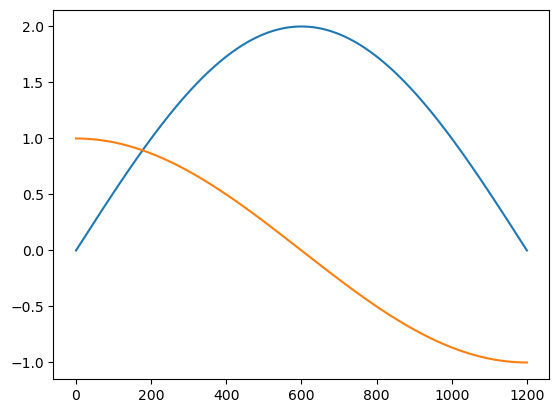

In [33]:
plt.figure()
plt.plot(P)
plt.plot(Z)

Text(0.5, 1.0, 'Input form \n $V=16.76, S=34.69$, $\\mathcal{V}=$$0.87$')

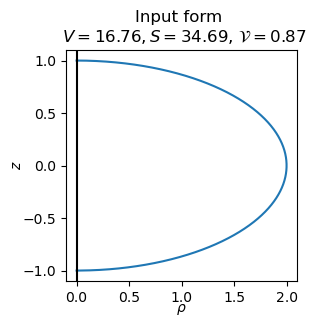

In [34]:
# %matplotlib notebook

Vol0,Sqr0,V_cal0 = get_VolSqr(P_fur, Z_fur)


plt.figure(figsize=(3,3))
plt.plot(P, Z,lw=1.5, ms=8, color = 'C0')
plt.axis('scaled')

plt.axvline(0, color='k')
plt.xlabel(r'$\rho$', labelpad=-2)
plt.ylabel(r'$z$', labelpad=-1)
plt.title(fr'Input form '+'\n'+fr' $V={Vol0:.2f}, S={Sqr0:.2f}$, '+r'$\mathcal{V}=$'+fr'${V_cal0:.2f}$')

In [53]:
H,force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 


### H&force function

In [15]:
def get_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    H1 = H1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2 = H2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2[0] = H1[0];H2[-1] = H1[-1]
    
    
    K = H1*H2
    H = H1+H2
    
    laplH1 = laplH1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH1[0] = 2*(-P1[0]**2*Z4[0]+4*P1[0]*P3[0]*Z2[0]+3*Z2[0]**3)/np.abs(P1[0])**5/P1[0]
    laplH1[-1] = 2*(-P1[-1]**2*Z4[-1]+4*P1[-1]*P3[-1]*Z2[-1]+3*Z2[-1]**3)/np.abs(P1[-1])**5/P1[-1]
    
    laplH2 = laplH2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH2[0]=laplH1[0]/3
    laplH2[-1]=laplH1[-1]/3
    
    laplH = laplH1+laplH2
    
    force =  H**3/2 - 2*H*K + laplH
    return force

def get_force_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    return get_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)

In [16]:
def get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    
    force = -(Z1*(2*P1**2 + Z1**2))/(2.*P**3*V**3) + ((2*P1**2 - Z1**2)*(-(P2*Z1) + P1*Z2))/(2.*P**2*V**5) + (3*P2**2*Z1**3 + 2*P1*Z1**2*(2*P3*Z1 - 9*P2*Z2) + 4*P1**3*(P3*Z1 + 3*P2*Z2) - 4*P1**4*Z3 + P1**2*Z1*(-12*P2**2 + 15*Z2**2 - 4*Z1*Z3))/(2.*P*V**7) + (2*P1**4*(P4*Z1 + 4*P3*Z2 + 6*P2*Z3) + Z1**3*(-5*P2**3 + 2*Z1*(P4*Z1 - 6*P3*Z2) + P2*(30*Z2**2 - 8*Z1*Z3)) + P1**2*Z1*(30*P2**3 + 4*Z1*(P4*Z1 - P3*Z2) + P2*(-75*Z2**2 + 4*Z1*Z3)) - 2*P1**5*Z4 + P1**3*(-20*P2*P3*Z1 - 30*P2**2*Z2 + 5*Z2**3 + 20*Z1*Z2*Z3 - 4*Z1**2*Z4) + P1*Z1**2*(-20*P2*P3*Z1 + 75*P2**2*Z2 - 30*Z2**3 + 20*Z1*Z2*Z3 - 2*Z1**2*Z4))/(2.*V**9)
    H = -(Z1/(P*V)) + (P2*Z1 - P1*Z2)/V**3
    
    ###
    force[0]=(-8*(-4*P1[0]*P3[0]*Z2[0] - 3*Z2[0]**3 + P1[0]**2*Z4[0]))/(3.*(P1[0]**6))
    force[-1]=-(-8*(-4*P1[-1]*P3[-1]*Z2[-1] - 3*Z2[-1]**3 + P1[-1]**2*Z4[-1]))/(3.*(P1[-1]**6))
    
    H[0] = (-2*Z2[0])/(P1[0]**2)
    H[-1] = -(-2*Z2[-1])/(P1[-1]**2)
    ###
    
    return H, force


In [17]:
def get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    H1 = H1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2 = H2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2[0] = H1[0];H2[-1] = H1[-1]
    
    
    K = H1*H2
    H = H1+H2
    
    laplH1 = laplH1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH1[0] = 2*(-P1[0]**2*Z4[0]+4*P1[0]*P3[0]*Z2[0]+3*Z2[0]**3)/np.abs(P1[0])**5/P1[0]
    laplH1[-1] = 2*(-P1[-1]**2*Z4[-1]+4*P1[-1]*P3[-1]*Z2[-1]+3*Z2[-1]**3)/np.abs(P1[-1])**5/P1[-1]
    
    laplH2 = laplH2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    laplH2[0]=laplH1[0]/3
    laplH2[-1]=laplH1[-1]/3
    
    laplH = laplH1+laplH2
    
    force =  H**3/2 - 2*H*K + laplH
    return H, force

def get_H_force_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    return get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)

In [18]:
def get_H12(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4):
    V = np.sqrt(P1**2+Z1**2)
    H1 = H1_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2 = H2_wol_lam(P,P1,P2,P3,P4, Z,Z1,Z2,Z3,Z4)
    H2[0] = H1[0];H2[-1] = H1[-1]
    return H1, H2

def get_H12_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    return get_H12(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)

In [19]:
def get_a_H(P_fur, Z_fur):
    H1,H2 = get_H12_from_ar(P_fur, Z_fur)
    return 1/(np.sqrt(H1**2+H2**2))

In [20]:
def make_constant_v_repar(P_fur, Z_fur, N_proj=30):
    """
    Find reparametrization with constan V
    """
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    
    Der_goal_fft = np.fft.rfft(get_ext_array(V), norm='forward')
    Der_goal_fft /= Der_goal_fft[0]
    
    der_oper = 1j*np.pi*np.arange(Der_goal_fft.shape[0])
    Tau_s_goal_fur = Der_goal_fft.real/der_oper
    Tau_s_goal_fur[0]=0.
    
    Tau_s_goal_norm = np.fft.irfft(Tau_s_goal_fur, norm='forward', n=2*N_int)[:N_int+1]

    Tau_s_goal = Tau_int+Tau_s_goal_norm

    P_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,P,k=7,bc_type=(
        [(2, 0.0),(4, 0.0),(6, 0.0)], 
        [(2, 0.0),(4, 0.0),(6, 0.0)]))
    P_s = P_s_spline(Tau_int)

    Z_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,Z,k=7,bc_type=(
        [(1, 0.0),(3, 0.0),(5, 0.0)], 
        [(1, 0.0),(3, 0.0),(5, 0.0)]))
    Z_s = Z_s_spline(Tau_int)

    P_s_fft = np.fft.rfft(get_ext_array(P_s,'p'),norm='forward')
    Z_s_fft = np.fft.rfft(get_ext_array(Z_s,'z'),norm='forward')

    P_fur0_s = np.zeros(N)
    Z_fur0_s = np.zeros(N)

    P_fur0_s[:N_proj] = -P_s_fft.imag[:N_proj]
    Z_fur0_s[:N_proj] =  Z_s_fft.real[:N_proj]    
    return P_fur0_s,Z_fur0_s

In [21]:
def make_F_v_repar(P_fur, Z_fur, F,N_proj=30):
    """
    Find reparametrization with constan V
    """
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    
    Der_goal_fft = np.fft.rfft(get_ext_array(V/F), norm='forward')
    Der_goal_fft /= Der_goal_fft[0]
    
    der_oper = 1j*np.pi*np.arange(Der_goal_fft.shape[0])
    Tau_s_goal_fur = Der_goal_fft.real/der_oper
    Tau_s_goal_fur[0]=0.
    
    Tau_s_goal_norm = np.fft.irfft(Tau_s_goal_fur, norm='forward', n=2*N_int)[:N_int+1]

    Tau_s_goal = Tau_int+Tau_s_goal_norm

    P_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,P,k=7,bc_type=(
        [(2, 0.0),(4, 0.0),(6, 0.0)], 
        [(2, 0.0),(4, 0.0),(6, 0.0)]))
    P_s = P_s_spline(Tau_int)

    Z_s_spline =sc.interpolate.make_interp_spline(Tau_s_goal,Z,k=7,bc_type=(
        [(1, 0.0),(3, 0.0),(5, 0.0)], 
        [(1, 0.0),(3, 0.0),(5, 0.0)]))
    Z_s = Z_s_spline(Tau_int)

    P_s_fft = np.fft.rfft(get_ext_array(P_s,'p'),norm='forward')
    Z_s_fft = np.fft.rfft(get_ext_array(Z_s,'z'),norm='forward')

    P_fur0_s = np.zeros(N_proj)
    Z_fur0_s = np.zeros(N_proj)

    P_fur0_s[:N_proj] = -P_s_fft.imag[:N_proj]
    Z_fur0_s[:N_proj] =  Z_s_fft.real[:N_proj]    
    return P_fur0_s,Z_fur0_s

In [22]:
def get_H1_dl_H1_from_ar(P_fur, Z_fur):
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    H1 = P2*Z1-P1*Z2
    H1 /= V**3
    
    dl_H1 = (P3*Z1-Z3*P1)/V**4-3*H1*(P1*P2+Z1*Z2)/V**3
    return H1,dl_H1

### Energy, Vol, Sqr

$$
\mathcal{F} =\int \frac{1}{2} H^{2} dS\ =2\pi \int \frac{1}{2} H^{2} \ \rho vd\tau 
$$
The best scheme is to decompose density of energy $2\pi \frac{1}{2} H^{2}\rho v = C_m \varphi_{\rho m}$.  
End integrate directly:
$$
\int _{0}^{1} \varphi _{\rho m} d\tau \ =\ \delta _{m\bmod 2=1}\frac{4}{\pi m}
$$

In [23]:
def get_Energy(P_fur, Z_fur):
    """
    Find Helfrih enegry of shape
    """
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)    
    V = np.sqrt(P1**2+Z1**2) 
   
    H,force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)
    
    energy = H*H*P*V/2 ### density whitout 2pi###
    
    enegry_fur = 1j*np.fft.rfft(get_ext_array(energy,'p'), norm='forward')
    Energy = 8*(enegry_fur.real/np.arange(enegry_fur.shape[0]))[1::2].sum()
    return Energy

$$
V\ =\ \pi \int P^{2}( -Z_{\tau }) d\tau ;
$$  
$$
S\ =\ 2\pi \int _{0}^{1} vP\ d\tau ,\ 
$$

In [24]:
def get_VolSqr(P_fur, Z_fur):
    """
    Find Volume and Square of the membrane
    """
    
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)    
    V = np.sqrt(P1**2+Z1**2) 
   
    
    vol = -P*P*Z1/2 ### density without 2pi###
    vol_fur = 1j*np.fft.rfft(get_ext_array(vol,'p'), norm='forward')
    Vol = 8*(vol_fur.real/np.arange(vol.shape[0]))[1::2].sum()
    
    sqr = V*P ### density without 2pi###
    sqr_fur = 1j*np.fft.rfft(get_ext_array(sqr,'p'), norm='forward')
    Sqr = 8*(sqr_fur.real/np.arange(sqr.shape[0]))[1::2].sum()
    
    return np.array((Vol,Sqr))

#### Derivatives

In [25]:
### Scalar prodact ###
Phi_zrho_km = np.load('Phi_zrho_km.npy')

$$
\delta \mathcal{F} =-2\pi \int f_{\kappa } \cdot (\mathbf{l,\delta \psi }) \ \rho vd\tau 
$$

In [26]:
def get_force_proj_N(P,P1,Z,Z1, force, N_ext_basis):
    """
    Find projection force on l*varphi_k basis functions
    """
    V = np.sqrt(P1**2+Z1**2)
    
    ### N part ###
    den = (P* V)*force
    
    den_fur = (1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')).real[1:800]
    force_N_proj = Phi_zrho_km[:N_ext_basis,:den_fur.shape[0]] @ den_fur
    
    return force_N_proj

$$
\delta V\ =\ 2\pi \int (\mathbf{l,\delta \psi }) \ vPd\tau =\int (\mathbf{l,\delta \psi }) \ dS
$$

In [27]:
def get_Var_Vol_proj_N(P,P1,Z,Z1, N_ext_basis):
    """
    Find projection Vol on l*varphi_k basis functions
    """
    V = np.sqrt(P1**2+Z1**2)
    
    ### N part ###
    den = (P*V)
    den_fur = (1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')).real[1:800]
    Vol_N_proj = Phi_zrho_km[:N_ext_basis,:den_fur.shape[0]] @ den_fur
    
    return Vol_N_proj

In [28]:
def get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_ext_basis):
    """
    Find projection Vol on l*varphi_k basis functions
    """
    V = np.sqrt(P1**2+Z1**2)
    
    ### N part ###
    den = (P*V*H)
    den_fur = (1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')).real[1:800]
    Sqr_N_proj = Phi_zrho_km[:N_ext_basis,:den_fur.shape[0]] @ den_fur
    
    return Sqr_N_proj

### Velocity

$$
< \mathcal{O}> =\frac{\int _{\mathcal{M}}\mathcal{O}}{S}
$$

In [29]:
def get_mean_O(obs, P, V):
    den = P*V*obs
    den_fur = 1j*np.fft.rfft(get_ext_array(den,'p'), norm='forward')
    Int_O = 8*(den_fur.real/np.arange(den.shape[0]))[1::2].sum()
    
    sqr = V*P ### density without 2pi###
    sqr_fur = 1j*np.fft.rfft(get_ext_array(sqr,'p'), norm='forward')
    Sqr = 8*(sqr_fur.real/np.arange(sqr.shape[0]))[1::2].sum()
    
    return Int_O/Sqr

$$
\mathbf{v}=\mathbf{l(} f-P-\Sigma H)
$$

$$
\begin{cases}
\Sigma =\frac{< fH> -< f> < H> }{\mathbb{D} H}\\
P=< f> \ -< H> \Sigma 
\end{cases}
$$

In [30]:
def get_Sigma_Pressure(H,force,P,V):
    H_mean = get_mean_O(H, P, V)
    H_sqr_mean = get_mean_O(H*H, P, V)
    H_varience = H_sqr_mean - H_mean*H_mean
    
    force_mean = get_mean_O(force, P, V)
    force_H_mean = get_mean_O(force*H, P, V)
    corr_H_force = force_H_mean - force_mean*H_mean

    Sigma = corr_H_force/H_varience
    Pressure = force_mean - H_mean*Sigma

    return Sigma, Pressure

def get_Sigma_Pressure_from_arr(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

    return get_Sigma_Pressure(H,force,P,V)

In [31]:
def get_normal_velo(H,force, P,V):
    Sigma, Pressure = get_Sigma_Pressure(H,force,P,V)
    res = force.copy()
    res -= Pressure
    res -= Sigma*H
    return res

In [32]:
def get_normal_velo_fur(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    
    return np.fft.rfft(get_ext_array(normal_velo,'z'), norm='forward').real

In [33]:
def get_normal_velo_projects_full(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    
    l_rho = -Z1/V; l_z=P1/V;
    velo_rho = l_rho*normal_velo;  velo_z = l_z*normal_velo
    velo_rho_fur = (np.fft.rfft(get_ext_array(velo_rho,'p'), norm='forward')[1:]*1j).real
    velo_z_fur = np.fft.rfft(get_ext_array(velo_z,'z'), norm='forward').real
    return velo_rho_fur, velo_z_fur

In [34]:
def get_normal_velo_pz(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)

    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    
    l_rho = -Z1/V; l_z=P1/V;
    velo_rho = l_rho*normal_velo;  velo_z = l_z*normal_velo
    return velo_rho, velo_z

In [35]:
def get_velo_with_nat_gauge(P_fur,Z_fur,T_g=1e-2):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    tan_velo = V_1/T_g
    
    l_rho = -Z1/V; l_z=P1/V;
    t_rho = P1/V; t_z = Z1/V;
    
    velo_rho = l_rho*normal_velo + t_rho*tan_velo;  velo_z = l_z*normal_velo+t_z*tan_velo
    return velo_rho, velo_z

In [36]:
def get_gauge_velo(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    tan_velo = V_1
    
    t_rho =  P1/V; t_z = Z1/V;
    
    velo_rho = t_rho*tan_velo;  velo_z = t_z*tan_velo

    return velo_rho, velo_z



def get_gauge_velo_projects_full(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    tan_velo = V_1
    
    t_rho =  P1/V; t_z = Z1/V;
    
    velo_rho = t_rho*tan_velo;  velo_z = t_z*tan_velo
    velo_rho_fur = (np.fft.rfft(get_ext_array(velo_rho,'p'), norm='forward')[1:]*1j).real
    velo_z_fur = np.fft.rfft(get_ext_array(velo_z,'z'), norm='forward').real
    return velo_rho_fur, velo_z_fur
    

In [37]:
def get_velo_with_nat_gauge_projects_full(P_fur,Z_fur,T_g=1e-2):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    tan_velo = V_1/T_g
    
    l_rho = -Z1/V; l_z=P1/V;
    t_rho =  P1/V; t_z = Z1/V;
    
    velo_rho = l_rho*normal_velo + t_rho*tan_velo;  velo_z = l_z*normal_velo+t_z*tan_velo
    velo_rho_fur = (np.fft.rfft(get_ext_array(velo_rho,'p'), norm='forward')[1:]*1j).real
    velo_z_fur = np.fft.rfft(get_ext_array(velo_z,'z'), norm='forward').real
    return velo_rho_fur, velo_z_fur

In [38]:
def get_velo_with_nat_gauge(P_fur,Z_fur,T_g=1e-2):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    V_1 = (P1*P2+Z1*Z2)/V
    
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    normal_velo = get_normal_velo(H,force, P,V)
    tan_velo = V_1/T_g
    
    l_rho = -Z1/V; l_z=P1/V;
    t_rho = P1/V; t_z = Z1/V;
    
    velo_rho = l_rho*normal_velo + t_rho*tan_velo;  velo_z = l_z*normal_velo+t_z*tan_velo
    return velo_rho, velo_z

### Normal Jac 

$\delta f_\kappa = k_i \delta N^{(i)}$

In [39]:
def get_dforce_kernals_dN(P_fur,Z_fur):
    ### find fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    
    ker0 = -3/(2.*P**4) + (3*P1**4)/(2.*P**4*V**4) + (Z1*(-2*P1**2 + Z1**2)*(P2*Z1 - P1*Z2))/(P**3*V**6) - (3*(P2*Z1 - P1*Z2)*(P2**2*Z1**3 + 2*P1*Z1**2*(P3*Z1 - 4*P2*Z2) + 2*P1**3*(P3*Z1 + 3*P2*Z2) - 2*P1**4*Z3 + P1**2*Z1*(-6*P2**2 + 7*Z2**2 - 2*Z1*Z3)))/(P*V**10) + (P2**2*Z1**4 + 2*P1*Z1**3*(P3*Z1 - 4*P2*Z2) + 2*P1**3*Z1*(P3*Z1 + 2*P2*Z2) + P1**4*(Z2**2 - 2*Z1*Z3) + P1**2*Z1**2*(-5*P2**2 + 7*Z2**2 - 2*Z1*Z3))/(P**2*V**8) + (Z1**4*(21*P2**4 - 6*P3**2*Z1**2 + 4*P2*Z1*(-2*P4*Z1 + 21*P3*Z2) + P2**2*(-174*Z2**2 + 32*Z1*Z3)) - 2*P1**6*(3*Z3**2 + 4*Z2*Z4) - 2*P1**2*Z1**2*(87*P2**4 + 87*Z2**4 + 8*P2*Z1*(P4*Z1 + 4*P3*Z2) - 58*Z1*Z2**2*Z3 + P2**2*(-411*Z2**2 + 26*Z1*Z3) + 3*Z1**2*(2*P3**2 + Z3**2) + 4*Z1**2*Z2*Z4) - P1**4*(-21*Z2**4 + 4*P2*Z1*(2*P4*Z1 + 37*P3*Z2) - 116*Z1*Z2**2*Z3 + 6*P2**2*(29*Z2**2 + 14*Z1*Z3) + 6*Z1**2*(P3**2 + 2*Z3**2) + 16*Z1**2*Z2*Z4) + 4*P1**5*(8*P3*Z2**2 + Z2*(2*P4*Z1 + 21*P2*Z3) + Z1*(3*P3*Z3 + 2*P2*Z4)) + 4*P1**3*Z1*(29*P2**2*P3*Z1 + 87*P2**3*Z2 + Z1*(4*P4*Z1*Z2 + P3*(-13*Z2**2 + 6*Z1*Z3)) + 4*P2*(-27*Z2**3 - 4*Z1*Z2*Z3 + Z1**2*Z4)) + 4*P1*Z1**3*(29*P2**2*P3*Z1 - 108*P2**3*Z2 + Z1*(2*P4*Z1*Z2 + 3*P3*(-7*Z2**2 + Z1*Z3)) + P2*(87*Z2**3 - 37*Z1*Z2*Z3 + 2*Z1**2*Z4)))/(2.*V**12)
    ker1 = (-2*P1**3 + P1*Z1**2)/(2.*P**3*V**4) + (-2*P1**3*P2 + 7*P1*P2*Z1**2 - 8*P1**2*Z1*Z2 + Z1**3*Z2)/(2.*P**2*V**6) + (4*P1**4*P3 - 48*P1**2*P2*Z1*Z2 + 2*Z1**3*(-2*P3*Z1 + 9*P2*Z2) + P1*Z1**2*(21*P2**2 - 30*Z2**2 + 8*Z1*Z3) + P1**3*(-12*P2**2 + 3*Z2**2 + 8*Z1*Z3))/(2.*P*V**8) + (2*P1**5*P4 + P1**3*(30*P2**3 + 4*Z1*(P4*Z1 - 4*P3*Z2) + P2*(9*Z2**2 - 16*Z1*Z3)) + P1*Z1**2*(9*P2**3 + 2*Z1*(P4*Z1 - 8*P3*Z2) + 8*P2*(9*Z2**2 - 2*Z1*Z3)) + P1**4*(-20*P2*P3 - 4*Z2*Z3 + 2*Z1*Z4) + Z1**3*(-4*P2*P3*Z1 + 9*P2**2*Z2 + 30*Z2**3 - 20*Z1*Z2*Z3 + 2*Z1**2*Z4) + P1**2*Z1*(-24*P2*P3*Z1 + 72*P2**2*Z2 + 9*Z2**3 - 24*Z1*Z2*Z3 + 4*Z1**2*Z4))/(2.*V**10)
    ker2 = -(-2*P1**2 + Z1**2)/(2.*P**2*V**4) + (3*P2*(2*P1**2 - Z1**2) + 9*P1*Z1*Z2)/(P*V**6) + (8*P1**3*P3 + 2*P1*Z1*(4*P3*Z1 - 33*P2*Z2) + Z1**2*(3*P2**2 - 30*Z2**2 + 8*Z1*Z3) + P1**2*(-30*P2**2 + 3*Z2**2 + 8*Z1*Z3))/(2.*V**8)
    ker3 = (-2*P1)/(P*V**4) + (6*(P1*P2 + Z1*Z2))/V**6
    ker4 = -V**(-4)
    
    return np.vstack([ker0, ker1, ker2,ker3,ker4])

def get_dforce_arr(P_fur,Z_fur, N_jac):
    ### find initial fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    Kernals_matr = get_dforce_kernals_dN(P_fur,Z_fur)

    K_arr = np.arange(N_jac).reshape(-1,1)
    Der0 = 2*np.cos(np.pi*K_arr*Tau_int)
    Der1 = -2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)
    Der2 = -2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**2
    Der3 = 2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**3
    Der4 = 2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**4

    Der_matr = np.swapaxes(np.array([Der0,Der1,Der2,Der3,Der4]),0,1)

    dforce_matr_elem = Kernals_matr.reshape(-1,5,N_int+1)*Der_matr
    
    dforce_matr=(dforce_matr_elem).sum(axis=1)
    
    dforce0 = (-16*K_arr**4*np.pi**4)/(3.*P1[0]**4) - (16*K_arr**2*np.pi**2*(4*P1[0]*P3[0] + 3*Z2[0]**2))/(3.*P1[0]**6) + (64*Z2[0]*(4*P1[0]*P3[0]*Z2[0] + 3*Z2[0]**3 - P1[0]**2*Z4[0]))/(3.*P1[0]**8)
    dforcem1 = (-16*K_arr**4*np.pi**4)/(3.*P1[-1]**4) - (16*K_arr**2*np.pi**2*(4*P1[-1]*P3[-1] + 3*Z2[-1]**2))/(3.*P1[-1]**6) + (64*Z2[-1]*(4*P1[-1]*P3[-1]*Z2[-1] + 3*Z2[-1]**3 - P1[-1]**2*Z4[-1]))/(3.*P1[-1]**8)
    dforcem1 *= (-1)**(K_arr)
    dforce_matr[:,0]=dforce0.reshape(-1)
    dforce_matr[:,-1]=dforcem1.reshape(-1)
    
    dforce_matr[0]/=2 ### first basis function is 1 ###
    return dforce_matr

$$
\delta v_l = G\delta f_\kappa + \delta G f_\kappa = \delta v_{[\delta f]} + \delta v_{[\delta G]}
$$

In [40]:
def get_Var_vl_fur_from_dforce(P_fur,Z_fur, N_jac):
    ### find initial fields ###
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    H, _ = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4)
    
    Kernals_matr = get_dforce_kernals_dN(P_fur,Z_fur)
    K_arr = np.arange(N_jac).reshape(-1,1)
    Der0 = 2*np.cos(np.pi*K_arr*Tau_int)
    Der1 = -2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)
    Der2 = -2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**2
    Der3 = 2*np.sin(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**3
    Der4 = 2*np.cos(np.pi*K_arr*Tau_int)*(np.pi*K_arr)**4

    Der_matr = np.swapaxes(np.array([Der0,Der1,Der2,Der3,Der4]),0,1)

    dforce_matr_elem = Kernals_matr.reshape(-1,5,N_int+1)*Der_matr
    
    dforce_matr=(dforce_matr_elem).sum(axis=1)
    
    dforce0 = (-16*K_arr**4*np.pi**4)/(3.*P1[0]**4) - (16*K_arr**2*np.pi**2*(4*P1[0]*P3[0] + 3*Z2[0]**2))/(3.*P1[0]**6) + (64*Z2[0]*(4*P1[0]*P3[0]*Z2[0] + 3*Z2[0]**3 - P1[0]**2*Z4[0]))/(3.*P1[0]**8)
    dforcem1 = (-16*K_arr**4*np.pi**4)/(3.*P1[-1]**4) - (16*K_arr**2*np.pi**2*(4*P1[-1]*P3[-1] + 3*Z2[-1]**2))/(3.*P1[-1]**6) + (64*Z2[-1]*(4*P1[-1]*P3[-1]*Z2[-1] + 3*Z2[-1]**3 - P1[-1]**2*Z4[-1]))/(3.*P1[-1]**8)
    dforcem1 *= (-1)**(K_arr)
    dforce_matr[:,0]=dforce0.reshape(-1)
    dforce_matr[:,-1]=dforcem1.reshape(-1)
    
    dforce_matr[0]/=2 ### first basis function is 1 ###
    
    
    Var_vl_from_dforce = np.apply_along_axis(lambda dforce: np.fft.rfft(get_ext_array(get_normal_velo(H,dforce, P,V)), norm='forward').real,1,dforce_matr)
    
    
    return Var_vl_from_dforce

In [41]:
def get_vl_fur_with_dN_fur_without_var_force(P_fur, Z_fur, dN_fur): 
    """
    Find N furier components of normal velocity 
    """
    ### find initial fields ###
    dN = get_int_field(dN_fur)
    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur)
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;
    
    H_, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    
    ### find new fields ###
    P_new = P+l_rho*dN;Z_new = Z+l_z*dN
    
    P_rfft_new = np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')
    P_rfft_new[abs(P_rfft_new)<1e-11]=0
    Z_rfft_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')
    Z_rfft_new[abs(Z_rfft_new)<1e-11]=0
    
    
    P, P1,P2,P3,P4 = get_int_fields(P_rfft_new)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_rfft_new)   
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;    

    H, force_ = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 
    return np.fft.rfft(get_ext_array(get_normal_velo(H,force, P,V)), norm='forward').real

In [42]:
def get_J_norm(P_fur,Z_fur, N_jac):
    Var_vl_from_dforce = get_Var_vl_fur_from_dforce(P_fur,Z_fur, N_jac)
    
    step_arr = np.logspace(-7,-5.5,N_jac)[::-1]
    jac_fun = nd.Jacobian(lambda x: get_vl_fur_with_dN_fur_without_var_force(P_fur, Z_fur, x), step=step_arr)

    Var_vl_without_dforce = jac_fun(np.zeros(N_jac))
    J_split = Var_vl_without_dforce + Var_vl_from_dforce.T
    return J_split

## Jacobain researsh

In [751]:
def get_Jacobian_velo_normal(P_fur, Z_fur):
    def get_velo_pz_fur_1d(pz):
        P_fur = np.zeros(N)
        P_fur[1:N]=pz[:N-1]
        Z_fur = pz[N-1:]
        veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
        return np.concatenate([veloP[:N-1], veloZ[:N]])
    steps = np.logspace(-12,-5,N)[::-1]
    steps = np.concatenate((steps[:N-1], steps[:N]))
    jfun_h = nd.Jacobian(get_velo_pz_fur_1d, step=steps)
    return jfun_h(np.concatenate([P_fur[1:N],Z_fur]))

In [778]:
def get_Jacobian_velo_normal(P_fur, Z_fur):
    def get_velo_pz_fur_1d(pz):
        P_fur = np.zeros(N)
        P_fur[1:N]=pz[1::2]
        Z_fur = pz[::2]
        veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
        N_max=N
        velo_pz = np.zeros(2*N_max-1)
        velo_pz[1::2]=veloP[:N_max-1]
        velo_pz[::2]=veloZ[:N_max]
        return velo_pz
    steps = np.logspace(-9,-5,2*N-1)[::-1]
    jfun_h = nd.Jacobian(get_velo_pz_fur_1d, step=steps)
    pz_c = np.zeros(2*N-1)
    pz_c[1::2]=P_fur[1:N]
    pz_c[::2]=Z_fur
    return jfun_h(pz_c)

In [834]:
def get_Jacobian_velo(P_fur, Z_fur,T_g):
    def get_velo_pz_fur_1d(pz):
        P_fur = np.zeros(N)
        P_fur[1:N]=pz[1::2]
        Z_fur = pz[::2]
        veloP, veloZ = get_velo_with_nat_gauge_projects_full(P_fur, Z_fur,T_g)
        N_max=N
        velo_pz = np.zeros(2*N_max-1)
        velo_pz[1::2]=veloP[:N_max-1]
        velo_pz[::2]=veloZ[:N_max]
        return velo_pz
    steps = np.logspace(-9,-5,2*N-1)[::-1]
    jfun_h = nd.Jacobian(get_velo_pz_fur_1d, step=steps)
    pz_c = np.zeros(2*N-1)
    pz_c[1::2]=P_fur[1:N]
    pz_c[::2]=Z_fur
    return jfun_h(pz_c)

In [799]:
N=70

In [813]:
P_fur0 = np.zeros(N);
P_fur0[1]=p1
P_fur0[2]=p2
P_fur0 /= 2

Z_fur0 = np.zeros(N);
Z_fur0[1]=z1
Z_fur0[2]=z2
Z_fur0[3]=z3
Z_fur0 /= 2

In [814]:
P_fur0,Z_fur0 = make_constant_v_repar(P_fur0,Z_fur0, 50)

In [779]:
Jac_full = get_Jacobian_velo_normal(P_fur0, Z_fur0)

In [839]:
Jac_full = get_Jacobian_velo(P_fur0, Z_fur0, 5e-3)

In [848]:
%matplotlib inline
@interact_manual(log_T_g=(-6,2,1))
def plot_jac(log_T_g):
    #plt.figure()
    Jac_full = get_Jacobian_velo(P_fur0, Z_fur0, 10**log_T_g)
    #plt.imshow(np.log10(abs(Jac_full)))
    eigvals = sc.linalg.eigvals(Jac_full)
    
    n_min = 40
    J_hf = Jac_full[n_min:,n_min:]
    eigvals_hf = sc.linalg.eigvals(J_hf)

    plt.figure()
    plt.scatter(eigvals.real, eigvals.imag)
    plt.scatter(eigvals_hf.real, eigvals_hf.imag)

    plt.grid()
    plt.xscale('symlog')
    
    
    Jac_full = get_Jacobian_velo_normal(P_fur0, Z_fur0)
    #plt.imshow(np.log10(abs(Jac_full)))
    eigvals = sc.linalg.eigvals(Jac_full)
    
    n_min = 40
    J_hf = Jac_full[n_min:,n_min:]
    eigvals_hf = sc.linalg.eigvals(J_hf)

    plt.figure()
    plt.scatter(eigvals.real, eigvals.imag)
    plt.scatter(eigvals_hf.real, eigvals_hf.imag)

    plt.grid()
    plt.xscale('symlog')    
    

interactive(children=(IntSlider(value=-2, description='log_T_g', max=2, min=-6), Button(description='Run Inter…

<IPython.core.display.Javascript object>


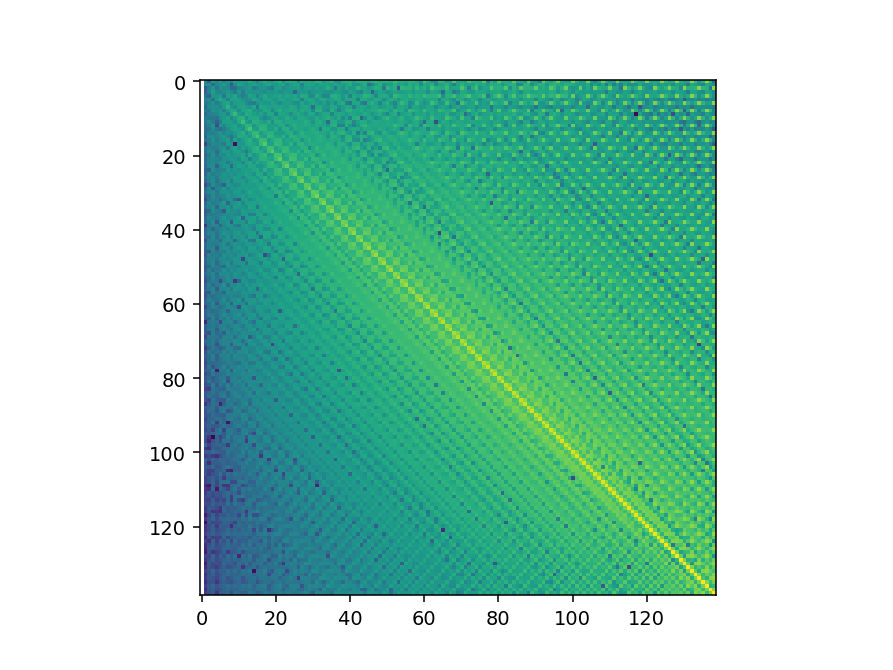

In [838]:
plt.figure()
plt.imshow(np.log10(abs(Jac_full)))

In [829]:
n_min = 40
J_hf = Jac_full[n_min:,n_min:]

<IPython.core.display.Javascript object>


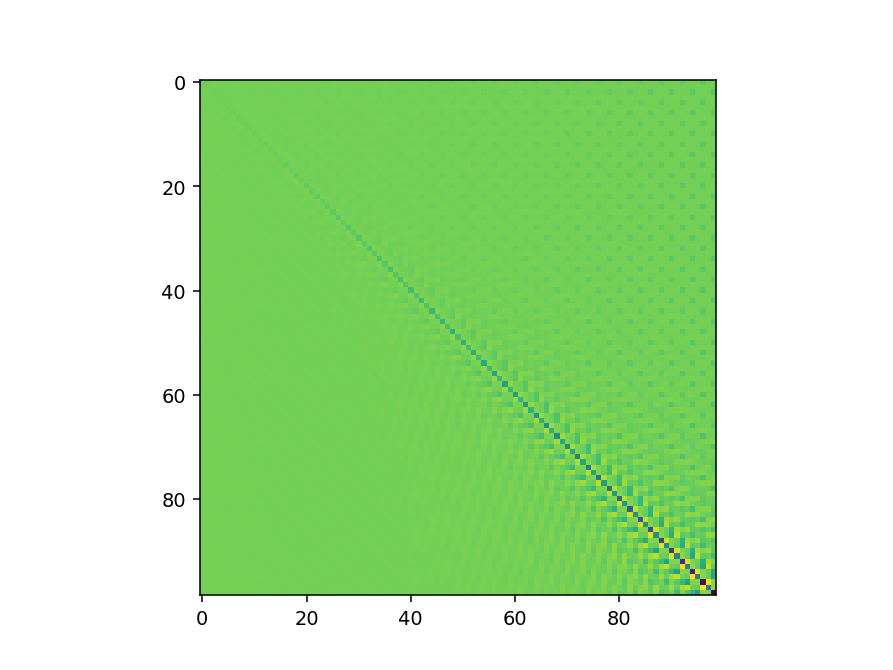

In [830]:
plt.figure()
plt.imshow(J_hf)

In [831]:
eigvals = sc.linalg.eigvals(Jac_full)

<IPython.core.display.Javascript object>


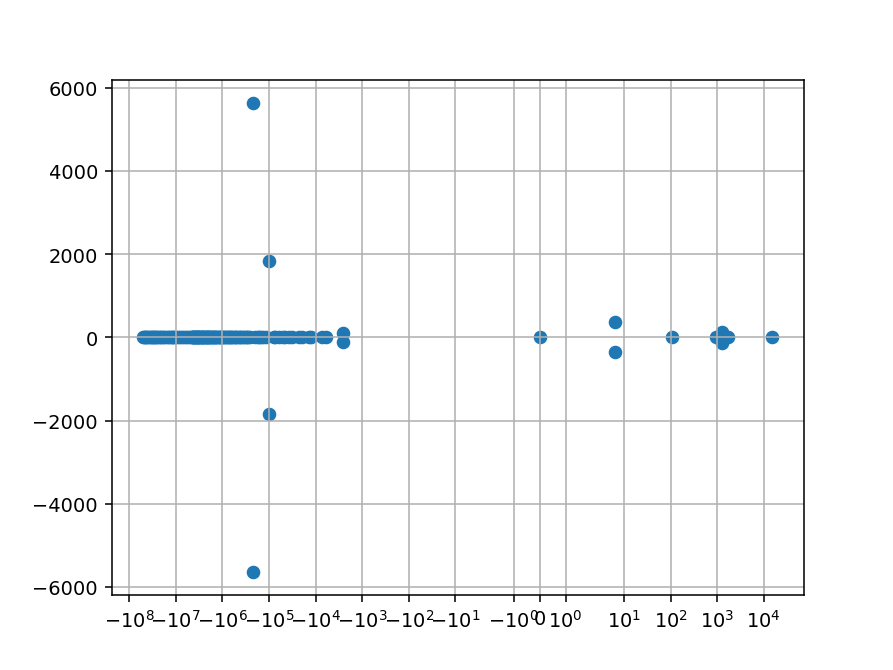

In [832]:
plt.figure()
plt.scatter(eigvals.real, eigvals.imag)
plt.grid()
plt.xscale('symlog')

In [809]:
J_hhf=J_hf[-20:,-20:]

In [810]:
eigvals_hf = sc.linalg.eigvals(J_hf)
eigvals_hhf = sc.linalg.eigvals(J_hhf)

<IPython.core.display.Javascript object>


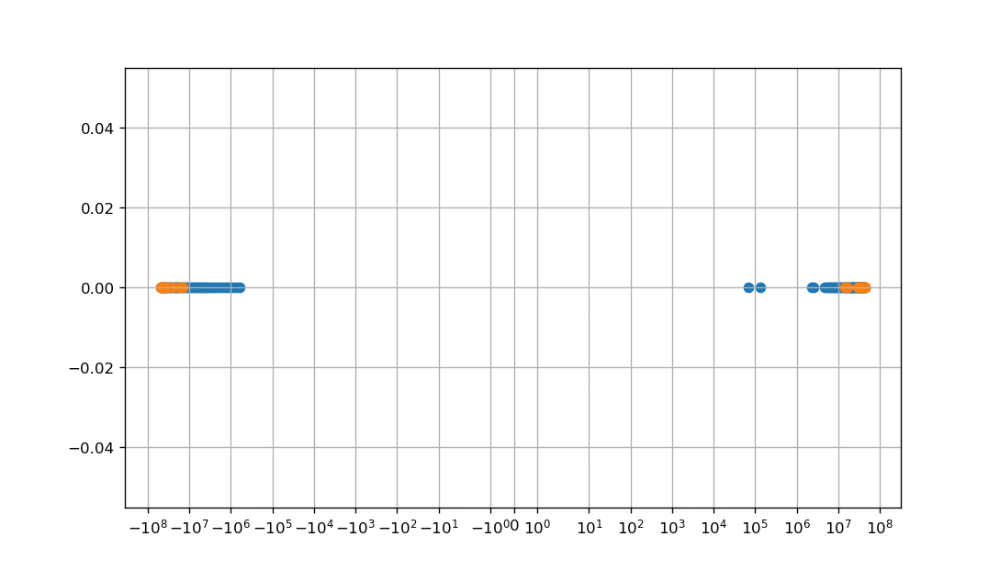

In [811]:
plt.figure()
plt.scatter(eigvals_hf.real, eigvals_hf.imag)
plt.scatter(eigvals_hhf.real, eigvals_hhf.imag)

plt.grid()
plt.xscale('symlog')

<IPython.core.display.Javascript object>


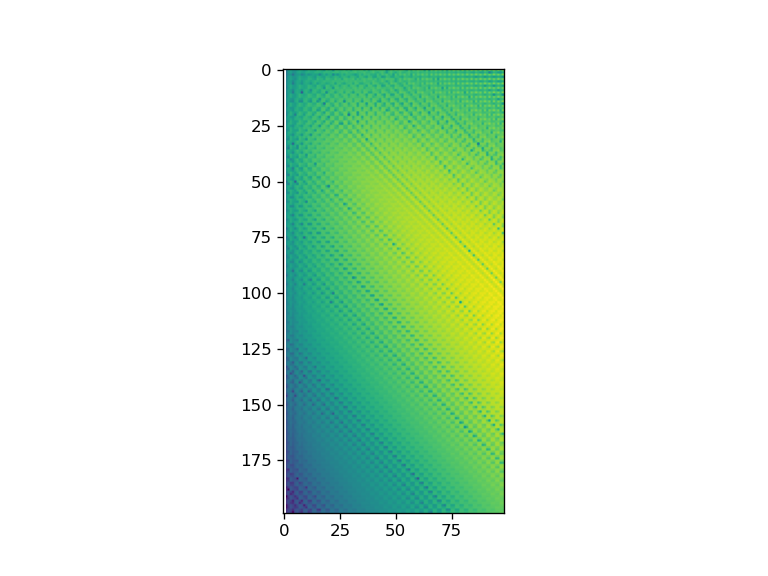

In [733]:
plt.figure()
plt.imshow(np.log10(abs(Jac_full)))


<IPython.core.display.Javascript object>


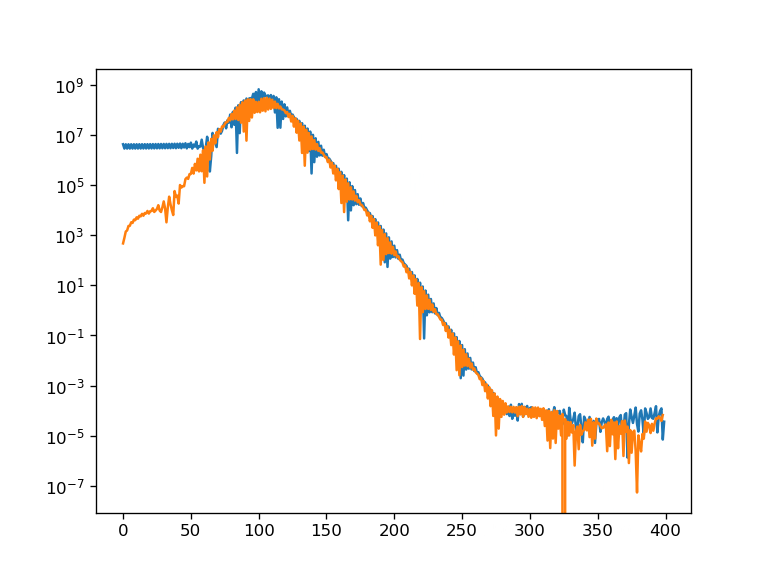

In [769]:
plt.figure()
plt.plot(abs(Jac_full[::2,200]))
plt.plot(abs(Jac_full[1::2,200]))

#plt.plot(abs(Jac_full[:,100]))

plt.yscale('log')

<IPython.core.display.Javascript object>


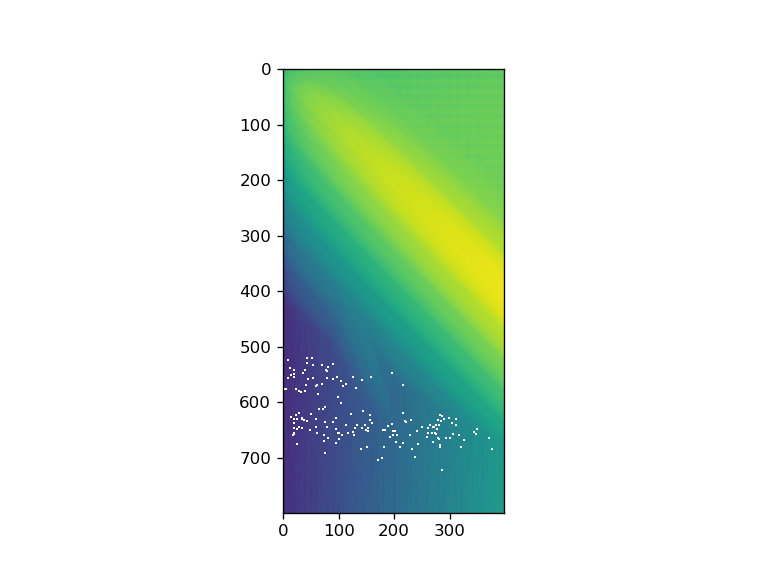

In [754]:
plt.figure()
plt.imshow(np.log10(abs(Jac_full)))


In [683]:
Jac_PP = Jac_full[:N-1,:N-1]
Jac_ZZ = Jac_full[N-1:,N-1:]

Jac_PZ = Jac_full[:N-1,N-1:]
Jac_ZP = Jac_full[N-1:,:N-1]


In [686]:
n_min = 100
Jac_PP_hf = Jac_PP[n_min-1:, n_min-1:]
Jac_ZZ_hf = Jac_ZZ[n_min:, n_min:]

Jac_PZ_hf = Jac_PZ[n_min-1:, n_min:]
Jac_ZP_hf = Jac_ZP[n_min:, n_min-1:]
J_hf = np.vstack([np.hstack([Jac_PP_hf, Jac_PZ_hf]),
                  np.hstack([Jac_ZP_hf, Jac_ZZ_hf])])

<IPython.core.display.Javascript object>


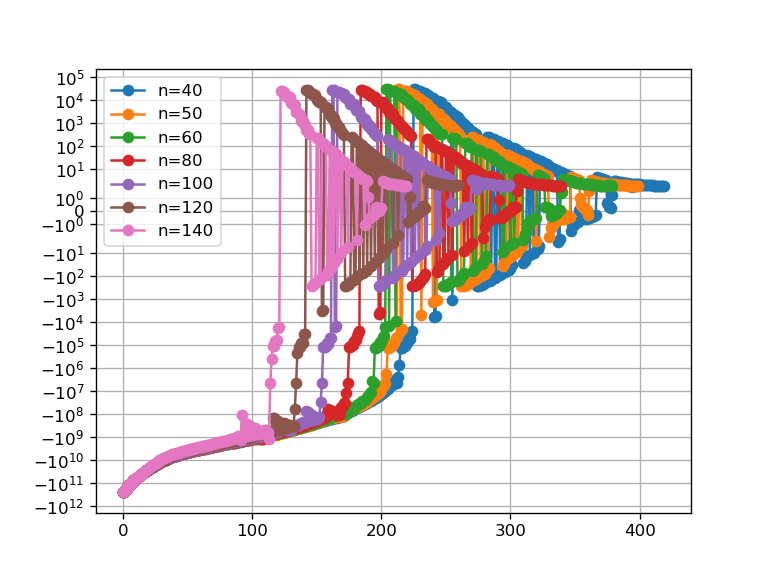

In [685]:

plt.figure()
plt.grid()
plt.yscale('symlog')


for n_min in [40,50,60,80,100,120,140]:
    Jac_PP_hf = Jac_PP[n_min-1:, n_min-1:]
    Jac_ZZ_hf = Jac_ZZ[n_min:, n_min:]
    
    Jac_PZ_hf = Jac_PZ[n_min-1:, n_min:]
    Jac_ZP_hf = Jac_ZP[n_min:, n_min-1:]
    J_hf = np.vstack([np.hstack([Jac_PP_hf, Jac_PZ_hf]),
                  np.hstack([Jac_ZP_hf, Jac_ZZ_hf])])
    eigvals_hf = sc.linalg.eigvals(J_hf)
    plt.plot(eigvals_hf.real, 'o-',label=f'n={n_min}')
plt.legend()

In [666]:
eigvals_hf = sc.linalg.eigvals(J_hf)

<IPython.core.display.Javascript object>


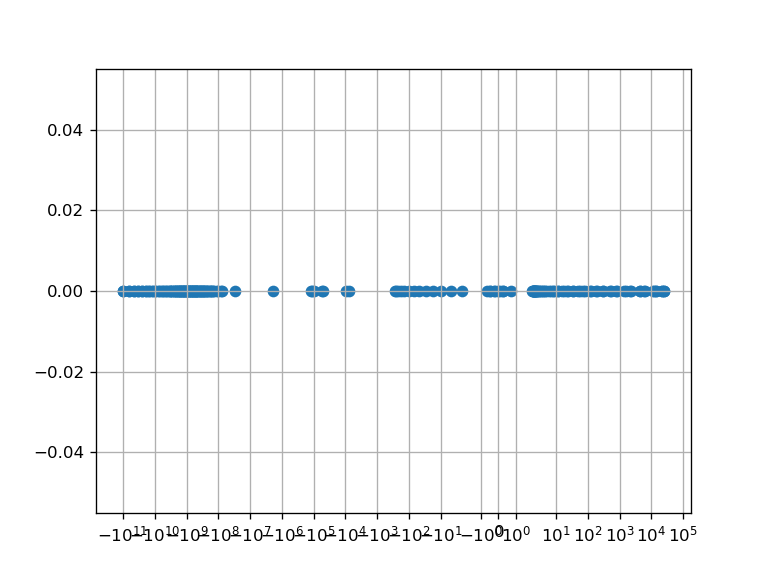

In [667]:
plt.figure()
plt.scatter(eigvals_hf.real, eigvals_hf.imag)
plt.grid()
plt.xscale('symlog')

In [649]:
w_hf, U_hf = sc.linalg.eig(J_hf)

In [687]:
velo_rho_fur, velo_z_fur = get_normal_velo_projects_full(P_fur0,Z_fur0)

velo_hf = np.concatenate([velo_rho_fur[n_min-1:N-1],velo_z_fur[n_min:N]])

In [688]:
psi_hf = sc.linalg.solve(J_hf, -velo_hf)

<IPython.core.display.Javascript object>


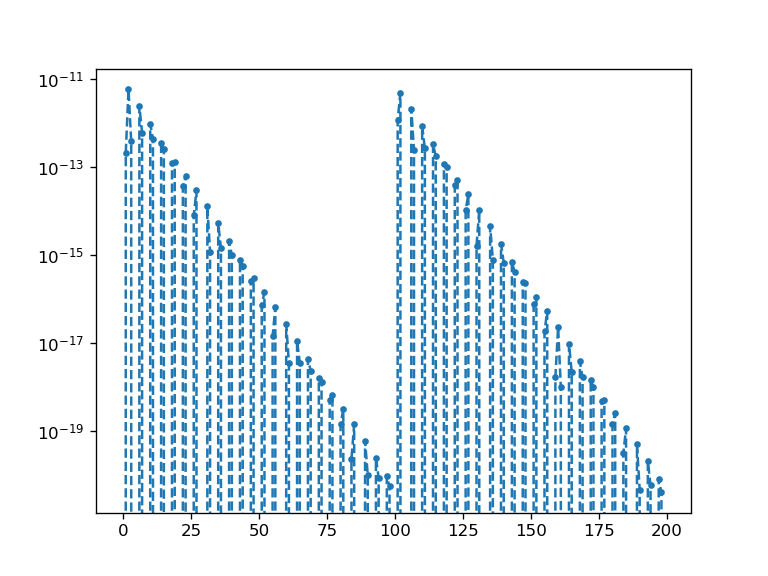

In [690]:
plt.figure()
#plt.plot(psi_hf,'.--')
plt.plot(psi_hf_diag,'.--')
plt.yscale('log')

In [672]:
psi_hf_diag = -velo_hf/J_hf.diagonal() 

<IPython.core.display.Javascript object>


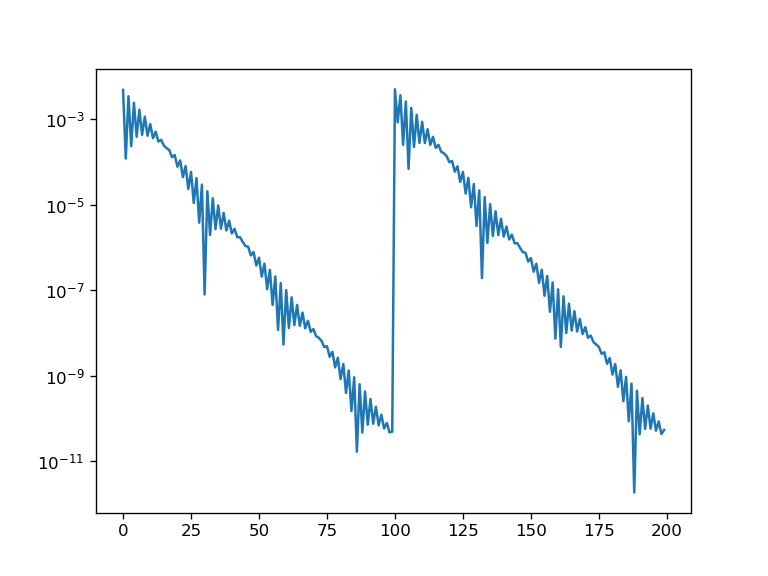

In [671]:
plt.figure()

plt.plot(abs(velo_hf))
plt.yscale('log')

In [652]:
velo_hf_tilde = sc.linalg.solve(U_hf, velo_hf)

<IPython.core.display.Javascript object>


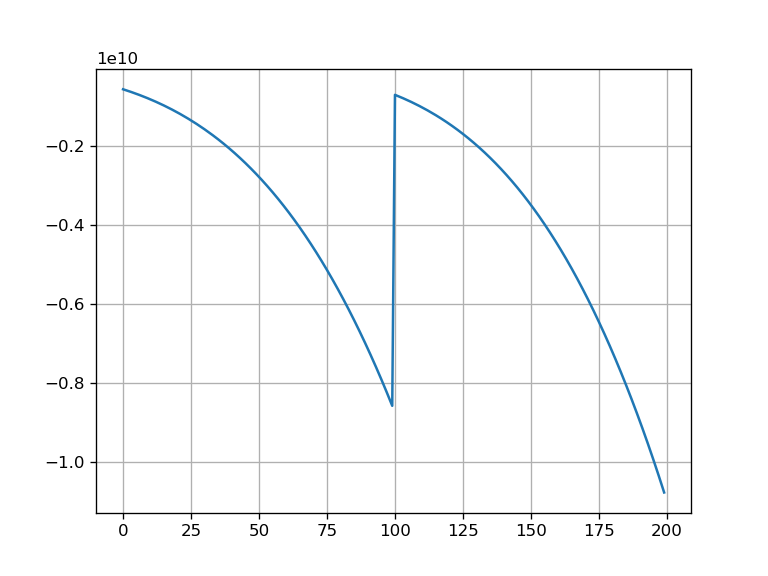

In [677]:
plt.figure()
plt.plot(J_hf.diagonal())
plt.grid()

<IPython.core.display.Javascript object>


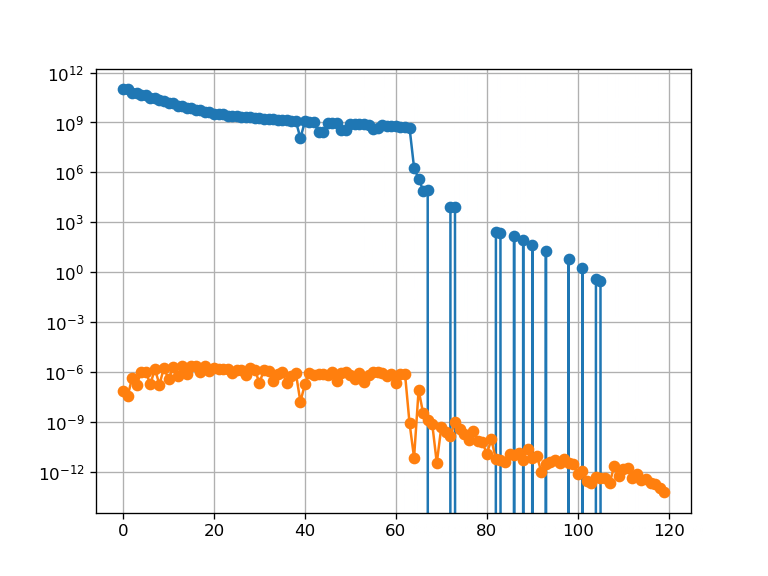

In [654]:
%matplotlib notebook
plt.figure()
plt.plot(-w_hf.real,'o-')
plt.plot(abs(velo_hf_tilde),'o-')

#plt.plot(np.abs(Jac_from_hf @ U_hf).sum(axis=0), 'o--')


plt.yscale('log')

plt.grid()

In [632]:
index_fast = w_hf.real<-1e-7

<IPython.core.display.Javascript object>


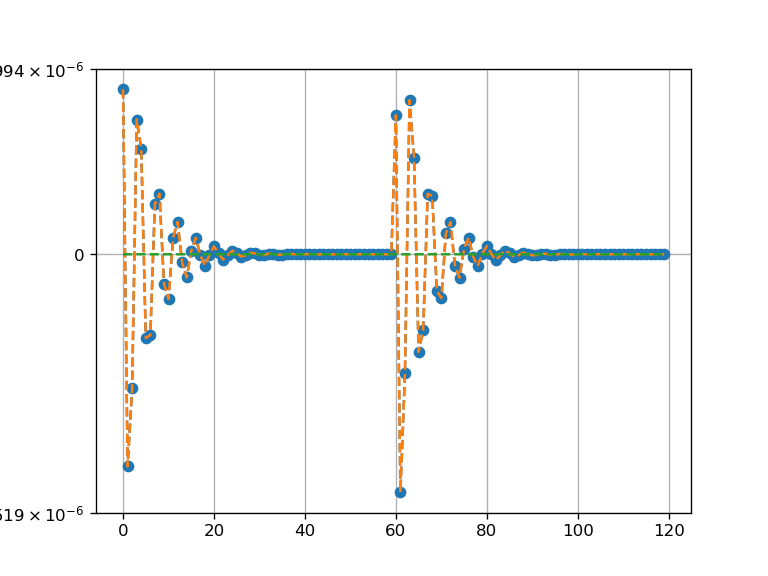

/home/maxkway/anaconda3/envs/mem-model/lib/python3.11/site-packages/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/maxkway/anaconda3/envs/mem-model/lib/python3.11/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [633]:
velo_hf_fast = U_hf[:,index_fast] @ velo_hf_tilde[index_fast]
velo_hf_slow = U_hf[:,~index_fast] @ velo_hf_tilde[~index_fast]
plt.figure()
plt.plot(velo_hf,'o--')
plt.plot(velo_hf_fast,'--')
plt.plot(velo_hf_slow,'--')

plt.yscale('symlog', linthresh=5e-3)
plt.grid()

In [634]:
JacP_from_Phf = Jac_PP[:n_min-1,n_min-1:]
JacP_from_Zhf = Jac_PZ[:n_min-1,n_min:]

JacZ_from_Phf = Jac_ZP[:n_min,n_min-1:]
JacZ_from_Zhf = Jac_ZZ[:n_min,n_min:]

In [635]:
Jac_from_hf = np.vstack([np.hstack([JacP_from_Phf, JacP_from_Zhf]),
                  np.hstack([JacZ_from_Zhf, JacZ_from_Zhf])])

## Dynamic

In [69]:
def get_PZ_fur_from_pz(pz):
    N_ = (len(pz)+1)//2
    P_fur = np.zeros(N_); Z_fur = pz[::2]
    P_fur[1:]=pz[1::2]
    return P_fur, Z_fur


def get_pz_from_PZ_fur(P_fur, Z_fur):
    N = len(Z_fur)
    pz = np.zeros(2*N-1)
    pz[1::2]=P_fur[1:]
    pz[::2]=Z_fur
    return pz

In [208]:
def get_PZ_fur_from_pz_sym(pz_sym):
    N_ = len(pz_sym)
    P_fur = np.zeros(N_); Z_fur = np.zeros(N_)
    P_fur[1::2]=pz_sym[::2]
    Z_fur[1::2]=pz_sym[1::2]
    return P_fur, Z_fur


def get_pz_sym_from_PZ_fur(P_fur, Z_fur):
    N_ = len(Z_fur)
    pz_sym = np.zeros(N_)
    pz_sym[::2]=P_fur[:N_][1::2]
    pz_sym[1::2]=Z_fur[:N_][1::2]
    return pz_sym

In [33]:
def get_gauge_velo_fur_1d(pz):
    P_fur, Z_fur = get_PZ_fur_from_pz(pz)
    veloP, veloZ = get_gauge_velo_projects_full(P_fur, Z_fur)
    N = len(Z_fur)
    velo_pz = np.zeros(2*N-1)
    velo_pz[1::2]=veloP[:N-1]
    velo_pz[::2]=veloZ[:N]
    return velo_pz

In [34]:
def get_velo_with_nat_gauge_fur_1d(pz):
    P_fur, Z_fur = get_PZ_fur_from_pz(pz)
    veloP, veloZ = get_velo_with_nat_gauge_projects_full(P_fur, Z_fur,T_g)
    N = len(Z_fur)
    velo_pz = np.zeros(2*N-1)
    velo_pz[1::2]=veloP[:N-1]
    velo_pz[::2]=veloZ[:N]
    return velo_pz

In [67]:
def get_normal_velo_fur_1d(pz):
    P_fur, Z_fur = get_PZ_fur_from_pz(pz)
    veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
    N = len(Z_fur)
    velo_pz = np.zeros(2*N-1)
    velo_pz[1::2]=veloP[:N-1]
    velo_pz[::2]=veloZ[:N]
    return velo_pz

In [226]:
def get_normal_velo_sym_fur_1d(pz_sym):
    N_ = len(pz_sym)
    P_fur, Z_fur = get_PZ_fur_from_pz_sym(pz_sym)
    veloP, veloZ = get_normal_velo_projects_full(P_fur, Z_fur)
    return get_pz_sym_from_PZ_fur(np.concatenate([[0],veloP])[:N_], veloZ[:N_])

### Prepare state

In [834]:
p1=1
p2=0
z1=0.26
z2=0
z3=0

In [830]:
p1=0.2
p2=0
z1=1
z2=0
z3=0

In [94]:
p1=1
z1=0.35
z2=-0.5
z3 = -0.2

In [23]:
p1=1
p2=0
z1=0.2
z2=0
z3=0

In [854]:
### Asymetric start ###

p1=1
p2=-0.1
z1=0.13
z2=-0.3
z3=-0.04

In [1012]:
N=100

In [1013]:
P_fur0 = np.zeros(N);
P_fur0[1]=p1
P_fur0[2]=p2
P_fur0 /= 2

Z_fur0 = np.zeros(N);
Z_fur0[1]=z1
Z_fur0[2]=z2
Z_fur0[3]=z3
Z_fur0 /= 2

In [1014]:
P_fur0,Z_fur0 = make_constant_v_repar(P_fur0,Z_fur0, 10)

In [98]:
P_fur0 = P_fur_j
Z_fur0 = Z_fur_j

NameError: name 'P_fur_j' is not defined

In [858]:
Vol0, Sqr0 = get_VolSqr(P_fur0, Z_fur0)
V_cal0

NameError: name 'weights_simp' is not defined

In [1107]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


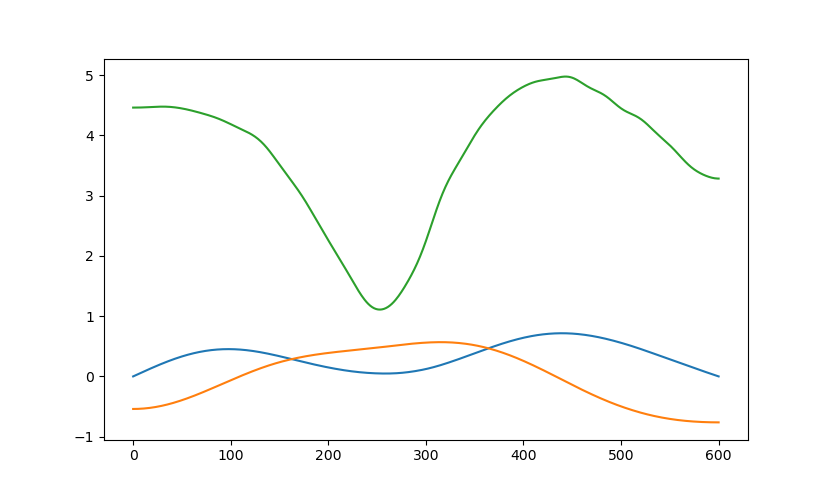

<IPython.core.display.Javascript object>


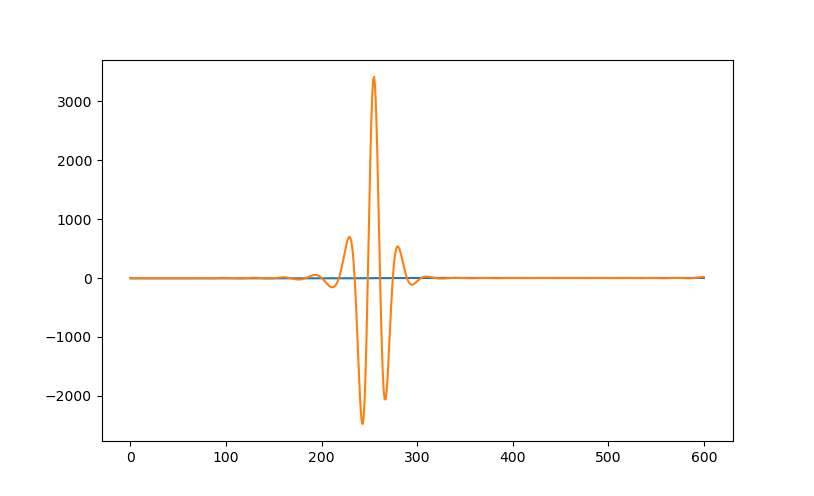

In [1108]:
plt.figure()
plt.plot(P)
plt.plot(Z)
plt.plot(V)
plt.figure()
plt.plot(H)
plt.plot(force)

(-0.05098850321387349,
 1.0707585674913433,
 -0.42564721870507183,
 0.36076838432945424)

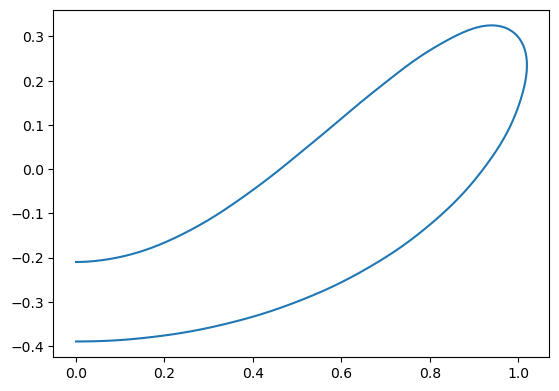

In [861]:
plt.figure()
plt.plot(P,Z)
plt.axis('scaled')

<IPython.core.display.Javascript object>


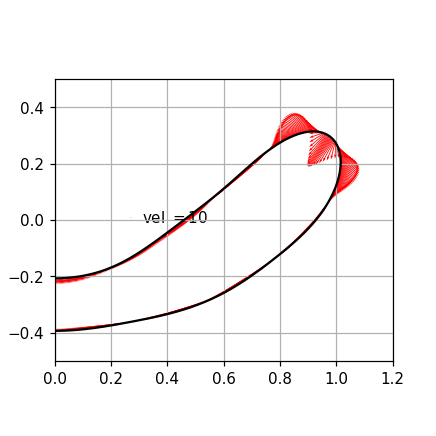

(-0.5, 0.5)

In [921]:
%matplotlib notebook
t_ = get_gauge_velo(P_fur0, Z_fur0, 1e-2)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P, Z, t_[0],t_[1], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 5, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
plt.xlim(0,1.2)
plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')

(-0.5, 0.5)

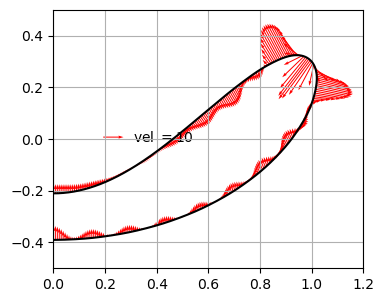

In [80]:
t_ = get_velo(P_fur0, Z_fur0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], t_[0],t_[1], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 10, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
plt.xlim(0,1.2)
plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')

______________

### Intagrate

#### Gauge flow

In [1517]:
pz_0_cut = np.array([ 2.18949940e-01, -8.62702223e-02,  1.46213667e-01,  5.55280968e-02,
       -7.60490552e-03,  7.50753097e-03,  1.74100989e-03, -3.86386489e-04,
       -1.66067109e-03,  2.10230481e-05,  2.00965966e-04,  3.05008665e-04,
       -2.65010363e-04, -2.88394491e-05,  7.03038683e-05,  1.22209207e-05,
       -5.94919657e-05, -7.70641965e-05,  2.86549197e-05, -1.81043681e-05,
       -7.21746206e-06,  1.94708569e-05,  8.23288321e-06, -2.02298803e-05,
       -2.67161680e-06,  2.94740781e-05,  5.96849142e-07, -4.70277607e-05,
       -7.01100034e-06,  2.96054324e-05,  2.74185795e-05, -2.56550042e-05,
       -6.35260087e-06,  1.31657564e-05, -2.68994282e-07, -3.55853514e-06,
       -1.20360194e-05,  1.30870034e-05, -5.11538970e-07, -1.22352746e-03,
        9.23680568e-02, -3.02546658e-01, -3.21978088e-03, -2.33897491e-02,
       -3.52037057e-02, -2.73804569e-04,  2.08420387e-03,  1.07852966e-03,
       -2.60034873e-04, -1.93139908e-04, -2.42711159e-05,  1.86853265e-04,
       -1.80953963e-04, -1.43580261e-05, -3.68303086e-05,  1.24758437e-04,
        8.95662664e-05, -4.08412834e-05, -7.21651866e-06, -1.13499749e-05,
        1.20362692e-05,  8.86540810e-06, -3.13385928e-05, -2.23022557e-05,
        3.60434014e-05,  3.36342343e-05,  5.26946221e-06, -9.76024030e-06,
       -2.96939138e-05,  1.53165014e-05,  5.72294302e-06, -2.11721999e-05,
        9.71684292e-06, -4.36789889e-06,  1.15879395e-05, -1.75743011e-06,
       -8.66718704e-06,  9.03027855e-06, -4.18953317e-06], dtype=np.float128)

N_cut = (len(pz_0_cut)+1)//2

In [1616]:
N = 300

In [1617]:
N_int=1400

In [1618]:
Pfur_0 = np.zeros(N)
Zfur_0 = np.zeros(N)
Pfur_0[1:N_cut] = pz_0_cut[:N_cut-1]
Zfur_0[:N_cut] = pz_0_cut[N_cut-1:]

In [1619]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


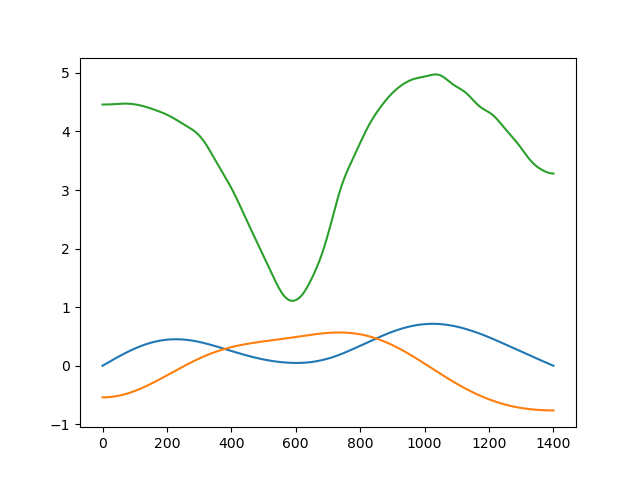

<IPython.core.display.Javascript object>


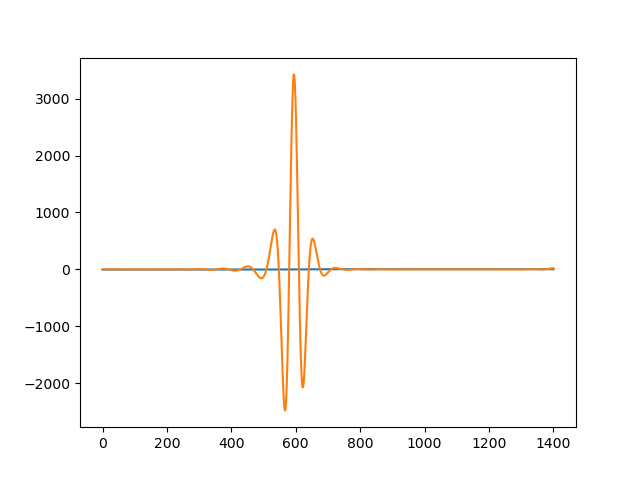

In [1620]:
plt.figure()
plt.plot(P)
plt.plot(Z)
plt.plot(V)
plt.figure()
plt.plot(H)
plt.plot(force)

<IPython.core.display.Javascript object>


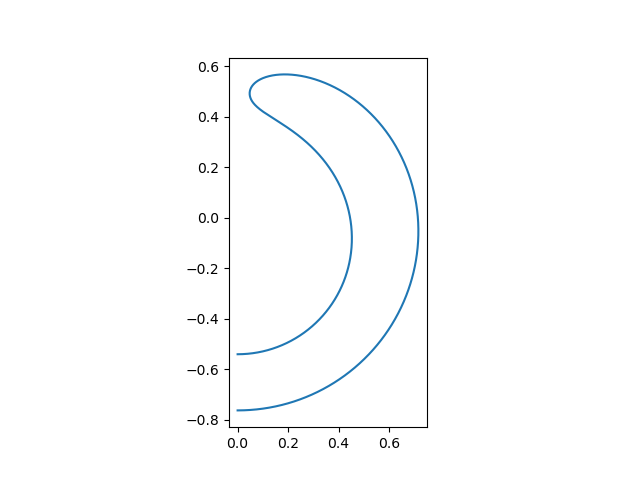

(-0.03580292530008578,
 0.7518614313018014,
 -0.8291428682036126,
 0.6348196784881489)

In [1524]:
plt.figure()
plt.plot(P,Z)
plt.axis('scaled')

<IPython.core.display.Javascript object>


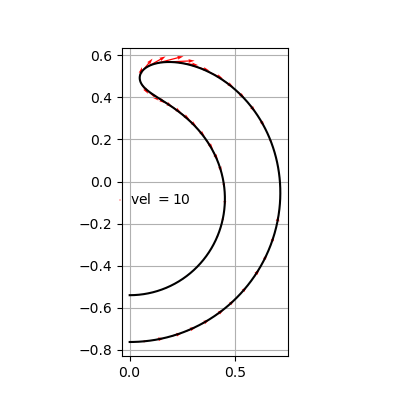

<IPython.core.display.Javascript object>


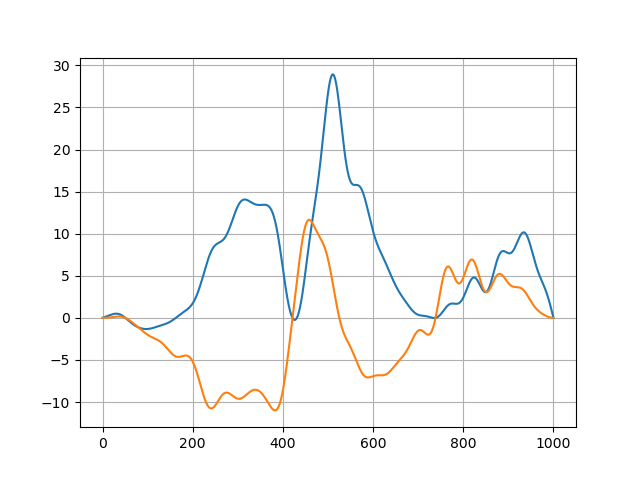

In [1586]:
%matplotlib notebook
t_ = get_gauge_velo(Pfur_0, Zfur_0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


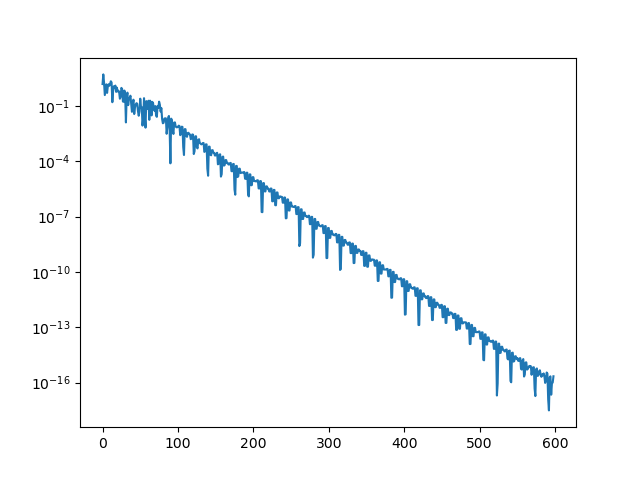

In [1621]:
plt.figure()
plt.plot(abs(get_gauge_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.yscale('log')

In [1310]:
%timeit get_gauge_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

361 µs ± 43.8 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [1311]:
%load_ext line_profiler

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [1312]:
%lprun -f get_velo_with_nat_gauge_projects_full get_gauge_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

__________________________________________________

In [1625]:
steps = np.logspace(-8,-5,2*N-1)[::-1]
j_gauge_fun = nd.Jacobian(get_gauge_velo_fur_1d, step=steps)

In [1626]:
jac_0 = j_gauge_fun(get_pz_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-8.63e+05 7.709805333004567


<IPython.core.display.Javascript object>


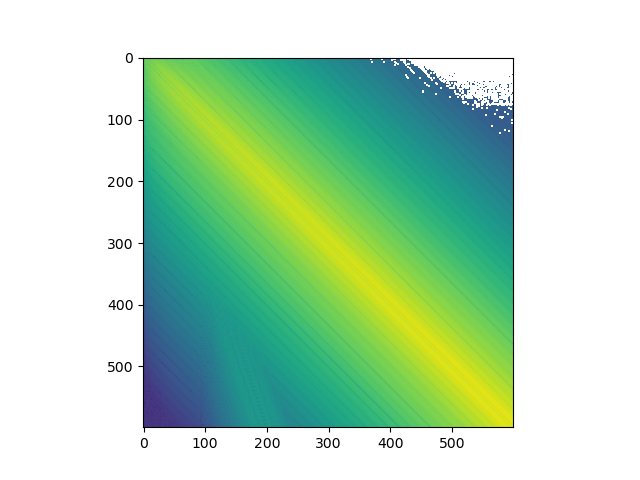

In [1627]:
plt.figure()
plt.imshow(np.log10(abs(jac_0)))

In [1678]:
t_max=0.2

In [1679]:
atol = 1e-12
rtol = atol/10

In [1680]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 200 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_gauge_velo_fur_1d(pz)
jac = j_gauge_fun

In [1681]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol,rtol=rtol);

0.0
[-1.22352746e-03  2.18949940e-01  9.23680568e-02 -8.62702223e-02
 -3.02546658e-01  1.46213667e-01 -3.21978088e-03  5.55280968e-02
 -2.33897491e-02 -7.60490552e-03 -3.52037057e-02  7.50753097e-03
 -2.73804569e-04  1.74100989e-03  2.08420387e-03 -3.86386489e-04
  1.07852966e-03 -1.66067109e-03 -2.60034873e-04  2.10230481e-05
 -1.93139908e-04  2.00965966e-04 -2.42711159e-05  3.05008665e-04
  1.86853265e-04 -2.65010363e-04 -1.80953963e-04 -2.88394491e-05
 -1.43580261e-05  7.03038683e-05 -3.68303086e-05  1.22209207e-05
  1.24758437e-04 -5.94919657e-05  8.95662664e-05 -7.70641965e-05
 -4.08412834e-05  2.86549197e-05 -7.21651866e-06 -1.81043681e-05
 -1.13499749e-05 -7.21746206e-06  1.20362692e-05  1.94708569e-05
  8.86540810e-06  8.23288321e-06 -3.13385928e-05 -2.02298803e-05
 -2.23022557e-05 -2.67161680e-06  3.60434014e-05  2.94740781e-05
  3.36342343e-05  5.96849142e-07  5.26946221e-06 -4.70277607e-05
 -9.76024030e-06 -7.01100034e-06 -2.96939138e-05  2.96054324e-05
  1.53165014e-05  2.7

0.0002518906292204153
[-1.62874819e-03  2.20242765e-01  9.18997196e-02 -8.61766069e-02
 -3.02339338e-01  1.45843161e-01 -3.09950290e-03  5.52491517e-02
 -2.30180265e-02 -7.29990774e-03 -3.47960905e-02  6.95085341e-03
 -7.33179323e-04  1.69976168e-03  1.91872652e-03 -8.26208046e-05
  1.30102438e-03 -1.35072791e-03 -1.15762978e-04 -2.20609129e-04
 -3.39047402e-04  2.82187146e-05 -1.65288331e-04  3.64439746e-04
  2.56464626e-04 -4.00759904e-05  9.14900949e-06 -6.42236134e-05
 -4.86459245e-05 -8.21348913e-05 -1.31062490e-04  5.30406290e-06
  5.82337994e-05  5.25584180e-05  1.23499166e-04 -1.56036149e-05
  1.42950242e-05 -3.95644475e-05 -4.16876249e-05 -4.15934827e-05
 -4.17998190e-05  2.50916734e-05  2.21310530e-05  4.19744849e-05
  3.61926708e-05 -6.05362332e-06 -1.22148155e-05 -3.31592428e-05
 -3.18166726e-05 -3.43002808e-06  1.54626575e-06  2.35428019e-05
  2.42804676e-05  7.47380593e-06  1.08135659e-05 -1.76714676e-05
 -1.14335151e-05 -1.05556210e-05 -1.38113275e-05  9.11267125e-06
  5

0.0008881192981856907
[-2.72781145e-03  2.23309822e-01  9.07590179e-02 -8.59899416e-02
 -3.01791649e-01  1.44985751e-01 -2.87474782e-03  5.46531364e-02
 -2.21654709e-02 -6.62606602e-03 -3.37004395e-02  5.55707203e-03
 -1.74196453e-03  1.59247896e-03  1.51220780e-03  6.91710333e-04
  1.72345531e-03 -6.86206513e-04  2.10109888e-04 -7.46196721e-04
 -6.34012378e-04 -3.90035445e-04 -4.59477339e-04  4.89775616e-04
  3.65595726e-04  3.98496593e-04  3.51654416e-04 -1.00482526e-04
 -8.10958968e-05 -3.52125027e-04 -3.19059526e-04 -5.38356664e-05
 -4.08002677e-05  2.25287526e-04  2.10531584e-04  1.10847613e-04
  1.06609993e-04 -1.18442536e-04 -1.01720218e-04 -1.27712349e-04
 -1.14064087e-04  3.91044357e-05  3.21480008e-05  1.05297695e-04
  9.24952094e-05  1.04432560e-05  8.98635766e-06 -7.09335539e-05
 -6.33291949e-05 -3.31322167e-05 -3.01366462e-05  3.89047016e-05
  3.47502099e-05  3.81708194e-05  3.44086799e-05 -1.40626471e-05
 -1.26739316e-05 -3.28412843e-05 -3.03513536e-05 -1.79213027e-06
 -1

0.0020927780515660613
[-5.01124083e-03  2.28412465e-01  8.87494108e-02 -8.57931593e-02
 -3.00745092e-01  1.43605236e-01 -2.68633980e-03  5.38380956e-02
 -2.07636541e-02 -5.64274412e-03 -3.14905822e-02  3.04654949e-03
 -3.24189821e-03  1.37302794e-03  8.27682327e-04  2.04934085e-03
  2.22342533e-03  2.60780952e-04  6.74541671e-04 -1.45892551e-03
 -1.00820071e-03 -1.04560635e-03 -8.48116383e-04  6.41130119e-04
  4.63554778e-04  9.40345648e-04  7.20818879e-04 -6.61952049e-05
 -5.75578885e-05 -6.72527469e-04 -5.37839446e-04 -2.02218892e-04
 -1.61084817e-04  3.95144182e-04  3.17665936e-04  2.92175939e-04
  2.34961431e-04 -1.69674313e-04 -1.40754227e-04 -2.73751461e-04
 -2.24608664e-04  1.81135094e-05  1.54574672e-05  2.06239332e-04
  1.70989420e-04  6.61179673e-05  5.36058153e-05 -1.25988295e-04
 -1.06475299e-04 -9.74151003e-05 -8.19468815e-05  5.61244344e-05
  4.80915070e-05  9.45489301e-05  8.00108364e-05 -5.29250753e-06
 -5.28507375e-06 -7.32224637e-05 -6.32508346e-05 -2.44366220e-05
 -2

0.0038673735058777346
[-8.62076271e-03  2.34564335e-01  8.61160041e-02 -8.57450318e-02
 -2.99333363e-01  1.41934340e-01 -2.79131497e-03  5.30763908e-02
 -1.89712847e-02 -4.65328423e-03 -2.82218179e-02 -2.30069902e-04
 -4.82788489e-03  1.01283220e-03  7.42310883e-05  3.64429701e-03
  2.66305821e-03  1.23602141e-03  1.08092047e-03 -2.07296171e-03
 -1.33073765e-03 -1.73856164e-03 -1.20836035e-03  7.26479028e-04
  5.15561382e-04  1.43431654e-03  1.01593305e-03  6.05629994e-05
  2.41412533e-05 -9.59393151e-04 -7.16800041e-04 -4.12379777e-04
 -3.01129002e-04  5.18414200e-04  3.95940307e-04  5.00303377e-04
  3.77429208e-04 -1.76879535e-04 -1.44048002e-04 -4.34585417e-04
 -3.38695912e-04 -4.25261113e-05 -2.95831929e-05  3.05799422e-04
  2.43573168e-04  1.54366259e-04  1.19868680e-04 -1.67647086e-04
 -1.37295093e-04 -1.84194964e-04 -1.48335166e-04  5.32717884e-05
  4.54252546e-05  1.62371579e-04  1.32747818e-04  2.50302060e-05
  1.89437331e-05 -1.14991828e-04 -9.60500978e-05 -6.60173661e-05
 -5

0.006199669183509106
[-1.34581685e-02  2.40812091e-01  8.32004294e-02 -8.59003174e-02
 -2.97820945e-01  1.40082056e-01 -3.34059706e-03  5.24637877e-02
 -1.68851472e-02 -3.86281016e-03 -2.42758829e-02 -3.80337365e-03
 -6.19440508e-03  5.05837769e-04 -5.24803699e-04  5.10991396e-03
  3.03581341e-03  2.11836472e-03  1.36521615e-03 -2.48981247e-03
 -1.55431911e-03 -2.36701286e-03 -1.51445009e-03  7.23630353e-04
  5.11610175e-04  1.85743817e-03  1.24628744e-03  2.43212466e-04
  1.35984784e-04 -1.18877934e-03 -8.48219613e-04 -6.45379986e-04
 -4.46401141e-04  5.90662612e-04  4.37636239e-04  7.08509225e-04
  5.12682954e-04 -1.43366627e-04 -1.19233765e-04 -5.82058373e-04
 -4.37704391e-04 -1.32238428e-04 -9.29176885e-05  3.83840980e-04
  2.97378559e-04  2.59364412e-04  1.95315024e-04 -1.84912648e-04
 -1.48882086e-04 -2.76240078e-04 -2.15887878e-04  2.75137316e-05
  2.57264280e-05  2.26051389e-04  1.80404794e-04  7.35961976e-05
  5.62360733e-05 -1.46061398e-04 -1.19588455e-04 -1.19256395e-04
 -9.

0.00931339019101593
[-1.96755070e-02  2.46907202e-01  8.01663347e-02 -8.62281059e-02
 -2.96356658e-01  1.37909303e-01 -4.41876840e-03  5.19668529e-02
 -1.44075575e-02 -3.35378679e-03 -1.98694387e-02 -7.53806278e-03
 -7.23370388e-03 -1.73361374e-04 -8.97990743e-04  6.33753211e-03
  3.37140450e-03  2.93396745e-03  1.59859059e-03 -2.75811505e-03
 -1.68951819e-03 -2.95327091e-03 -1.78772609e-03  6.46569588e-04
  4.61946743e-04  2.23356632e-03  1.43613253e-03  4.66413482e-04
  2.65653871e-04 -1.36831134e-03 -9.43001138e-04 -8.92216096e-04
 -5.93118622e-04  6.17492924e-04  4.48704474e-04  9.11041312e-04
  6.38402624e-04 -7.42518522e-05 -7.16944946e-05 -7.11157045e-04
 -5.20208996e-04 -2.44995184e-04 -1.69725930e-04  4.37122594e-04
  3.31771719e-04  3.74273480e-04  2.75115717e-04 -1.76857699e-04
 -1.41749597e-04 -3.66618561e-04 -2.79897976e-04 -1.95431638e-05
 -9.02106369e-06  2.79604758e-04  2.18931786e-04  1.36603599e-04
  1.03125646e-04 -1.62384251e-04 -1.31196828e-04 -1.79116832e-04
 -1.4

0.012897003394537946
[-2.62094409e-02  2.51836686e-01  7.76852692e-02 -8.65814251e-02
 -2.95237948e-01  1.35659270e-01 -5.80370118e-03  5.16505554e-02
 -1.18911222e-02 -3.22636733e-03 -1.59436384e-02 -1.07545054e-02
 -7.79143507e-03 -9.01118053e-04 -1.04042801e-03  7.17150278e-03
  3.63063012e-03  3.60117725e-03  1.80361866e-03 -2.90303256e-03
 -1.74639009e-03 -3.43386206e-03 -1.99930454e-03  5.29376701e-04
  3.93813296e-04  2.52104567e-03  1.57260020e-03  6.83526371e-04
  3.86406753e-04 -1.48383587e-03 -9.98762917e-04 -1.10964468e-03
 -7.17656504e-04  6.06479703e-04  4.36840884e-04  1.07582727e-03
  7.36930280e-04  1.00842319e-05 -1.59148495e-05 -8.03984952e-04
 -5.76844861e-04 -3.55759384e-04 -2.43107127e-04  4.61456740e-04
  3.45716025e-04  4.75973369e-04  3.43858041e-04 -1.49980500e-04
 -1.21630281e-04 -4.38299380e-04 -3.29179779e-04 -7.49143364e-05
 -4.89628212e-05  3.13903966e-04  2.42611549e-04  1.98794529e-04
  1.48340566e-04 -1.62695913e-04 -1.30620242e-04 -2.31763679e-04
 -1.

0.017614036108531288
[-3.36717669e-02  2.56219677e-01  7.56694415e-02 -8.68945967e-02
 -2.94321581e-01  1.33019986e-01 -7.57775074e-03  5.15238541e-02
 -9.03707725e-03 -3.45038082e-03 -1.22322312e-02 -1.37637679e-02
 -8.00990115e-03 -1.71789712e-03 -1.06551506e-03  7.80477122e-03
  3.84899872e-03  4.23094032e-03  2.01523657e-03 -2.98530427e-03
 -1.76280367e-03 -3.87938661e-03 -2.18379154e-03  3.78568414e-04
  3.12934601e-04  2.76767043e-03  1.68404889e-03  9.09512414e-04
  5.07875955e-04 -1.56350308e-03 -1.03294096e-03 -1.31992490e-03
 -8.34517520e-04  5.69151432e-04  4.09674072e-04  1.22390648e-03
  8.22664713e-04  1.09543496e-04  4.79969024e-05 -8.76374127e-04
 -6.18975393e-04 -4.70808896e-04 -3.17585176e-04  4.66387276e-04
  3.46369027e-04  5.73080387e-04  4.08009161e-04 -1.08189048e-04
 -9.16119863e-05 -4.99467681e-04 -3.70132736e-04 -1.38835647e-04
 -9.42272274e-05  3.35117526e-04  2.56500588e-04  2.62759205e-04
  1.94017304e-04 -1.50682268e-04 -1.21023084e-04 -2.80545465e-04
 -2.

0.023254260803496445
[-4.10162254e-02  2.59602179e-01  7.45344150e-02 -8.70487855e-02
 -2.93656676e-01  1.30301306e-01 -9.49253325e-03  5.16835150e-02
 -6.20912050e-03 -3.94700952e-03 -9.29782616e-03 -1.61671338e-02
 -7.96575564e-03 -2.47384583e-03 -1.04826866e-03  8.24511173e-03
  4.00339737e-03  4.76102617e-03  2.19774517e-03 -3.01716156e-03
 -1.75656292e-03 -4.24185821e-03 -2.32635441e-03  2.27141391e-04
  2.35934608e-04  2.95425671e-03  1.76475026e-03  1.10991601e-03
  6.12621373e-04 -1.60878800e-03 -1.04885627e-03 -1.49607194e-03
 -9.29962863e-04  5.19722452e-04  3.76695998e-04  1.33980095e-03
  8.87838871e-04  2.04924858e-04  1.07920011e-04 -9.24448420e-04
 -6.45479519e-04 -5.72019266e-04 -3.81832912e-04  4.57222682e-04
  3.38059334e-04  6.52590887e-04  4.59475832e-04 -6.22337206e-05
 -5.94092939e-05 -5.43982386e-04 -3.99151714e-04 -1.99063667e-04
 -1.36238041e-04  3.43665717e-04  2.61423268e-04  3.18036192e-04
  2.32918292e-04 -1.31486497e-04 -1.06534026e-04 -3.18659153e-04
 -2.

0.03004043333095393
[-4.79576529e-02  2.62169948e-01  7.42790821e-02 -8.70244576e-02
 -2.93135101e-01  1.27586521e-01 -1.15035556e-02  5.21617852e-02
 -3.51051581e-03 -4.56434717e-03 -7.11803553e-03 -1.80112781e-02
 -7.80776147e-03 -3.12799373e-03 -1.04460748e-03  8.56613487e-03
  4.10493289e-03  5.20492853e-03  2.34713049e-03 -3.01569857e-03
 -1.73942964e-03 -4.53299595e-03 -2.43710266e-03  8.38920560e-05
  1.64860602e-04  3.09378386e-03  1.82271626e-03  1.28365492e-03
  7.01884714e-04 -1.63017788e-03 -1.05277887e-03 -1.64135079e-03
 -1.00739361e-03  4.65335667e-04  3.41826973e-04  1.42905511e-03
  9.36854470e-04  2.92539500e-04  1.62206299e-04 -9.54358164e-04
 -6.60809695e-04 -6.58770287e-04 -4.36195976e-04  4.39485459e-04
  3.24550316e-04  7.16252158e-04  5.00060019e-04 -1.61980317e-05
 -2.76367522e-05 -5.75098582e-04 -4.18894961e-04 -2.53338766e-04
 -1.73731975e-04  3.43431511e-04  2.60292907e-04  3.64276720e-04
  2.65151004e-04 -1.08676720e-04 -8.97413837e-05 -3.47334140e-04
 -2.6

0.03869878474801767
[-5.45179320e-02  2.64181477e-01  7.48621574e-02 -8.68448153e-02
 -2.92646776e-01  1.24832033e-01 -1.37074986e-02  5.30006966e-02
 -9.52759961e-04 -5.15449437e-03 -5.53401666e-03 -1.94268814e-02
 -7.63347842e-03 -3.70835544e-03 -1.08154802e-03  8.80416437e-03
  4.16453592e-03  5.59762747e-03  2.47765079e-03 -2.97823468e-03
 -1.70877522e-03 -4.77552885e-03 -2.52847848e-03 -6.44045723e-05
  9.08953223e-05  3.19666282e-03  1.86348768e-03  1.44597974e-03
  7.85529791e-04 -1.62827550e-03 -1.04463187e-03 -1.76786156e-03
 -1.07481444e-03  4.00621386e-04  3.01167130e-04  1.49868765e-03
  9.74509558e-04  3.80013259e-04  2.16361431e-04 -9.68109540e-04
 -6.66339642e-04 -7.38178067e-04 -4.85931563e-04  4.11426799e-04
  3.04513188e-04  7.69029077e-04  5.33531915e-04  3.37037139e-05
  6.60103598e-06 -5.95101605e-04 -4.31149917e-04 -3.05829093e-04
 -2.09961797e-04  3.34367324e-04  2.53069533e-04  4.04869054e-04
  2.93432175e-04 -8.06413723e-05 -6.93368813e-05 -3.68618252e-04
 -2.7

0.04882546957423892
[-5.98698784e-02  2.65624863e-01  7.60790177e-02 -8.66041011e-02
 -2.92177661e-01  1.22350798e-01 -1.59077286e-02  5.40799928e-02
  1.10291720e-03 -5.49165497e-03 -4.53451474e-03 -2.03750751e-02
 -7.51246889e-03 -4.20897965e-03 -1.16575563e-03  8.93406106e-03
  4.18171397e-03  5.93094309e-03  2.59359088e-03 -2.89157898e-03
 -1.65813028e-03 -4.96043582e-03 -2.60004983e-03 -2.23771963e-04
  9.32519879e-06  3.25383654e-03  1.88396830e-03  1.59771835e-03
  8.65911536e-04 -1.59580289e-03 -1.02075198e-03 -1.87289733e-03
 -1.13218472e-03  3.21025912e-04  2.51600431e-04  1.54437454e-03
  9.99155959e-04  4.68951296e-04  2.72124616e-04 -9.61353208e-04
 -6.59710873e-04 -8.09420280e-04 -5.31287686e-04  3.69827273e-04
  2.75795374e-04  8.08590406e-04  5.58933850e-04  8.90282479e-05
  4.46603666e-05 -6.01197037e-04 -4.34341334e-04 -3.56424576e-04
 -2.45225988e-04  3.14151071e-04  2.38183293e-04  4.38477000e-04
  3.17152770e-04 -4.61177308e-05 -4.42580862e-05 -3.80642329e-04
 -2.8

0.06128188603692694
[-6.41940361e-02  2.66752979e-01  7.77702322e-02 -8.63873121e-02
 -2.91675817e-01  1.20042654e-01 -1.82039973e-02  5.53632991e-02
  2.68552010e-03 -5.47705189e-03 -3.86875620e-03 -2.10135308e-02
 -7.44437294e-03 -4.72328918e-03 -1.30255603e-03  8.95273118e-03
  4.16054055e-03  6.25317445e-03  2.71646584e-03 -2.73135669e-03
 -1.57486685e-03 -5.10982885e-03 -2.66195014e-03 -4.23880265e-04
 -9.55876673e-05  3.26659557e-03  1.88438781e-03  1.76253134e-03
  9.56563955e-04 -1.52160192e-03 -9.74301710e-04 -1.96958914e-03
 -1.18739642e-03  2.10719098e-04  1.83165417e-04  1.56865478e-03
  1.01240628e-03  5.73679662e-04  3.38890562e-04 -9.28786569e-04
 -6.37405646e-04 -8.81704932e-04 -5.78552798e-04  3.05477840e-04
  2.32086380e-04  8.37915860e-04  5.78434392e-04  1.59116363e-04
  9.31649916e-05 -5.91060505e-04 -4.26906389e-04 -4.11891686e-04
 -2.84473206e-04  2.77274219e-04  2.11677864e-04  4.68034495e-04
  3.38556308e-04  1.11698174e-06 -9.86577042e-06 -3.82676745e-04
 -2.8

0.07557006175223448
[-6.72671191e-02  2.67624378e-01  7.96338406e-02 -8.62726877e-02
 -2.91168930e-01  1.18052609e-01 -2.04175235e-02  5.66747278e-02
  3.69415768e-03 -5.08796534e-03 -3.42714674e-03 -2.13863295e-02
 -7.41586135e-03 -5.26061807e-03 -1.47777776e-03  8.85745766e-03
  4.10488583e-03  6.56030215e-03  2.84470864e-03 -2.49963119e-03
 -1.46029040e-03 -5.22005651e-03 -2.71232210e-03 -6.60834862e-04
 -2.21590499e-04  3.23278716e-03  1.86358056e-03  1.93553104e-03
  1.05474930e-03 -1.40585493e-03 -9.05355659e-04 -2.05322302e-03
 -1.23763029e-03  7.21003699e-05  9.72583772e-05  1.56813226e-03
  1.01213037e-03  6.90231475e-04  4.14208707e-04 -8.69089659e-04
 -5.98501563e-04 -9.50590724e-04 -6.24848696e-04  2.19322132e-04
  1.73930073e-04  8.53235342e-04  5.89479011e-04  2.41184821e-04
  1.50296552e-04 -5.62497090e-04 -4.07284896e-04 -4.68491623e-04
 -3.25128405e-04  2.23537449e-04  1.73352578e-04  4.89908595e-04
  3.55032692e-04  5.93705710e-05  3.26989146e-05 -3.72132455e-04
 -2.7

0.09224542923784032
[-6.93988229e-02  2.68356368e-01  8.15636339e-02 -8.62692631e-02
 -2.90650703e-01  1.16293941e-01 -2.25649292e-02  5.79692078e-02
  4.25198396e-03 -4.38861637e-03 -3.09596111e-03 -2.15777588e-02
 -7.40504320e-03 -5.83776548e-03 -1.68243048e-03  8.66428066e-03
  4.01964614e-03  6.86030689e-03  2.97865427e-03 -2.20290112e-03
 -1.31679878e-03 -5.29652335e-03 -2.75176697e-03 -9.31963274e-04
 -3.66946767e-04  3.15590207e-03  1.82230048e-03  2.11517402e-03
  1.15900464e-03 -1.25129576e-03 -8.14915229e-04 -2.12271264e-03
 -1.28158161e-03 -9.20989005e-05 -4.60365353e-06  1.54232665e-03
  9.97497183e-04  8.15651339e-04  4.96105382e-04 -7.82814039e-04
 -5.42984770e-04 -1.01323727e-03 -6.68075487e-04  1.13144200e-04
  1.02325469e-04  8.52447514e-04  5.90381086e-04  3.32434502e-04
  2.14182845e-04 -5.14731568e-04 -3.74706256e-04 -5.23043734e-04
 -3.64896700e-04  1.53739628e-04  1.23620564e-04  5.01360116e-04
  3.64486438e-04  1.26460132e-04  8.19278438e-05 -3.47443909e-04
 -2.6

0.11383059307554008
[-7.09479453e-02  2.69058372e-01  8.36552733e-02 -8.63685678e-02
 -2.90077488e-01  1.14581752e-01 -2.48100894e-02  5.93169574e-02
  4.48208245e-03 -3.37988139e-03 -2.80375240e-03 -2.16371824e-02
 -7.39846509e-03 -6.49423819e-03 -1.92446465e-03  8.36785492e-03
  3.90026199e-03  7.17111990e-03  3.12443809e-03 -1.82621606e-03
 -1.13640110e-03 -5.34203427e-03 -2.78041242e-03 -1.25020777e-03
 -5.38642250e-04  3.02967957e-03  1.75631919e-03  2.30761400e-03
  1.27268676e-03 -1.04882178e-03 -6.97128724e-04 -2.17725650e-03
 -1.31849673e-03 -2.89046102e-04 -1.27113168e-04  1.48589784e-03
  9.64841970e-04  9.52720162e-04  5.86479558e-04 -6.63470978e-04
 -4.66330957e-04 -1.06794771e-03 -7.07084077e-04 -1.77928466e-05
  1.38502287e-05  8.31001340e-04  5.77917407e-04  4.34289156e-04
  2.85959286e-04 -4.42696812e-04 -3.25454104e-04 -5.73675170e-04
 -4.02512838e-04  6.43565208e-05  5.97910269e-05  4.98459171e-04
  3.64052236e-04  2.03250587e-04  1.38580586e-04 -3.04412726e-04
 -2.3

0.13876609661815845
[-7.19334732e-02  2.69664024e-01  8.55812803e-02 -8.65245004e-02
 -2.89530788e-01  1.13104655e-01 -2.68345356e-02  6.05133023e-02
  4.46230549e-03 -2.28959039e-03 -2.56765922e-03 -2.15917040e-02
 -7.39000810e-03 -7.11760325e-03 -2.15922361e-03  8.03119277e-03
  3.76927325e-03  7.44087273e-03  3.25572541e-03 -1.44069166e-03
 -9.52293725e-04 -5.35060160e-03 -2.79277776e-03 -1.55651272e-03
 -7.04839015e-04  2.87816323e-03  1.67736190e-03  2.47644552e-03
  1.37398326e-03 -8.36468288e-04 -5.73632234e-04 -2.20544215e-03
 -1.34031902e-03 -4.80882998e-04 -2.46901425e-04  1.40828333e-03
  9.19174163e-04  1.07378184e-03  6.67103176e-04 -5.33301407e-04
 -3.82528327e-04 -1.10212211e-03 -7.32848031e-04 -1.47641885e-04
 -7.42017665e-05  7.91169211e-04  5.53024722e-04  5.25204411e-04
  3.50519232e-04 -3.59540227e-04 -2.68315146e-04 -6.08137263e-04
 -4.28921060e-04 -2.65822103e-05 -5.39806533e-06  4.79693618e-04
  3.52215385e-04  2.72852218e-04  1.90275331e-04 -2.50509361e-04
 -1.9

0.16637129925033192
[-7.25780535e-02  2.70166857e-01  8.72266825e-02 -8.66853116e-02
 -2.89046034e-01  1.11880291e-01 -2.85440896e-02  6.15039851e-02
  4.33125457e-03 -1.27798520e-03 -2.38113301e-03 -2.14944855e-02
 -7.37829140e-03 -7.65511294e-03 -2.36421036e-03  7.70594879e-03
  3.64409620e-03  7.65539658e-03  3.36296951e-03 -1.09084057e-03
 -7.85138764e-04 -5.33316380e-03 -2.79210671e-03 -1.82128914e-03
 -8.49203658e-04  2.72534610e-03  1.59743864e-03  2.60980676e-03
  1.45509533e-03 -6.40462167e-04 -4.59423661e-04 -2.21116593e-03
 -1.34841058e-03 -6.47348040e-04 -3.51263682e-04  1.32368574e-03
  8.68780981e-04  1.16894169e-03  7.31121987e-04 -4.10029474e-04
 -3.02891118e-04 -1.11669245e-03 -7.45436920e-04 -2.61292533e-04
 -1.51575134e-04  7.42003650e-04  5.21475396e-04  5.96681786e-04
  4.01703845e-04 -2.77985244e-04 -2.12001385e-04 -6.25779355e-04
 -4.43322875e-04 -1.07292089e-04 -6.34969308e-05  4.50938838e-04
  3.32940281e-04  3.27843744e-04  2.31430340e-04 -1.95136138e-04
 -1.5

In [1682]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [957]:
np.save(f'dyn_prolate_rad_gauge_to_t={t_max}_N={N}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

#### Quasi normal flow

In [106]:
N=150

In [189]:
Pfur_0_ =np.array([ 0.00000000e+00,  2.18755829e-01, -8.49209769e-02,  1.46442465e-01,
        5.66225270e-02, -7.09738067e-03,  8.10027296e-03,  2.00421585e-03,
       -1.72824552e-04, -1.54228409e-03, -5.80671945e-05,  2.38788742e-04,
        3.15227069e-04, -2.76469755e-04, -2.96061539e-05,  5.74126296e-05,
       -5.54588397e-06, -6.08557457e-05, -8.09309485e-05,  1.42744694e-05,
        4.70209412e-07,  1.91786283e-07,  5.23910319e-08,  7.80904645e-07,
       -1.10101092e-06, -6.22317228e-08,  5.20638359e-07, -3.37280120e-08,
        4.95552389e-08,  3.80552707e-07,  2.53243997e-08,  5.06961765e-08,
        5.07005974e-08, -7.55614489e-08, -6.63415389e-08, -1.76525690e-08,
       -9.94203677e-09,  7.10063596e-09,  3.68075072e-09, -2.52259148e-08,
        2.72732519e-09,  1.87019729e-09,  3.42379807e-10, -7.65298241e-09,
        1.15378362e-08, -5.45349735e-09, -1.26894250e-08, -7.07060530e-11,
        7.13910411e-09,  2.08083650e-09, -3.88426773e-09, -2.31057797e-09,
        3.35194233e-09,  3.28254837e-09, -1.56581717e-09, -3.89934366e-09,
        1.43156781e-09,  2.24048913e-09, -1.35979068e-10, -2.71854442e-09,
        3.30693063e-10, -6.56917103e-10, -8.14994475e-10,  1.97572696e-10,
        9.55440071e-10, -9.41590521e-10, -1.43457556e-09, -1.67943808e-10,
        8.59940949e-10,  4.03232584e-10, -3.49065765e-10, -3.87908720e-10,
        2.53310336e-10,  4.54413384e-10,  1.18425725e-10, -4.63269725e-10,
       -7.81863225e-11,  1.50165154e-10,  1.34986818e-10, -1.39177019e-10,
       -6.73932676e-12,  8.36096362e-11, -1.10632056e-10, -1.39340273e-10,
       -5.45315911e-11,  1.69583599e-10,  1.42251779e-10, -1.22296012e-10,
       -9.24261662e-11,  1.31706214e-10,  2.15048972e-10, -2.63826306e-11,
       -1.80173545e-10, -3.77439302e-11,  2.01650851e-10,  6.31062326e-11,
       -1.10852189e-10, -1.57333932e-10,  4.36803495e-11,  1.23263702e-10],
      dtype=np.float128)
Zfur_0_ = np.array([-1.22352746e-03,  9.04167377e-02, -3.02291987e-01, -4.92012737e-03,
       -2.37529012e-02, -3.59075680e-02, -6.90606195e-04,  1.72060616e-03,
        9.20323283e-04, -2.45138597e-04, -2.78729890e-04, -3.17723292e-05,
        1.72582507e-04, -2.05991378e-04,  8.99787253e-06,  1.22169656e-05,
        8.59560417e-05,  5.86129354e-05, -3.30359969e-06,  2.59542040e-05,
       -7.86453143e-07,  1.99775133e-07,  7.01734161e-07, -4.50759641e-08,
       -1.69306057e-06,  3.11942208e-07,  1.64118208e-06, -6.37928611e-07,
       -1.17403583e-06, -1.83959155e-07,  1.09347762e-07,  7.23578812e-08,
       -4.77401552e-08, -1.21199100e-07,  5.23903306e-08,  1.11423377e-07,
        3.31767360e-09, -5.61289702e-08, -7.77017646e-09,  1.91479146e-08,
       -2.80043815e-09, -1.77210842e-08, -9.19594694e-09, -7.89804778e-09,
        2.10475459e-08, -1.01044536e-09, -1.00937528e-08, -3.14012345e-09,
        5.72604423e-09, -7.10632269e-10, -4.22693367e-09, -5.70273175e-09,
        3.19674850e-10, -4.38078982e-10, -5.41193329e-10, -3.22095537e-09,
       -3.21138427e-09, -1.90364387e-09,  8.71614972e-10, -1.44929819e-09,
       -4.31915857e-10, -2.28727213e-09, -9.87711557e-10, -3.87411756e-11,
        1.74510105e-09, -8.91194412e-10, -9.66832912e-10, -5.48442389e-10,
        7.35180555e-10, -5.06157116e-10, -7.87015940e-10, -1.04397321e-09,
        1.89794630e-10, -2.40039885e-10, -4.06382977e-10, -8.61191363e-10,
       -3.17231989e-10, -3.05705586e-10,  1.70655301e-11, -7.62579554e-10,
       -5.89878594e-11, -5.95321537e-11,  1.24385172e-10, -2.26153448e-10,
       -2.32947798e-10, -3.17782676e-10,  4.41702026e-11, -1.68277161e-10,
       -8.81154135e-11, -2.81924917e-10, -7.92614762e-11, -1.57490101e-10,
       -8.75776393e-12, -1.61395245e-10, -9.28473157e-11, -1.81511778e-10,
       -1.35609221e-10, -1.59429531e-10,  6.26917632e-11, -5.34915366e-11],
      dtype=np.float128)

In [190]:
Pfur_0 = np.zeros(N)
Pfur_0[:len(Pfur_0_)]=Pfur_0_
Zfur_0 = np.zeros(N)
Zfur_0[:len(Zfur_0_)]=Zfur_0_

In [191]:
N = len(Pfur_0)

In [45]:
pz = np.load('stoma_equilib_Vcal=4.153e-01_N=150.npy')
Pfur_0_,Zfur_0_ =  get_PZ_fur_from_pz(pz)
N = 200
Pfur_0=np.zeros(N);Pfur_0[:150]=Pfur_0_
Zfur_0=np.zeros(N);Zfur_0[:150]=Zfur_0_

In [533]:
Pfur_0,Zfur_0 = P_fur_new.copy(), Z_fur_new.copy()

<IPython.core.display.Javascript object>


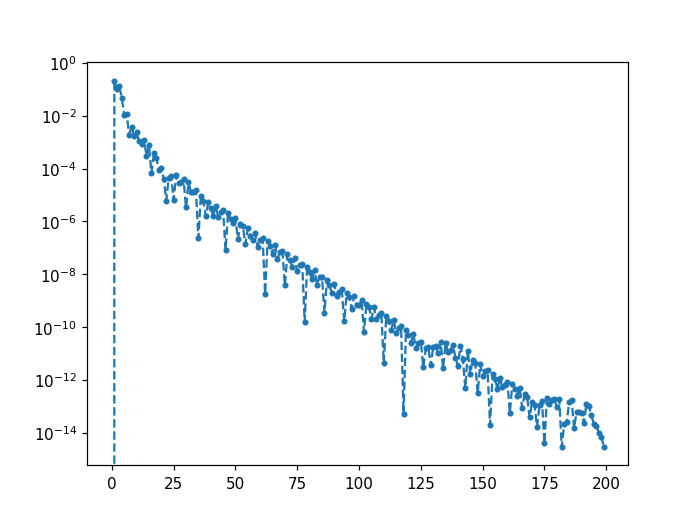

In [643]:
plt.figure()
plt.plot(abs(Pfur_0),'.--')
plt.yscale('log')

In [636]:
Vol,Sqr = get_VolSqr(Pfur_0,Zfur_0)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.5549845929408521

In [637]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

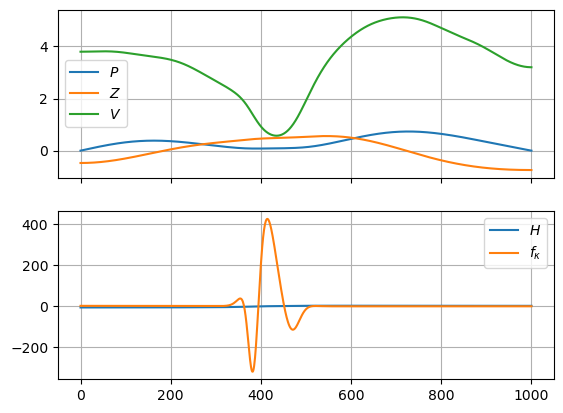

In [638]:
fig,axs = plt.subplots(2,1, sharex=True)
axs[0].plot(P)
axs[0].plot(Z)
axs[0].plot(V)
axs[0].grid()
axs[0].legend([r'$P$',r'$Z$',r'$V$'])

axs[1].plot(H)
axs[1].plot(force)
axs[1].legend([r'$H$',r'$f_\kappa$'])
axs[1].grid()

(-0.8078006765726684,
 0.8078006765726684,
 -0.8089978615582621,
 0.6249025554464405)

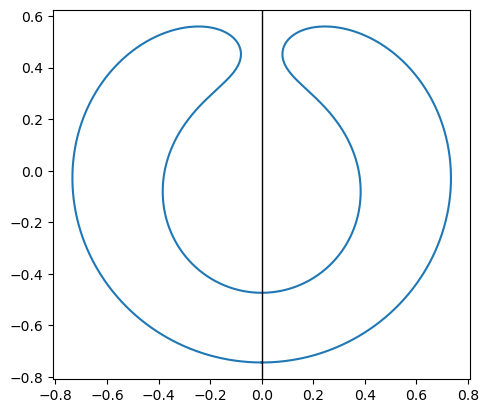

In [639]:
plt.figure()
plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]))
plt.axvline(0, color='k', lw=1)
plt.axis('scaled')

<IPython.core.display.Javascript object>


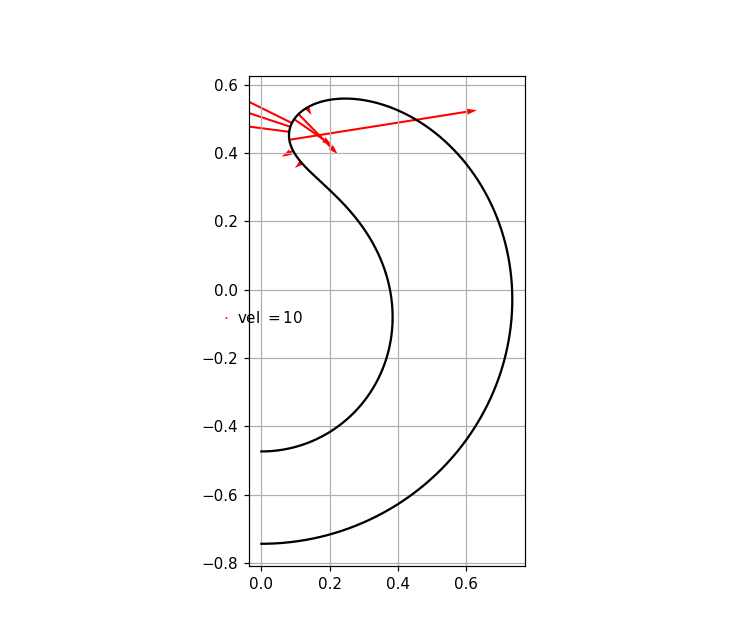

<IPython.core.display.Javascript object>


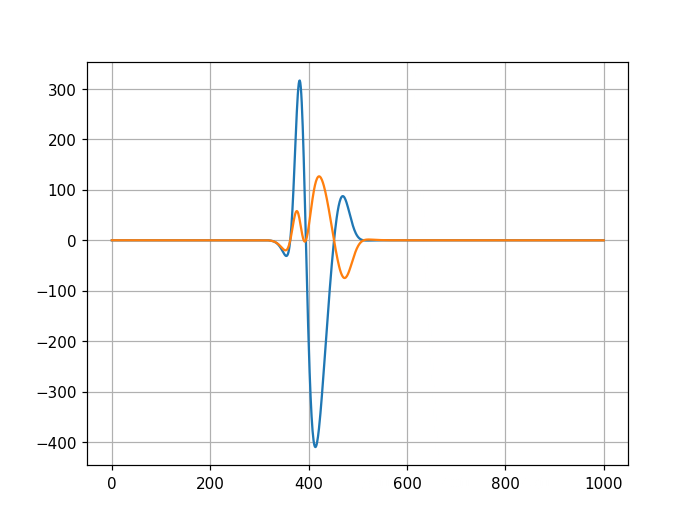

In [640]:
%matplotlib notebook
t_ = get_normal_velo_pz(Pfur_0,Zfur_0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


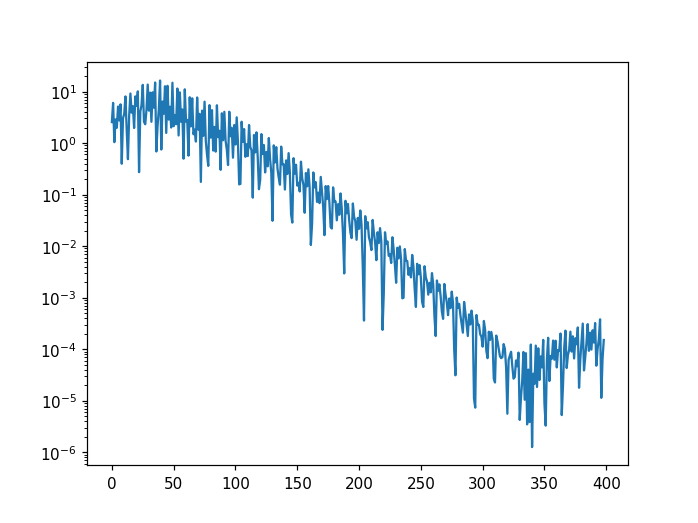

In [641]:
plt.figure()
plt.plot(abs(get_normal_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.yscale('log')

In [642]:
%timeit get_normal_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

1.46 ms ± 86.5 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


__________________________________________________

In [540]:
steps = np.logspace(-7,-5,2*N-1)[::-1]
j_fun = nd.Jacobian(get_normal_velo_fur_1d, step=steps)

In [644]:
jac_0 = j_fun(get_pz_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-6.47e+11 4494.8396478450295


<IPython.core.display.Javascript object>


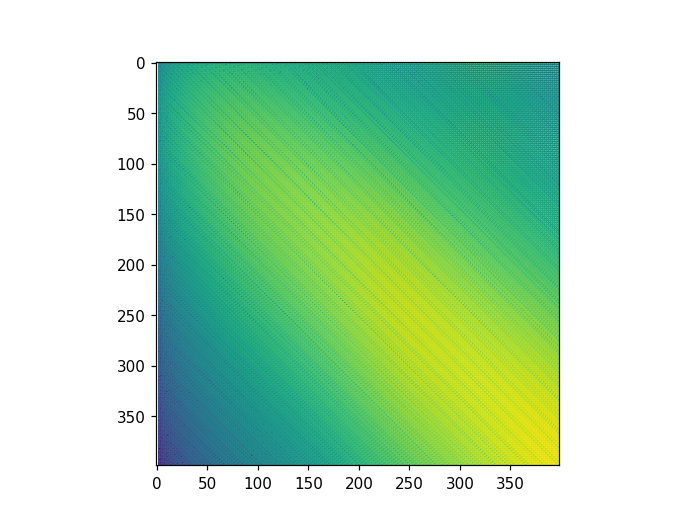

In [645]:
plt.figure()
plt.imshow(np.log10(abs(jac_0)))

In [646]:
t_max=0.01

In [647]:
atol = 1e-11
rtol = atol/10

In [668]:
rtol=1e-6
atol_arr = 1e-6/np.arange(1,len(get_pz_from_PZ_fur(Pfur_0, Zfur_0))+1)**3

In [649]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 200 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_normal_velo_fur_1d(pz)
jac = j_fun

In [650]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

0.0
[ 1.16062135e-03  2.16901993e-01  9.24346996e-02 -1.00156821e-01
 -2.92412827e-01  1.31697992e-01  6.92357245e-03  4.88878415e-02
 -1.51835797e-02 -1.11666840e-02 -3.29278595e-02  1.12773154e-02
  4.36457328e-03  1.89659734e-03  1.43839350e-03 -3.91817773e-03
 -3.29692972e-03 -1.74240711e-03 -5.25392447e-04  2.36899420e-03
  2.29856858e-03  1.15035440e-03  9.18484456e-04 -8.72643617e-04
 -1.11674554e-03 -1.26692384e-03 -1.23330490e-03  3.11947282e-04
  4.17279097e-04  7.58626313e-04  7.61608292e-04  6.80696307e-05
  1.26543905e-04 -3.83733311e-04 -3.17883121e-04 -2.42502550e-04
 -1.77947536e-04  8.86085128e-05  1.14236447e-04  1.04004072e-04
  1.08440181e-04  4.02988893e-05  3.35752933e-05 -6.18554074e-06
 -1.06102315e-05 -4.53041127e-05 -4.48158863e-05 -5.13743631e-05
 -4.94353016e-05  6.56986467e-06  7.84140846e-06  5.63380220e-05
  5.74010281e-05  2.84630686e-05  2.73399809e-05 -3.15689334e-05
 -3.37071048e-05 -3.93955569e-05 -4.01948129e-05  3.40020407e-06
  4.44942662e-06  3.0

9.800764629702245e-08
[ 1.16082230e-03  2.16901616e-01  9.24347704e-02 -1.00156969e-01
 -2.92412991e-01  1.31698340e-01  6.92338661e-03  4.88881455e-02
 -1.51835134e-02 -1.11669488e-02 -3.29276039e-02  1.12768466e-02
  4.36464310e-03  1.89668680e-03  1.43814290e-03 -3.91759395e-03
 -3.29712844e-03 -1.74223024e-03 -5.25213949e-04  2.36841549e-03
  2.29885195e-03  1.14987226e-03  9.18416764e-04 -8.72240708e-04
 -1.11704813e-03 -1.26619962e-03 -1.23334359e-03  3.11877947e-04
  4.17544647e-04  7.57834759e-04  7.61713390e-04  6.77432263e-05
  1.26336352e-04 -3.83107828e-04 -3.18008594e-04 -2.41868022e-04
 -1.77781551e-04  8.83393253e-05  1.14361801e-04  1.03281127e-04
  1.08287693e-04  4.01636365e-05  3.34366037e-05 -5.63058105e-06
 -1.04649865e-05 -4.48913136e-05 -4.46394920e-05 -5.15947664e-05
 -4.95458599e-05  6.11873810e-06  7.62720866e-06  5.62298343e-05
  5.74378253e-05  2.87286321e-05  2.75524027e-05 -3.12961121e-05
 -3.36579623e-05 -3.93833736e-05 -4.03470736e-05  3.18079772e-06
  4

4.636434689453153e-06
[ 1.16248652e-03  2.16900279e-01  9.24354734e-02 -1.00157086e-01
 -2.92414243e-01  1.31700123e-01  6.92187425e-03  4.88886729e-02
 -1.51831613e-02 -1.11692638e-02 -3.29256914e-02  1.12749398e-02
  4.36534835e-03  1.89854487e-03  1.43667373e-03 -3.91430761e-03
 -3.29826833e-03 -1.74256032e-03 -5.24375838e-04  2.36462806e-03
  2.29976189e-03  1.14813942e-03  9.17831033e-04 -8.69387287e-04
 -1.11745499e-03 -1.26297595e-03 -1.23240815e-03  3.11044146e-04
  4.17789964e-04  7.54592339e-04  7.60192070e-04  6.66310886e-05
  1.25632557e-04 -3.81253290e-04 -3.16329889e-04 -2.40013400e-04
 -1.76384227e-04  8.82334670e-05  1.13248135e-04  1.02082525e-04
  1.06657521e-04  3.93208815e-05  3.36748389e-05 -5.66743010e-06
 -9.34687640e-06 -4.42412616e-05 -4.43891953e-05 -5.07471882e-05
 -4.98148090e-05  6.25181100e-06  7.55097384e-06  5.53715781e-05
  5.71562107e-05  2.79680477e-05  2.71246147e-05 -3.09323878e-05
 -3.33773864e-05 -3.84960823e-05 -3.95880066e-05  3.33573930e-06
  4

1.1829970826116309e-05
[ 1.16308873e-03  2.16901023e-01  9.24359704e-02 -1.00156465e-01
 -2.92414491e-01  1.31700060e-01  6.92110367e-03  4.88876992e-02
 -1.51835234e-02 -1.11702580e-02 -3.29249080e-02  1.12750615e-02
  4.36626631e-03  1.89973843e-03  1.43653339e-03 -3.91343654e-03
 -3.29893060e-03 -1.74310401e-03 -5.24628003e-04  2.36335487e-03
  2.29970733e-03  1.14769816e-03  9.17807810e-04 -8.68601113e-04
 -1.11691135e-03 -1.26205093e-03 -1.23170368e-03  3.11114813e-04
  4.17420886e-04  7.53996301e-04  7.59107401e-04  6.61494975e-05
  1.25464236e-04 -3.81271771e-04 -3.15530837e-04 -2.39771167e-04
 -1.75984761e-04  8.84835604e-05  1.13021418e-04  1.02217209e-04
  1.06547241e-04  3.92401802e-05  3.36194309e-05 -5.89648207e-06
 -9.64023245e-06 -4.43211831e-05 -4.44230035e-05 -5.05903987e-05
 -4.94026931e-05  6.34025568e-06  7.71701598e-06  5.52482657e-05
  5.68707095e-05  2.78941303e-05  2.69813022e-05 -3.08320496e-05
 -3.32319661e-05 -3.84282947e-05 -3.95423881e-05  3.29155164e-06
  

2.3349619598304588e-05
[ 1.16339904e-03  2.16902738e-01  9.24365275e-02 -1.00155431e-01
 -2.92414370e-01  1.31699294e-01  6.92041398e-03  4.88859605e-02
 -1.51843025e-02 -1.11710154e-02 -3.29243388e-02  1.12758709e-02
  4.36755144e-03  1.90093844e-03  1.43681117e-03 -3.91312028e-03
 -3.29966644e-03 -1.74375318e-03 -5.25251338e-04  2.36257708e-03
  2.29950361e-03  1.14748524e-03  9.17945550e-04 -8.68225416e-04
 -1.11626623e-03 -1.26154038e-03 -1.23111123e-03  3.11291434e-04
  4.17073719e-04  7.53787698e-04  7.58318491e-04  6.59126067e-05
  1.25367360e-04 -3.81312875e-04 -3.15120568e-04 -2.39748167e-04
 -1.75846841e-04  8.84834236e-05  1.13007549e-04  1.02258835e-04
  1.06646935e-04  3.92649086e-05  3.35315284e-05 -5.93279476e-06
 -9.87645806e-06 -4.42795838e-05 -4.43747201e-05 -5.04895438e-05
 -4.92065847e-05  6.29988734e-06  7.67402628e-06  5.51259590e-05
  5.67477048e-05  2.78951202e-05  2.70277296e-05 -3.07652663e-05
 -3.31645706e-05 -3.84274282e-05 -3.95681175e-05  3.27766285e-06
  

3.722385777184973e-05
[ 1.16345864e-03  2.16904840e-01  9.24370448e-02 -1.00154282e-01
 -2.92414009e-01  1.31698181e-01  6.91988010e-03  4.88839828e-02
 -1.51852530e-02 -1.11715116e-02 -3.29239901e-02  1.12769908e-02
  4.36889607e-03  1.90195884e-03  1.43729925e-03 -3.91319318e-03
 -3.30036457e-03 -1.74436280e-03 -5.25984009e-04  2.36222221e-03
  2.29930727e-03  1.14746061e-03  9.18166026e-04 -8.68112749e-04
 -1.11574482e-03 -1.26135973e-03 -1.23074609e-03  3.11400754e-04
  4.16816828e-04  7.53737434e-04  7.57872166e-04  6.58813402e-05
  1.25346367e-04 -3.81242207e-04 -3.14942685e-04 -2.39748325e-04
 -1.75821822e-04  8.83878477e-05  1.13035056e-04  1.02200638e-04
  1.06708428e-04  3.92429769e-05  3.34558281e-05 -5.92145235e-06
 -9.94042346e-06 -4.41887347e-05 -4.42808135e-05 -5.04344918e-05
 -4.91638699e-05  6.23157451e-06  7.57919554e-06  5.50739464e-05
  5.67063170e-05  2.79326625e-05  2.70789391e-05 -3.07381614e-05
 -3.31393768e-05 -3.84388923e-05 -3.95765418e-05  3.27220245e-06
  4

5.663971416075216e-05
[ 1.16333939e-03  2.16907553e-01  9.24376189e-02 -1.00152872e-01
 -2.92413408e-01  1.31696647e-01  6.91937010e-03  4.88815270e-02
 -1.51864895e-02 -1.11719068e-02 -3.29237385e-02  1.12784915e-02
  4.37050450e-03  1.90300661e-03  1.43799562e-03 -3.91354251e-03
 -3.30116552e-03 -1.74503112e-03 -5.26882576e-04  2.36210938e-03
  2.29913377e-03  1.14758018e-03  9.18483140e-04 -8.68124835e-04
 -1.11526976e-03 -1.26136932e-03 -1.23051072e-03  3.11419375e-04
  4.16577371e-04  7.53709442e-04  7.57572784e-04  6.59519023e-05
  1.25366733e-04 -3.81072895e-04 -3.14837833e-04 -2.39710714e-04
 -1.75819172e-04  8.82828171e-05  1.13050723e-04  1.02095290e-04
  1.06699479e-04  3.91851902e-05  3.33881523e-05 -5.87887988e-06
 -9.89929814e-06 -4.40814111e-05 -4.41642164e-05 -5.04329127e-05
 -4.91816438e-05  6.14200534e-06  7.47705026e-06  5.50567087e-05
  5.66914830e-05  2.79814766e-05  2.71263578e-05 -3.07161745e-05
 -3.31175265e-05 -3.84452962e-05 -3.95800277e-05  3.25894942e-06
  4

9.065410407080466e-05
[ 1.16294952e-03  2.16911539e-01  9.24383753e-02 -1.00150878e-01
 -2.92412365e-01  1.31694296e-01  6.91879836e-03  4.88780249e-02
 -1.51883410e-02 -1.11722475e-02 -3.29235634e-02  1.12807261e-02
  4.37275689e-03  1.90425862e-03  1.43906220e-03 -3.91430630e-03
 -3.30226700e-03 -1.74587703e-03 -5.28118932e-04  2.36230427e-03
  2.29901532e-03  1.14793442e-03  9.18985515e-04 -8.68245674e-04
 -1.11479469e-03 -1.26159339e-03 -1.23039991e-03  3.11287021e-04
  4.16315515e-04  7.53632901e-04  7.57365577e-04  6.60969167e-05
  1.25427677e-04 -3.80795219e-04 -3.14749320e-04 -2.39610905e-04
 -1.75810792e-04  8.81816831e-05  1.13016135e-04  1.01932630e-04
  1.06581496e-04  3.91105935e-05  3.33231137e-05 -5.76072974e-06
 -9.75769844e-06 -4.39504100e-05 -4.40259008e-05 -5.04943140e-05
 -4.92498658e-05  6.02411835e-06  7.35820260e-06  5.50562144e-05
  5.66894584e-05  2.80445827e-05  2.71871340e-05 -3.06824652e-05
 -3.30832668e-05 -3.84535038e-05 -3.95880003e-05  3.22950676e-06
  4

0.00013545384831591055
[ 1.16238640e-03  2.16915513e-01  9.24390784e-02 -1.00148957e-01
 -2.92411173e-01  1.31691885e-01  6.91835753e-03  4.88746266e-02
 -1.51902419e-02 -1.11724219e-02 -3.29235208e-02  1.12829402e-02
  4.37494484e-03  1.90527159e-03  1.44013116e-03 -3.91525138e-03
 -3.30333404e-03 -1.74660161e-03 -5.29247299e-04  2.36278335e-03
  2.29904480e-03  1.14844170e-03  9.19507610e-04 -8.68390182e-04
 -1.11448743e-03 -1.26191855e-03 -1.23042594e-03  3.11043935e-04
  4.16133304e-04  7.53501709e-04  7.57298714e-04  6.62210342e-05
  1.25516944e-04 -3.80548329e-04 -3.14655441e-04 -2.39499569e-04
 -1.75779190e-04  8.81022977e-05  1.12933120e-04  1.01758865e-04
  1.06406581e-04  3.90697751e-05  3.32891907e-05 -5.60043642e-06
 -9.58896930e-06 -4.38475242e-05 -4.39227109e-05 -5.05803251e-05
 -4.93345787e-05  5.92058729e-06  7.25593536e-06  5.50614606e-05
  5.66935832e-05  2.81068532e-05  2.72487618e-05 -3.06466308e-05
 -3.30480294e-05 -3.84664478e-05 -3.96019710e-05  3.19645967e-06
  

0.0001932477660924768
[ 1.16173549e-03  2.16919071e-01  9.24396795e-02 -1.00147294e-01
 -2.92409972e-01  1.31689686e-01  6.91803724e-03  4.88716625e-02
 -1.51920270e-02 -1.11724813e-02 -3.29235689e-02  1.12848746e-02
  4.37688167e-03  1.90599141e-03  1.44105156e-03 -3.91623213e-03
 -3.30430427e-03 -1.74715573e-03 -5.30158529e-04  2.36342434e-03
  2.29918720e-03  1.14900854e-03  9.19954600e-04 -8.68501910e-04
 -1.11433467e-03 -1.26222586e-03 -1.23051022e-03  3.10779233e-04
  4.16023549e-04  7.53351565e-04  7.57306091e-04  6.63036094e-05
  1.25627538e-04 -3.80365029e-04 -3.14539238e-04 -2.39407414e-04
 -1.75730965e-04  8.80199507e-05  1.12833829e-04  1.01592395e-04
  1.06236252e-04  3.90629298e-05  3.32855299e-05 -5.44270060e-06
 -9.43232041e-06 -4.37750459e-05 -4.38515302e-05 -5.06635828e-05
 -4.94159206e-05  5.83389841e-06  7.17050730e-06  5.50691768e-05
  5.67014022e-05  2.81649651e-05  2.73065271e-05 -3.06158165e-05
 -3.30183877e-05 -3.84816866e-05 -3.96184592e-05  3.16626966e-06
  4

0.00031847703699598403
[ 1.16069023e-03  2.16923218e-01  9.24403368e-02 -1.00145456e-01
 -2.92408335e-01  1.31687080e-01  6.91771405e-03  4.88683502e-02
 -1.51943489e-02 -1.11724583e-02 -3.29237480e-02  1.12869825e-02
  4.37912684e-03  1.90651445e-03  1.44195642e-03 -3.91760471e-03
 -3.30555012e-03 -1.74765036e-03 -5.31049540e-04  2.36449573e-03
  2.29948358e-03  1.14980026e-03  9.20316463e-04 -8.68574123e-04
 -1.11437112e-03 -1.26251281e-03 -1.23066555e-03  3.10467084e-04
  4.15916425e-04  7.53165229e-04  7.57342940e-04  6.63841462e-05
  1.25799956e-04 -3.80184356e-04 -3.14362259e-04 -2.39324768e-04
 -1.75670565e-04  8.78894775e-05  1.12691413e-04  1.01400739e-04
  1.06048115e-04  3.90926243e-05  3.33172419e-05 -5.25836017e-06
 -9.25278455e-06 -4.37132215e-05 -4.37917803e-05 -5.07663231e-05
 -4.95164634e-05  5.73920706e-06  7.07848712e-06  5.50857621e-05
  5.67193386e-05  2.82346177e-05  2.73757935e-05 -3.05847555e-05
 -3.29890221e-05 -3.85037033e-05 -3.96420465e-05  3.13118451e-06
  

0.000681579866284863
[ 1.15932950e-03  2.16926101e-01  9.24408066e-02 -1.00144411e-01
 -2.92406504e-01  1.31685271e-01  6.91752521e-03  4.88664353e-02
 -1.51966190e-02 -1.11724085e-02 -3.29239175e-02  1.12880376e-02
  4.38083235e-03  1.90622434e-03  1.44204858e-03 -3.91914921e-03
 -3.30670939e-03 -1.74766765e-03 -5.31157866e-04  2.36582944e-03
  2.29985953e-03  1.15035151e-03  9.19986767e-04 -8.68511754e-04
 -1.11475657e-03 -1.26243828e-03 -1.23080095e-03  3.10293304e-04
  4.15731587e-04  7.53070664e-04  7.57332805e-04  6.65124524e-05
  1.25991462e-04 -3.80072151e-04 -3.14230457e-04 -2.39339915e-04
 -1.75688930e-04  8.77595723e-05  1.12562292e-04  1.01311403e-04
  1.05965333e-04  3.91641902e-05  3.33886413e-05 -5.14357443e-06
 -9.14363769e-06 -4.37095335e-05 -4.37908623e-05 -5.08484457e-05
 -4.95958907e-05  5.69203447e-06  7.03576550e-06  5.51144806e-05
  5.67503061e-05  2.82807396e-05  2.74216165e-05 -3.05751725e-05
 -3.29806656e-05 -3.85260095e-05 -3.96649783e-05  3.10862531e-06
  4.

0.0009869676578221666
[ 1.15890238e-03  2.16926425e-01  9.24409684e-02 -1.00144419e-01
 -2.92405783e-01  1.31685113e-01  6.91759848e-03  4.88664841e-02
 -1.51971606e-02 -1.11724220e-02 -3.29237594e-02  1.12879849e-02
  4.38121403e-03  1.90587642e-03  1.44181143e-03 -3.91972008e-03
 -3.30690670e-03 -1.74749502e-03 -5.30772185e-04  2.36618187e-03
  2.30001717e-03  1.15025788e-03  9.19666937e-04 -8.68469092e-04
 -1.11486531e-03 -1.26232231e-03 -1.23078736e-03  3.10255223e-04
  4.15647989e-04  7.53084330e-04  7.57333265e-04  6.65739056e-05
  1.26050304e-04 -3.80071911e-04 -3.14228673e-04 -2.39378533e-04
 -1.75726168e-04  8.77349449e-05  1.12539053e-04  1.01325811e-04
  1.05980646e-04  3.91945599e-05  3.34181914e-05 -5.13874450e-06
 -9.14071866e-06 -4.37292281e-05 -4.38115851e-05 -5.08618174e-05
 -4.96083824e-05  5.69789773e-06  7.04300789e-06  5.51260714e-05
  5.67623614e-05  2.82837339e-05  2.74243263e-05 -3.05803328e-05
 -3.29860416e-05 -3.85317088e-05 -3.96704787e-05  3.10747680e-06
  4

0.0012402818142668575
[ 1.15869054e-03  2.16926508e-01  9.24410839e-02 -1.00144477e-01
 -2.92405324e-01  1.31685101e-01  6.91769734e-03  4.88666346e-02
 -1.51973907e-02 -1.11724339e-02 -3.29235737e-02  1.12879368e-02
  4.38141421e-03  1.90565078e-03  1.44167230e-03 -3.92007928e-03
 -3.30696113e-03 -1.74737511e-03 -5.30459365e-04  2.36630771e-03
  2.30012382e-03  1.15013123e-03  9.19494297e-04 -8.68447240e-04
 -1.11488409e-03 -1.26227209e-03 -1.23076857e-03  3.10228260e-04
  4.15607159e-04  7.53100915e-04  7.57342847e-04  6.66055012e-05
  1.26078859e-04 -3.80077805e-04 -3.14234049e-04 -2.39402236e-04
 -1.75748906e-04  8.77238605e-05  1.12528719e-04  1.01339321e-04
  1.05994353e-04  3.92119512e-05  3.34350288e-05 -5.14071529e-06
 -9.14374592e-06 -4.37426462e-05 -4.38256407e-05 -5.08670308e-05
 -4.96132601e-05  5.70409201e-06  7.04977335e-06  5.51326261e-05
  5.67690220e-05  2.82836785e-05  2.74240288e-05 -3.05842309e-05
 -3.29900661e-05 -3.85345337e-05 -3.96731545e-05  3.10774308e-06
  4

0.0017009446039611743
[ 1.15842743e-03  2.16926588e-01  9.24412471e-02 -1.00144580e-01
 -2.92404648e-01  1.31685113e-01  6.91787147e-03  4.88669014e-02
 -1.51976406e-02 -1.11724514e-02 -3.29232441e-02  1.12879234e-02
  4.38167559e-03  1.90532692e-03  1.44151176e-03 -3.92060645e-03
 -3.30700806e-03 -1.74720140e-03 -5.29975503e-04  2.36639321e-03
  2.30027972e-03  1.14992655e-03  9.19302917e-04 -8.68421770e-04
 -1.11487079e-03 -1.26223646e-03 -1.23074664e-03  3.10192022e-04
  4.15565055e-04  7.53127417e-04  7.57362327e-04  6.66418203e-05
  1.26111432e-04 -3.80085436e-04 -3.14241162e-04 -2.39433028e-04
 -1.75778420e-04  8.77084999e-05  1.12514307e-04  1.01358461e-04
  1.06013593e-04  3.92353884e-05  3.34577675e-05 -5.14421423e-06
 -9.14864064e-06 -4.37609641e-05 -4.38448987e-05 -5.08735744e-05
 -4.96195633e-05  5.71302131e-06  7.05927081e-06  5.51414600e-05
  5.67778946e-05  2.82833008e-05  2.74232725e-05 -3.05896334e-05
 -3.29956627e-05 -3.85382427e-05 -3.96766651e-05  3.10828588e-06
  4

0.0021351758418515707
[ 1.15825431e-03  2.16926640e-01  9.24413387e-02 -1.00144662e-01
 -2.92404130e-01  1.31685126e-01  6.91798826e-03  4.88671126e-02
 -1.51977870e-02 -1.11724699e-02 -3.29229892e-02  1.12879666e-02
  4.38185547e-03  1.90508229e-03  1.44140877e-03 -3.92099351e-03
 -3.30704107e-03 -1.74706724e-03 -5.29610034e-04  2.36640906e-03
  2.30038710e-03  1.14978151e-03  9.19194162e-04 -8.68406207e-04
 -1.11484755e-03 -1.26222936e-03 -1.23073763e-03  3.10170215e-04
  4.15543607e-04  7.53146410e-04  7.57377280e-04  6.66643020e-05
  1.26131548e-04 -3.80089020e-04 -3.14244551e-04 -2.39454132e-04
 -1.75798628e-04  8.76967888e-05  1.12503231e-04  1.01371739e-04
  1.06026900e-04  3.92519517e-05  3.34739024e-05 -5.14633224e-06
 -9.15172641e-06 -4.37737315e-05 -4.38583582e-05 -5.08783769e-05
 -4.96242964e-05  5.71921058e-06  7.06578315e-06  5.51477385e-05
  5.67841720e-05  2.82831677e-05  2.74228566e-05 -3.05933934e-05
 -3.29995719e-05 -3.85408946e-05 -3.96791831e-05  3.10861937e-06
  4

0.0027259428188534033
[ 1.15809275e-03  2.16926693e-01  9.24413751e-02 -1.00144760e-01
 -2.92403547e-01  1.31685140e-01  6.91806266e-03  4.88673473e-02
 -1.51979096e-02 -1.11725018e-02 -3.29227386e-02  1.12880680e-02
  4.38204384e-03  1.90481008e-03  1.44128937e-03 -3.92138869e-03
 -3.30708164e-03 -1.74691207e-03 -5.29221626e-04  2.36639976e-03
  2.30048627e-03  1.14964050e-03  9.19097093e-04 -8.68391471e-04
 -1.11481965e-03 -1.26223190e-03 -1.23073378e-03  3.10151539e-04
  4.15526725e-04  7.53165546e-04  7.57392576e-04  6.66860803e-05
  1.26150979e-04 -3.80091345e-04 -3.14246801e-04 -2.39475947e-04
 -1.75819478e-04  8.76840887e-05  1.12491172e-04  1.01385368e-04
  1.06040564e-04  3.92691664e-05  3.34907272e-05 -5.14822778e-06
 -9.15459780e-06 -4.37869281e-05 -4.38722614e-05 -5.08835439e-05
 -4.96294275e-05  5.72553568e-06  7.07241870e-06  5.51543018e-05
  5.67907284e-05  2.82831426e-05  2.74225330e-05 -3.05972668e-05
 -3.30036056e-05 -3.85436879e-05 -3.96818402e-05  3.10892117e-06
  4

0.003004753960484289
[ 1.15803825e-03  2.16926713e-01  9.24413630e-02 -1.00144803e-01
 -2.92403307e-01  1.31685144e-01  6.91806874e-03  4.88674419e-02
 -1.51979457e-02 -1.11725185e-02 -3.29226539e-02  1.12881258e-02
  4.38211862e-03  1.90469998e-03  1.44123457e-03 -3.92153412e-03
 -3.30709939e-03 -1.74684737e-03 -5.29072546e-04  2.36639143e-03
  2.30051941e-03  1.14959014e-03  9.19063122e-04 -8.68386162e-04
 -1.11480906e-03 -1.26223466e-03 -1.23073355e-03  3.10145316e-04
  4.15521344e-04  7.53172716e-04  7.57398343e-04  6.66941652e-05
  1.26158173e-04 -3.80091940e-04 -3.14247390e-04 -2.39484337e-04
 -1.75827485e-04  8.76791095e-05  1.12486436e-04  1.01390567e-04
  1.06045784e-04  3.92757814e-05  3.34972079e-05 -5.14888866e-06
 -9.15561883e-06 -4.37919968e-05 -4.38775912e-05 -5.08855708e-05
 -4.96314424e-05  5.72794227e-06  7.07494307e-06  5.51568343e-05
  5.67932588e-05  2.82831579e-05  2.74224333e-05 -3.05987501e-05
 -3.30051513e-05 -3.85447707e-05 -3.96828712e-05  3.10902744e-06
  4.

0.0034465063073418857
[ 1.15797265e-03  2.16926740e-01  9.24413136e-02 -1.00144867e-01
 -2.92402963e-01  1.31685149e-01  6.91804876e-03  4.88675753e-02
 -1.51979821e-02 -1.11725455e-02 -3.29225555e-02  1.12882258e-02
  4.38222465e-03  1.90454468e-03  1.44114713e-03 -3.92172325e-03
 -3.30712618e-03 -1.74675437e-03 -5.28871604e-04  2.36637737e-03
  2.30055934e-03  1.14952587e-03  9.19019602e-04 -8.68379404e-04
 -1.11479552e-03 -1.26223957e-03 -1.23073424e-03  3.10137553e-04
  4.15514781e-04  7.53182317e-04  7.57406100e-04  6.67050207e-05
  1.26167815e-04 -3.80092480e-04 -3.14247936e-04 -2.39495787e-04
 -1.75838401e-04  8.76722098e-05  1.12479864e-04  1.01397580e-04
  1.06052840e-04  3.92848192e-05  3.35060804e-05 -5.14969648e-06
 -9.15689712e-06 -4.37989102e-05 -4.38848472e-05 -5.08883944e-05
 -4.96342474e-05  5.73118650e-06  7.07834935e-06  5.51603055e-05
  5.67967292e-05  2.82832135e-05  2.74223326e-05 -3.06007657e-05
 -3.30072529e-05 -3.85462616e-05 -3.96842920e-05  3.10915738e-06
  4

0.003804013287092492
[ 1.15793367e-03  2.16926759e-01  9.24412515e-02 -1.00144916e-01
 -2.92402711e-01  1.31685150e-01  6.91801174e-03  4.88676710e-02
 -1.51979971e-02 -1.11725666e-02 -3.29225023e-02  1.12883125e-02
  4.38230188e-03  1.90443362e-03  1.44107556e-03 -3.92184668e-03
 -3.30714719e-03 -1.74668670e-03 -5.28735042e-04  2.36636647e-03
  2.30058325e-03  1.14948484e-03  9.18991516e-04 -8.68375228e-04
 -1.11478711e-03 -1.26224367e-03 -1.23073538e-03  3.10132605e-04
  4.15510680e-04  7.53188834e-04  7.57411394e-04  6.67124742e-05
  1.26174424e-04 -3.80092624e-04 -3.14248092e-04 -2.39503720e-04
 -1.75845957e-04  8.76673069e-05  1.12475186e-04  1.01402346e-04
  1.06057649e-04  3.92911184e-05  3.35122807e-05 -5.15014883e-06
 -9.15765733e-06 -4.38037019e-05 -4.38898662e-05 -5.08904219e-05
 -4.96362601e-05  5.73339078e-06  7.08066797e-06  5.51627340e-05
  5.67991596e-05  2.82832923e-05  2.74223037e-05 -3.06021542e-05
 -3.30087022e-05 -3.85473121e-05 -3.96852948e-05  3.10922908e-06
  4.

0.004119901233608069
[ 1.15790689e-03  2.16926774e-01  9.24411838e-02 -1.00144958e-01
 -2.92402504e-01  1.31685149e-01  6.91796728e-03  4.88677482e-02
 -1.51980023e-02 -1.11725842e-02 -3.29224713e-02  1.12883923e-02
  4.38236504e-03  1.90434482e-03  1.44101187e-03 -3.92193832e-03
 -3.30716565e-03 -1.74663190e-03 -5.28630262e-04  2.36635767e-03
  2.30059984e-03  1.14945505e-03  9.18970886e-04 -8.68372385e-04
 -1.11478130e-03 -1.26224726e-03 -1.23073667e-03  3.10128947e-04
  4.15507691e-04  7.53193843e-04  7.57415482e-04  6.67183040e-05
  1.26179588e-04 -3.80092561e-04 -3.14248043e-04 -2.39509928e-04
 -1.75851867e-04  8.76633540e-05  1.12471408e-04  1.01405989e-04
  1.06061336e-04  3.92960942e-05  3.35171909e-05 -5.15040365e-06
 -9.15814029e-06 -4.38074548e-05 -4.38937910e-05 -5.08920767e-05
 -4.96379023e-05  5.73507679e-06  7.08244529e-06  5.51646587e-05
  5.68010882e-05  2.82833914e-05  2.74223191e-05 -3.06032342e-05
 -3.30098306e-05 -3.85481515e-05 -3.96860974e-05  3.10926772e-06
  4.

0.00463012263461283
[ 1.15787421e-03  2.16926797e-01  9.24410547e-02 -1.00145022e-01
 -2.92402198e-01  1.31685143e-01  6.91787849e-03  4.88678607e-02
 -1.51979988e-02 -1.11726093e-02 -3.29224462e-02  1.12885260e-02
  4.38245880e-03  1.90421738e-03  1.44090868e-03 -3.92205938e-03
 -3.30719595e-03 -1.74655201e-03 -5.28486665e-04  2.36634553e-03
  2.30062022e-03  1.14941707e-03  9.18944194e-04 -8.68369259e-04
 -1.11477458e-03 -1.26225294e-03 -1.23073915e-03  3.10124064e-04
  4.15503757e-04  7.53200734e-04  7.57421141e-04  6.67265734e-05
  1.26186910e-04 -3.80092114e-04 -3.14247624e-04 -2.39518668e-04
 -1.75860183e-04  8.76575191e-05  1.12465820e-04  1.01410927e-04
  1.06066356e-04  3.93032206e-05  3.35242480e-05 -5.15053848e-06
 -9.15857340e-06 -4.38127474e-05 -4.38993174e-05 -5.08945641e-05
 -4.96403713e-05  5.73736489e-06  7.08486564e-06  5.51674272e-05
  5.68038671e-05  2.82836163e-05  2.74224270e-05 -3.06047407e-05
 -3.30114078e-05 -3.85493741e-05 -3.96872696e-05  3.10928200e-06
  4.1

0.004976793477849614
[ 1.15785695e-03  2.16926811e-01  9.24409562e-02 -1.00145064e-01
 -2.92402006e-01  1.31685136e-01  6.91780967e-03  4.88679301e-02
 -1.51979905e-02 -1.11726238e-02 -3.29224431e-02  1.12886193e-02
  4.38251755e-03  1.90414066e-03  1.44083874e-03 -3.92212676e-03
 -3.30721728e-03 -1.74650302e-03 -5.28403919e-04  2.36633884e-03
  2.30063088e-03  1.14939696e-03  9.18929841e-04 -8.68368030e-04
 -1.11477156e-03 -1.26225672e-03 -1.23074106e-03  3.10121278e-04
  4.15501544e-04  7.53204724e-04  7.57424440e-04  6.67315657e-05
  1.26191332e-04 -3.80091586e-04 -3.14247119e-04 -2.39523863e-04
 -1.75865126e-04  8.76538360e-05  1.12462283e-04  1.01413714e-04
  1.06069208e-04  3.93075586e-05  3.35285613e-05 -5.15044413e-06
 -9.15864149e-06 -4.38159012e-05 -4.39026061e-05 -5.08961674e-05
 -4.96419641e-05  5.73865957e-06  7.08624157e-06  5.51691205e-05
  5.68055702e-05  2.82838166e-05  2.74225584e-05 -3.06056258e-05
 -3.30123368e-05 -3.85501334e-05 -3.96880000e-05  3.10925893e-06
  4.

0.005490487618738703
[ 1.15783546e-03  2.16926832e-01  9.24407990e-02 -1.00145123e-01
 -2.92401743e-01  1.31685122e-01  6.91769965e-03  4.88680246e-02
 -1.51979728e-02 -1.11726410e-02 -3.29224543e-02  1.12887602e-02
  4.38259826e-03  1.90403969e-03  1.44073597e-03 -3.92221000e-03
 -3.30725044e-03 -1.74643706e-03 -5.28298920e-04  2.36633123e-03
  2.30064359e-03  1.14937369e-03  9.18913009e-04 -8.68367321e-04
 -1.11476892e-03 -1.26226223e-03 -1.23074414e-03  3.10117708e-04
  4.15498739e-04  7.53209818e-04  7.57428678e-04  6.67382638e-05
  1.26197271e-04 -3.80090500e-04 -3.14246072e-04 -2.39530676e-04
 -1.75871608e-04  8.76486629e-05  1.12457302e-04  1.01417140e-04
  1.06072740e-04  3.93134164e-05  3.35344107e-05 -5.15004657e-06
 -9.15843717e-06 -4.38200502e-05 -4.39069283e-05 -5.08984681e-05
 -4.96442526e-05  5.74025632e-06  7.08794867e-06  5.51714179e-05
  5.68078862e-05  2.82841843e-05  2.74228365e-05 -3.06067709e-05
 -3.30135425e-05 -3.85511812e-05 -3.96890117e-05  3.10917877e-06
  4.

0.005815315764906546
[ 1.15782310e-03  2.16926845e-01  9.24406943e-02 -1.00145158e-01
 -2.92401588e-01  1.31685110e-01  6.91762695e-03  4.88680799e-02
 -1.51979595e-02 -1.11726493e-02 -3.29224690e-02  1.12888505e-02
  4.38264581e-03  1.90398284e-03  1.44067176e-03 -3.92225463e-03
 -3.30727255e-03 -1.74639889e-03 -5.28241528e-04  2.36632781e-03
  2.30065035e-03  1.14936223e-03  9.18904603e-04 -8.68367455e-04
 -1.11476817e-03 -1.26226566e-03 -1.23074622e-03  3.10115704e-04
  4.15497180e-04  7.53212619e-04  7.57431026e-04  6.67421595e-05
  1.26200731e-04 -3.80089641e-04 -3.14245241e-04 -2.39534529e-04
 -1.75875276e-04  8.76455154e-05  1.12454264e-04  1.01418933e-04
  1.06074607e-04  3.93168409e-05  3.35378453e-05 -5.14964724e-06
 -9.15813595e-06 -4.38224057e-05 -4.39093805e-05 -5.08998967e-05
 -4.96456758e-05  5.74109577e-06  7.08885283e-06  5.51727673e-05
  5.68092496e-05  2.82844593e-05  2.74230613e-05 -3.06074089e-05
 -3.30142168e-05 -3.85518075e-05 -3.96896185e-05  3.10910151e-06
  4.

0.006159359804946135
[ 1.15781024e-03  2.16926858e-01  9.24405802e-02 -1.00145195e-01
 -2.92401432e-01  1.31685096e-01  6.91754850e-03  4.88681354e-02
 -1.51979445e-02 -1.11726559e-02 -3.29224896e-02  1.12889467e-02
  4.38269349e-03  1.90392793e-03  1.44060455e-03 -3.92229661e-03
 -3.30729703e-03 -1.74636106e-03 -5.28187090e-04  2.36632531e-03
  2.30065684e-03  1.14935231e-03  9.18897253e-04 -8.68368011e-04
 -1.11476801e-03 -1.26226928e-03 -1.23074853e-03  3.10113739e-04
  4.15495660e-04  7.53215292e-04  7.57433278e-04  6.67460582e-05
  1.26204200e-04 -3.80088598e-04 -3.14244231e-04 -2.39538289e-04
 -1.75878855e-04  8.76422539e-05  1.12451109e-04  1.01420560e-04
  1.06076315e-04  3.93202789e-05  3.35413052e-05 -5.14910864e-06
 -9.15768437e-06 -4.38247113e-05 -4.39117801e-05 -5.09013998e-05
 -4.96471752e-05  5.74186068e-06  7.08968275e-06  5.51741268e-05
  5.68106257e-05  2.82847850e-05  2.74233383e-05 -3.06080231e-05
 -3.30148680e-05 -3.85524475e-05 -3.96902404e-05  3.10899876e-06
  4.

0.006511014986756975
[ 1.15779678e-03  2.16926872e-01  9.24404612e-02 -1.00145232e-01
 -2.92401281e-01  1.31685079e-01  6.91746759e-03  4.88681892e-02
 -1.51979287e-02 -1.11726603e-02 -3.29225149e-02  1.12890454e-02
  4.38273959e-03  1.90387698e-03  1.44053682e-03 -3.92233496e-03
 -3.30732320e-03 -1.74632484e-03 -5.28137265e-04  2.36632388e-03
  2.30066300e-03  1.14934415e-03  9.18891141e-04 -8.68368960e-04
 -1.11476842e-03 -1.26227297e-03 -1.23075099e-03  3.10111859e-04
  4.15494212e-04  7.53217754e-04  7.57435365e-04  6.67498432e-05
  1.26207575e-04 -3.80087401e-04 -3.14243071e-04 -2.39541834e-04
 -1.75882232e-04  8.76389748e-05  1.12447932e-04  1.01421966e-04
  1.06077809e-04  3.93236256e-05  3.35446853e-05 -5.14844353e-06
 -9.15709283e-06 -4.38268940e-05 -4.39140516e-05 -5.09029333e-05
 -4.96487070e-05  5.74252549e-06  7.09041080e-06  5.51754549e-05
  5.68119726e-05  2.82851527e-05  2.74236605e-05 -3.06085939e-05
 -3.30154756e-05 -3.85530818e-05 -3.96908587e-05  3.10887293e-06
  4.

0.006987333965241373
[ 1.15777731e-03  2.16926892e-01  9.24402971e-02 -1.00145280e-01
 -2.92401088e-01  1.31685053e-01  6.91735799e-03  4.88682582e-02
 -1.51979076e-02 -1.11726627e-02 -3.29225546e-02  1.12891794e-02
  4.38279810e-03  1.90381555e-03  1.44044676e-03 -3.92238111e-03
 -3.30736057e-03 -1.74627922e-03 -5.28077743e-04  2.36632368e-03
  2.30067097e-03  1.14933570e-03  9.18884740e-04 -8.68370763e-04
 -1.11476974e-03 -1.26227795e-03 -1.23075446e-03  3.10109463e-04
  4.15492372e-04  7.53220721e-04  7.57437898e-04  6.67547093e-05
  1.26211926e-04 -3.80085588e-04 -3.14241311e-04 -2.39546226e-04
 -1.75886419e-04  8.76345911e-05  1.12443676e-04  1.01423506e-04
  1.06079474e-04  3.93279385e-05  3.35490589e-05 -5.14737263e-06
 -9.15610066e-06 -4.38296118e-05 -4.39168800e-05 -5.09050162e-05
 -4.96507909e-05  5.74326075e-06  7.09122736e-06  5.51771732e-05
  5.68137190e-05  2.82857036e-05  2.74241555e-05 -3.06092881e-05
 -3.30162181e-05 -3.85539163e-05 -3.96916747e-05  3.10867148e-06
  4.

0.007274590555980392
[ 1.15776459e-03  2.16926904e-01  9.24401972e-02 -1.00145308e-01
 -2.92400978e-01  1.31685036e-01  6.91729236e-03  4.88682978e-02
 -1.51978953e-02 -1.11726623e-02 -3.29225809e-02  1.12892602e-02
  4.38283135e-03  1.90378237e-03  1.44039342e-03 -3.92240637e-03
 -3.30738417e-03 -1.74625340e-03 -5.28045662e-04  2.36632446e-03
  2.30067571e-03  1.14933181e-03  9.18881759e-04 -8.68372095e-04
 -1.11477088e-03 -1.26228095e-03 -1.23075662e-03  3.10108079e-04
  4.15491310e-04  7.53222335e-04  7.57439285e-04  6.67575244e-05
  1.26214450e-04 -3.80084397e-04 -3.14240154e-04 -2.39548677e-04
 -1.75888757e-04  8.76319676e-05  1.12441125e-04  1.01424256e-04
  1.06080303e-04  3.93304377e-05  3.35516026e-05 -5.14663961e-06
 -9.15540516e-06 -4.38311359e-05 -4.39184666e-05 -5.09062793e-05
 -4.96520564e-05  5.74362280e-06  7.09163637e-06  5.51781723e-05
  5.68147364e-05  2.82860634e-05  2.74244843e-05 -3.06096683e-05
 -3.30166269e-05 -3.85544089e-05 -3.96921578e-05  3.10853402e-06
  4.

0.007647958191231611
[ 1.15774672e-03  2.16926919e-01  9.24400667e-02 -1.00145343e-01
 -2.92400841e-01  1.31685012e-01  6.91720796e-03  4.88683475e-02
 -1.51978802e-02 -1.11726596e-02 -3.29226172e-02  1.12893651e-02
  4.38287244e-03  1.90374323e-03  1.44032522e-03 -3.92243691e-03
 -3.30741600e-03 -1.74622154e-03 -5.28007675e-04  2.36632643e-03
  2.30068192e-03  1.14932788e-03  9.18878720e-04 -8.68374060e-04
 -1.11477269e-03 -1.26228486e-03 -1.23075951e-03  3.10106328e-04
  4.15489966e-04  7.53224262e-04  7.57440951e-04  6.67610725e-05
  1.26217638e-04 -3.80082748e-04 -3.14238553e-04 -2.39551668e-04
 -1.75891614e-04  8.76285702e-05  1.12437817e-04  1.01425052e-04
  1.06081204e-04  3.93335906e-05  3.35548211e-05 -5.14559668e-06
 -9.15440138e-06 -4.38330048e-05 -4.39204128e-05 -5.09079317e-05
 -4.96537138e-05  5.74401214e-06  7.09208475e-06  5.51794362e-05
  5.68160256e-05  2.82865598e-05  2.74249432e-05 -3.06101248e-05
 -3.30171201e-05 -3.85550396e-05 -3.96927778e-05  3.10833881e-06
  4.

0.008039046216910843
[ 1.15772624e-03  2.16926936e-01  9.24399297e-02 -1.00145379e-01
 -2.92400706e-01  1.31684985e-01  6.91712098e-03  4.88683974e-02
 -1.51978654e-02 -1.11726545e-02 -3.29226572e-02  1.12894747e-02
  4.38291306e-03  1.90370670e-03  1.44025517e-03 -3.92246663e-03
 -3.30745072e-03 -1.74619002e-03 -5.27971844e-04  2.36632958e-03
  2.30068858e-03  1.14932493e-03  9.18876405e-04 -8.68376361e-04
 -1.11477493e-03 -1.26228896e-03 -1.23076261e-03  3.10104535e-04
  4.15488588e-04  7.53226100e-04  7.57442551e-04  6.67646748e-05
  1.26220886e-04 -3.80080909e-04 -3.14236766e-04 -2.39554592e-04
 -1.75894409e-04  8.76250187e-05  1.12434355e-04  1.01425690e-04
  1.06081955e-04  3.93367942e-05  3.35581020e-05 -5.14440316e-06
 -9.15323868e-06 -4.38348421e-05 -4.39223272e-05 -5.09096774e-05
 -4.96554669e-05  5.74433131e-06  7.09246362e-06  5.51807242e-05
  5.68173416e-05  2.82871126e-05  2.74254595e-05 -3.06105623e-05
 -3.30175953e-05 -3.85556910e-05 -3.96934197e-05  3.10811572e-06
  4.

0.008597439741777204
[ 1.15769365e-03  2.16926960e-01  9.24397343e-02 -1.00145429e-01
 -2.92400523e-01  1.31684944e-01  6.91699983e-03  4.88684654e-02
 -1.51978468e-02 -1.11726432e-02 -3.29227168e-02  1.12896304e-02
  4.38296706e-03  1.90366179e-03  1.44015759e-03 -3.92250598e-03
 -3.30750260e-03 -1.74614790e-03 -5.27926719e-04  2.36633585e-03
  2.30069851e-03  1.14932241e-03  9.18874383e-04 -8.68380007e-04
 -1.11477861e-03 -1.26229483e-03 -1.23076718e-03  3.10102020e-04
  4.15486647e-04  7.53228450e-04  7.57444614e-04  6.67696518e-05
  1.26225388e-04 -3.80078104e-04 -3.14234041e-04 -2.39558446e-04
 -1.75898098e-04  8.76199486e-05  1.12429404e-04  1.01426295e-04
  1.06082728e-04  3.93412224e-05  3.35626542e-05 -5.14253658e-06
 -9.15140073e-06 -4.38372807e-05 -4.39248703e-05 -5.09121984e-05
 -4.96580023e-05  5.74464840e-06  7.09286271e-06  5.51825104e-05
  5.68191704e-05  2.82879548e-05  2.74262542e-05 -3.06111239e-05
 -3.30182102e-05 -3.85566083e-05 -3.96943264e-05  3.10776719e-06
  4.

0.008778727153556206
[ 1.15768220e-03  2.16926968e-01  9.24396710e-02 -1.00145445e-01
 -2.92400466e-01  1.31684930e-01  6.91696133e-03  4.88684868e-02
 -1.51978414e-02 -1.11726386e-02 -3.29227367e-02  1.12896808e-02
  4.38298365e-03  1.90364890e-03  1.44012653e-03 -3.92251813e-03
 -3.30752000e-03 -1.74613489e-03 -5.27913418e-04  2.36633831e-03
  2.30070186e-03  1.14932195e-03  9.18874005e-04 -8.68381269e-04
 -1.11477991e-03 -1.26229674e-03 -1.23076869e-03  3.10101210e-04
  4.15486020e-04  7.53229152e-04  7.57445235e-04  6.67712316e-05
  1.26226821e-04 -3.80077152e-04 -3.14233116e-04 -2.39559624e-04
 -1.75899228e-04  8.76183010e-05  1.12427794e-04  1.01426422e-04
  1.06082911e-04  3.93426281e-05  3.35641033e-05 -5.14189286e-06
 -9.15076288e-06 -4.38380309e-05 -4.39256532e-05 -5.09130243e-05
 -4.96588336e-05  5.74471977e-06  7.09295997e-06  5.51830789e-05
  5.68197532e-05  2.82882407e-05  2.74265256e-05 -3.06112920e-05
 -3.30183954e-05 -3.85569036e-05 -3.96946188e-05  3.10764705e-06
  4.

0.009204983415450696
[ 1.15765361e-03  2.16926987e-01  9.24395227e-02 -1.00145482e-01
 -2.92400338e-01  1.31684895e-01  6.91687253e-03  4.88685357e-02
 -1.51978299e-02 -1.11726261e-02 -3.29227840e-02  1.12897986e-02
  4.38302094e-03  1.90362161e-03  1.44005465e-03 -3.92254572e-03
 -3.30756192e-03 -1.74610545e-03 -5.27884448e-04  2.36634484e-03
  2.30071002e-03  1.14932147e-03  9.18873579e-04 -8.68384363e-04
 -1.11478314e-03 -1.26230124e-03 -1.23077230e-03  3.10099312e-04
  4.15484546e-04  7.53230699e-04  7.57446609e-04  6.67748865e-05
  1.26230144e-04 -3.80074842e-04 -3.14230871e-04 -2.39562270e-04
 -1.75901766e-04  8.76144216e-05  1.12423999e-04  1.01426598e-04
  1.06083220e-04  3.93458801e-05  3.35674627e-05 -5.14031262e-06
 -9.14919070e-06 -4.38397233e-05 -4.39274207e-05 -5.09149801e-05
 -4.96608039e-05  5.74483260e-06  7.09313244e-06  5.51843961e-05
  5.68211054e-05  2.82889348e-05  2.74271875e-05 -3.06116626e-05
 -3.30188061e-05 -3.85575936e-05 -3.96953032e-05  3.10735223e-06
  4.

0.009554658778415314
[ 1.15762843e-03  2.16927003e-01  9.24394018e-02 -1.00145511e-01
 -2.92400238e-01  1.31684865e-01  6.91680151e-03  4.88685746e-02
 -1.51978219e-02 -1.11726141e-02 -3.29228234e-02  1.12898947e-02
  4.38304984e-03  1.90360219e-03  1.43999688e-03 -3.92256751e-03
 -3.30759732e-03 -1.74608242e-03 -5.27862883e-04  2.36635094e-03
  2.30071700e-03  1.14932163e-03  9.18873661e-04 -8.68387020e-04
 -1.11478594e-03 -1.26230494e-03 -1.23077531e-03  3.10097757e-04
  4.15483333e-04  7.53231868e-04  7.57447657e-04  6.67778287e-05
  1.26232827e-04 -3.80072876e-04 -3.14228961e-04 -2.39564319e-04
 -1.75903735e-04  8.76112326e-05  1.12420878e-04  1.01426626e-04
  1.06083359e-04  3.93484973e-05  3.35701734e-05 -5.13895136e-06
 -9.14783059e-06 -4.38410428e-05 -4.39288001e-05 -5.09165988e-05
 -4.96624361e-05  5.74487207e-06  7.09321964e-06  5.51854584e-05
  5.68221974e-05  2.82895258e-05  2.74277536e-05 -3.06119429e-05
 -3.30191192e-05 -3.85581559e-05 -3.96958620e-05  3.10709833e-06
  4.

0.00994327805006232
[ 1.15759867e-03  2.16927021e-01  9.24392682e-02 -1.00145543e-01
 -2.92400131e-01  1.31684831e-01  6.91672453e-03  4.88686167e-02
 -1.51978145e-02 -1.11725992e-02 -3.29228676e-02  1.12900008e-02
  4.38308027e-03  1.90358351e-03  1.43993391e-03 -3.92259099e-03
 -3.30763764e-03 -1.74605791e-03 -5.27841001e-04  2.36635845e-03
  2.30072509e-03  1.14932230e-03  9.18874148e-04 -8.68390081e-04
 -1.11478919e-03 -1.26230906e-03 -1.23077871e-03  3.10096027e-04
  4.15481980e-04  7.53233075e-04  7.57448745e-04  6.67810463e-05
  1.26235768e-04 -3.80070625e-04 -3.14226773e-04 -2.39566482e-04
 -1.75905815e-04  8.76076811e-05  1.12417398e-04  1.01426544e-04
  1.06083402e-04  3.93513585e-05  3.35731434e-05 -5.13737576e-06
 -9.14625113e-06 -4.38424436e-05 -4.39302660e-05 -5.09184120e-05
 -4.96642657e-05  5.74486500e-06  7.09326446e-06  5.51866220e-05
  5.68233950e-05  2.82902035e-05  2.74284053e-05 -3.06122318e-05
 -3.30194442e-05 -3.85587775e-05 -3.96964806e-05  3.10680449e-06
  4.1

In [651]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

##### Continue integrate

In [780]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))

In [781]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [782]:
t_end = 0.25

In [783]:
sol_rad = sc.integrate.solve_ivp(fun_a, (t_j, t_end), pz_start, 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

0.20030273156404524
[ 1.15017831e-03  2.16929734e-01  9.24249611e-02 -1.00148264e-01
 -2.92394875e-01  1.31678390e-01  6.91143215e-03  4.88720345e-02
 -1.52000597e-02 -1.11677880e-02 -3.29281803e-02  1.13017815e-02
  4.38392893e-03  1.90618043e-03  1.43445200e-03 -3.92507471e-03
 -3.31449322e-03 -1.74469168e-03 -5.28129795e-04  2.36856539e-03
  2.30251966e-03  1.14998724e-03  9.19432819e-04 -8.68902622e-04
 -1.11534783e-03 -1.26284561e-03 -1.23128350e-03  3.09845936e-04
  4.15273772e-04  7.53250216e-04  7.57475144e-04  6.71193679e-05
  1.26558221e-04 -3.79678233e-04 -3.13845694e-04 -2.39662773e-04
 -1.76003585e-04  8.71356855e-05  1.11951250e-04  1.01239711e-04
  1.05915076e-04  3.96477664e-05  3.38912110e-05 -4.83556084e-06
 -8.83676078e-06 -4.39197272e-05 -4.40141140e-05 -5.11752531e-05
 -4.99258440e-05  5.66415734e-06  7.01737684e-06  5.53100510e-05
  5.69527290e-05  2.84104948e-05  2.75477790e-05 -3.06137989e-05
 -3.30253911e-05 -3.86336971e-05 -3.97726217e-05  3.05040080e-06
  4.0

0.20089723543256935
[ 1.15017698e-03  2.16929734e-01  9.24249588e-02 -1.00148264e-01
 -2.92394874e-01  1.31678389e-01  6.91143137e-03  4.88720351e-02
 -1.52000601e-02 -1.11677871e-02 -3.29281812e-02  1.13017835e-02
  4.38392901e-03  1.90618098e-03  1.43445113e-03 -3.92507512e-03
 -3.31449442e-03 -1.74469149e-03 -5.28129910e-04  2.36856579e-03
  2.30251998e-03  1.14998736e-03  9.19432923e-04 -8.68902710e-04
 -1.11534792e-03 -1.26284570e-03 -1.23128358e-03  3.09845893e-04
  4.15273736e-04  7.53250216e-04  7.57475146e-04  6.71194234e-05
  1.26558274e-04 -3.79678165e-04 -3.13845627e-04 -2.39662785e-04
 -1.76003598e-04  8.71356054e-05  1.11951171e-04  1.01239675e-04
  1.05915044e-04  3.96478149e-05  3.38912633e-05 -4.83550770e-06
 -8.83670620e-06 -4.39197380e-05 -4.40141259e-05 -5.11752970e-05
 -4.99258888e-05  5.66414196e-06  7.01736223e-06  5.53100712e-05
  5.69527503e-05  2.84105159e-05  2.75478000e-05 -3.06137983e-05
 -3.30253913e-05 -3.86337096e-05 -3.97726345e-05  3.05039085e-06
  4.0

0.20157751960104647
[ 1.15017547e-03  2.16929735e-01  9.24249561e-02 -1.00148265e-01
 -2.92394874e-01  1.31678387e-01  6.91143049e-03  4.88720357e-02
 -1.52000607e-02 -1.11677861e-02 -3.29281822e-02  1.13017856e-02
  4.38392909e-03  1.90618160e-03  1.43445016e-03 -3.92507558e-03
 -3.31449576e-03 -1.74469127e-03 -5.28130039e-04  2.36856624e-03
  2.30252034e-03  1.14998750e-03  9.19433041e-04 -8.68902810e-04
 -1.11534803e-03 -1.26284581e-03 -1.23128368e-03  3.09845844e-04
  4.15273695e-04  7.53250216e-04  7.57475149e-04  6.71194861e-05
  1.26558335e-04 -3.79678088e-04 -3.13845552e-04 -2.39662799e-04
 -1.76003612e-04  8.71355152e-05  1.11951081e-04  1.01239635e-04
  1.05915008e-04  3.96478696e-05  3.38913223e-05 -4.83544780e-06
 -8.83664466e-06 -4.39197502e-05 -4.40141392e-05 -5.11753465e-05
 -4.99259392e-05  5.66412463e-06  7.01734577e-06  5.53100940e-05
  5.69527743e-05  2.84105396e-05  2.75478236e-05 -3.06137977e-05
 -3.30253915e-05 -3.86337237e-05 -3.97726489e-05  3.05037964e-06
  4.0

0.20205658519157116
[ 1.15017442e-03  2.16929735e-01  9.24249543e-02 -1.00148265e-01
 -2.92394873e-01  1.31678386e-01  6.91142987e-03  4.88720361e-02
 -1.52000610e-02 -1.11677854e-02 -3.29281829e-02  1.13017872e-02
  4.38392915e-03  1.90618203e-03  1.43444948e-03 -3.92507591e-03
 -3.31449670e-03 -1.74469112e-03 -5.28130129e-04  2.36856656e-03
  2.30252060e-03  1.14998760e-03  9.19433122e-04 -8.68902880e-04
 -1.11534811e-03 -1.26284588e-03 -1.23128375e-03  3.09845811e-04
  4.15273666e-04  7.53250216e-04  7.57475150e-04  6.71195296e-05
  1.26558376e-04 -3.79678034e-04 -3.13845500e-04 -2.39662808e-04
 -1.76003622e-04  8.71354524e-05  1.11951019e-04  1.01239608e-04
  1.05914983e-04  3.96479076e-05  3.38913633e-05 -4.83540618e-06
 -8.83660191e-06 -4.39197586e-05 -4.40141485e-05 -5.11753808e-05
 -4.99259742e-05  5.66411258e-06  7.01733433e-06  5.53101099e-05
  5.69527910e-05  2.84105561e-05  2.75478400e-05 -3.06137973e-05
 -3.30253917e-05 -3.86337335e-05 -3.97726589e-05  3.05037185e-06
  4.0

0.20270885277954573
[ 1.15017302e-03  2.16929736e-01  9.24249518e-02 -1.00148265e-01
 -2.92394872e-01  1.31678385e-01  6.91142905e-03  4.88720366e-02
 -1.52000615e-02 -1.11677845e-02 -3.29281838e-02  1.13017892e-02
  4.38392923e-03  1.90618261e-03  1.43444858e-03 -3.92507634e-03
 -3.31449796e-03 -1.74469092e-03 -5.28130250e-04  2.36856698e-03
  2.30252093e-03  1.14998773e-03  9.19433232e-04 -8.68902973e-04
 -1.11534821e-03 -1.26284597e-03 -1.23128384e-03  3.09845765e-04
  4.15273628e-04  7.53250216e-04  7.57475152e-04  6.71195881e-05
  1.26558432e-04 -3.79677962e-04 -3.13845430e-04 -2.39662821e-04
 -1.76003636e-04  8.71353681e-05  1.11950936e-04  1.01239570e-04
  1.05914949e-04  3.96479586e-05  3.38914184e-05 -4.83535026e-06
 -8.83654447e-06 -4.39197700e-05 -4.40141610e-05 -5.11754270e-05
 -4.99260213e-05  5.66409639e-06  7.01731895e-06  5.53101312e-05
  5.69528134e-05  2.84105782e-05  2.75478620e-05 -3.06137968e-05
 -3.30253919e-05 -3.86337467e-05 -3.97726723e-05  3.05036139e-06
  4.0

0.20320947968127062
[ 1.15017195e-03  2.16929736e-01  9.24249500e-02 -1.00148266e-01
 -2.92394872e-01  1.31678384e-01  6.91142843e-03  4.88720371e-02
 -1.52000619e-02 -1.11677838e-02 -3.29281845e-02  1.13017908e-02
  4.38392929e-03  1.90618305e-03  1.43444789e-03 -3.92507667e-03
 -3.31449891e-03 -1.74469077e-03 -5.28130341e-04  2.36856730e-03
  2.30252119e-03  1.14998782e-03  9.19433315e-04 -8.68903043e-04
 -1.11534829e-03 -1.26284605e-03 -1.23128391e-03  3.09845731e-04
  4.15273600e-04  7.53250216e-04  7.57475154e-04  6.71196323e-05
  1.26558475e-04 -3.79677907e-04 -3.13845377e-04 -2.39662831e-04
 -1.76003646e-04  8.71353043e-05  1.11950873e-04  1.01239542e-04
  1.05914923e-04  3.96479973e-05  3.38914601e-05 -4.83530791e-06
 -8.83650097e-06 -4.39197786e-05 -4.40141705e-05 -5.11754620e-05
 -4.99260570e-05  5.66408414e-06  7.01730731e-06  5.53101473e-05
  5.69528303e-05  2.84105950e-05  2.75478787e-05 -3.06137963e-05
 -3.30253920e-05 -3.86337567e-05 -3.97726825e-05  3.05035346e-06
  4.0

0.20386090767623136
[ 1.15017058e-03  2.16929737e-01  9.24249476e-02 -1.00148266e-01
 -2.92394871e-01  1.31678383e-01  6.91142763e-03  4.88720376e-02
 -1.52000623e-02 -1.11677829e-02 -3.29281854e-02  1.13017927e-02
  4.38392936e-03  1.90618361e-03  1.43444700e-03 -3.92507709e-03
 -3.31450013e-03 -1.74469057e-03 -5.28130459e-04  2.36856771e-03
  2.30252152e-03  1.14998795e-03  9.19433421e-04 -8.68903134e-04
 -1.11534838e-03 -1.26284614e-03 -1.23128400e-03  3.09845687e-04
  4.15273562e-04  7.53250216e-04  7.57475156e-04  6.71196892e-05
  1.26558529e-04 -3.79677837e-04 -3.13845309e-04 -2.39662844e-04
 -1.76003659e-04  8.71352224e-05  1.11950792e-04  1.01239506e-04
  1.05914890e-04  3.96480469e-05  3.38915136e-05 -4.83525354e-06
 -8.83644512e-06 -4.39197896e-05 -4.40141826e-05 -5.11755069e-05
 -4.99261028e-05  5.66406840e-06  7.01729237e-06  5.53101681e-05
  5.69528521e-05  2.84106165e-05  2.75479001e-05 -3.06137958e-05
 -3.30253922e-05 -3.86337695e-05 -3.97726955e-05  3.05034329e-06
  4.0

0.20448526469569964
[ 1.15016929e-03  2.16929737e-01  9.24249453e-02 -1.00148267e-01
 -2.92394870e-01  1.31678382e-01  6.91142687e-03  4.88720381e-02
 -1.52000628e-02 -1.11677821e-02 -3.29281863e-02  1.13017946e-02
  4.38392943e-03  1.90618414e-03  1.43444617e-03 -3.92507749e-03
 -3.31450129e-03 -1.74469039e-03 -5.28130570e-04  2.36856809e-03
  2.30252183e-03  1.14998807e-03  9.19433522e-04 -8.68903219e-04
 -1.11534848e-03 -1.26284623e-03 -1.23128408e-03  3.09845645e-04
  4.15273528e-04  7.53250215e-04  7.57475157e-04  6.71197429e-05
  1.26558581e-04 -3.79677771e-04 -3.13845245e-04 -2.39662856e-04
 -1.76003672e-04  8.71351450e-05  1.11950715e-04  1.01239472e-04
  1.05914859e-04  3.96480938e-05  3.38915642e-05 -4.83520220e-06
 -8.83639239e-06 -4.39198000e-05 -4.40141941e-05 -5.11755493e-05
 -4.99261460e-05  5.66405354e-06  7.01727826e-06  5.53101876e-05
  5.69528727e-05  2.84106368e-05  2.75479203e-05 -3.06137953e-05
 -3.30253924e-05 -3.86337816e-05 -3.97727079e-05  3.05033368e-06
  4.0

0.20500116421076373
[ 1.15016824e-03  2.16929738e-01  9.24249435e-02 -1.00148267e-01
 -2.92394870e-01  1.31678381e-01  6.91142626e-03  4.88720385e-02
 -1.52000631e-02 -1.11677814e-02 -3.29281870e-02  1.13017962e-02
  4.38392949e-03  1.90618458e-03  1.43444549e-03 -3.92507781e-03
 -3.31450223e-03 -1.74469024e-03 -5.28130660e-04  2.36856841e-03
  2.30252208e-03  1.14998817e-03  9.19433604e-04 -8.68903289e-04
 -1.11534855e-03 -1.26284630e-03 -1.23128415e-03  3.09845611e-04
  4.15273499e-04  7.53250215e-04  7.57475159e-04  6.71197866e-05
  1.26558623e-04 -3.79677717e-04 -3.13845192e-04 -2.39662865e-04
 -1.76003682e-04  8.71350819e-05  1.11950653e-04  1.01239444e-04
  1.05914834e-04  3.96481320e-05  3.38916054e-05 -4.83516034e-06
 -8.83634939e-06 -4.39198085e-05 -4.40142034e-05 -5.11755838e-05
 -4.99261812e-05  5.66404143e-06  7.01726675e-06  5.53102036e-05
  5.69528894e-05  2.84106534e-05  2.75479368e-05 -3.06137948e-05
 -3.30253926e-05 -3.86337915e-05 -3.97727179e-05  3.05032584e-06
  4.0

0.2055515355154395
[ 1.15016713e-03  2.16929738e-01  9.24249415e-02 -1.00148267e-01
 -2.92394869e-01  1.31678380e-01  6.91142561e-03  4.88720390e-02
 -1.52000635e-02 -1.11677807e-02 -3.29281877e-02  1.13017978e-02
  4.38392955e-03  1.90618503e-03  1.43444477e-03 -3.92507816e-03
 -3.31450322e-03 -1.74469008e-03 -5.28130755e-04  2.36856874e-03
  2.30252235e-03  1.14998827e-03  9.19433690e-04 -8.68903363e-04
 -1.11534863e-03 -1.26284637e-03 -1.23128422e-03  3.09845575e-04
  4.15273469e-04  7.53250215e-04  7.57475161e-04  6.71198328e-05
  1.26558667e-04 -3.79677660e-04 -3.13845137e-04 -2.39662875e-04
 -1.76003692e-04  8.71350154e-05  1.11950587e-04  1.01239414e-04
  1.05914807e-04  3.96481723e-05  3.38916488e-05 -4.83511624e-06
 -8.83630408e-06 -4.39198175e-05 -4.40142133e-05 -5.11756203e-05
 -4.99262184e-05  5.66402866e-06  7.01725463e-06  5.53102204e-05
  5.69529071e-05  2.84106708e-05  2.75479542e-05 -3.06137944e-05
 -3.30253927e-05 -3.86338019e-05 -3.97727285e-05  3.05031759e-06
  4.08

0.20611958235814526
[ 1.15016600e-03  2.16929738e-01  9.24249396e-02 -1.00148268e-01
 -2.92394869e-01  1.31678379e-01  6.91142494e-03  4.88720394e-02
 -1.52000639e-02 -1.11677799e-02 -3.29281885e-02  1.13017994e-02
  4.38392962e-03  1.90618550e-03  1.43444404e-03 -3.92507850e-03
 -3.31450423e-03 -1.74468992e-03 -5.28130852e-04  2.36856908e-03
  2.30252262e-03  1.14998837e-03  9.19433778e-04 -8.68903438e-04
 -1.11534872e-03 -1.26284645e-03 -1.23128429e-03  3.09845539e-04
  4.15273438e-04  7.53250215e-04  7.57475162e-04  6.71198797e-05
  1.26558712e-04 -3.79677602e-04 -3.13845081e-04 -2.39662886e-04
 -1.76003703e-04  8.71349477e-05  1.11950520e-04  1.01239384e-04
  1.05914780e-04  3.96482133e-05  3.38916931e-05 -4.83507130e-06
 -8.83625793e-06 -4.39198266e-05 -4.40142233e-05 -5.11756574e-05
 -4.99262562e-05  5.66401566e-06  7.01724228e-06  5.53102375e-05
  5.69529251e-05  2.84106886e-05  2.75479719e-05 -3.06137939e-05
 -3.30253929e-05 -3.86338125e-05 -3.97727393e-05  3.05030918e-06
  4.0

0.2066820903279255
[ 1.15016489e-03  2.16929739e-01  9.24249376e-02 -1.00148268e-01
 -2.92394868e-01  1.31678378e-01  6.91142430e-03  4.88720399e-02
 -1.52000643e-02 -1.11677792e-02 -3.29281892e-02  1.13018010e-02
  4.38392968e-03  1.90618595e-03  1.43444333e-03 -3.92507885e-03
 -3.31450522e-03 -1.74468976e-03 -5.28130947e-04  2.36856941e-03
  2.30252288e-03  1.14998848e-03  9.19433864e-04 -8.68903511e-04
 -1.11534880e-03 -1.26284652e-03 -1.23128437e-03  3.09845503e-04
  4.15273408e-04  7.53250215e-04  7.57475164e-04  6.71199257e-05
  1.26558756e-04 -3.79677545e-04 -3.13845026e-04 -2.39662896e-04
 -1.76003714e-04  8.71348815e-05  1.11950455e-04  1.01239355e-04
  1.05914753e-04  3.96482534e-05  3.38917363e-05 -4.83502739e-06
 -8.83621282e-06 -4.39198355e-05 -4.40142331e-05 -5.11756936e-05
 -4.99262932e-05  5.66400295e-06  7.01723021e-06  5.53102542e-05
  5.69529427e-05  2.84107060e-05  2.75479892e-05 -3.06137935e-05
 -3.30253931e-05 -3.86338228e-05 -3.97727499e-05  3.05030096e-06
  4.08

0.20724651228370716
[ 1.15016380e-03  2.16929739e-01  9.24249357e-02 -1.00148268e-01
 -2.92394868e-01  1.31678377e-01  6.91142366e-03  4.88720403e-02
 -1.52000646e-02 -1.11677785e-02 -3.29281899e-02  1.13018026e-02
  4.38392974e-03  1.90618640e-03  1.43444262e-03 -3.92507918e-03
 -3.31450619e-03 -1.74468960e-03 -5.28131041e-04  2.36856974e-03
  2.30252315e-03  1.14998858e-03  9.19433949e-04 -8.68903583e-04
 -1.11534887e-03 -1.26284660e-03 -1.23128444e-03  3.09845468e-04
  4.15273379e-04  7.53250215e-04  7.57475165e-04  6.71199711e-05
  1.26558800e-04 -3.79677489e-04 -3.13844971e-04 -2.39662906e-04
 -1.76003724e-04  8.71348160e-05  1.11950390e-04  1.01239326e-04
  1.05914727e-04  3.96482931e-05  3.38917792e-05 -4.83498390e-06
 -8.83616815e-06 -4.39198444e-05 -4.40142428e-05 -5.11757295e-05
 -4.99263298e-05  5.66399036e-06  7.01721825e-06  5.53102708e-05
  5.69529601e-05  2.84107232e-05  2.75480063e-05 -3.06137931e-05
 -3.30253932e-05 -3.86338331e-05 -3.97727603e-05  3.05029282e-06
  4.0

0.20783595203760558
[ 1.15016267e-03  2.16929739e-01  9.24249337e-02 -1.00148269e-01
 -2.92394867e-01  1.31678376e-01  6.91142300e-03  4.88720408e-02
 -1.52000650e-02 -1.11677777e-02 -3.29281906e-02  1.13018042e-02
  4.38392980e-03  1.90618687e-03  1.43444189e-03 -3.92507953e-03
 -3.31450720e-03 -1.74468944e-03 -5.28131138e-04  2.36857008e-03
  2.30252342e-03  1.14998868e-03  9.19434037e-04 -8.68903658e-04
 -1.11534896e-03 -1.26284667e-03 -1.23128451e-03  3.09845432e-04
  4.15273348e-04  7.53250215e-04  7.57475167e-04  6.71200180e-05
  1.26558845e-04 -3.79677431e-04 -3.13844915e-04 -2.39662916e-04
 -1.76003735e-04  8.71347484e-05  1.11950323e-04  1.01239296e-04
  1.05914699e-04  3.96483340e-05  3.38918233e-05 -4.83493910e-06
 -8.83612212e-06 -4.39198535e-05 -4.40142528e-05 -5.11757665e-05
 -4.99263675e-05  5.66397739e-06  7.01720594e-06  5.53102879e-05
  5.69529780e-05  2.84107410e-05  2.75480240e-05 -3.06137926e-05
 -3.30253934e-05 -3.86338436e-05 -3.97727711e-05  3.05028444e-06
  4.0

0.20839132782338626
[ 1.15016162e-03  2.16929740e-01  9.24249319e-02 -1.00148269e-01
 -2.92394866e-01  1.31678376e-01  6.91142238e-03  4.88720412e-02
 -1.52000654e-02 -1.11677771e-02 -3.29281913e-02  1.13018058e-02
  4.38392986e-03  1.90618730e-03  1.43444121e-03 -3.92507985e-03
 -3.31450814e-03 -1.74468929e-03 -5.28131228e-04  2.36857039e-03
  2.30252367e-03  1.14998878e-03  9.19434118e-04 -8.68903727e-04
 -1.11534903e-03 -1.26284675e-03 -1.23128458e-03  3.09845398e-04
  4.15273320e-04  7.53250215e-04  7.57475169e-04  6.71200615e-05
  1.26558887e-04 -3.79677378e-04 -3.13844863e-04 -2.39662926e-04
 -1.76003745e-04  8.71346856e-05  1.11950261e-04  1.01239269e-04
  1.05914674e-04  3.96483720e-05  3.38918643e-05 -4.83489744e-06
 -8.83607933e-06 -4.39198619e-05 -4.40142621e-05 -5.11758009e-05
 -4.99264026e-05  5.66396533e-06  7.01719449e-06  5.53103038e-05
  5.69529947e-05  2.84107574e-05  2.75480404e-05 -3.06137922e-05
 -3.30253936e-05 -3.86338535e-05 -3.97727811e-05  3.05027664e-06
  4.0

0.20893792894793173
[ 1.15016061e-03  2.16929740e-01  9.24249301e-02 -1.00148269e-01
 -2.92394866e-01  1.31678375e-01  6.91142179e-03  4.88720416e-02
 -1.52000657e-02 -1.11677764e-02 -3.29281920e-02  1.13018072e-02
  4.38392991e-03  1.90618772e-03  1.43444056e-03 -3.92508017e-03
 -3.31450905e-03 -1.74468914e-03 -5.28131315e-04  2.36857069e-03
  2.30252391e-03  1.14998887e-03  9.19434198e-04 -8.68903795e-04
 -1.11534911e-03 -1.26284681e-03 -1.23128464e-03  3.09845365e-04
  4.15273292e-04  7.53250215e-04  7.57475170e-04  6.71201039e-05
  1.26558927e-04 -3.79677325e-04 -3.13844812e-04 -2.39662935e-04
 -1.76003755e-04  8.71346246e-05  1.11950201e-04  1.01239242e-04
  1.05914650e-04  3.96484089e-05  3.38919042e-05 -4.83485697e-06
 -8.83603776e-06 -4.39198701e-05 -4.40142712e-05 -5.11758344e-05
 -4.99264367e-05  5.66395362e-06  7.01718336e-06  5.53103192e-05
  5.69530109e-05  2.84107735e-05  2.75480563e-05 -3.06137918e-05
 -3.30253937e-05 -3.86338630e-05 -3.97727908e-05  3.05026907e-06
  4.0

0.20953922255684237
[ 1.15015950e-03  2.16929741e-01  9.24249282e-02 -1.00148270e-01
 -2.92394865e-01  1.31678374e-01  6.91142114e-03  4.88720420e-02
 -1.52000661e-02 -1.11677757e-02 -3.29281927e-02  1.13018088e-02
  4.38392998e-03  1.90618817e-03  1.43443984e-03 -3.92508051e-03
 -3.31451004e-03 -1.74468898e-03 -5.28131410e-04  2.36857102e-03
  2.30252418e-03  1.14998897e-03  9.19434284e-04 -8.68903868e-04
 -1.11534919e-03 -1.26284689e-03 -1.23128472e-03  3.09845329e-04
  4.15273262e-04  7.53250214e-04  7.57475172e-04  6.71201498e-05
  1.26558971e-04 -3.79677269e-04 -3.13844757e-04 -2.39662945e-04
 -1.76003765e-04  8.71345584e-05  1.11950136e-04  1.01239212e-04
  1.05914623e-04  3.96484491e-05  3.38919475e-05 -4.83481303e-06
 -8.83599263e-06 -4.39198791e-05 -4.40142810e-05 -5.11758706e-05
 -4.99264736e-05  5.66394090e-06  7.01717128e-06  5.53103359e-05
  5.69530285e-05  2.84107909e-05  2.75480736e-05 -3.06137913e-05
 -3.30253939e-05 -3.86338734e-05 -3.97728014e-05  3.05026084e-06
  4.0

0.21013244794001562
[ 1.15015843e-03  2.16929741e-01  9.24249263e-02 -1.00148270e-01
 -2.92394865e-01  1.31678373e-01  6.91142051e-03  4.88720424e-02
 -1.52000665e-02 -1.11677750e-02 -3.29281934e-02  1.13018104e-02
  4.38393004e-03  1.90618862e-03  1.43443915e-03 -3.92508084e-03
 -3.31451100e-03 -1.74468883e-03 -5.28131502e-04  2.36857135e-03
  2.30252444e-03  1.14998907e-03  9.19434367e-04 -8.68903939e-04
 -1.11534926e-03 -1.26284696e-03 -1.23128479e-03  3.09845295e-04
  4.15273233e-04  7.53250214e-04  7.57475173e-04  6.71201945e-05
  1.26559014e-04 -3.79677213e-04 -3.13844703e-04 -2.39662955e-04
 -1.76003776e-04  8.71344940e-05  1.11950072e-04  1.01239184e-04
  1.05914597e-04  3.96484881e-05  3.38919896e-05 -4.83477029e-06
 -8.83594872e-06 -4.39198877e-05 -4.40142905e-05 -5.11759059e-05
 -4.99265096e-05  5.66392853e-06  7.01715954e-06  5.53103522e-05
  5.69530456e-05  2.84108078e-05  2.75480905e-05 -3.06137909e-05
 -3.30253940e-05 -3.86338834e-05 -3.97728117e-05  3.05025285e-06
  4.0

0.2106365173210935
[ 1.15015752e-03  2.16929741e-01  9.24249247e-02 -1.00148270e-01
 -2.92394864e-01  1.31678372e-01  6.91141998e-03  4.88720428e-02
 -1.52000668e-02 -1.11677744e-02 -3.29281940e-02  1.13018117e-02
  4.38393009e-03  1.90618899e-03  1.43443856e-03 -3.92508112e-03
 -3.31451180e-03 -1.74468870e-03 -5.28131580e-04  2.36857162e-03
  2.30252465e-03  1.14998916e-03  9.19434438e-04 -8.68903999e-04
 -1.11534933e-03 -1.26284702e-03 -1.23128484e-03  3.09845266e-04
  4.15273209e-04  7.53250214e-04  7.57475174e-04  6.71202320e-05
  1.26559050e-04 -3.79677167e-04 -3.13844658e-04 -2.39662964e-04
 -1.76003784e-04  8.71344399e-05  1.11950018e-04  1.01239160e-04
  1.05914575e-04  3.96485208e-05  3.38920249e-05 -4.83473443e-06
 -8.83591189e-06 -4.39198950e-05 -4.40142985e-05 -5.11759355e-05
 -4.99265398e-05  5.66391815e-06  7.01714968e-06  5.53103659e-05
  5.69530600e-05  2.84108220e-05  2.75481046e-05 -3.06137905e-05
 -3.30253942e-05 -3.86338919e-05 -3.97728203e-05  3.05024613e-06
  4.08

0.2112678379300923
[ 1.15015641e-03  2.16929742e-01  9.24249228e-02 -1.00148271e-01
 -2.92394864e-01  1.31678371e-01  6.91141933e-03  4.88720432e-02
 -1.52000672e-02 -1.11677736e-02 -3.29281948e-02  1.13018133e-02
  4.38393015e-03  1.90618945e-03  1.43443784e-03 -3.92508146e-03
 -3.31451280e-03 -1.74468854e-03 -5.28131675e-04  2.36857195e-03
  2.30252492e-03  1.14998926e-03  9.19434524e-04 -8.68904073e-04
 -1.11534941e-03 -1.26284710e-03 -1.23128492e-03  3.09845230e-04
  4.15273179e-04  7.53250214e-04  7.57475176e-04  6.71202783e-05
  1.26559095e-04 -3.79677110e-04 -3.13844603e-04 -2.39662974e-04
 -1.76003795e-04  8.71343731e-05  1.11949952e-04  1.01239130e-04
  1.05914548e-04  3.96485613e-05  3.38920685e-05 -4.83469011e-06
 -8.83586636e-06 -4.39199040e-05 -4.40143084e-05 -5.11759721e-05
 -4.99265771e-05  5.66390533e-06  7.01713750e-06  5.53103828e-05
  5.69530777e-05  2.84108395e-05  2.75481221e-05 -3.06137901e-05
 -3.30253943e-05 -3.86339024e-05 -3.97728309e-05  3.05023784e-06
  4.08

0.2118341410741186
[ 1.15015542e-03  2.16929742e-01  9.24249210e-02 -1.00148271e-01
 -2.92394863e-01  1.31678370e-01  6.91141876e-03  4.88720436e-02
 -1.52000675e-02 -1.11677730e-02 -3.29281954e-02  1.13018148e-02
  4.38393020e-03  1.90618985e-03  1.43443721e-03 -3.92508177e-03
 -3.31451368e-03 -1.74468840e-03 -5.28131760e-04  2.36857225e-03
  2.30252516e-03  1.14998935e-03  9.19434601e-04 -8.68904138e-04
 -1.11534948e-03 -1.26284717e-03 -1.23128498e-03  3.09845198e-04
  4.15273152e-04  7.53250214e-04  7.57475178e-04  6.71203193e-05
  1.26559134e-04 -3.79677059e-04 -3.13844554e-04 -2.39662983e-04
 -1.76003804e-04  8.71343140e-05  1.11949894e-04  1.01239104e-04
  1.05914525e-04  3.96485971e-05  3.38921071e-05 -4.83465091e-06
 -8.83582609e-06 -4.39199120e-05 -4.40143172e-05 -5.11760045e-05
 -4.99266101e-05  5.66389398e-06  7.01712672e-06  5.53103977e-05
  5.69530934e-05  2.84108550e-05  2.75481375e-05 -3.06137897e-05
 -3.30253945e-05 -3.86339116e-05 -3.97728404e-05  3.05023050e-06
  4.08

0.212395864772362
[ 1.15015446e-03  2.16929742e-01  9.24249193e-02 -1.00148271e-01
 -2.92394863e-01  1.31678369e-01  6.91141819e-03  4.88720440e-02
 -1.52000678e-02 -1.11677723e-02 -3.29281961e-02  1.13018162e-02
  4.38393026e-03  1.90619025e-03  1.43443658e-03 -3.92508206e-03
 -3.31451454e-03 -1.74468826e-03 -5.28131843e-04  2.36857253e-03
  2.30252539e-03  1.14998944e-03  9.19434676e-04 -8.68904202e-04
 -1.11534955e-03 -1.26284723e-03 -1.23128504e-03  3.09845167e-04
  4.15273126e-04  7.53250214e-04  7.57475179e-04  6.71203595e-05
  1.26559173e-04 -3.79677010e-04 -3.13844506e-04 -2.39662992e-04
 -1.76003814e-04  8.71342562e-05  1.11949837e-04  1.01239079e-04
  1.05914501e-04  3.96486321e-05  3.38921449e-05 -4.83461253e-06
 -8.83578667e-06 -4.39199198e-05 -4.40143258e-05 -5.11760362e-05
 -4.99266425e-05  5.66388287e-06  7.01711617e-06  5.53104123e-05
  5.69531088e-05  2.84108702e-05  2.75481526e-05 -3.06137893e-05
 -3.30253946e-05 -3.86339206e-05 -3.97728496e-05  3.05022332e-06
  4.086

0.21298486414523
[ 1.15015346e-03  2.16929743e-01  9.24249176e-02 -1.00148272e-01
 -2.92394862e-01  1.31678369e-01  6.91141761e-03  4.88720444e-02
 -1.52000682e-02 -1.11677717e-02 -3.29281967e-02  1.13018176e-02
  4.38393031e-03  1.90619066e-03  1.43443594e-03 -3.92508237e-03
 -3.31451544e-03 -1.74468812e-03 -5.28131928e-04  2.36857283e-03
  2.30252563e-03  1.14998953e-03  9.19434754e-04 -8.68904268e-04
 -1.11534962e-03 -1.26284730e-03 -1.23128511e-03  3.09845134e-04
  4.15273099e-04  7.53250214e-04  7.57475180e-04  6.71204010e-05
  1.26559213e-04 -3.79676959e-04 -3.13844456e-04 -2.39663001e-04
 -1.76003823e-04  8.71341963e-05  1.11949778e-04  1.01239052e-04
  1.05914477e-04  3.96486683e-05  3.38921840e-05 -4.83457282e-06
 -8.83574588e-06 -4.39199278e-05 -4.40143346e-05 -5.11760690e-05
 -4.99266759e-05  5.66387138e-06  7.01710526e-06  5.53104275e-05
  5.69531247e-05  2.84108860e-05  2.75481683e-05 -3.06137889e-05
 -3.30253948e-05 -3.86339300e-05 -3.97728591e-05  3.05021589e-06
  4.0863

0.21374025911877997
[ 1.15015220e-03  2.16929743e-01  9.24249154e-02 -1.00148272e-01
 -2.92394861e-01  1.31678368e-01  6.91141687e-03  4.88720449e-02
 -1.52000686e-02 -1.11677709e-02 -3.29281976e-02  1.13018195e-02
  4.38393038e-03  1.90619118e-03  1.43443512e-03 -3.92508276e-03
 -3.31451656e-03 -1.74468794e-03 -5.28132037e-04  2.36857321e-03
  2.30252593e-03  1.14998965e-03  9.19434852e-04 -8.68904352e-04
 -1.11534971e-03 -1.26284738e-03 -1.23128519e-03  3.09845094e-04
  4.15273065e-04  7.53250214e-04  7.57475182e-04  6.71204534e-05
  1.26559263e-04 -3.79676894e-04 -3.13844393e-04 -2.39663013e-04
 -1.76003835e-04  8.71341208e-05  1.11949703e-04  1.01239019e-04
  1.05914447e-04  3.96487141e-05  3.38922334e-05 -4.83452269e-06
 -8.83569439e-06 -4.39199380e-05 -4.40143458e-05 -5.11761104e-05
 -4.99267181e-05  5.66385687e-06  7.01709148e-06  5.53104466e-05
  5.69531448e-05  2.84109058e-05  2.75481880e-05 -3.06137884e-05
 -3.30253949e-05 -3.86339418e-05 -3.97728712e-05  3.05020651e-06
  4.0

0.2142432188335199
[ 1.15015137e-03  2.16929743e-01  9.24249139e-02 -1.00148272e-01
 -2.92394861e-01  1.31678367e-01  6.91141638e-03  4.88720453e-02
 -1.52000689e-02 -1.11677703e-02 -3.29281981e-02  1.13018207e-02
  4.38393043e-03  1.90619152e-03  1.43443459e-03 -3.92508302e-03
 -3.31451730e-03 -1.74468782e-03 -5.28132108e-04  2.36857346e-03
  2.30252613e-03  1.14998972e-03  9.19434917e-04 -8.68904406e-04
 -1.11534977e-03 -1.26284744e-03 -1.23128524e-03  3.09845067e-04
  4.15273042e-04  7.53250214e-04  7.57475183e-04  6.71204878e-05
  1.26559296e-04 -3.79676852e-04 -3.13844352e-04 -2.39663020e-04
 -1.76003843e-04  8.71340712e-05  1.11949654e-04  1.01238997e-04
  1.05914427e-04  3.96487441e-05  3.38922658e-05 -4.83448980e-06
 -8.83566060e-06 -4.39199447e-05 -4.40143532e-05 -5.11761376e-05
 -4.99267458e-05  5.66384735e-06  7.01708244e-06  5.53104591e-05
  5.69531579e-05  2.84109188e-05  2.75482010e-05 -3.06137881e-05
 -3.30253951e-05 -3.86339496e-05 -3.97728791e-05  3.05020035e-06
  4.08

0.2147628897944173
[ 1.15015053e-03  2.16929744e-01  9.24249124e-02 -1.00148273e-01
 -2.92394861e-01  1.31678366e-01  6.91141589e-03  4.88720456e-02
 -1.52000692e-02 -1.11677698e-02 -3.29281987e-02  1.13018219e-02
  4.38393047e-03  1.90619187e-03  1.43443404e-03 -3.92508328e-03
 -3.31451806e-03 -1.74468770e-03 -5.28132180e-04  2.36857371e-03
  2.30252633e-03  1.14998980e-03  9.19434983e-04 -8.68904462e-04
 -1.11534983e-03 -1.26284750e-03 -1.23128530e-03  3.09845040e-04
  4.15273019e-04  7.53250214e-04  7.57475185e-04  6.71205229e-05
  1.26559330e-04 -3.79676808e-04 -3.13844310e-04 -2.39663028e-04
 -1.76003851e-04  8.71340206e-05  1.11949604e-04  1.01238975e-04
  1.05914406e-04  3.96487748e-05  3.38922989e-05 -4.83445622e-06
 -8.83562611e-06 -4.39199515e-05 -4.40143607e-05 -5.11761653e-05
 -4.99267741e-05  5.66383763e-06  7.01707320e-06  5.53104719e-05
  5.69531714e-05  2.84109321e-05  2.75482142e-05 -3.06137877e-05
 -3.30253952e-05 -3.86339575e-05 -3.97728871e-05  3.05019407e-06
  4.08

0.21537075039555198
[ 1.15014955e-03  2.16929744e-01  9.24249107e-02 -1.00148273e-01
 -2.92394860e-01  1.31678365e-01  6.91141532e-03  4.88720460e-02
 -1.52000695e-02 -1.11677691e-02 -3.29281993e-02  1.13018233e-02
  4.38393053e-03  1.90619227e-03  1.43443341e-03 -3.92508358e-03
 -3.31451893e-03 -1.74468756e-03 -5.28132264e-04  2.36857400e-03
  2.30252657e-03  1.14998989e-03  9.19435058e-04 -8.68904527e-04
 -1.11534991e-03 -1.26284756e-03 -1.23128536e-03  3.09845008e-04
  4.15272993e-04  7.53250213e-04  7.57475186e-04  6.71205634e-05
  1.26559368e-04 -3.79676758e-04 -3.13844261e-04 -2.39663037e-04
 -1.76003861e-04  8.71339622e-05  1.11949546e-04  1.01238949e-04
  1.05914383e-04  3.96488102e-05  3.38923371e-05 -4.83441745e-06
 -8.83558628e-06 -4.39199594e-05 -4.40143693e-05 -5.11761973e-05
 -4.99268067e-05  5.66382641e-06  7.01706255e-06  5.53104867e-05
  5.69531869e-05  2.84109475e-05  2.75482295e-05 -3.06137873e-05
 -3.30253953e-05 -3.86339666e-05 -3.97728965e-05  3.05018681e-06
  4.0

0.21605317357161646
[ 1.15014847e-03  2.16929744e-01  9.24249089e-02 -1.00148273e-01
 -2.92394860e-01  1.31678364e-01  6.91141469e-03  4.88720464e-02
 -1.52000699e-02 -1.11677684e-02 -3.29282000e-02  1.13018249e-02
  4.38393059e-03  1.90619271e-03  1.43443272e-03 -3.92508391e-03
 -3.31451989e-03 -1.74468741e-03 -5.28132356e-04  2.36857433e-03
  2.30252683e-03  1.14998999e-03  9.19435142e-04 -8.68904598e-04
 -1.11534998e-03 -1.26284764e-03 -1.23128543e-03  3.09844974e-04
  4.15272964e-04  7.53250213e-04  7.57475188e-04  6.71206083e-05
  1.26559411e-04 -3.79676703e-04 -3.13844208e-04 -2.39663047e-04
 -1.76003871e-04  8.71338975e-05  1.11949482e-04  1.01238920e-04
  1.05914357e-04  3.96488493e-05  3.38923793e-05 -4.83437457e-06
 -8.83554224e-06 -4.39199681e-05 -4.40143789e-05 -5.11762327e-05
 -4.99268428e-05  5.66381400e-06  7.01705076e-06  5.53105030e-05
  5.69532041e-05  2.84109644e-05  2.75482464e-05 -3.06137869e-05
 -3.30253955e-05 -3.86339767e-05 -3.97729068e-05  3.05017879e-06
  4.0

0.21657150159598373
[ 1.15014766e-03  2.16929745e-01  9.24249074e-02 -1.00148274e-01
 -2.92394859e-01  1.31678364e-01  6.91141421e-03  4.88720467e-02
 -1.52000701e-02 -1.11677679e-02 -3.29282005e-02  1.13018260e-02
  4.38393063e-03  1.90619304e-03  1.43443219e-03 -3.92508416e-03
 -3.31452062e-03 -1.74468729e-03 -5.28132426e-04  2.36857457e-03
  2.30252702e-03  1.14999006e-03  9.19435205e-04 -8.68904652e-04
 -1.11535004e-03 -1.26284769e-03 -1.23128548e-03  3.09844947e-04
  4.15272942e-04  7.53250213e-04  7.57475189e-04  6.71206418e-05
  1.26559444e-04 -3.79676662e-04 -3.13844167e-04 -2.39663054e-04
 -1.76003879e-04  8.71338491e-05  1.11949434e-04  1.01238899e-04
  1.05914337e-04  3.96488786e-05  3.38924109e-05 -4.83434246e-06
 -8.83550926e-06 -4.39199746e-05 -4.40143861e-05 -5.11762592e-05
 -4.99268698e-05  5.66380471e-06  7.01704194e-06  5.53105152e-05
  5.69532169e-05  2.84109771e-05  2.75482590e-05 -3.06137866e-05
 -3.30253956e-05 -3.86339843e-05 -3.97729145e-05  3.05017278e-06
  4.0

0.21717627726625954
[ 1.15014673e-03  2.16929745e-01  9.24249058e-02 -1.00148274e-01
 -2.92394859e-01  1.31678363e-01  6.91141367e-03  4.88720471e-02
 -1.52000705e-02 -1.11677673e-02 -3.29282012e-02  1.13018274e-02
  4.38393068e-03  1.90619343e-03  1.43443159e-03 -3.92508445e-03
 -3.31452145e-03 -1.74468716e-03 -5.28132506e-04  2.36857485e-03
  2.30252724e-03  1.14999015e-03  9.19435278e-04 -8.68904714e-04
 -1.11535011e-03 -1.26284775e-03 -1.23128554e-03  3.09844917e-04
  4.15272917e-04  7.53250213e-04  7.57475190e-04  6.71206805e-05
  1.26559481e-04 -3.79676614e-04 -3.13844121e-04 -2.39663063e-04
 -1.76003888e-04  8.71337934e-05  1.11949379e-04  1.01238874e-04
  1.05914315e-04  3.96489124e-05  3.38924473e-05 -4.83430548e-06
 -8.83547127e-06 -4.39199821e-05 -4.40143943e-05 -5.11762898e-05
 -4.99269010e-05  5.66379400e-06  7.01703177e-06  5.53105293e-05
  5.69532317e-05  2.84109918e-05  2.75482736e-05 -3.06137862e-05
 -3.30253958e-05 -3.86339930e-05 -3.97729234e-05  3.05016586e-06
  4.0

0.2177327495336463
[ 1.15014589e-03  2.16929745e-01  9.24249043e-02 -1.00148274e-01
 -2.92394858e-01  1.31678362e-01  6.91141318e-03  4.88720474e-02
 -1.52000707e-02 -1.11677667e-02 -3.29282017e-02  1.13018286e-02
  4.38393073e-03  1.90619377e-03  1.43443105e-03 -3.92508471e-03
 -3.31452220e-03 -1.74468704e-03 -5.28132578e-04  2.36857510e-03
  2.30252745e-03  1.14999023e-03  9.19435343e-04 -8.68904769e-04
 -1.11535017e-03 -1.26284781e-03 -1.23128560e-03  3.09844890e-04
  4.15272894e-04  7.53250213e-04  7.57475191e-04  6.71207156e-05
  1.26559514e-04 -3.79676571e-04 -3.13844079e-04 -2.39663071e-04
 -1.76003896e-04  8.71337428e-05  1.11949329e-04  1.01238852e-04
  1.05914295e-04  3.96489430e-05  3.38924804e-05 -4.83427192e-06
 -8.83543679e-06 -4.39199889e-05 -4.40144018e-05 -5.11763175e-05
 -4.99269292e-05  5.66378429e-06  7.01702254e-06  5.53105421e-05
  5.69532452e-05  2.84110051e-05  2.75482868e-05 -3.06137859e-05
 -3.30253959e-05 -3.86340010e-05 -3.97729314e-05  3.05015957e-06
  4.08

0.21849596440024685
[ 1.15014475e-03  2.16929746e-01  9.24249023e-02 -1.00148275e-01
 -2.92394858e-01  1.31678361e-01  6.91141251e-03  4.88720479e-02
 -1.52000711e-02 -1.11677660e-02 -3.29282025e-02  1.13018303e-02
  4.38393079e-03  1.90619424e-03  1.43443031e-03 -3.92508506e-03
 -3.31452322e-03 -1.74468687e-03 -5.28132676e-04  2.36857544e-03
  2.30252772e-03  1.14999033e-03  9.19435432e-04 -8.68904845e-04
 -1.11535025e-03 -1.26284789e-03 -1.23128567e-03  3.09844853e-04
  4.15272863e-04  7.53250213e-04  7.57475193e-04  6.71207630e-05
  1.26559560e-04 -3.79676512e-04 -3.13844022e-04 -2.39663081e-04
 -1.76003907e-04  8.71336745e-05  1.11949262e-04  1.01238822e-04
  1.05914267e-04  3.96489844e-05  3.38925250e-05 -4.83422658e-06
 -8.83539022e-06 -4.39199981e-05 -4.40144119e-05 -5.11763549e-05
 -4.99269674e-05  5.66377116e-06  7.01701008e-06  5.53105594e-05
  5.69532633e-05  2.84110230e-05  2.75483047e-05 -3.06137854e-05
 -3.30253960e-05 -3.86340116e-05 -3.97729423e-05  3.05015109e-06
  4.0

0.21893289412505396
[ 1.15014410e-03  2.16929746e-01  9.24249012e-02 -1.00148275e-01
 -2.92394857e-01  1.31678361e-01  6.91141213e-03  4.88720482e-02
 -1.52000714e-02 -1.11677656e-02 -3.29282029e-02  1.13018312e-02
  4.38393083e-03  1.90619451e-03  1.43442989e-03 -3.92508526e-03
 -3.31452380e-03 -1.74468678e-03 -5.28132731e-04  2.36857563e-03
  2.30252788e-03  1.14999039e-03  9.19435482e-04 -8.68904888e-04
 -1.11535030e-03 -1.26284793e-03 -1.23128571e-03  3.09844833e-04
  4.15272846e-04  7.53250213e-04  7.57475194e-04  6.71207898e-05
  1.26559586e-04 -3.79676479e-04 -3.13843990e-04 -2.39663087e-04
 -1.76003913e-04  8.71336359e-05  1.11949224e-04  1.01238804e-04
  1.05914252e-04  3.96490078e-05  3.38925502e-05 -4.83420099e-06
 -8.83536393e-06 -4.39200033e-05 -4.40144176e-05 -5.11763760e-05
 -4.99269890e-05  5.66376376e-06  7.01700305e-06  5.53105691e-05
  5.69532736e-05  2.84110331e-05  2.75483147e-05 -3.06137852e-05
 -3.30253961e-05 -3.86340177e-05 -3.97729485e-05  3.05014630e-06
  4.0

0.21952818922942408
[ 1.15014324e-03  2.16929746e-01  9.24248997e-02 -1.00148275e-01
 -2.92394857e-01  1.31678360e-01  6.91141162e-03  4.88720485e-02
 -1.52000716e-02 -1.11677650e-02 -3.29282035e-02  1.13018325e-02
  4.38393088e-03  1.90619487e-03  1.43442933e-03 -3.92508553e-03
 -3.31452457e-03 -1.74468666e-03 -5.28132806e-04  2.36857589e-03
  2.30252808e-03  1.14999047e-03  9.19435550e-04 -8.68904945e-04
 -1.11535036e-03 -1.26284799e-03 -1.23128577e-03  3.09844805e-04
  4.15272822e-04  7.53250213e-04  7.57475195e-04  6.71208258e-05
  1.26559620e-04 -3.79676435e-04 -3.13843947e-04 -2.39663095e-04
 -1.76003921e-04  8.71335840e-05  1.11949172e-04  1.01238781e-04
  1.05914231e-04  3.96490392e-05  3.38925842e-05 -4.83416653e-06
 -8.83532854e-06 -4.39200103e-05 -4.40144253e-05 -5.11764045e-05
 -4.99270180e-05  5.66375379e-06  7.01699358e-06  5.53105823e-05
  5.69532874e-05  2.84110468e-05  2.75483283e-05 -3.06137848e-05
 -3.30253963e-05 -3.86340258e-05 -3.97729568e-05  3.05013985e-06
  4.0

0.22006827417698396
[ 1.15014246e-03  2.16929747e-01  9.24248983e-02 -1.00148275e-01
 -2.92394856e-01  1.31678359e-01  6.91141117e-03  4.88720488e-02
 -1.52000719e-02 -1.11677645e-02 -3.29282040e-02  1.13018336e-02
  4.38393092e-03  1.90619518e-03  1.43442883e-03 -3.92508576e-03
 -3.31452526e-03 -1.74468654e-03 -5.28132872e-04  2.36857613e-03
  2.30252827e-03  1.14999054e-03  9.19435610e-04 -8.68904996e-04
 -1.11535042e-03 -1.26284804e-03 -1.23128582e-03  3.09844780e-04
  4.15272801e-04  7.53250213e-04  7.57475196e-04  6.71208581e-05
  1.26559651e-04 -3.79676395e-04 -3.13843908e-04 -2.39663102e-04
 -1.76003928e-04  8.71335375e-05  1.11949126e-04  1.01238761e-04
  1.05914212e-04  3.96490674e-05  3.38926146e-05 -4.83413569e-06
 -8.83529686e-06 -4.39200166e-05 -4.40144322e-05 -5.11764300e-05
 -4.99270439e-05  5.66374486e-06  7.01698510e-06  5.53105940e-05
  5.69532997e-05  2.84110590e-05  2.75483405e-05 -3.06137845e-05
 -3.30253964e-05 -3.86340331e-05 -3.97729642e-05  3.05013408e-06
  4.0

0.22095661229703092
[ 1.15014121e-03  2.16929747e-01  9.24248961e-02 -1.00148276e-01
 -2.92394856e-01  1.31678358e-01  6.91141044e-03  4.88720493e-02
 -1.52000723e-02 -1.11677637e-02 -3.29282048e-02  1.13018354e-02
  4.38393099e-03  1.90619570e-03  1.43442802e-03 -3.92508615e-03
 -3.31452639e-03 -1.74468636e-03 -5.28132980e-04  2.36857650e-03
  2.30252857e-03  1.14999066e-03  9.19435708e-04 -8.68905080e-04
 -1.11535051e-03 -1.26284813e-03 -1.23128590e-03  3.09844739e-04
  4.15272767e-04  7.53250213e-04  7.57475198e-04  6.71209102e-05
  1.26559701e-04 -3.79676330e-04 -3.13843846e-04 -2.39663114e-04
 -1.76003940e-04  8.71334623e-05  1.11949052e-04  1.01238728e-04
  1.05914182e-04  3.96491130e-05  3.38926637e-05 -4.83408579e-06
 -8.83524560e-06 -4.39200267e-05 -4.40144434e-05 -5.11764712e-05
 -4.99270859e-05  5.66373042e-06  7.01697138e-06  5.53106130e-05
  5.69533197e-05  2.84110787e-05  2.75483601e-05 -3.06137840e-05
 -3.30253966e-05 -3.86340448e-05 -3.97729762e-05  3.05012474e-06
  4.0

0.22121197500479323
[ 1.15014085e-03  2.16929747e-01  9.24248955e-02 -1.00148276e-01
 -2.92394856e-01  1.31678358e-01  6.91141023e-03  4.88720494e-02
 -1.52000725e-02 -1.11677634e-02 -3.29282050e-02  1.13018359e-02
  4.38393101e-03  1.90619585e-03  1.43442779e-03 -3.92508626e-03
 -3.31452670e-03 -1.74468631e-03 -5.28133011e-04  2.36857661e-03
  2.30252866e-03  1.14999069e-03  9.19435736e-04 -8.68905103e-04
 -1.11535053e-03 -1.26284815e-03 -1.23128592e-03  3.09844728e-04
  4.15272757e-04  7.53250213e-04  7.57475199e-04  6.71209250e-05
  1.26559715e-04 -3.79676312e-04 -3.13843828e-04 -2.39663117e-04
 -1.76003944e-04  8.71334409e-05  1.11949031e-04  1.01238718e-04
  1.05914173e-04  3.96491259e-05  3.38926776e-05 -4.83407164e-06
 -8.83523106e-06 -4.39200296e-05 -4.40144465e-05 -5.11764829e-05
 -4.99270979e-05  5.66372632e-06  7.01696749e-06  5.53106184e-05
  5.69533254e-05  2.84110844e-05  2.75483657e-05 -3.06137839e-05
 -3.30253966e-05 -3.86340482e-05 -3.97729796e-05  3.05012209e-06
  4.0

0.22178522608710943
[ 1.15014006e-03  2.16929747e-01  9.24248941e-02 -1.00148276e-01
 -2.92394855e-01  1.31678357e-01  6.91140976e-03  4.88720498e-02
 -1.52000727e-02 -1.11677629e-02 -3.29282056e-02  1.13018371e-02
  4.38393105e-03  1.90619617e-03  1.43442728e-03 -3.92508651e-03
 -3.31452741e-03 -1.74468620e-03 -5.28133078e-04  2.36857684e-03
  2.30252885e-03  1.14999077e-03  9.19435797e-04 -8.68905156e-04
 -1.11535059e-03 -1.26284821e-03 -1.23128597e-03  3.09844702e-04
  4.15272736e-04  7.53250212e-04  7.57475200e-04  6.71209579e-05
  1.26559747e-04 -3.79676272e-04 -3.13843789e-04 -2.39663124e-04
 -1.76003951e-04  8.71333935e-05  1.11948984e-04  1.01238697e-04
  1.05914154e-04  3.96491546e-05  3.38927086e-05 -4.83404017e-06
 -8.83519874e-06 -4.39200360e-05 -4.40144536e-05 -5.11765088e-05
 -4.99271244e-05  5.66371721e-06  7.01695884e-06  5.53106304e-05
  5.69533380e-05  2.84110968e-05  2.75483781e-05 -3.06137835e-05
 -3.30253967e-05 -3.86340556e-05 -3.97729871e-05  3.05011620e-06
  4.0

0.2223747660473292
[ 1.15013926e-03  2.16929748e-01  9.24248927e-02 -1.00148276e-01
 -2.92394855e-01  1.31678357e-01  6.91140929e-03  4.88720501e-02
 -1.52000730e-02 -1.11677624e-02 -3.29282061e-02  1.13018383e-02
  4.38393110e-03  1.90619650e-03  1.43442676e-03 -3.92508675e-03
 -3.31452813e-03 -1.74468609e-03 -5.28133147e-04  2.36857708e-03
  2.30252904e-03  1.14999084e-03  9.19435860e-04 -8.68905209e-04
 -1.11535065e-03 -1.26284826e-03 -1.23128603e-03  3.09844676e-04
  4.15272714e-04  7.53250212e-04  7.57475201e-04  6.71209913e-05
  1.26559779e-04 -3.79676230e-04 -3.13843749e-04 -2.39663131e-04
 -1.76003959e-04  8.71333454e-05  1.11948936e-04  1.01238676e-04
  1.05914135e-04  3.96491837e-05  3.38927401e-05 -4.83400824e-06
 -8.83516595e-06 -4.39200425e-05 -4.40144607e-05 -5.11765352e-05
 -4.99271512e-05  5.66370797e-06  7.01695007e-06  5.53106426e-05
  5.69533508e-05  2.84111094e-05  2.75483907e-05 -3.06137832e-05
 -3.30253969e-05 -3.86340631e-05 -3.97729948e-05  3.05011023e-06
  4.08

0.22294027770082664
[ 1.15013850e-03  2.16929748e-01  9.24248914e-02 -1.00148277e-01
 -2.92394854e-01  1.31678356e-01  6.91140885e-03  4.88720504e-02
 -1.52000733e-02 -1.11677619e-02 -3.29282066e-02  1.13018394e-02
  4.38393114e-03  1.90619682e-03  1.43442627e-03 -3.92508699e-03
 -3.31452881e-03 -1.74468598e-03 -5.28133213e-04  2.36857731e-03
  2.30252922e-03  1.14999091e-03  9.19435919e-04 -8.68905259e-04
 -1.11535070e-03 -1.26284831e-03 -1.23128608e-03  3.09844652e-04
  4.15272694e-04  7.53250212e-04  7.57475202e-04  6.71210229e-05
  1.26559809e-04 -3.79676191e-04 -3.13843711e-04 -2.39663138e-04
 -1.76003966e-04  8.71332998e-05  1.11948891e-04  1.01238656e-04
  1.05914116e-04  3.96492113e-05  3.38927698e-05 -4.83397803e-06
 -8.83513491e-06 -4.39200486e-05 -4.40144674e-05 -5.11765602e-05
 -4.99271767e-05  5.66369923e-06  7.01694176e-06  5.53106541e-05
  5.69533629e-05  2.84111214e-05  2.75484026e-05 -3.06137829e-05
 -3.30253970e-05 -3.86340702e-05 -3.97730021e-05  3.05010457e-06
  4.0

0.22361214990315087
[ 1.15013761e-03  2.16929748e-01  9.24248898e-02 -1.00148277e-01
 -2.92394854e-01  1.31678355e-01  6.91140833e-03  4.88720507e-02
 -1.52000736e-02 -1.11677613e-02 -3.29282072e-02  1.13018407e-02
  4.38393119e-03  1.90619718e-03  1.43442569e-03 -3.92508726e-03
 -3.31452960e-03 -1.74468585e-03 -5.28133289e-04  2.36857758e-03
  2.30252944e-03  1.14999099e-03  9.19435988e-04 -8.68905318e-04
 -1.11535077e-03 -1.26284837e-03 -1.23128613e-03  3.09844623e-04
  4.15272670e-04  7.53250212e-04  7.57475203e-04  6.71210599e-05
  1.26559845e-04 -3.79676146e-04 -3.13843666e-04 -2.39663147e-04
 -1.76003975e-04  8.71332465e-05  1.11948839e-04  1.01238632e-04
  1.05914095e-04  3.96492436e-05  3.38928047e-05 -4.83394265e-06
 -8.83509856e-06 -4.39200558e-05 -4.40144753e-05 -5.11765894e-05
 -4.99272065e-05  5.66368898e-06  7.01693204e-06  5.53106676e-05
  5.69533770e-05  2.84111354e-05  2.75484165e-05 -3.06137826e-05
 -3.30253971e-05 -3.86340786e-05 -3.97730106e-05  3.05009795e-06
  4.0

0.22424605761247882
[ 1.15013678e-03  2.16929749e-01  9.24248884e-02 -1.00148277e-01
 -2.92394853e-01  1.31678354e-01  6.91140784e-03  4.88720511e-02
 -1.52000738e-02 -1.11677608e-02 -3.29282077e-02  1.13018419e-02
  4.38393123e-03  1.90619752e-03  1.43442516e-03 -3.92508752e-03
 -3.31453034e-03 -1.74468573e-03 -5.28133360e-04  2.36857783e-03
  2.30252963e-03  1.14999107e-03  9.19436053e-04 -8.68905373e-04
 -1.11535083e-03 -1.26284843e-03 -1.23128619e-03  3.09844596e-04
  4.15272647e-04  7.53250212e-04  7.57475204e-04  6.71210943e-05
  1.26559878e-04 -3.79676103e-04 -3.13843625e-04 -2.39663154e-04
 -1.76003983e-04  8.71331970e-05  1.11948790e-04  1.01238610e-04
  1.05914075e-04  3.96492736e-05  3.38928371e-05 -4.83390977e-06
 -8.83506479e-06 -4.39200625e-05 -4.40144827e-05 -5.11766165e-05
 -4.99272341e-05  5.66367947e-06  7.01692300e-06  5.53106801e-05
  5.69533902e-05  2.84111484e-05  2.75484295e-05 -3.06137822e-05
 -3.30253972e-05 -3.86340863e-05 -3.97730185e-05  3.05009180e-06
  4.0

0.22478293064897406
[ 1.15013609e-03  2.16929749e-01  9.24248872e-02 -1.00148277e-01
 -2.92394853e-01  1.31678354e-01  6.91140744e-03  4.88720513e-02
 -1.52000741e-02 -1.11677603e-02 -3.29282082e-02  1.13018429e-02
  4.38393127e-03  1.90619781e-03  1.43442471e-03 -3.92508773e-03
 -3.31453096e-03 -1.74468563e-03 -5.28133419e-04  2.36857803e-03
  2.30252980e-03  1.14999113e-03  9.19436106e-04 -8.68905419e-04
 -1.11535088e-03 -1.26284848e-03 -1.23128623e-03  3.09844574e-04
  4.15272628e-04  7.53250212e-04  7.57475205e-04  6.71211230e-05
  1.26559905e-04 -3.79676068e-04 -3.13843591e-04 -2.39663161e-04
 -1.76003989e-04  8.71331556e-05  1.11948749e-04  1.01238592e-04
  1.05914058e-04  3.96492987e-05  3.38928641e-05 -4.83388230e-06
 -8.83503658e-06 -4.39200681e-05 -4.40144888e-05 -5.11766392e-05
 -4.99272573e-05  5.66367152e-06  7.01691545e-06  5.53106906e-05
  5.69534012e-05  2.84111593e-05  2.75484403e-05 -3.06137819e-05
 -3.30253973e-05 -3.86340928e-05 -3.97730251e-05  3.05008666e-06
  4.0

0.22531247757254255
[ 1.15013541e-03  2.16929749e-01  9.24248860e-02 -1.00148277e-01
 -2.92394853e-01  1.31678353e-01  6.91140705e-03  4.88720516e-02
 -1.52000743e-02 -1.11677599e-02 -3.29282086e-02  1.13018438e-02
  4.38393131e-03  1.90619808e-03  1.43442428e-03 -3.92508794e-03
 -3.31453156e-03 -1.74468554e-03 -5.28133477e-04  2.36857823e-03
  2.30252996e-03  1.14999119e-03  9.19436159e-04 -8.68905463e-04
 -1.11535093e-03 -1.26284852e-03 -1.23128628e-03  3.09844552e-04
  4.15272610e-04  7.53250212e-04  7.57475206e-04  6.71211510e-05
  1.26559932e-04 -3.79676033e-04 -3.13843557e-04 -2.39663167e-04
 -1.76003996e-04  8.71331152e-05  1.11948709e-04  1.01238574e-04
  1.05914042e-04  3.96493232e-05  3.38928905e-05 -4.83385554e-06
 -8.83500909e-06 -4.39200735e-05 -4.40144948e-05 -5.11766613e-05
 -4.99272798e-05  5.66366377e-06  7.01690809e-06  5.53107008e-05
  5.69534119e-05  2.84111699e-05  2.75484508e-05 -3.06137817e-05
 -3.30253974e-05 -3.86340991e-05 -3.97730315e-05  3.05008165e-06
  4.0

0.2259237866116835
[ 1.15013465e-03  2.16929749e-01  9.24248846e-02 -1.00148278e-01
 -2.92394852e-01  1.31678353e-01  6.91140660e-03  4.88720519e-02
 -1.52000746e-02 -1.11677594e-02 -3.29282091e-02  1.13018450e-02
  4.38393135e-03  1.90619840e-03  1.43442378e-03 -3.92508818e-03
 -3.31453225e-03 -1.74468543e-03 -5.28133543e-04  2.36857846e-03
  2.30253015e-03  1.14999127e-03  9.19436218e-04 -8.68905514e-04
 -1.11535098e-03 -1.26284857e-03 -1.23128633e-03  3.09844528e-04
  4.15272589e-04  7.53250212e-04  7.57475207e-04  6.71211829e-05
  1.26559963e-04 -3.79675994e-04 -3.13843519e-04 -2.39663174e-04
 -1.76004003e-04  8.71330693e-05  1.11948663e-04  1.01238554e-04
  1.05914024e-04  3.96493510e-05  3.38929205e-05 -4.83382506e-06
 -8.83497778e-06 -4.39200797e-05 -4.40145016e-05 -5.11766865e-05
 -4.99273055e-05  5.66365495e-06  7.01689971e-06  5.53107124e-05
  5.69534241e-05  2.84111820e-05  2.75484628e-05 -3.06137814e-05
 -3.30253975e-05 -3.86341063e-05 -3.97730388e-05  3.05007594e-06
  4.08

0.22643142091203539
[ 1.15013402e-03  2.16929750e-01  9.24248835e-02 -1.00148278e-01
 -2.92394852e-01  1.31678352e-01  6.91140623e-03  4.88720522e-02
 -1.52000748e-02 -1.11677589e-02 -3.29282095e-02  1.13018459e-02
  4.38393139e-03  1.90619866e-03  1.43442338e-03 -3.92508837e-03
 -3.31453281e-03 -1.74468534e-03 -5.28133597e-04  2.36857865e-03
  2.30253030e-03  1.14999132e-03  9.19436267e-04 -8.68905556e-04
 -1.11535103e-03 -1.26284862e-03 -1.23128637e-03  3.09844507e-04
  4.15272572e-04  7.53250212e-04  7.57475208e-04  6.71212090e-05
  1.26559988e-04 -3.79675962e-04 -3.13843488e-04 -2.39663180e-04
 -1.76004009e-04  8.71330316e-05  1.11948626e-04  1.01238537e-04
  1.05914008e-04  3.96493738e-05  3.38929451e-05 -4.83380007e-06
 -8.83495211e-06 -4.39200847e-05 -4.40145072e-05 -5.11767071e-05
 -4.99273265e-05  5.66364772e-06  7.01689285e-06  5.53107219e-05
  5.69534341e-05  2.84111919e-05  2.75484727e-05 -3.06137811e-05
 -3.30253976e-05 -3.86341122e-05 -3.97730448e-05  3.05007127e-06
  4.0

0.22719598045831627
[ 1.15013309e-03  2.16929750e-01  9.24248819e-02 -1.00148278e-01
 -2.92394852e-01  1.31678351e-01  6.91140568e-03  4.88720525e-02
 -1.52000751e-02 -1.11677583e-02 -3.29282102e-02  1.13018472e-02
  4.38393144e-03  1.90619904e-03  1.43442277e-03 -3.92508866e-03
 -3.31453364e-03 -1.74468520e-03 -5.28133677e-04  2.36857893e-03
  2.30253052e-03  1.14999141e-03  9.19436340e-04 -8.68905617e-04
 -1.11535110e-03 -1.26284868e-03 -1.23128643e-03  3.09844477e-04
  4.15272547e-04  7.53250212e-04  7.57475210e-04  6.71212478e-05
  1.26560025e-04 -3.79675914e-04 -3.13843441e-04 -2.39663188e-04
 -1.76004018e-04  8.71329757e-05  1.11948571e-04  1.01238513e-04
  1.05913986e-04  3.96494076e-05  3.38929816e-05 -4.83376300e-06
 -8.83491403e-06 -4.39200923e-05 -4.40145154e-05 -5.11767377e-05
 -4.99273577e-05  5.66363699e-06  7.01688265e-06  5.53107360e-05
  5.69534490e-05  2.84112065e-05  2.75484873e-05 -3.06137807e-05
 -3.30253978e-05 -3.86341209e-05 -3.97730537e-05  3.05006433e-06
  4.0

0.22763495581918428
[ 1.15013256e-03  2.16929750e-01  9.24248810e-02 -1.00148278e-01
 -2.92394851e-01  1.31678351e-01  6.91140537e-03  4.88720528e-02
 -1.52000753e-02 -1.11677580e-02 -3.29282105e-02  1.13018480e-02
  4.38393147e-03  1.90619926e-03  1.43442243e-03 -3.92508882e-03
 -3.31453412e-03 -1.74468513e-03 -5.28133722e-04  2.36857909e-03
  2.30253065e-03  1.14999146e-03  9.19436381e-04 -8.68905652e-04
 -1.11535113e-03 -1.26284872e-03 -1.23128646e-03  3.09844460e-04
  4.15272533e-04  7.53250212e-04  7.57475210e-04  6.71212697e-05
  1.26560046e-04 -3.79675887e-04 -3.13843415e-04 -2.39663193e-04
 -1.76004023e-04  8.71329441e-05  1.11948540e-04  1.01238499e-04
  1.05913973e-04  3.96494268e-05  3.38930023e-05 -4.83374201e-06
 -8.83489247e-06 -4.39200965e-05 -4.40145201e-05 -5.11767551e-05
 -4.99273754e-05  5.66363091e-06  7.01687688e-06  5.53107440e-05
  5.69534574e-05  2.84112148e-05  2.75484955e-05 -3.06137805e-05
 -3.30253978e-05 -3.86341259e-05 -3.97730588e-05  3.05006040e-06
  4.0

0.22812143642026889
[ 1.15013198e-03  2.16929750e-01  9.24248800e-02 -1.00148279e-01
 -2.92394851e-01  1.31678350e-01  6.91140504e-03  4.88720530e-02
 -1.52000755e-02 -1.11677576e-02 -3.29282109e-02  1.13018488e-02
  4.38393150e-03  1.90619950e-03  1.43442206e-03 -3.92508900e-03
 -3.31453463e-03 -1.74468504e-03 -5.28133772e-04  2.36857926e-03
  2.30253079e-03  1.14999151e-03  9.19436426e-04 -8.68905691e-04
 -1.11535118e-03 -1.26284875e-03 -1.23128650e-03  3.09844442e-04
  4.15272517e-04  7.53250212e-04  7.57475211e-04  6.71212938e-05
  1.26560069e-04 -3.79675857e-04 -3.13843386e-04 -2.39663198e-04
 -1.76004029e-04  8.71329094e-05  1.11948505e-04  1.01238483e-04
  1.05913959e-04  3.96494478e-05  3.38930249e-05 -4.83371899e-06
 -8.83486883e-06 -4.39201012e-05 -4.40145253e-05 -5.11767741e-05
 -4.99273948e-05  5.66362425e-06  7.01687056e-06  5.53107528e-05
  5.69534666e-05  2.84112239e-05  2.75485046e-05 -3.06137803e-05
 -3.30253979e-05 -3.86341313e-05 -3.97730643e-05  3.05005609e-06
  4.0

0.22870063421842374
[ 1.15013130e-03  2.16929750e-01  9.24248788e-02 -1.00148279e-01
 -2.92394851e-01  1.31678350e-01  6.91140464e-03  4.88720533e-02
 -1.52000757e-02 -1.11677572e-02 -3.29282113e-02  1.13018498e-02
  4.38393154e-03  1.90619978e-03  1.43442162e-03 -3.92508921e-03
 -3.31453524e-03 -1.74468495e-03 -5.28133830e-04  2.36857947e-03
  2.30253095e-03  1.14999157e-03  9.19436479e-04 -8.68905736e-04
 -1.11535122e-03 -1.26284880e-03 -1.23128654e-03  3.09844420e-04
  4.15272499e-04  7.53250212e-04  7.57475212e-04  6.71213221e-05
  1.26560096e-04 -3.79675822e-04 -3.13843352e-04 -2.39663205e-04
 -1.76004035e-04  8.71328686e-05  1.11948465e-04  1.01238465e-04
  1.05913943e-04  3.96494725e-05  3.38930516e-05 -4.83369194e-06
 -8.83484103e-06 -4.39201067e-05 -4.40145313e-05 -5.11767964e-05
 -4.99274175e-05  5.66361642e-06  7.01686312e-06  5.53107631e-05
  5.69534774e-05  2.84112347e-05  2.75485153e-05 -3.06137800e-05
 -3.30253980e-05 -3.86341377e-05 -3.97730708e-05  3.05005103e-06
  4.0

0.2293065958217215
[ 1.15013060e-03  2.16929751e-01  9.24248775e-02 -1.00148279e-01
 -2.92394850e-01  1.31678349e-01  6.91140423e-03  4.88720535e-02
 -1.52000760e-02 -1.11677567e-02 -3.29282118e-02  1.13018508e-02
  4.38393158e-03  1.90620007e-03  1.43442117e-03 -3.92508942e-03
 -3.31453587e-03 -1.74468485e-03 -5.28133891e-04  2.36857968e-03
  2.30253112e-03  1.14999164e-03  9.19436534e-04 -8.68905782e-04
 -1.11535128e-03 -1.26284885e-03 -1.23128659e-03  3.09844397e-04
  4.15272480e-04  7.53250212e-04  7.57475213e-04  6.71213513e-05
  1.26560124e-04 -3.79675786e-04 -3.13843317e-04 -2.39663211e-04
 -1.76004042e-04  8.71328265e-05  1.11948423e-04  1.01238447e-04
  1.05913926e-04  3.96494980e-05  3.38930791e-05 -4.83366401e-06
 -8.83481235e-06 -4.39201124e-05 -4.40145375e-05 -5.11768195e-05
 -4.99274411e-05  5.66360834e-06  7.01685545e-06  5.53107738e-05
  5.69534886e-05  2.84112457e-05  2.75485263e-05 -3.06137797e-05
 -3.30253981e-05 -3.86341443e-05 -3.97730775e-05  3.05004580e-06
  4.08

0.22989239181014112
[ 1.15012993e-03  2.16929751e-01  9.24248764e-02 -1.00148279e-01
 -2.92394850e-01  1.31678349e-01  6.91140383e-03  4.88720538e-02
 -1.52000762e-02 -1.11677563e-02 -3.29282122e-02  1.13018518e-02
  4.38393161e-03  1.90620034e-03  1.43442073e-03 -3.92508963e-03
 -3.31453647e-03 -1.74468475e-03 -5.28133948e-04  2.36857988e-03
  2.30253128e-03  1.14999170e-03  9.19436586e-04 -8.68905827e-04
 -1.11535132e-03 -1.26284889e-03 -1.23128663e-03  3.09844375e-04
  4.15272462e-04  7.53250211e-04  7.57475214e-04  6.71213791e-05
  1.26560151e-04 -3.79675752e-04 -3.13843284e-04 -2.39663217e-04
 -1.76004048e-04  8.71327864e-05  1.11948384e-04  1.01238429e-04
  1.05913910e-04  3.96495223e-05  3.38931053e-05 -4.83363739e-06
 -8.83478501e-06 -4.39201178e-05 -4.40145435e-05 -5.11768414e-05
 -4.99274635e-05  5.66360063e-06  7.01684813e-06  5.53107839e-05
  5.69534993e-05  2.84112562e-05  2.75485368e-05 -3.06137795e-05
 -3.30253982e-05 -3.86341506e-05 -3.97730839e-05  3.05004082e-06
  4.0

0.23054868405991746
[ 1.15012919e-03  2.16929751e-01  9.24248751e-02 -1.00148279e-01
 -2.92394849e-01  1.31678348e-01  6.91140340e-03  4.88720541e-02
 -1.52000764e-02 -1.11677558e-02 -3.29282127e-02  1.13018529e-02
  4.38393165e-03  1.90620065e-03  1.43442026e-03 -3.92508986e-03
 -3.31453713e-03 -1.74468464e-03 -5.28134012e-04  2.36858010e-03
  2.30253146e-03  1.14999177e-03  9.19436643e-04 -8.68905876e-04
 -1.11535138e-03 -1.26284894e-03 -1.23128668e-03  3.09844351e-04
  4.15272442e-04  7.53250211e-04  7.57475215e-04  6.71214098e-05
  1.26560181e-04 -3.79675714e-04 -3.13843247e-04 -2.39663224e-04
 -1.76004056e-04  8.71327421e-05  1.11948340e-04  1.01238409e-04
  1.05913892e-04  3.96495491e-05  3.38931342e-05 -4.83360800e-06
 -8.83475482e-06 -4.39201237e-05 -4.40145501e-05 -5.11768657e-05
 -4.99274882e-05  5.66359213e-06  7.01684005e-06  5.53107951e-05
  5.69535110e-05  2.84112679e-05  2.75485483e-05 -3.06137792e-05
 -3.30253983e-05 -3.86341575e-05 -3.97730910e-05  3.05003532e-06
  4.0

0.231069608513925
[ 1.15012861e-03  2.16929751e-01  9.24248741e-02 -1.00148280e-01
 -2.92394849e-01  1.31678348e-01  6.91140306e-03  4.88720543e-02
 -1.52000766e-02 -1.11677554e-02 -3.29282131e-02  1.13018537e-02
  4.38393169e-03  1.90620089e-03  1.43441988e-03 -3.92509004e-03
 -3.31453765e-03 -1.74468456e-03 -5.28134061e-04  2.36858027e-03
  2.30253160e-03  1.14999182e-03  9.19436689e-04 -8.68905914e-04
 -1.11535142e-03 -1.26284898e-03 -1.23128672e-03  3.09844333e-04
  4.15272426e-04  7.53250211e-04  7.57475216e-04  6.71214339e-05
  1.26560204e-04 -3.79675684e-04 -3.13843218e-04 -2.39663229e-04
 -1.76004061e-04  8.71327074e-05  1.11948306e-04  1.01238394e-04
  1.05913878e-04  3.96495701e-05  3.38931569e-05 -4.83358499e-06
 -8.83473118e-06 -4.39201284e-05 -4.40145552e-05 -5.11768847e-05
 -4.99275076e-05  5.66358547e-06  7.01683372e-06  5.53108039e-05
  5.69535203e-05  2.84112770e-05  2.75485574e-05 -3.06137789e-05
 -3.30253984e-05 -3.86341629e-05 -3.97730965e-05  3.05003101e-06
  4.086

0.2316454733349008
[ 1.15012798e-03  2.16929752e-01  9.24248729e-02 -1.00148280e-01
 -2.92394849e-01  1.31678347e-01  6.91140269e-03  4.88720546e-02
 -1.52000769e-02 -1.11677550e-02 -3.29282135e-02  1.13018547e-02
  4.38393172e-03  1.90620115e-03  1.43441947e-03 -3.92509023e-03
 -3.31453821e-03 -1.74468447e-03 -5.28134115e-04  2.36858046e-03
  2.30253175e-03  1.14999188e-03  9.19436738e-04 -8.68905956e-04
 -1.11535146e-03 -1.26284903e-03 -1.23128676e-03  3.09844312e-04
  4.15272409e-04  7.53250211e-04  7.57475217e-04  6.71214602e-05
  1.26560229e-04 -3.79675652e-04 -3.13843187e-04 -2.39663235e-04
 -1.76004067e-04  8.71326696e-05  1.11948268e-04  1.01238377e-04
  1.05913863e-04  3.96495931e-05  3.38931816e-05 -4.83355987e-06
 -8.83470538e-06 -4.39201335e-05 -4.40145608e-05 -5.11769055e-05
 -4.99275287e-05  5.66357820e-06  7.01682682e-06  5.53108134e-05
  5.69535303e-05  2.84112869e-05  2.75485673e-05 -3.06137787e-05
 -3.30253985e-05 -3.86341688e-05 -3.97731025e-05  3.05002631e-06
  4.08

0.23256850524149467
[ 1.15012698e-03  2.16929752e-01  9.24248712e-02 -1.00148280e-01
 -2.92394848e-01  1.31678346e-01  6.91140211e-03  4.88720550e-02
 -1.52000772e-02 -1.11677543e-02 -3.29282142e-02  1.13018561e-02
  4.38393178e-03  1.90620155e-03  1.43441883e-03 -3.92509054e-03
 -3.31453910e-03 -1.74468433e-03 -5.28134201e-04  2.36858076e-03
  2.30253199e-03  1.14999197e-03  9.19436815e-04 -8.68906022e-04
 -1.11535154e-03 -1.26284909e-03 -1.23128682e-03  3.09844280e-04
  4.15272382e-04  7.53250211e-04  7.57475219e-04  6.71215015e-05
  1.26560269e-04 -3.79675601e-04 -3.13843137e-04 -2.39663244e-04
 -1.76004077e-04  8.71326100e-05  1.11948209e-04  1.01238351e-04
  1.05913839e-04  3.96496292e-05  3.38932206e-05 -4.83352031e-06
 -8.83466474e-06 -4.39201416e-05 -4.40145696e-05 -5.11769381e-05
 -4.99275620e-05  5.66356674e-06  7.01681594e-06  5.53108285e-05
  5.69535462e-05  2.84113026e-05  2.75485829e-05 -3.06137783e-05
 -3.30253987e-05 -3.86341782e-05 -3.97731120e-05  3.05001891e-06
  4.0

0.23303831036277523
[ 1.15012648e-03  2.16929752e-01  9.24248703e-02 -1.00148280e-01
 -2.92394848e-01  1.31678346e-01  6.91140182e-03  4.88720552e-02
 -1.52000774e-02 -1.11677540e-02 -3.29282145e-02  1.13018568e-02
  4.38393180e-03  1.90620176e-03  1.43441851e-03 -3.92509069e-03
 -3.31453955e-03 -1.74468426e-03 -5.28134244e-04  2.36858091e-03
  2.30253211e-03  1.14999202e-03  9.19436854e-04 -8.68906055e-04
 -1.11535157e-03 -1.26284913e-03 -1.23128685e-03  3.09844264e-04
  4.15272368e-04  7.53250211e-04  7.57475219e-04  6.71215222e-05
  1.26560289e-04 -3.79675575e-04 -3.13843112e-04 -2.39663249e-04
 -1.76004081e-04  8.71325801e-05  1.11948180e-04  1.01238338e-04
  1.05913827e-04  3.96496473e-05  3.38932401e-05 -4.83350050e-06
 -8.83464439e-06 -4.39201456e-05 -4.40145741e-05 -5.11769545e-05
 -4.99275787e-05  5.66356101e-06  7.01681050e-06  5.53108361e-05
  5.69535541e-05  2.84113104e-05  2.75485907e-05 -3.06137781e-05
 -3.30253987e-05 -3.86341828e-05 -3.97731168e-05  3.05001520e-06
  4.0

0.23353947906119302
[ 1.15012596e-03  2.16929752e-01  9.24248694e-02 -1.00148281e-01
 -2.92394848e-01  1.31678345e-01  6.91140151e-03  4.88720554e-02
 -1.52000775e-02 -1.11677537e-02 -3.29282149e-02  1.13018576e-02
  4.38393183e-03  1.90620198e-03  1.43441817e-03 -3.92509086e-03
 -3.31454002e-03 -1.74468418e-03 -5.28134289e-04  2.36858107e-03
  2.30253223e-03  1.14999207e-03  9.19436895e-04 -8.68906090e-04
 -1.11535161e-03 -1.26284916e-03 -1.23128689e-03  3.09844247e-04
  4.15272354e-04  7.53250211e-04  7.57475220e-04  6.71215441e-05
  1.26560310e-04 -3.79675548e-04 -3.13843086e-04 -2.39663254e-04
 -1.76004086e-04  8.71325486e-05  1.11948149e-04  1.01238324e-04
  1.05913814e-04  3.96496663e-05  3.38932607e-05 -4.83347960e-06
 -8.83462293e-06 -4.39201498e-05 -4.40145787e-05 -5.11769717e-05
 -4.99275963e-05  5.66355496e-06  7.01680476e-06  5.53108440e-05
  5.69535625e-05  2.84113187e-05  2.75485989e-05 -3.06137779e-05
 -3.30253988e-05 -3.86341878e-05 -3.97731218e-05  3.05001129e-06
  4.0

0.23413530390653078
[ 1.15012534e-03  2.16929753e-01  9.24248683e-02 -1.00148281e-01
 -2.92394847e-01  1.31678345e-01  6.91140115e-03  4.88720556e-02
 -1.52000777e-02 -1.11677532e-02 -3.29282153e-02  1.13018585e-02
  4.38393187e-03  1.90620223e-03  1.43441777e-03 -3.92509105e-03
 -3.31454057e-03 -1.74468409e-03 -5.28134342e-04  2.36858125e-03
  2.30253238e-03  1.14999212e-03  9.19436943e-04 -8.68906130e-04
 -1.11535166e-03 -1.26284920e-03 -1.23128693e-03  3.09844227e-04
  4.15272337e-04  7.53250211e-04  7.57475221e-04  6.71215697e-05
  1.26560334e-04 -3.79675517e-04 -3.13843056e-04 -2.39663259e-04
 -1.76004092e-04  8.71325116e-05  1.11948112e-04  1.01238307e-04
  1.05913799e-04  3.96496887e-05  3.38932849e-05 -4.83345507e-06
 -8.83459773e-06 -4.39201548e-05 -4.40145842e-05 -5.11769920e-05
 -4.99276170e-05  5.66354786e-06  7.01679801e-06  5.53108534e-05
  5.69535723e-05  2.84113284e-05  2.75486086e-05 -3.06137776e-05
 -3.30253989e-05 -3.86341935e-05 -3.97731277e-05  3.05000670e-06
  4.0

0.23474399465764362
[ 1.15012472e-03  2.16929753e-01  9.24248672e-02 -1.00148281e-01
 -2.92394847e-01  1.31678344e-01  6.91140079e-03  4.88720559e-02
 -1.52000780e-02 -1.11677528e-02 -3.29282157e-02  1.13018594e-02
  4.38393190e-03  1.90620249e-03  1.43441737e-03 -3.92509124e-03
 -3.31454112e-03 -1.74468400e-03 -5.28134395e-04  2.36858144e-03
  2.30253253e-03  1.14999218e-03  9.19436991e-04 -8.68906172e-04
 -1.11535170e-03 -1.26284925e-03 -1.23128697e-03  3.09844207e-04
  4.15272321e-04  7.53250211e-04  7.57475222e-04  6.71215956e-05
  1.26560359e-04 -3.79675485e-04 -3.13843025e-04 -2.39663265e-04
 -1.76004098e-04  8.71324744e-05  1.11948075e-04  1.01238291e-04
  1.05913784e-04  3.96497113e-05  3.38933092e-05 -4.83343037e-06
 -8.83457235e-06 -4.39201598e-05 -4.40145897e-05 -5.11770124e-05
 -4.99276378e-05  5.66354071e-06  7.01679122e-06  5.53108628e-05
  5.69535822e-05  2.84113382e-05  2.75486183e-05 -3.06137774e-05
 -3.30253990e-05 -3.86341994e-05 -3.97731337e-05  3.05000208e-06
  4.0

0.23525105178189548
[ 1.15012421e-03  2.16929753e-01  9.24248663e-02 -1.00148281e-01
 -2.92394847e-01  1.31678344e-01  6.91140049e-03  4.88720561e-02
 -1.52000781e-02 -1.11677525e-02 -3.29282160e-02  1.13018601e-02
  4.38393193e-03  1.90620270e-03  1.43441704e-03 -3.92509140e-03
 -3.31454158e-03 -1.74468393e-03 -5.28134439e-04  2.36858159e-03
  2.30253265e-03  1.14999223e-03  9.19437031e-04 -8.68906205e-04
 -1.11535174e-03 -1.26284928e-03 -1.23128700e-03  3.09844191e-04
  4.15272307e-04  7.53250211e-04  7.57475223e-04  6.71216168e-05
  1.26560379e-04 -3.79675459e-04 -3.13842999e-04 -2.39663270e-04
 -1.76004103e-04  8.71324438e-05  1.11948045e-04  1.01238277e-04
  1.05913772e-04  3.96497298e-05  3.38933292e-05 -4.83341005e-06
 -8.83455148e-06 -4.39201639e-05 -4.40145942e-05 -5.11770292e-05
 -4.99276549e-05  5.66353483e-06  7.01678564e-06  5.53108705e-05
  5.69535903e-05  2.84113462e-05  2.75486263e-05 -3.06137772e-05
 -3.30253991e-05 -3.86342041e-05 -3.97731385e-05  3.04999827e-06
  4.0

0.23586375155945566
[ 1.15012360e-03  2.16929753e-01  9.24248653e-02 -1.00148281e-01
 -2.92394847e-01  1.31678343e-01  6.91140013e-03  4.88720563e-02
 -1.52000783e-02 -1.11677521e-02 -3.29282164e-02  1.13018610e-02
  4.38393196e-03  1.90620295e-03  1.43441664e-03 -3.92509158e-03
 -3.31454212e-03 -1.74468384e-03 -5.28134491e-04  2.36858177e-03
  2.30253280e-03  1.14999228e-03  9.19437079e-04 -8.68906246e-04
 -1.11535178e-03 -1.26284932e-03 -1.23128704e-03  3.09844171e-04
  4.15272290e-04  7.53250211e-04  7.57475223e-04  6.71216422e-05
  1.26560404e-04 -3.79675427e-04 -3.13842969e-04 -2.39663275e-04
 -1.76004109e-04  8.71324072e-05  1.11948009e-04  1.01238261e-04
  1.05913757e-04  3.96497520e-05  3.38933531e-05 -4.83338582e-06
 -8.83452660e-06 -4.39201689e-05 -4.40145997e-05 -5.11770492e-05
 -4.99276753e-05  5.66352782e-06  7.01677898e-06  5.53108798e-05
  5.69536000e-05  2.84113558e-05  2.75486359e-05 -3.06137769e-05
 -3.30253992e-05 -3.86342099e-05 -3.97731444e-05  3.04999374e-06
  4.0

0.23650569884255687
[ 1.15012297e-03  2.16929753e-01  9.24248642e-02 -1.00148281e-01
 -2.92394846e-01  1.31678343e-01  6.91139976e-03  4.88720566e-02
 -1.52000786e-02 -1.11677517e-02 -3.29282168e-02  1.13018619e-02
  4.38393200e-03  1.90620321e-03  1.43441624e-03 -3.92509178e-03
 -3.31454269e-03 -1.74468375e-03 -5.28134545e-04  2.36858196e-03
  2.30253295e-03  1.14999234e-03  9.19437128e-04 -8.68906287e-04
 -1.11535183e-03 -1.26284937e-03 -1.23128708e-03  3.09844151e-04
  4.15272273e-04  7.53250211e-04  7.57475224e-04  6.71216683e-05
  1.26560429e-04 -3.79675395e-04 -3.13842937e-04 -2.39663281e-04
 -1.76004115e-04  8.71323695e-05  1.11947972e-04  1.01238245e-04
  1.05913742e-04  3.96497748e-05  3.38933777e-05 -4.83336081e-06
 -8.83450090e-06 -4.39201739e-05 -4.40146052e-05 -5.11770698e-05
 -4.99276963e-05  5.66352058e-06  7.01677210e-06  5.53108893e-05
  5.69536100e-05  2.84113657e-05  2.75486457e-05 -3.06137767e-05
 -3.30253993e-05 -3.86342158e-05 -3.97731504e-05  3.04998906e-06
  4.0

0.23713926429582757
[ 1.15012236e-03  2.16929754e-01  9.24248631e-02 -1.00148282e-01
 -2.92394846e-01  1.31678342e-01  6.91139940e-03  4.88720568e-02
 -1.52000788e-02 -1.11677513e-02 -3.29282172e-02  1.13018628e-02
  4.38393203e-03  1.90620346e-03  1.43441584e-03 -3.92509197e-03
 -3.31454323e-03 -1.74468367e-03 -5.28134598e-04  2.36858214e-03
  2.30253310e-03  1.14999240e-03  9.19437175e-04 -8.68906328e-04
 -1.11535187e-03 -1.26284941e-03 -1.23128712e-03  3.09844131e-04
  4.15272257e-04  7.53250211e-04  7.57475225e-04  6.71216937e-05
  1.26560453e-04 -3.79675364e-04 -3.13842907e-04 -2.39663287e-04
 -1.76004121e-04  8.71323329e-05  1.11947935e-04  1.01238228e-04
  1.05913727e-04  3.96497970e-05  3.38934017e-05 -4.83333648e-06
 -8.83447591e-06 -4.39201789e-05 -4.40146107e-05 -5.11770899e-05
 -4.99277168e-05  5.66351354e-06  7.01676541e-06  5.53108986e-05
  5.69536198e-05  2.84113754e-05  2.75486553e-05 -3.06137764e-05
 -3.30253994e-05 -3.86342215e-05 -3.97731562e-05  3.04998450e-06
  4.0

0.23773498724173822
[ 1.15012179e-03  2.16929754e-01  9.24248621e-02 -1.00148282e-01
 -2.92394846e-01  1.31678342e-01  6.91139907e-03  4.88720570e-02
 -1.52000790e-02 -1.11677509e-02 -3.29282176e-02  1.13018636e-02
  4.38393206e-03  1.90620369e-03  1.43441548e-03 -3.92509214e-03
 -3.31454374e-03 -1.74468358e-03 -5.28134646e-04  2.36858231e-03
  2.30253323e-03  1.14999245e-03  9.19437219e-04 -8.68906366e-04
 -1.11535191e-03 -1.26284945e-03 -1.23128716e-03  3.09844113e-04
  4.15272241e-04  7.53250211e-04  7.57475226e-04  6.71217173e-05
  1.26560476e-04 -3.79675335e-04 -3.13842879e-04 -2.39663292e-04
 -1.76004126e-04  8.71322989e-05  1.11947902e-04  1.01238213e-04
  1.05913713e-04  3.96498176e-05  3.38934239e-05 -4.83331393e-06
 -8.83445275e-06 -4.39201835e-05 -4.40146157e-05 -5.11771086e-05
 -4.99277358e-05  5.66350701e-06  7.01675922e-06  5.53109071e-05
  5.69536288e-05  2.84113843e-05  2.75486642e-05 -3.06137762e-05
 -3.30253994e-05 -3.86342268e-05 -3.97731616e-05  3.04998028e-06
  4.0

0.2382769992595656
[ 1.15012128e-03  2.16929754e-01  9.24248612e-02 -1.00148282e-01
 -2.92394845e-01  1.31678341e-01  6.91139877e-03  4.88720572e-02
 -1.52000791e-02 -1.11677506e-02 -3.29282179e-02  1.13018644e-02
  4.38393209e-03  1.90620390e-03  1.43441515e-03 -3.92509230e-03
 -3.31454420e-03 -1.74468351e-03 -5.28134690e-04  2.36858247e-03
  2.30253336e-03  1.14999250e-03  9.19437259e-04 -8.68906399e-04
 -1.11535195e-03 -1.26284948e-03 -1.23128719e-03  3.09844096e-04
  4.15272228e-04  7.53250211e-04  7.57475227e-04  6.71217385e-05
  1.26560496e-04 -3.79675309e-04 -3.13842853e-04 -2.39663297e-04
 -1.76004131e-04  8.71322684e-05  1.11947872e-04  1.01238200e-04
  1.05913701e-04  3.96498361e-05  3.38934438e-05 -4.83329369e-06
 -8.83443195e-06 -4.39201876e-05 -4.40146202e-05 -5.11771253e-05
 -4.99277528e-05  5.66350115e-06  7.01675365e-06  5.53109149e-05
  5.69536369e-05  2.84113923e-05  2.75486722e-05 -3.06137760e-05
 -3.30253995e-05 -3.86342316e-05 -3.97731665e-05  3.04997650e-06
  4.08

0.2388670088303511
[ 1.15012073e-03  2.16929754e-01  9.24248603e-02 -1.00148282e-01
 -2.92394845e-01  1.31678341e-01  6.91139845e-03  4.88720575e-02
 -1.52000793e-02 -1.11677502e-02 -3.29282183e-02  1.13018652e-02
  4.38393212e-03  1.90620413e-03  1.43441479e-03 -3.92509247e-03
 -3.31454468e-03 -1.74468343e-03 -5.28134737e-04  2.36858263e-03
  2.30253349e-03  1.14999255e-03  9.19437302e-04 -8.68906436e-04
 -1.11535199e-03 -1.26284952e-03 -1.23128723e-03  3.09844079e-04
  4.15272213e-04  7.53250210e-04  7.57475228e-04  6.71217612e-05
  1.26560518e-04 -3.79675281e-04 -3.13842826e-04 -2.39663302e-04
 -1.76004136e-04  8.71322356e-05  1.11947839e-04  1.01238185e-04
  1.05913688e-04  3.96498559e-05  3.38934652e-05 -4.83327194e-06
 -8.83440961e-06 -4.39201920e-05 -4.40146251e-05 -5.11771432e-05
 -4.99277712e-05  5.66349486e-06  7.01674767e-06  5.53109231e-05
  5.69536456e-05  2.84114009e-05  2.75486807e-05 -3.06137758e-05
 -3.30253996e-05 -3.86342367e-05 -3.97731717e-05  3.04997243e-06
  4.08

0.23950116244479674
[ 1.15012015e-03  2.16929754e-01  9.24248592e-02 -1.00148282e-01
 -2.92394845e-01  1.31678340e-01  6.91139811e-03  4.88720577e-02
 -1.52000795e-02 -1.11677498e-02 -3.29282187e-02  1.13018660e-02
  4.38393215e-03  1.90620436e-03  1.43441442e-03 -3.92509265e-03
 -3.31454520e-03 -1.74468335e-03 -5.28134787e-04  2.36858280e-03
  2.30253363e-03  1.14999260e-03  9.19437347e-04 -8.68906474e-04
 -1.11535203e-03 -1.26284956e-03 -1.23128726e-03  3.09844060e-04
  4.15272197e-04  7.53250210e-04  7.57475228e-04  6.71217853e-05
  1.26560541e-04 -3.79675251e-04 -3.13842797e-04 -2.39663307e-04
 -1.76004142e-04  8.71322009e-05  1.11947805e-04  1.01238170e-04
  1.05913674e-04  3.96498770e-05  3.38934879e-05 -4.83324890e-06
 -8.83438594e-06 -4.39201967e-05 -4.40146302e-05 -5.11771623e-05
 -4.99277906e-05  5.66348819e-06  7.01674134e-06  5.53109319e-05
  5.69536548e-05  2.84114100e-05  2.75486898e-05 -3.06137756e-05
 -3.30253997e-05 -3.86342421e-05 -3.97731773e-05  3.04996811e-06
  4.0

0.24019939947677388
[ 1.15011953e-03  2.16929755e-01  9.24248581e-02 -1.00148283e-01
 -2.92394844e-01  1.31678340e-01  6.91139775e-03  4.88720579e-02
 -1.52000797e-02 -1.11677494e-02 -3.29282191e-02  1.13018669e-02
  4.38393219e-03  1.90620462e-03  1.43441401e-03 -3.92509284e-03
 -3.31454576e-03 -1.74468326e-03 -5.28134841e-04  2.36858299e-03
  2.30253378e-03  1.14999266e-03  9.19437396e-04 -8.68906516e-04
 -1.11535208e-03 -1.26284960e-03 -1.23128730e-03  3.09844040e-04
  4.15272180e-04  7.53250210e-04  7.57475229e-04  6.71218115e-05
  1.26560566e-04 -3.79675219e-04 -3.13842766e-04 -2.39663313e-04
 -1.76004148e-04  8.71321632e-05  1.11947768e-04  1.01238153e-04
  1.05913659e-04  3.96498998e-05  3.38935125e-05 -4.83322391e-06
 -8.83436028e-06 -4.39202017e-05 -4.40146358e-05 -5.11771829e-05
 -4.99278116e-05  5.66348096e-06  7.01673447e-06  5.53109414e-05
  5.69536648e-05  2.84114199e-05  2.75486996e-05 -3.06137753e-05
 -3.30253998e-05 -3.86342480e-05 -3.97731833e-05  3.04996344e-06
  4.0

0.24073136419372254
[ 1.15011905e-03  2.16929755e-01  9.24248573e-02 -1.00148283e-01
 -2.92394844e-01  1.31678339e-01  6.91139747e-03  4.88720581e-02
 -1.52000799e-02 -1.11677491e-02 -3.29282194e-02  1.13018676e-02
  4.38393222e-03  1.90620482e-03  1.43441371e-03 -3.92509299e-03
 -3.31454619e-03 -1.74468319e-03 -5.28134881e-04  2.36858313e-03
  2.30253389e-03  1.14999270e-03  9.19437432e-04 -8.68906547e-04
 -1.11535211e-03 -1.26284963e-03 -1.23128734e-03  3.09844025e-04
  4.15272167e-04  7.53250210e-04  7.57475230e-04  6.71218311e-05
  1.26560585e-04 -3.79675194e-04 -3.13842742e-04 -2.39663317e-04
 -1.76004153e-04  8.71321349e-05  1.11947740e-04  1.01238141e-04
  1.05913647e-04  3.96499169e-05  3.38935310e-05 -4.83320515e-06
 -8.83434101e-06 -4.39202055e-05 -4.40146400e-05 -5.11771984e-05
 -4.99278274e-05  5.66347553e-06  7.01672931e-06  5.53109486e-05
  5.69536724e-05  2.84114274e-05  2.75487070e-05 -3.06137751e-05
 -3.30253998e-05 -3.86342525e-05 -3.97731878e-05  3.04995993e-06
  4.0

0.24130952033643205
[ 1.15011855e-03  2.16929755e-01  9.24248564e-02 -1.00148283e-01
 -2.92394844e-01  1.31678339e-01  6.91139717e-03  4.88720583e-02
 -1.52000801e-02 -1.11677488e-02 -3.29282197e-02  1.13018684e-02
  4.38393224e-03  1.90620503e-03  1.43441338e-03 -3.92509314e-03
 -3.31454664e-03 -1.74468312e-03 -5.28134925e-04  2.36858328e-03
  2.30253401e-03  1.14999275e-03  9.19437472e-04 -8.68906580e-04
 -1.11535215e-03 -1.26284966e-03 -1.23128737e-03  3.09844008e-04
  4.15272154e-04  7.53250210e-04  7.57475231e-04  6.71218521e-05
  1.26560605e-04 -3.79675168e-04 -3.13842717e-04 -2.39663322e-04
 -1.76004157e-04  8.71321046e-05  1.11947710e-04  1.01238127e-04
  1.05913635e-04  3.96499353e-05  3.38935508e-05 -4.83318502e-06
 -8.83432033e-06 -4.39202096e-05 -4.40146445e-05 -5.11772150e-05
 -4.99278443e-05  5.66346970e-06  7.01672378e-06  5.53109563e-05
  5.69536804e-05  2.84114353e-05  2.75487150e-05 -3.06137749e-05
 -3.30253999e-05 -3.86342572e-05 -3.97731926e-05  3.04995616e-06
  4.0

0.2418666959773018
[ 1.15011807e-03  2.16929755e-01  9.24248556e-02 -1.00148283e-01
 -2.92394844e-01  1.31678339e-01  6.91139689e-03  4.88720585e-02
 -1.52000802e-02 -1.11677485e-02 -3.29282201e-02  1.13018691e-02
  4.38393227e-03  1.90620522e-03  1.43441307e-03 -3.92509329e-03
 -3.31454707e-03 -1.74468305e-03 -5.28134966e-04  2.36858343e-03
  2.30253413e-03  1.14999279e-03  9.19437509e-04 -8.68906612e-04
 -1.11535218e-03 -1.26284970e-03 -1.23128740e-03  3.09843993e-04
  4.15272140e-04  7.53250210e-04  7.57475231e-04  6.71218721e-05
  1.26560624e-04 -3.79675144e-04 -3.13842693e-04 -2.39663326e-04
 -1.76004162e-04  8.71320757e-05  1.11947681e-04  1.01238115e-04
  1.05913624e-04  3.96499527e-05  3.38935697e-05 -4.83316588e-06
 -8.83430067e-06 -4.39202135e-05 -4.40146488e-05 -5.11772308e-05
 -4.99278605e-05  5.66346416e-06  7.01671852e-06  5.53109636e-05
  5.69536881e-05  2.84114429e-05  2.75487225e-05 -3.06137747e-05
 -3.30254000e-05 -3.86342617e-05 -3.97731972e-05  3.04995258e-06
  4.08

0.24252438930915654
[ 1.15011751e-03  2.16929755e-01  9.24248546e-02 -1.00148283e-01
 -2.92394843e-01  1.31678338e-01  6.91139656e-03  4.88720588e-02
 -1.52000804e-02 -1.11677481e-02 -3.29282204e-02  1.13018699e-02
  4.38393230e-03  1.90620545e-03  1.43441271e-03 -3.92509346e-03
 -3.31454757e-03 -1.74468297e-03 -5.28135014e-04  2.36858360e-03
  2.30253426e-03  1.14999285e-03  9.19437553e-04 -8.68906649e-04
 -1.11535222e-03 -1.26284974e-03 -1.23128744e-03  3.09843975e-04
  4.15272125e-04  7.53250210e-04  7.57475232e-04  6.71218954e-05
  1.26560647e-04 -3.79675115e-04 -3.13842665e-04 -2.39663331e-04
 -1.76004167e-04  8.71320422e-05  1.11947648e-04  1.01238100e-04
  1.05913610e-04  3.96499731e-05  3.38935916e-05 -4.83314360e-06
 -8.83427779e-06 -4.39202180e-05 -4.40146537e-05 -5.11772492e-05
 -4.99278792e-05  5.66345771e-06  7.01671240e-06  5.53109720e-05
  5.69536970e-05  2.84114517e-05  2.75487313e-05 -3.06137745e-05
 -3.30254001e-05 -3.86342670e-05 -3.97732026e-05  3.04994841e-06
  4.0

0.2431611222577149
[ 1.15011697e-03  2.16929755e-01  9.24248537e-02 -1.00148283e-01
 -2.92394843e-01  1.31678338e-01  6.91139625e-03  4.88720590e-02
 -1.52000806e-02 -1.11677478e-02 -3.29282208e-02  1.13018706e-02
  4.38393233e-03  1.90620567e-03  1.43441236e-03 -3.92509363e-03
 -3.31454805e-03 -1.74468289e-03 -5.28135060e-04  2.36858376e-03
  2.30253439e-03  1.14999290e-03  9.19437594e-04 -8.68906685e-04
 -1.11535226e-03 -1.26284977e-03 -1.23128747e-03  3.09843957e-04
  4.15272111e-04  7.53250210e-04  7.57475233e-04  6.71219176e-05
  1.26560668e-04 -3.79675088e-04 -3.13842639e-04 -2.39663336e-04
 -1.76004173e-04  8.71320101e-05  1.11947616e-04  1.01238086e-04
  1.05913597e-04  3.96499925e-05  3.38936125e-05 -4.83312236e-06
 -8.83425597e-06 -4.39202224e-05 -4.40146585e-05 -5.11772668e-05
 -4.99278971e-05  5.66345156e-06  7.01670656e-06  5.53109801e-05
  5.69537055e-05  2.84114601e-05  2.75487396e-05 -3.06137743e-05
 -3.30254001e-05 -3.86342720e-05 -3.97732077e-05  3.04994443e-06
  4.08

0.24356628927708726
[ 1.15011663e-03  2.16929756e-01  9.24248531e-02 -1.00148283e-01
 -2.92394843e-01  1.31678337e-01  6.91139605e-03  4.88720591e-02
 -1.52000807e-02 -1.11677475e-02 -3.29282210e-02  1.13018711e-02
  4.38393235e-03  1.90620581e-03  1.43441214e-03 -3.92509373e-03
 -3.31454835e-03 -1.74468285e-03 -5.28135089e-04  2.36858386e-03
  2.30253447e-03  1.14999293e-03  9.19437621e-04 -8.68906707e-04
 -1.11535228e-03 -1.26284979e-03 -1.23128749e-03  3.09843947e-04
  4.15272102e-04  7.53250210e-04  7.57475233e-04  6.71219316e-05
  1.26560681e-04 -3.79675070e-04 -3.13842622e-04 -2.39663339e-04
 -1.76004176e-04  8.71319900e-05  1.11947596e-04  1.01238077e-04
  1.05913589e-04  3.96500047e-05  3.38936257e-05 -4.83310900e-06
 -8.83424225e-06 -4.39202251e-05 -4.40146615e-05 -5.11772778e-05
 -4.99279083e-05  5.66344770e-06  7.01670289e-06  5.53109852e-05
  5.69537109e-05  2.84114654e-05  2.75487449e-05 -3.06137741e-05
 -3.30254002e-05 -3.86342751e-05 -3.97732109e-05  3.04994193e-06
  4.0

0.24417055503870783
[ 1.15011614e-03  2.16929756e-01  9.24248522e-02 -1.00148284e-01
 -2.92394843e-01  1.31678337e-01  6.91139576e-03  4.88720593e-02
 -1.52000809e-02 -1.11677472e-02 -3.29282213e-02  1.13018719e-02
  4.38393238e-03  1.90620602e-03  1.43441182e-03 -3.92509388e-03
 -3.31454879e-03 -1.74468277e-03 -5.28135131e-04  2.36858400e-03
  2.30253459e-03  1.14999297e-03  9.19437659e-04 -8.68906740e-04
 -1.11535232e-03 -1.26284983e-03 -1.23128752e-03  3.09843931e-04
  4.15272088e-04  7.53250210e-04  7.57475234e-04  6.71219522e-05
  1.26560701e-04 -3.79675045e-04 -3.13842597e-04 -2.39663344e-04
 -1.76004180e-04  8.71319603e-05  1.11947567e-04  1.01238064e-04
  1.05913577e-04  3.96500226e-05  3.38936451e-05 -4.83308932e-06
 -8.83422202e-06 -4.39202291e-05 -4.40146659e-05 -5.11772940e-05
 -4.99279249e-05  5.66344200e-06  7.01669747e-06  5.53109927e-05
  5.69537187e-05  2.84114732e-05  2.75487527e-05 -3.06137739e-05
 -3.30254003e-05 -3.86342798e-05 -3.97732156e-05  3.04993825e-06
  4.0

0.24475862551765135
[ 1.15011566e-03  2.16929756e-01  9.24248514e-02 -1.00148284e-01
 -2.92394842e-01  1.31678337e-01  6.91139549e-03  4.88720595e-02
 -1.52000810e-02 -1.11677469e-02 -3.29282216e-02  1.13018725e-02
  4.38393240e-03  1.90620621e-03  1.43441152e-03 -3.92509403e-03
 -3.31454921e-03 -1.74468271e-03 -5.28135172e-04  2.36858415e-03
  2.30253471e-03  1.14999302e-03  9.19437696e-04 -8.68906771e-04
 -1.11535235e-03 -1.26284986e-03 -1.23128755e-03  3.09843915e-04
  4.15272075e-04  7.53250210e-04  7.57475235e-04  6.71219719e-05
  1.26560720e-04 -3.79675021e-04 -3.13842574e-04 -2.39663348e-04
 -1.76004185e-04  8.71319319e-05  1.11947539e-04  1.01238051e-04
  1.05913566e-04  3.96500399e-05  3.38936637e-05 -4.83307043e-06
 -8.83420262e-06 -4.39202329e-05 -4.40146701e-05 -5.11773096e-05
 -4.99279408e-05  5.66343653e-06  7.01669228e-06  5.53109999e-05
  5.69537263e-05  2.84114807e-05  2.75487601e-05 -3.06137737e-05
 -3.30254003e-05 -3.86342842e-05 -3.97732202e-05  3.04993471e-06
  4.0

0.24531227157287797
[ 1.15011522e-03  2.16929756e-01  9.24248506e-02 -1.00148284e-01
 -2.92394842e-01  1.31678336e-01  6.91139523e-03  4.88720597e-02
 -1.52000812e-02 -1.11677466e-02 -3.29282219e-02  1.13018732e-02
  4.38393243e-03  1.90620639e-03  1.43441123e-03 -3.92509417e-03
 -3.31454961e-03 -1.74468264e-03 -5.28135210e-04  2.36858428e-03
  2.30253481e-03  1.14999306e-03  9.19437731e-04 -8.68906801e-04
 -1.11535239e-03 -1.26284989e-03 -1.23128758e-03  3.09843901e-04
  4.15272063e-04  7.53250210e-04  7.57475235e-04  6.71219903e-05
  1.26560738e-04 -3.79674998e-04 -3.13842552e-04 -2.39663352e-04
 -1.76004189e-04  8.71319054e-05  1.11947513e-04  1.01238039e-04
  1.05913555e-04  3.96500559e-05  3.38936810e-05 -4.83305287e-06
 -8.83418459e-06 -4.39202365e-05 -4.40146740e-05 -5.11773241e-05
 -4.99279556e-05  5.66343145e-06  7.01668746e-06  5.53110066e-05
  5.69537333e-05  2.84114876e-05  2.75487670e-05 -3.06137736e-05
 -3.30254004e-05 -3.86342884e-05 -3.97732244e-05  3.04993143e-06
  4.0

0.24599167248586665
[ 1.15011469e-03  2.16929756e-01  9.24248497e-02 -1.00148284e-01
 -2.92394842e-01  1.31678336e-01  6.91139492e-03  4.88720599e-02
 -1.52000814e-02 -1.11677463e-02 -3.29282223e-02  1.13018740e-02
  4.38393246e-03  1.90620661e-03  1.43441089e-03 -3.92509433e-03
 -3.31455009e-03 -1.74468257e-03 -5.28135256e-04  2.36858444e-03
  2.30253494e-03  1.14999311e-03  9.19437772e-04 -8.68906836e-04
 -1.11535243e-03 -1.26284993e-03 -1.23128762e-03  3.09843884e-04
  4.15272049e-04  7.53250210e-04  7.57475236e-04  6.71220125e-05
  1.26560759e-04 -3.79674971e-04 -3.13842525e-04 -2.39663357e-04
 -1.76004194e-04  8.71318734e-05  1.11947481e-04  1.01238025e-04
  1.05913542e-04  3.96500753e-05  3.38937019e-05 -4.83303164e-06
 -8.83416278e-06 -4.39202408e-05 -4.40146787e-05 -5.11773417e-05
 -4.99279735e-05  5.66342531e-06  7.01668162e-06  5.53110147e-05
  5.69537418e-05  2.84114960e-05  2.75487754e-05 -3.06137734e-05
 -3.30254005e-05 -3.86342934e-05 -3.97732295e-05  3.04992745e-06
  4.0

0.24650880919229148
[ 1.15011429e-03  2.16929756e-01  9.24248490e-02 -1.00148284e-01
 -2.92394842e-01  1.31678335e-01  6.91139468e-03  4.88720600e-02
 -1.52000815e-02 -1.11677460e-02 -3.29282226e-02  1.13018745e-02
  4.38393248e-03  1.90620678e-03  1.43441063e-03 -3.92509446e-03
 -3.31455044e-03 -1.74468251e-03 -5.28135290e-04  2.36858456e-03
  2.30253504e-03  1.14999314e-03  9.19437803e-04 -8.68906862e-04
 -1.11535245e-03 -1.26284995e-03 -1.23128764e-03  3.09843871e-04
  4.15272038e-04  7.53250210e-04  7.57475237e-04  6.71220292e-05
  1.26560775e-04 -3.79674950e-04 -3.13842505e-04 -2.39663361e-04
 -1.76004198e-04  8.71318494e-05  1.11947457e-04  1.01238015e-04
  1.05913533e-04  3.96500898e-05  3.38937176e-05 -4.83301571e-06
 -8.83414641e-06 -4.39202440e-05 -4.40146823e-05 -5.11773548e-05
 -4.99279869e-05  5.66342069e-06  7.01667724e-06  5.53110208e-05
  5.69537482e-05  2.84115023e-05  2.75487817e-05 -3.06137732e-05
 -3.30254005e-05 -3.86342971e-05 -3.97732333e-05  3.04992447e-06
  4.0

0.24701277016971587
[ 1.15011390e-03  2.16929757e-01  9.24248483e-02 -1.00148284e-01
 -2.92394842e-01  1.31678335e-01  6.91139446e-03  4.88720602e-02
 -1.52000816e-02 -1.11677457e-02 -3.29282228e-02  1.13018751e-02
  4.38393250e-03  1.90620694e-03  1.43441038e-03 -3.92509457e-03
 -3.31455079e-03 -1.74468245e-03 -5.28135323e-04  2.36858467e-03
  2.30253513e-03  1.14999318e-03  9.19437833e-04 -8.68906888e-04
 -1.11535248e-03 -1.26284998e-03 -1.23128767e-03  3.09843858e-04
  4.15272028e-04  7.53250210e-04  7.57475237e-04  6.71220452e-05
  1.26560790e-04 -3.79674930e-04 -3.13842486e-04 -2.39663364e-04
 -1.76004202e-04  8.71318263e-05  1.11947434e-04  1.01238004e-04
  1.05913523e-04  3.96501038e-05  3.38937327e-05 -4.83300036e-06
 -8.83413065e-06 -4.39202471e-05 -4.40146857e-05 -5.11773675e-05
 -4.99279998e-05  5.66341625e-06  7.01667302e-06  5.53110266e-05
  5.69537544e-05  2.84115084e-05  2.75487877e-05 -3.06137730e-05
 -3.30254006e-05 -3.86343007e-05 -3.97732370e-05  3.04992160e-06
  4.0

0.247624703348078
[ 1.15011344e-03  2.16929757e-01  9.24248475e-02 -1.00148285e-01
 -2.92394841e-01  1.31678335e-01  6.91139418e-03  4.88720604e-02
 -1.52000818e-02 -1.11677454e-02 -3.29282231e-02  1.13018758e-02
  4.38393253e-03  1.90620713e-03  1.43441008e-03 -3.92509472e-03
 -3.31455120e-03 -1.74468239e-03 -5.28135363e-04  2.36858481e-03
  2.30253524e-03  1.14999322e-03  9.19437869e-04 -8.68906919e-04
 -1.11535252e-03 -1.26285001e-03 -1.23128770e-03  3.09843843e-04
  4.15272015e-04  7.53250210e-04  7.57475238e-04  6.71220644e-05
  1.26560809e-04 -3.79674906e-04 -3.13842463e-04 -2.39663369e-04
 -1.76004206e-04  8.71317985e-05  1.11947407e-04  1.01237992e-04
  1.05913512e-04  3.96501206e-05  3.38937508e-05 -4.83298197e-06
 -8.83411175e-06 -4.39202509e-05 -4.40146898e-05 -5.11773827e-05
 -4.99280153e-05  5.66341093e-06  7.01666797e-06  5.53110336e-05
  5.69537617e-05  2.84115157e-05  2.75487949e-05 -3.06137729e-05
 -3.30254007e-05 -3.86343051e-05 -3.97732414e-05  3.04991816e-06
  4.086

0.24816072644293585
[ 1.15011304e-03  2.16929757e-01  9.24248468e-02 -1.00148285e-01
 -2.92394841e-01  1.31678334e-01  6.91139395e-03  4.88720605e-02
 -1.52000819e-02 -1.11677452e-02 -3.29282234e-02  1.13018764e-02
  4.38393255e-03  1.90620729e-03  1.43440982e-03 -3.92509484e-03
 -3.31455156e-03 -1.74468233e-03 -5.28135397e-04  2.36858493e-03
  2.30253534e-03  1.14999326e-03  9.19437901e-04 -8.68906945e-04
 -1.11535254e-03 -1.26285004e-03 -1.23128772e-03  3.09843831e-04
  4.15272004e-04  7.53250210e-04  7.57475239e-04  6.71220811e-05
  1.26560825e-04 -3.79674886e-04 -3.13842443e-04 -2.39663372e-04
 -1.76004210e-04  8.71317746e-05  1.11947383e-04  1.01237982e-04
  1.05913502e-04  3.96501351e-05  3.38937665e-05 -4.83296607e-06
 -8.83409542e-06 -4.39202541e-05 -4.40146934e-05 -5.11773958e-05
 -4.99280287e-05  5.66340633e-06  7.01666360e-06  5.53110397e-05
  5.69537681e-05  2.84115220e-05  2.75488012e-05 -3.06137727e-05
 -3.30254007e-05 -3.86343088e-05 -3.97732452e-05  3.04991518e-06
  4.0

0.2487748289067908
[ 1.15011259e-03  2.16929757e-01  9.24248460e-02 -1.00148285e-01
 -2.92394841e-01  1.31678334e-01  6.91139369e-03  4.88720607e-02
 -1.52000821e-02 -1.11677449e-02 -3.29282237e-02  1.13018770e-02
  4.38393257e-03  1.90620748e-03  1.43440953e-03 -3.92509498e-03
 -3.31455196e-03 -1.74468227e-03 -5.28135436e-04  2.36858507e-03
  2.30253544e-03  1.14999330e-03  9.19437936e-04 -8.68906975e-04
 -1.11535258e-03 -1.26285007e-03 -1.23128775e-03  3.09843816e-04
  4.15271992e-04  7.53250210e-04  7.57475239e-04  6.71220999e-05
  1.26560843e-04 -3.79674863e-04 -3.13842420e-04 -2.39663377e-04
 -1.76004215e-04  8.71317475e-05  1.11947357e-04  1.01237970e-04
  1.05913492e-04  3.96501515e-05  3.38937842e-05 -4.83294810e-06
 -8.83407696e-06 -4.39202577e-05 -4.40146974e-05 -5.11774107e-05
 -4.99280438e-05  5.66340113e-06  7.01665866e-06  5.53110465e-05
  5.69537753e-05  2.84115291e-05  2.75488083e-05 -3.06137725e-05
 -3.30254008e-05 -3.86343131e-05 -3.97732496e-05  3.04991182e-06
  4.08

0.24927375508183552
[ 1.15011222e-03  2.16929757e-01  9.24248454e-02 -1.00148285e-01
 -2.92394841e-01  1.31678334e-01  6.91139347e-03  4.88720609e-02
 -1.52000822e-02 -1.11677446e-02 -3.29282239e-02  1.13018775e-02
  4.38393259e-03  1.90620763e-03  1.43440929e-03 -3.92509509e-03
 -3.31455229e-03 -1.74468221e-03 -5.28135467e-04  2.36858518e-03
  2.30253553e-03  1.14999333e-03  9.19437964e-04 -8.68906999e-04
 -1.11535260e-03 -1.26285009e-03 -1.23128778e-03  3.09843804e-04
  4.15271982e-04  7.53250210e-04  7.57475240e-04  6.71221149e-05
  1.26560857e-04 -3.79674844e-04 -3.13842402e-04 -2.39663380e-04
 -1.76004218e-04  8.71317258e-05  1.11947335e-04  1.01237960e-04
  1.05913483e-04  3.96501647e-05  3.38937983e-05 -4.83293369e-06
 -8.83406216e-06 -4.39202607e-05 -4.40147006e-05 -5.11774226e-05
 -4.99280559e-05  5.66339695e-06  7.01665469e-06  5.53110520e-05
  5.69537811e-05  2.84115348e-05  2.75488140e-05 -3.06137724e-05
 -3.30254008e-05 -3.86343165e-05 -3.97732530e-05  3.04990912e-06
  4.0

0.249895554871751
[ 1.15011178e-03  2.16929757e-01  9.24248446e-02 -1.00148285e-01
 -2.92394840e-01  1.31678333e-01  6.91139321e-03  4.88720610e-02
 -1.52000824e-02 -1.11677444e-02 -3.29282242e-02  1.13018782e-02
  4.38393262e-03  1.90620781e-03  1.43440901e-03 -3.92509523e-03
 -3.31455269e-03 -1.74468215e-03 -5.28135506e-04  2.36858531e-03
  2.30253564e-03  1.14999337e-03  9.19437999e-04 -8.68907029e-04
 -1.11535264e-03 -1.26285012e-03 -1.23128781e-03  3.09843790e-04
  4.15271970e-04  7.53250210e-04  7.57475240e-04  6.71221335e-05
  1.26560875e-04 -3.79674821e-04 -3.13842380e-04 -2.39663384e-04
 -1.76004222e-04  8.71316990e-05  1.11947309e-04  1.01237948e-04
  1.05913472e-04  3.96501809e-05  3.38938158e-05 -4.83291596e-06
 -8.83404395e-06 -4.39202643e-05 -4.40147046e-05 -5.11774372e-05
 -4.99280709e-05  5.66339182e-06  7.01664982e-06  5.53110588e-05
  5.69537882e-05  2.84115418e-05  2.75488209e-05 -3.06137722e-05
 -3.30254009e-05 -3.86343206e-05 -3.97732573e-05  3.04990580e-06
  4.086

In [784]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)
t_max = t_end

#### Quasi normal symmetric flow

In [45]:
data_ = np.load('dyn_oblate_thin_rad_corr_to_t=0.5_N=50_n_int=300_rad_atol=1.00e-07.npy', allow_pickle=True).item()

In [321]:
data_ = np.load('dyn_prolate_rad_corr_to_t=0.5_N=50_n_int=300_rad_atol=1.00e-07.npy', allow_pickle=True).item()

In [322]:
pz = data_['y'][:,-1]
N_ = (len(pz)+1)//2
p_part = pz[:N_-1]
z_part = pz[N_-1:]

In [377]:
Pfur_0 = np.zeros(N)
Pfur_0[1:N_:2]=p_part[::2]
Zfur_0 = np.zeros(N)
Zfur_0[1:N_:2]=z_part[1::2]

In [1239]:
Pfur_0,Zfur_0 = P_fur_new.copy(),Z_fur_new.copy()

In [209]:
Pfur_0,Zfur_0 =get_PZ_fur_from_pz_sym(np.load('prolate_equilib_Vcal=3.376e-01_N=75.npy'))

In [220]:
N = len(Pfur_0)

In [1241]:
N+=20

In [1242]:
N,N_int

(540, 1200)

<IPython.core.display.Javascript object>


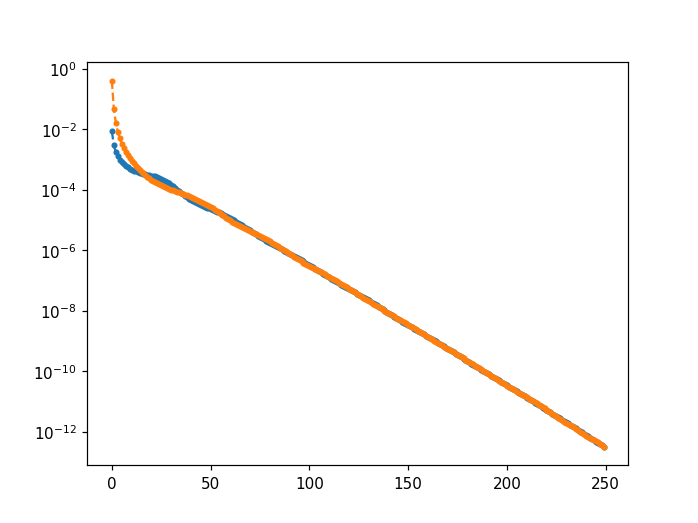

In [1243]:
plt.figure()
plt.plot(abs(Pfur_0)[1::2],'.--')
plt.plot(abs(Zfur_0)[1::2],'.--')

plt.yscale('log')

In [1245]:
Vol,Sqr = get_VolSqr(Pfur_0,Zfur_0)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.17440206345842332

In [1244]:
Pfur_0,Zfur_0 = make_constant_v_repar(Pfur_0,Zfur_0, N)

In [1246]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


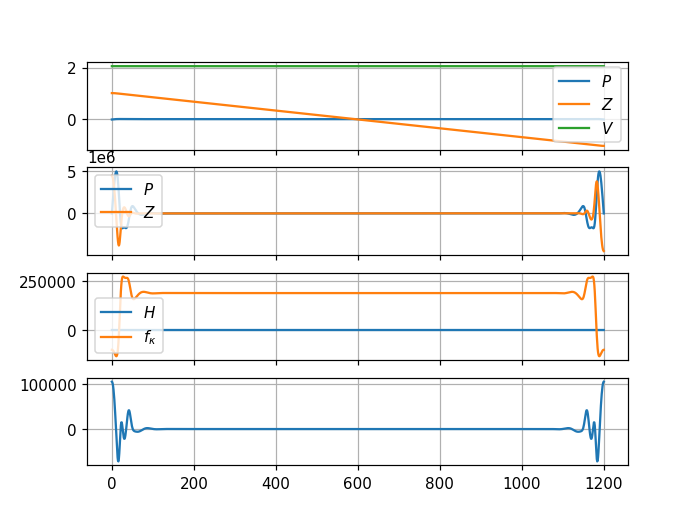

In [1247]:
fig,axs = plt.subplots(4,1, sharex=True)
axs[0].plot(P)
axs[0].plot(Z)
axs[0].plot(V)
axs[0].grid()
axs[0].legend([r'$P$',r'$Z$',r'$V$'])


axs[1].plot(P4)
axs[1].plot(Z4)
axs[1].grid()
axs[1].legend([r'$P$',r'$Z$'])


axs[2].plot(H)
axs[2].plot(force)
axs[2].legend([r'$H$',r'$f_\kappa$'])
axs[2].grid()


axs[3].plot(get_normal_velo(H,force, P,V))
axs[3].grid()

<IPython.core.display.Javascript object>


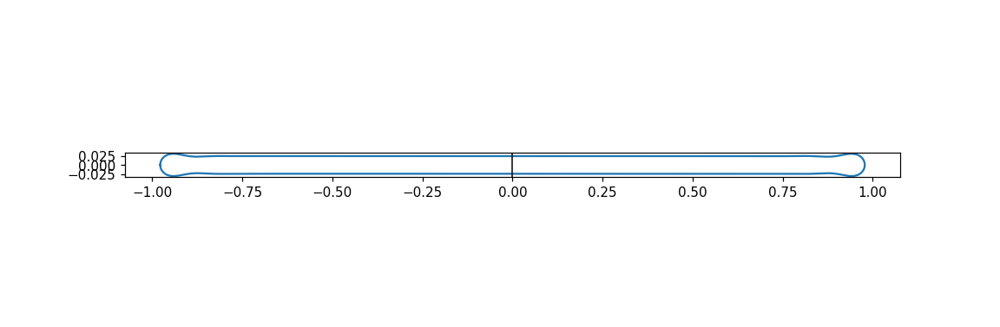

In [924]:
plt.figure()
plt.plot(np.hstack([Z[::-1],Z]),np.hstack([-P[::-1],P]))
plt.axvline(0, color='k', lw=1)
plt.axis('scaled');

<IPython.core.display.Javascript object>


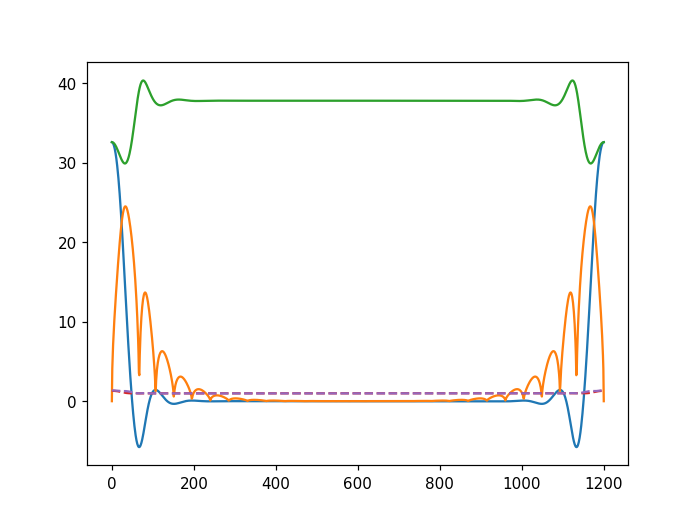

In [886]:
H1,H2 = get_H12_from_ar(Pfur_0, Zfur_0)
H1,dl_H1 = get_H1_dl_H1_from_ar(Pfur_0, Zfur_0)

#a_loc = 1/(H1**4 + dl_H1**2+H2**4)**(1/4)
r0 = P[N_int//2]
alpha=1
a_loc = 1/np.sqrt(H1**2+1/r0**2/alpha) 
a_loc /= a_loc.mean()
beta=2
alpha=5

a_loc2 = 1/(H1**4+1/r0**4/alpha+beta*dl_H1**2)**(1/4) 
a_loc2 /= a_loc2.mean()

plt.figure()
plt.plot(H1)
plt.plot(np.sqrt(abs(dl_H1)))

plt.plot(H2)
plt.plot(1/a_loc,'--')
plt.plot(1/a_loc2,'--')

In [887]:
Pfur_0,Zfur_0 = make_F_v_repar(Pfur_0,Zfur_0, a_loc2, N)

<IPython.core.display.Javascript object>


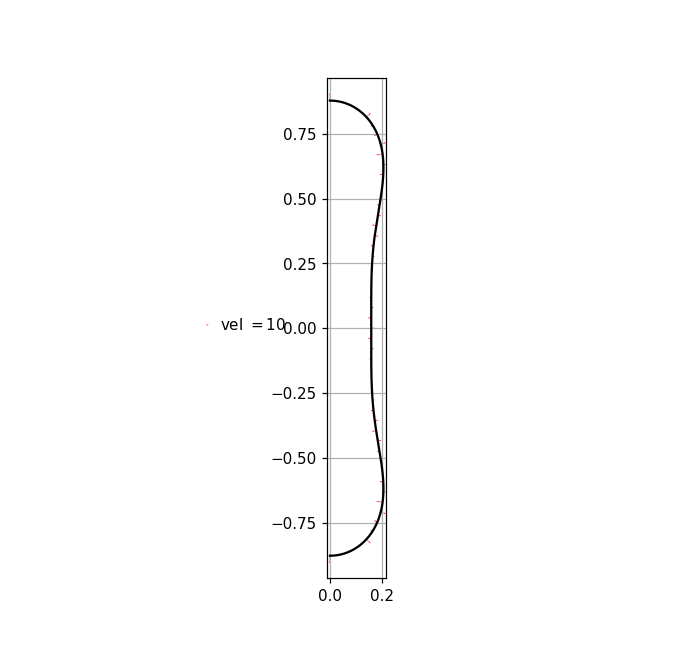

<IPython.core.display.Javascript object>


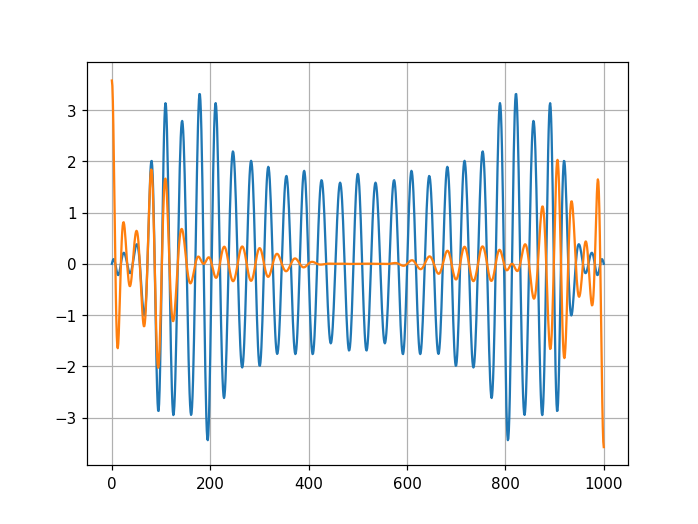

In [339]:
%matplotlib notebook
t_ = get_normal_velo_pz(Pfur_0,Zfur_0)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


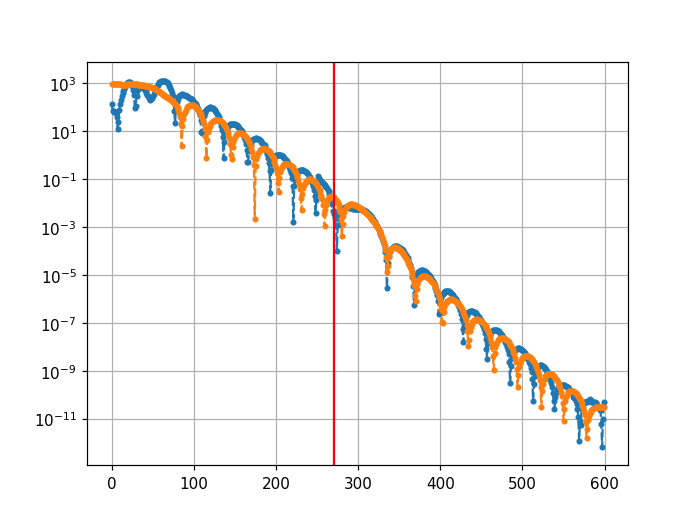

In [1248]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[0])[::2],'.--')
#plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[0])[::2],'.--')


plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[1])[1::2],'.--')
#plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[1])[1::2],'.--')
plt.axvline(N//2, color='red')
plt.yscale('log')
plt.grid()

In [642]:
%timeit get_normal_velo_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

1.46 ms ± 86.5 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [98]:
%timeit get_normal_velo_sym_fur_1d(get_pz_sym_from_PZ_fur(Pfur_0, Zfur_0))

1.56 ms ± 74.2 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


__________________________________________________

In [1249]:
N

540

In [1250]:
steps = np.logspace(-15,-4.5,N)[::-1]
j_fun = nd.Jacobian(get_normal_velo_sym_fur_1d, step=steps)

In [1251]:
jac_0 = j_fun(get_pz_sym_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-4.53e+11 5773287.334478652


<IPython.core.display.Javascript object>


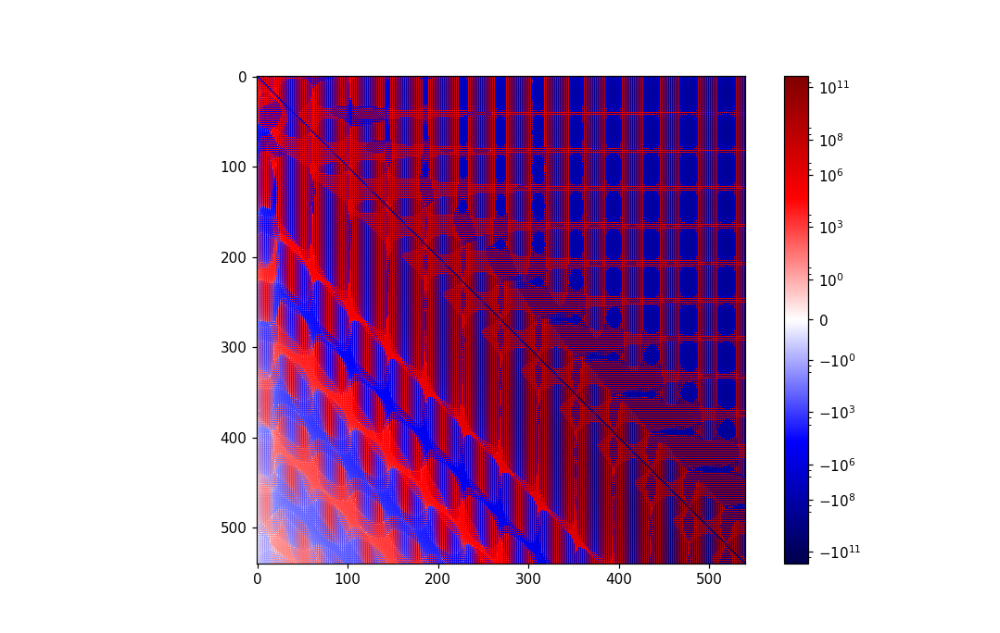

In [1252]:
import matplotlib.colors as colors
lnrwidth=1e-2
gain=np.max(abs(jac_0))

plt.figure()
#plt.title(r'$\frac{\delta ||v_l||_i}{\delta N_j}$')
plt.imshow(jac_0, norm=colors.AsinhNorm(linear_width=lnrwidth,
                                             vmin=-gain, vmax=gain), cmap='seismic')
plt.colorbar()

In [1253]:
t_max=1e-4

In [1254]:
rtol=1e-6
atol_arr = 1e-6/np.arange(1,len(get_pz_sym_from_PZ_fur(Pfur_0, Zfur_0))+1)**4

In [1255]:
atol_arr = np.logspace(-17,-6, N)[::-1]

In [1256]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 200 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_normal_velo_sym_fur_1d(pz)
jac = j_fun

In [1257]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_sym_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

0.0
[ 8.81128877e-03  4.16172339e-01  2.94307835e-03  4.61578106e-02
  1.77301714e-03  1.65571698e-02  1.27410788e-03  8.40254033e-03
  9.98901212e-04  5.04743242e-03  8.25360603e-04  3.34980697e-03
  7.06544020e-04  2.37413838e-03  6.20539741e-04  1.76268933e-03
  5.55741132e-04  1.35470571e-03  5.05420647e-04  1.06924985e-03
  4.65403474e-04  8.61962187e-04  4.32953237e-04  7.06874483e-04
  4.06190668e-04  5.87961677e-04  3.83767692e-04  4.94898281e-04
  3.64672896e-04  4.20787290e-04  3.48107810e-04  3.60879243e-04
  3.33403756e-04  3.11817072e-04  3.19963305e-04  2.71173740e-04
  3.07220254e-04  2.37159707e-04  2.94617094e-04  2.08432469e-04
  2.81603819e-04  1.83969367e-04  2.67662225e-04  1.62980716e-04
  2.52357095e-04  1.44849266e-04  2.35405967e-04  1.29087240e-04
  2.16748569e-04  1.15305348e-04  1.96588387e-04  1.03190098e-04
  1.75383386e-04  9.24869695e-05  1.53779289e-04  8.29877662e-05
  1.32502092e-04  7.45210209e-05  1.12241439e-04  6.69446309e-05
  9.35572560e-05  6.0

9.133886890258753e-10
[ 8.81143487e-03  4.16173161e-01  2.94314502e-03  4.61586317e-02
  1.77307591e-03  1.65579892e-02  1.27416510e-03  8.40335710e-03
  9.98954700e-04  5.04824598e-03  8.25404932e-04  3.35061684e-03
  7.06571920e-04  2.37494427e-03  6.20542703e-04  1.76349114e-03
  5.55709753e-04  1.35550349e-03  5.05344904e-04  1.07004383e-03
  4.65272928e-04  8.62752748e-04  4.32757267e-04  7.07662088e-04
  4.05918736e-04  5.88746875e-04  3.83409726e-04  4.95681668e-04
  3.64219857e-04  4.21569475e-04  3.47552528e-04  3.61660822e-04
  3.32742088e-04  3.12598599e-04  3.19195641e-04  2.71955701e-04
  3.06353272e-04  2.37942496e-04  2.93665528e-04  2.09216372e-04
  2.80591793e-04  1.84754543e-04  2.66623573e-04  1.63767187e-04
  2.51334069e-04  1.45636911e-04  2.34446039e-04  1.29875795e-04
  2.15899521e-04  1.16094415e-04  1.95892592e-04  1.03979161e-04
  1.74872569e-04  9.32754094e-05  1.53471049e-04  8.37748930e-05
  1.32398885e-04  7.53060979e-05  1.12331973e-04  6.77269039e-05
  9

1.3020647952417375e-08
[ 8.81385949e-03  4.16178228e-01  2.94390524e-03  4.61636887e-02
  1.77345920e-03  1.65630273e-02  1.27433380e-03  8.40836789e-03
  9.98938114e-04  5.05322210e-03  8.25189850e-04  3.35555222e-03
  7.06123702e-04  2.37983427e-03  6.19812501e-04  1.76833251e-03
  5.54637557e-04  1.36029436e-03  5.03861148e-04  1.07478356e-03
  4.63299556e-04  8.67441674e-04  4.30208972e-04  7.12301389e-04
  4.02704830e-04  5.93338299e-04  3.79437396e-04  5.00227331e-04
  3.59399506e-04  4.26071664e-04  3.41806171e-04  3.66121829e-04
  3.26015444e-04  3.17020588e-04  3.11474372e-04  2.76340607e-04
  2.97682501e-04  2.42291961e-04  2.84170386e-04  2.13531708e-04
  2.70494368e-04  1.89036734e-04  2.56249989e-04  1.68016920e-04
  2.41104842e-04  1.49854642e-04  2.24845581e-04  1.34061859e-04
  2.07426062e-04  1.20249163e-04  1.88997170e-04  1.08103131e-04
  1.69900971e-04  9.73695083e-05  1.50623047e-04  8.78405573e-05
  1.31713605e-04  7.93454269e-05  1.13699969e-04  7.17427387e-05
  

3.435981062934236e-08
[ 8.81675195e-03  4.16181028e-01  2.94452094e-03  4.61664781e-02
  1.77341222e-03  1.65657955e-02  1.27385662e-03  8.41110530e-03
  9.98109251e-04  5.05592012e-03  8.24044438e-04  3.35820358e-03
  7.04677857e-04  2.38243312e-03  6.18070383e-04  1.77087453e-03
  5.52593278e-04  1.36277673e-03  5.01498878e-04  1.07720486e-03
  4.60592993e-04  8.69801823e-04  4.27120916e-04  7.14601433e-04
  3.99187320e-04  5.95580272e-04  3.75433107e-04  5.02414076e-04
  3.54845113e-04  4.28206674e-04  3.36638644e-04  3.68209094e-04
  3.20182145e-04  3.19064465e-04  3.04947657e-04  2.78345702e-04
  2.90478533e-04  2.44263031e-04  2.76370399e-04  2.15473575e-04
  2.62264230e-04  1.90954211e-04  2.47851707e-04  1.69914758e-04
  2.32892484e-04  1.51737493e-04  2.17240023e-04  1.35934259e-04
  2.00868266e-04  1.22115547e-04  1.83887656e-04  1.09967860e-04
  1.66539739e-04  9.92369140e-05  1.49165898e-04  8.97149829e-05
  1.32155884e-04  8.12312478e-05  1.15889715e-04  7.36443569e-05
  1

5.604601943160144e-07
[ 8.81868367e-03  4.16182254e-01  2.94485308e-03  4.61676969e-02
  1.77324176e-03  1.65669995e-02  1.27334611e-03  8.41228792e-03
  9.97319020e-04  5.05707543e-03  8.23007533e-04  3.35932664e-03
  7.03416687e-04  2.38352009e-03  6.16601561e-04  1.77192269e-03
  5.50928949e-04  1.36378448e-03  4.99646720e-04  1.07817166e-03
  4.58555664e-04  8.70728114e-04  4.24895312e-04  7.15488505e-04
  3.96763918e-04  5.96430151e-04  3.72795743e-04  5.03229388e-04
  3.51971646e-04  4.28990522e-04  3.33503192e-04  3.68964941e-04
  3.16759712e-04  3.19796028e-04  3.01222012e-04  2.79056861e-04
  2.86453772e-04  2.44957746e-04  2.72085609e-04  2.16155817e-04
  2.57808761e-04  1.91627903e-04  2.43376249e-04  1.70583723e-04
  2.28609370e-04  1.52405418e-04  2.13406836e-04  1.36604671e-04
  1.97753128e-04  1.22791793e-04  1.81722117e-04  1.10653111e-04
  1.65472335e-04  9.99341655e-05  1.49231826e-04  9.04270615e-05
  1.33273130e-04  8.19608132e-05  1.17881884e-04  7.43938939e-05
  1

In [1258]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

##### Continue integrate

In [780]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))

In [781]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [782]:
t_end = 0.25

In [783]:
sol_rad = sc.integrate.solve_ivp(fun_a, (t_j, t_end), pz_start, 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

0.20030273156404524
[ 1.15017831e-03  2.16929734e-01  9.24249611e-02 -1.00148264e-01
 -2.92394875e-01  1.31678390e-01  6.91143215e-03  4.88720345e-02
 -1.52000597e-02 -1.11677880e-02 -3.29281803e-02  1.13017815e-02
  4.38392893e-03  1.90618043e-03  1.43445200e-03 -3.92507471e-03
 -3.31449322e-03 -1.74469168e-03 -5.28129795e-04  2.36856539e-03
  2.30251966e-03  1.14998724e-03  9.19432819e-04 -8.68902622e-04
 -1.11534783e-03 -1.26284561e-03 -1.23128350e-03  3.09845936e-04
  4.15273772e-04  7.53250216e-04  7.57475144e-04  6.71193679e-05
  1.26558221e-04 -3.79678233e-04 -3.13845694e-04 -2.39662773e-04
 -1.76003585e-04  8.71356855e-05  1.11951250e-04  1.01239711e-04
  1.05915076e-04  3.96477664e-05  3.38912110e-05 -4.83556084e-06
 -8.83676078e-06 -4.39197272e-05 -4.40141140e-05 -5.11752531e-05
 -4.99258440e-05  5.66415734e-06  7.01737684e-06  5.53100510e-05
  5.69527290e-05  2.84104948e-05  2.75477790e-05 -3.06137989e-05
 -3.30253911e-05 -3.86336971e-05 -3.97726217e-05  3.05040080e-06
  4.0

0.20089723543256935
[ 1.15017698e-03  2.16929734e-01  9.24249588e-02 -1.00148264e-01
 -2.92394874e-01  1.31678389e-01  6.91143137e-03  4.88720351e-02
 -1.52000601e-02 -1.11677871e-02 -3.29281812e-02  1.13017835e-02
  4.38392901e-03  1.90618098e-03  1.43445113e-03 -3.92507512e-03
 -3.31449442e-03 -1.74469149e-03 -5.28129910e-04  2.36856579e-03
  2.30251998e-03  1.14998736e-03  9.19432923e-04 -8.68902710e-04
 -1.11534792e-03 -1.26284570e-03 -1.23128358e-03  3.09845893e-04
  4.15273736e-04  7.53250216e-04  7.57475146e-04  6.71194234e-05
  1.26558274e-04 -3.79678165e-04 -3.13845627e-04 -2.39662785e-04
 -1.76003598e-04  8.71356054e-05  1.11951171e-04  1.01239675e-04
  1.05915044e-04  3.96478149e-05  3.38912633e-05 -4.83550770e-06
 -8.83670620e-06 -4.39197380e-05 -4.40141259e-05 -5.11752970e-05
 -4.99258888e-05  5.66414196e-06  7.01736223e-06  5.53100712e-05
  5.69527503e-05  2.84105159e-05  2.75478000e-05 -3.06137983e-05
 -3.30253913e-05 -3.86337096e-05 -3.97726345e-05  3.05039085e-06
  4.0

0.20157751960104647
[ 1.15017547e-03  2.16929735e-01  9.24249561e-02 -1.00148265e-01
 -2.92394874e-01  1.31678387e-01  6.91143049e-03  4.88720357e-02
 -1.52000607e-02 -1.11677861e-02 -3.29281822e-02  1.13017856e-02
  4.38392909e-03  1.90618160e-03  1.43445016e-03 -3.92507558e-03
 -3.31449576e-03 -1.74469127e-03 -5.28130039e-04  2.36856624e-03
  2.30252034e-03  1.14998750e-03  9.19433041e-04 -8.68902810e-04
 -1.11534803e-03 -1.26284581e-03 -1.23128368e-03  3.09845844e-04
  4.15273695e-04  7.53250216e-04  7.57475149e-04  6.71194861e-05
  1.26558335e-04 -3.79678088e-04 -3.13845552e-04 -2.39662799e-04
 -1.76003612e-04  8.71355152e-05  1.11951081e-04  1.01239635e-04
  1.05915008e-04  3.96478696e-05  3.38913223e-05 -4.83544780e-06
 -8.83664466e-06 -4.39197502e-05 -4.40141392e-05 -5.11753465e-05
 -4.99259392e-05  5.66412463e-06  7.01734577e-06  5.53100940e-05
  5.69527743e-05  2.84105396e-05  2.75478236e-05 -3.06137977e-05
 -3.30253915e-05 -3.86337237e-05 -3.97726489e-05  3.05037964e-06
  4.0

0.20205658519157116
[ 1.15017442e-03  2.16929735e-01  9.24249543e-02 -1.00148265e-01
 -2.92394873e-01  1.31678386e-01  6.91142987e-03  4.88720361e-02
 -1.52000610e-02 -1.11677854e-02 -3.29281829e-02  1.13017872e-02
  4.38392915e-03  1.90618203e-03  1.43444948e-03 -3.92507591e-03
 -3.31449670e-03 -1.74469112e-03 -5.28130129e-04  2.36856656e-03
  2.30252060e-03  1.14998760e-03  9.19433122e-04 -8.68902880e-04
 -1.11534811e-03 -1.26284588e-03 -1.23128375e-03  3.09845811e-04
  4.15273666e-04  7.53250216e-04  7.57475150e-04  6.71195296e-05
  1.26558376e-04 -3.79678034e-04 -3.13845500e-04 -2.39662808e-04
 -1.76003622e-04  8.71354524e-05  1.11951019e-04  1.01239608e-04
  1.05914983e-04  3.96479076e-05  3.38913633e-05 -4.83540618e-06
 -8.83660191e-06 -4.39197586e-05 -4.40141485e-05 -5.11753808e-05
 -4.99259742e-05  5.66411258e-06  7.01733433e-06  5.53101099e-05
  5.69527910e-05  2.84105561e-05  2.75478400e-05 -3.06137973e-05
 -3.30253917e-05 -3.86337335e-05 -3.97726589e-05  3.05037185e-06
  4.0

0.20270885277954573
[ 1.15017302e-03  2.16929736e-01  9.24249518e-02 -1.00148265e-01
 -2.92394872e-01  1.31678385e-01  6.91142905e-03  4.88720366e-02
 -1.52000615e-02 -1.11677845e-02 -3.29281838e-02  1.13017892e-02
  4.38392923e-03  1.90618261e-03  1.43444858e-03 -3.92507634e-03
 -3.31449796e-03 -1.74469092e-03 -5.28130250e-04  2.36856698e-03
  2.30252093e-03  1.14998773e-03  9.19433232e-04 -8.68902973e-04
 -1.11534821e-03 -1.26284597e-03 -1.23128384e-03  3.09845765e-04
  4.15273628e-04  7.53250216e-04  7.57475152e-04  6.71195881e-05
  1.26558432e-04 -3.79677962e-04 -3.13845430e-04 -2.39662821e-04
 -1.76003636e-04  8.71353681e-05  1.11950936e-04  1.01239570e-04
  1.05914949e-04  3.96479586e-05  3.38914184e-05 -4.83535026e-06
 -8.83654447e-06 -4.39197700e-05 -4.40141610e-05 -5.11754270e-05
 -4.99260213e-05  5.66409639e-06  7.01731895e-06  5.53101312e-05
  5.69528134e-05  2.84105782e-05  2.75478620e-05 -3.06137968e-05
 -3.30253919e-05 -3.86337467e-05 -3.97726723e-05  3.05036139e-06
  4.0

0.20320947968127062
[ 1.15017195e-03  2.16929736e-01  9.24249500e-02 -1.00148266e-01
 -2.92394872e-01  1.31678384e-01  6.91142843e-03  4.88720371e-02
 -1.52000619e-02 -1.11677838e-02 -3.29281845e-02  1.13017908e-02
  4.38392929e-03  1.90618305e-03  1.43444789e-03 -3.92507667e-03
 -3.31449891e-03 -1.74469077e-03 -5.28130341e-04  2.36856730e-03
  2.30252119e-03  1.14998782e-03  9.19433315e-04 -8.68903043e-04
 -1.11534829e-03 -1.26284605e-03 -1.23128391e-03  3.09845731e-04
  4.15273600e-04  7.53250216e-04  7.57475154e-04  6.71196323e-05
  1.26558475e-04 -3.79677907e-04 -3.13845377e-04 -2.39662831e-04
 -1.76003646e-04  8.71353043e-05  1.11950873e-04  1.01239542e-04
  1.05914923e-04  3.96479973e-05  3.38914601e-05 -4.83530791e-06
 -8.83650097e-06 -4.39197786e-05 -4.40141705e-05 -5.11754620e-05
 -4.99260570e-05  5.66408414e-06  7.01730731e-06  5.53101473e-05
  5.69528303e-05  2.84105950e-05  2.75478787e-05 -3.06137963e-05
 -3.30253920e-05 -3.86337567e-05 -3.97726825e-05  3.05035346e-06
  4.0

0.20386090767623136
[ 1.15017058e-03  2.16929737e-01  9.24249476e-02 -1.00148266e-01
 -2.92394871e-01  1.31678383e-01  6.91142763e-03  4.88720376e-02
 -1.52000623e-02 -1.11677829e-02 -3.29281854e-02  1.13017927e-02
  4.38392936e-03  1.90618361e-03  1.43444700e-03 -3.92507709e-03
 -3.31450013e-03 -1.74469057e-03 -5.28130459e-04  2.36856771e-03
  2.30252152e-03  1.14998795e-03  9.19433421e-04 -8.68903134e-04
 -1.11534838e-03 -1.26284614e-03 -1.23128400e-03  3.09845687e-04
  4.15273562e-04  7.53250216e-04  7.57475156e-04  6.71196892e-05
  1.26558529e-04 -3.79677837e-04 -3.13845309e-04 -2.39662844e-04
 -1.76003659e-04  8.71352224e-05  1.11950792e-04  1.01239506e-04
  1.05914890e-04  3.96480469e-05  3.38915136e-05 -4.83525354e-06
 -8.83644512e-06 -4.39197896e-05 -4.40141826e-05 -5.11755069e-05
 -4.99261028e-05  5.66406840e-06  7.01729237e-06  5.53101681e-05
  5.69528521e-05  2.84106165e-05  2.75479001e-05 -3.06137958e-05
 -3.30253922e-05 -3.86337695e-05 -3.97726955e-05  3.05034329e-06
  4.0

0.20448526469569964
[ 1.15016929e-03  2.16929737e-01  9.24249453e-02 -1.00148267e-01
 -2.92394870e-01  1.31678382e-01  6.91142687e-03  4.88720381e-02
 -1.52000628e-02 -1.11677821e-02 -3.29281863e-02  1.13017946e-02
  4.38392943e-03  1.90618414e-03  1.43444617e-03 -3.92507749e-03
 -3.31450129e-03 -1.74469039e-03 -5.28130570e-04  2.36856809e-03
  2.30252183e-03  1.14998807e-03  9.19433522e-04 -8.68903219e-04
 -1.11534848e-03 -1.26284623e-03 -1.23128408e-03  3.09845645e-04
  4.15273528e-04  7.53250215e-04  7.57475157e-04  6.71197429e-05
  1.26558581e-04 -3.79677771e-04 -3.13845245e-04 -2.39662856e-04
 -1.76003672e-04  8.71351450e-05  1.11950715e-04  1.01239472e-04
  1.05914859e-04  3.96480938e-05  3.38915642e-05 -4.83520220e-06
 -8.83639239e-06 -4.39198000e-05 -4.40141941e-05 -5.11755493e-05
 -4.99261460e-05  5.66405354e-06  7.01727826e-06  5.53101876e-05
  5.69528727e-05  2.84106368e-05  2.75479203e-05 -3.06137953e-05
 -3.30253924e-05 -3.86337816e-05 -3.97727079e-05  3.05033368e-06
  4.0

0.20500116421076373
[ 1.15016824e-03  2.16929738e-01  9.24249435e-02 -1.00148267e-01
 -2.92394870e-01  1.31678381e-01  6.91142626e-03  4.88720385e-02
 -1.52000631e-02 -1.11677814e-02 -3.29281870e-02  1.13017962e-02
  4.38392949e-03  1.90618458e-03  1.43444549e-03 -3.92507781e-03
 -3.31450223e-03 -1.74469024e-03 -5.28130660e-04  2.36856841e-03
  2.30252208e-03  1.14998817e-03  9.19433604e-04 -8.68903289e-04
 -1.11534855e-03 -1.26284630e-03 -1.23128415e-03  3.09845611e-04
  4.15273499e-04  7.53250215e-04  7.57475159e-04  6.71197866e-05
  1.26558623e-04 -3.79677717e-04 -3.13845192e-04 -2.39662865e-04
 -1.76003682e-04  8.71350819e-05  1.11950653e-04  1.01239444e-04
  1.05914834e-04  3.96481320e-05  3.38916054e-05 -4.83516034e-06
 -8.83634939e-06 -4.39198085e-05 -4.40142034e-05 -5.11755838e-05
 -4.99261812e-05  5.66404143e-06  7.01726675e-06  5.53102036e-05
  5.69528894e-05  2.84106534e-05  2.75479368e-05 -3.06137948e-05
 -3.30253926e-05 -3.86337915e-05 -3.97727179e-05  3.05032584e-06
  4.0

0.2055515355154395
[ 1.15016713e-03  2.16929738e-01  9.24249415e-02 -1.00148267e-01
 -2.92394869e-01  1.31678380e-01  6.91142561e-03  4.88720390e-02
 -1.52000635e-02 -1.11677807e-02 -3.29281877e-02  1.13017978e-02
  4.38392955e-03  1.90618503e-03  1.43444477e-03 -3.92507816e-03
 -3.31450322e-03 -1.74469008e-03 -5.28130755e-04  2.36856874e-03
  2.30252235e-03  1.14998827e-03  9.19433690e-04 -8.68903363e-04
 -1.11534863e-03 -1.26284637e-03 -1.23128422e-03  3.09845575e-04
  4.15273469e-04  7.53250215e-04  7.57475161e-04  6.71198328e-05
  1.26558667e-04 -3.79677660e-04 -3.13845137e-04 -2.39662875e-04
 -1.76003692e-04  8.71350154e-05  1.11950587e-04  1.01239414e-04
  1.05914807e-04  3.96481723e-05  3.38916488e-05 -4.83511624e-06
 -8.83630408e-06 -4.39198175e-05 -4.40142133e-05 -5.11756203e-05
 -4.99262184e-05  5.66402866e-06  7.01725463e-06  5.53102204e-05
  5.69529071e-05  2.84106708e-05  2.75479542e-05 -3.06137944e-05
 -3.30253927e-05 -3.86338019e-05 -3.97727285e-05  3.05031759e-06
  4.08

0.20611958235814526
[ 1.15016600e-03  2.16929738e-01  9.24249396e-02 -1.00148268e-01
 -2.92394869e-01  1.31678379e-01  6.91142494e-03  4.88720394e-02
 -1.52000639e-02 -1.11677799e-02 -3.29281885e-02  1.13017994e-02
  4.38392962e-03  1.90618550e-03  1.43444404e-03 -3.92507850e-03
 -3.31450423e-03 -1.74468992e-03 -5.28130852e-04  2.36856908e-03
  2.30252262e-03  1.14998837e-03  9.19433778e-04 -8.68903438e-04
 -1.11534872e-03 -1.26284645e-03 -1.23128429e-03  3.09845539e-04
  4.15273438e-04  7.53250215e-04  7.57475162e-04  6.71198797e-05
  1.26558712e-04 -3.79677602e-04 -3.13845081e-04 -2.39662886e-04
 -1.76003703e-04  8.71349477e-05  1.11950520e-04  1.01239384e-04
  1.05914780e-04  3.96482133e-05  3.38916931e-05 -4.83507130e-06
 -8.83625793e-06 -4.39198266e-05 -4.40142233e-05 -5.11756574e-05
 -4.99262562e-05  5.66401566e-06  7.01724228e-06  5.53102375e-05
  5.69529251e-05  2.84106886e-05  2.75479719e-05 -3.06137939e-05
 -3.30253929e-05 -3.86338125e-05 -3.97727393e-05  3.05030918e-06
  4.0

0.2066820903279255
[ 1.15016489e-03  2.16929739e-01  9.24249376e-02 -1.00148268e-01
 -2.92394868e-01  1.31678378e-01  6.91142430e-03  4.88720399e-02
 -1.52000643e-02 -1.11677792e-02 -3.29281892e-02  1.13018010e-02
  4.38392968e-03  1.90618595e-03  1.43444333e-03 -3.92507885e-03
 -3.31450522e-03 -1.74468976e-03 -5.28130947e-04  2.36856941e-03
  2.30252288e-03  1.14998848e-03  9.19433864e-04 -8.68903511e-04
 -1.11534880e-03 -1.26284652e-03 -1.23128437e-03  3.09845503e-04
  4.15273408e-04  7.53250215e-04  7.57475164e-04  6.71199257e-05
  1.26558756e-04 -3.79677545e-04 -3.13845026e-04 -2.39662896e-04
 -1.76003714e-04  8.71348815e-05  1.11950455e-04  1.01239355e-04
  1.05914753e-04  3.96482534e-05  3.38917363e-05 -4.83502739e-06
 -8.83621282e-06 -4.39198355e-05 -4.40142331e-05 -5.11756936e-05
 -4.99262932e-05  5.66400295e-06  7.01723021e-06  5.53102542e-05
  5.69529427e-05  2.84107060e-05  2.75479892e-05 -3.06137935e-05
 -3.30253931e-05 -3.86338228e-05 -3.97727499e-05  3.05030096e-06
  4.08

0.20724651228370716
[ 1.15016380e-03  2.16929739e-01  9.24249357e-02 -1.00148268e-01
 -2.92394868e-01  1.31678377e-01  6.91142366e-03  4.88720403e-02
 -1.52000646e-02 -1.11677785e-02 -3.29281899e-02  1.13018026e-02
  4.38392974e-03  1.90618640e-03  1.43444262e-03 -3.92507918e-03
 -3.31450619e-03 -1.74468960e-03 -5.28131041e-04  2.36856974e-03
  2.30252315e-03  1.14998858e-03  9.19433949e-04 -8.68903583e-04
 -1.11534887e-03 -1.26284660e-03 -1.23128444e-03  3.09845468e-04
  4.15273379e-04  7.53250215e-04  7.57475165e-04  6.71199711e-05
  1.26558800e-04 -3.79677489e-04 -3.13844971e-04 -2.39662906e-04
 -1.76003724e-04  8.71348160e-05  1.11950390e-04  1.01239326e-04
  1.05914727e-04  3.96482931e-05  3.38917792e-05 -4.83498390e-06
 -8.83616815e-06 -4.39198444e-05 -4.40142428e-05 -5.11757295e-05
 -4.99263298e-05  5.66399036e-06  7.01721825e-06  5.53102708e-05
  5.69529601e-05  2.84107232e-05  2.75480063e-05 -3.06137931e-05
 -3.30253932e-05 -3.86338331e-05 -3.97727603e-05  3.05029282e-06
  4.0

0.20783595203760558
[ 1.15016267e-03  2.16929739e-01  9.24249337e-02 -1.00148269e-01
 -2.92394867e-01  1.31678376e-01  6.91142300e-03  4.88720408e-02
 -1.52000650e-02 -1.11677777e-02 -3.29281906e-02  1.13018042e-02
  4.38392980e-03  1.90618687e-03  1.43444189e-03 -3.92507953e-03
 -3.31450720e-03 -1.74468944e-03 -5.28131138e-04  2.36857008e-03
  2.30252342e-03  1.14998868e-03  9.19434037e-04 -8.68903658e-04
 -1.11534896e-03 -1.26284667e-03 -1.23128451e-03  3.09845432e-04
  4.15273348e-04  7.53250215e-04  7.57475167e-04  6.71200180e-05
  1.26558845e-04 -3.79677431e-04 -3.13844915e-04 -2.39662916e-04
 -1.76003735e-04  8.71347484e-05  1.11950323e-04  1.01239296e-04
  1.05914699e-04  3.96483340e-05  3.38918233e-05 -4.83493910e-06
 -8.83612212e-06 -4.39198535e-05 -4.40142528e-05 -5.11757665e-05
 -4.99263675e-05  5.66397739e-06  7.01720594e-06  5.53102879e-05
  5.69529780e-05  2.84107410e-05  2.75480240e-05 -3.06137926e-05
 -3.30253934e-05 -3.86338436e-05 -3.97727711e-05  3.05028444e-06
  4.0

0.20839132782338626
[ 1.15016162e-03  2.16929740e-01  9.24249319e-02 -1.00148269e-01
 -2.92394866e-01  1.31678376e-01  6.91142238e-03  4.88720412e-02
 -1.52000654e-02 -1.11677771e-02 -3.29281913e-02  1.13018058e-02
  4.38392986e-03  1.90618730e-03  1.43444121e-03 -3.92507985e-03
 -3.31450814e-03 -1.74468929e-03 -5.28131228e-04  2.36857039e-03
  2.30252367e-03  1.14998878e-03  9.19434118e-04 -8.68903727e-04
 -1.11534903e-03 -1.26284675e-03 -1.23128458e-03  3.09845398e-04
  4.15273320e-04  7.53250215e-04  7.57475169e-04  6.71200615e-05
  1.26558887e-04 -3.79677378e-04 -3.13844863e-04 -2.39662926e-04
 -1.76003745e-04  8.71346856e-05  1.11950261e-04  1.01239269e-04
  1.05914674e-04  3.96483720e-05  3.38918643e-05 -4.83489744e-06
 -8.83607933e-06 -4.39198619e-05 -4.40142621e-05 -5.11758009e-05
 -4.99264026e-05  5.66396533e-06  7.01719449e-06  5.53103038e-05
  5.69529947e-05  2.84107574e-05  2.75480404e-05 -3.06137922e-05
 -3.30253936e-05 -3.86338535e-05 -3.97727811e-05  3.05027664e-06
  4.0

0.20893792894793173
[ 1.15016061e-03  2.16929740e-01  9.24249301e-02 -1.00148269e-01
 -2.92394866e-01  1.31678375e-01  6.91142179e-03  4.88720416e-02
 -1.52000657e-02 -1.11677764e-02 -3.29281920e-02  1.13018072e-02
  4.38392991e-03  1.90618772e-03  1.43444056e-03 -3.92508017e-03
 -3.31450905e-03 -1.74468914e-03 -5.28131315e-04  2.36857069e-03
  2.30252391e-03  1.14998887e-03  9.19434198e-04 -8.68903795e-04
 -1.11534911e-03 -1.26284681e-03 -1.23128464e-03  3.09845365e-04
  4.15273292e-04  7.53250215e-04  7.57475170e-04  6.71201039e-05
  1.26558927e-04 -3.79677325e-04 -3.13844812e-04 -2.39662935e-04
 -1.76003755e-04  8.71346246e-05  1.11950201e-04  1.01239242e-04
  1.05914650e-04  3.96484089e-05  3.38919042e-05 -4.83485697e-06
 -8.83603776e-06 -4.39198701e-05 -4.40142712e-05 -5.11758344e-05
 -4.99264367e-05  5.66395362e-06  7.01718336e-06  5.53103192e-05
  5.69530109e-05  2.84107735e-05  2.75480563e-05 -3.06137918e-05
 -3.30253937e-05 -3.86338630e-05 -3.97727908e-05  3.05026907e-06
  4.0

0.20953922255684237
[ 1.15015950e-03  2.16929741e-01  9.24249282e-02 -1.00148270e-01
 -2.92394865e-01  1.31678374e-01  6.91142114e-03  4.88720420e-02
 -1.52000661e-02 -1.11677757e-02 -3.29281927e-02  1.13018088e-02
  4.38392998e-03  1.90618817e-03  1.43443984e-03 -3.92508051e-03
 -3.31451004e-03 -1.74468898e-03 -5.28131410e-04  2.36857102e-03
  2.30252418e-03  1.14998897e-03  9.19434284e-04 -8.68903868e-04
 -1.11534919e-03 -1.26284689e-03 -1.23128472e-03  3.09845329e-04
  4.15273262e-04  7.53250214e-04  7.57475172e-04  6.71201498e-05
  1.26558971e-04 -3.79677269e-04 -3.13844757e-04 -2.39662945e-04
 -1.76003765e-04  8.71345584e-05  1.11950136e-04  1.01239212e-04
  1.05914623e-04  3.96484491e-05  3.38919475e-05 -4.83481303e-06
 -8.83599263e-06 -4.39198791e-05 -4.40142810e-05 -5.11758706e-05
 -4.99264736e-05  5.66394090e-06  7.01717128e-06  5.53103359e-05
  5.69530285e-05  2.84107909e-05  2.75480736e-05 -3.06137913e-05
 -3.30253939e-05 -3.86338734e-05 -3.97728014e-05  3.05026084e-06
  4.0

0.21013244794001562
[ 1.15015843e-03  2.16929741e-01  9.24249263e-02 -1.00148270e-01
 -2.92394865e-01  1.31678373e-01  6.91142051e-03  4.88720424e-02
 -1.52000665e-02 -1.11677750e-02 -3.29281934e-02  1.13018104e-02
  4.38393004e-03  1.90618862e-03  1.43443915e-03 -3.92508084e-03
 -3.31451100e-03 -1.74468883e-03 -5.28131502e-04  2.36857135e-03
  2.30252444e-03  1.14998907e-03  9.19434367e-04 -8.68903939e-04
 -1.11534926e-03 -1.26284696e-03 -1.23128479e-03  3.09845295e-04
  4.15273233e-04  7.53250214e-04  7.57475173e-04  6.71201945e-05
  1.26559014e-04 -3.79677213e-04 -3.13844703e-04 -2.39662955e-04
 -1.76003776e-04  8.71344940e-05  1.11950072e-04  1.01239184e-04
  1.05914597e-04  3.96484881e-05  3.38919896e-05 -4.83477029e-06
 -8.83594872e-06 -4.39198877e-05 -4.40142905e-05 -5.11759059e-05
 -4.99265096e-05  5.66392853e-06  7.01715954e-06  5.53103522e-05
  5.69530456e-05  2.84108078e-05  2.75480905e-05 -3.06137909e-05
 -3.30253940e-05 -3.86338834e-05 -3.97728117e-05  3.05025285e-06
  4.0

0.2106365173210935
[ 1.15015752e-03  2.16929741e-01  9.24249247e-02 -1.00148270e-01
 -2.92394864e-01  1.31678372e-01  6.91141998e-03  4.88720428e-02
 -1.52000668e-02 -1.11677744e-02 -3.29281940e-02  1.13018117e-02
  4.38393009e-03  1.90618899e-03  1.43443856e-03 -3.92508112e-03
 -3.31451180e-03 -1.74468870e-03 -5.28131580e-04  2.36857162e-03
  2.30252465e-03  1.14998916e-03  9.19434438e-04 -8.68903999e-04
 -1.11534933e-03 -1.26284702e-03 -1.23128484e-03  3.09845266e-04
  4.15273209e-04  7.53250214e-04  7.57475174e-04  6.71202320e-05
  1.26559050e-04 -3.79677167e-04 -3.13844658e-04 -2.39662964e-04
 -1.76003784e-04  8.71344399e-05  1.11950018e-04  1.01239160e-04
  1.05914575e-04  3.96485208e-05  3.38920249e-05 -4.83473443e-06
 -8.83591189e-06 -4.39198950e-05 -4.40142985e-05 -5.11759355e-05
 -4.99265398e-05  5.66391815e-06  7.01714968e-06  5.53103659e-05
  5.69530600e-05  2.84108220e-05  2.75481046e-05 -3.06137905e-05
 -3.30253942e-05 -3.86338919e-05 -3.97728203e-05  3.05024613e-06
  4.08

0.2112678379300923
[ 1.15015641e-03  2.16929742e-01  9.24249228e-02 -1.00148271e-01
 -2.92394864e-01  1.31678371e-01  6.91141933e-03  4.88720432e-02
 -1.52000672e-02 -1.11677736e-02 -3.29281948e-02  1.13018133e-02
  4.38393015e-03  1.90618945e-03  1.43443784e-03 -3.92508146e-03
 -3.31451280e-03 -1.74468854e-03 -5.28131675e-04  2.36857195e-03
  2.30252492e-03  1.14998926e-03  9.19434524e-04 -8.68904073e-04
 -1.11534941e-03 -1.26284710e-03 -1.23128492e-03  3.09845230e-04
  4.15273179e-04  7.53250214e-04  7.57475176e-04  6.71202783e-05
  1.26559095e-04 -3.79677110e-04 -3.13844603e-04 -2.39662974e-04
 -1.76003795e-04  8.71343731e-05  1.11949952e-04  1.01239130e-04
  1.05914548e-04  3.96485613e-05  3.38920685e-05 -4.83469011e-06
 -8.83586636e-06 -4.39199040e-05 -4.40143084e-05 -5.11759721e-05
 -4.99265771e-05  5.66390533e-06  7.01713750e-06  5.53103828e-05
  5.69530777e-05  2.84108395e-05  2.75481221e-05 -3.06137901e-05
 -3.30253943e-05 -3.86339024e-05 -3.97728309e-05  3.05023784e-06
  4.08

0.2118341410741186
[ 1.15015542e-03  2.16929742e-01  9.24249210e-02 -1.00148271e-01
 -2.92394863e-01  1.31678370e-01  6.91141876e-03  4.88720436e-02
 -1.52000675e-02 -1.11677730e-02 -3.29281954e-02  1.13018148e-02
  4.38393020e-03  1.90618985e-03  1.43443721e-03 -3.92508177e-03
 -3.31451368e-03 -1.74468840e-03 -5.28131760e-04  2.36857225e-03
  2.30252516e-03  1.14998935e-03  9.19434601e-04 -8.68904138e-04
 -1.11534948e-03 -1.26284717e-03 -1.23128498e-03  3.09845198e-04
  4.15273152e-04  7.53250214e-04  7.57475178e-04  6.71203193e-05
  1.26559134e-04 -3.79677059e-04 -3.13844554e-04 -2.39662983e-04
 -1.76003804e-04  8.71343140e-05  1.11949894e-04  1.01239104e-04
  1.05914525e-04  3.96485971e-05  3.38921071e-05 -4.83465091e-06
 -8.83582609e-06 -4.39199120e-05 -4.40143172e-05 -5.11760045e-05
 -4.99266101e-05  5.66389398e-06  7.01712672e-06  5.53103977e-05
  5.69530934e-05  2.84108550e-05  2.75481375e-05 -3.06137897e-05
 -3.30253945e-05 -3.86339116e-05 -3.97728404e-05  3.05023050e-06
  4.08

0.212395864772362
[ 1.15015446e-03  2.16929742e-01  9.24249193e-02 -1.00148271e-01
 -2.92394863e-01  1.31678369e-01  6.91141819e-03  4.88720440e-02
 -1.52000678e-02 -1.11677723e-02 -3.29281961e-02  1.13018162e-02
  4.38393026e-03  1.90619025e-03  1.43443658e-03 -3.92508206e-03
 -3.31451454e-03 -1.74468826e-03 -5.28131843e-04  2.36857253e-03
  2.30252539e-03  1.14998944e-03  9.19434676e-04 -8.68904202e-04
 -1.11534955e-03 -1.26284723e-03 -1.23128504e-03  3.09845167e-04
  4.15273126e-04  7.53250214e-04  7.57475179e-04  6.71203595e-05
  1.26559173e-04 -3.79677010e-04 -3.13844506e-04 -2.39662992e-04
 -1.76003814e-04  8.71342562e-05  1.11949837e-04  1.01239079e-04
  1.05914501e-04  3.96486321e-05  3.38921449e-05 -4.83461253e-06
 -8.83578667e-06 -4.39199198e-05 -4.40143258e-05 -5.11760362e-05
 -4.99266425e-05  5.66388287e-06  7.01711617e-06  5.53104123e-05
  5.69531088e-05  2.84108702e-05  2.75481526e-05 -3.06137893e-05
 -3.30253946e-05 -3.86339206e-05 -3.97728496e-05  3.05022332e-06
  4.086

0.21298486414523
[ 1.15015346e-03  2.16929743e-01  9.24249176e-02 -1.00148272e-01
 -2.92394862e-01  1.31678369e-01  6.91141761e-03  4.88720444e-02
 -1.52000682e-02 -1.11677717e-02 -3.29281967e-02  1.13018176e-02
  4.38393031e-03  1.90619066e-03  1.43443594e-03 -3.92508237e-03
 -3.31451544e-03 -1.74468812e-03 -5.28131928e-04  2.36857283e-03
  2.30252563e-03  1.14998953e-03  9.19434754e-04 -8.68904268e-04
 -1.11534962e-03 -1.26284730e-03 -1.23128511e-03  3.09845134e-04
  4.15273099e-04  7.53250214e-04  7.57475180e-04  6.71204010e-05
  1.26559213e-04 -3.79676959e-04 -3.13844456e-04 -2.39663001e-04
 -1.76003823e-04  8.71341963e-05  1.11949778e-04  1.01239052e-04
  1.05914477e-04  3.96486683e-05  3.38921840e-05 -4.83457282e-06
 -8.83574588e-06 -4.39199278e-05 -4.40143346e-05 -5.11760690e-05
 -4.99266759e-05  5.66387138e-06  7.01710526e-06  5.53104275e-05
  5.69531247e-05  2.84108860e-05  2.75481683e-05 -3.06137889e-05
 -3.30253948e-05 -3.86339300e-05 -3.97728591e-05  3.05021589e-06
  4.0863

0.21374025911877997
[ 1.15015220e-03  2.16929743e-01  9.24249154e-02 -1.00148272e-01
 -2.92394861e-01  1.31678368e-01  6.91141687e-03  4.88720449e-02
 -1.52000686e-02 -1.11677709e-02 -3.29281976e-02  1.13018195e-02
  4.38393038e-03  1.90619118e-03  1.43443512e-03 -3.92508276e-03
 -3.31451656e-03 -1.74468794e-03 -5.28132037e-04  2.36857321e-03
  2.30252593e-03  1.14998965e-03  9.19434852e-04 -8.68904352e-04
 -1.11534971e-03 -1.26284738e-03 -1.23128519e-03  3.09845094e-04
  4.15273065e-04  7.53250214e-04  7.57475182e-04  6.71204534e-05
  1.26559263e-04 -3.79676894e-04 -3.13844393e-04 -2.39663013e-04
 -1.76003835e-04  8.71341208e-05  1.11949703e-04  1.01239019e-04
  1.05914447e-04  3.96487141e-05  3.38922334e-05 -4.83452269e-06
 -8.83569439e-06 -4.39199380e-05 -4.40143458e-05 -5.11761104e-05
 -4.99267181e-05  5.66385687e-06  7.01709148e-06  5.53104466e-05
  5.69531448e-05  2.84109058e-05  2.75481880e-05 -3.06137884e-05
 -3.30253949e-05 -3.86339418e-05 -3.97728712e-05  3.05020651e-06
  4.0

0.2142432188335199
[ 1.15015137e-03  2.16929743e-01  9.24249139e-02 -1.00148272e-01
 -2.92394861e-01  1.31678367e-01  6.91141638e-03  4.88720453e-02
 -1.52000689e-02 -1.11677703e-02 -3.29281981e-02  1.13018207e-02
  4.38393043e-03  1.90619152e-03  1.43443459e-03 -3.92508302e-03
 -3.31451730e-03 -1.74468782e-03 -5.28132108e-04  2.36857346e-03
  2.30252613e-03  1.14998972e-03  9.19434917e-04 -8.68904406e-04
 -1.11534977e-03 -1.26284744e-03 -1.23128524e-03  3.09845067e-04
  4.15273042e-04  7.53250214e-04  7.57475183e-04  6.71204878e-05
  1.26559296e-04 -3.79676852e-04 -3.13844352e-04 -2.39663020e-04
 -1.76003843e-04  8.71340712e-05  1.11949654e-04  1.01238997e-04
  1.05914427e-04  3.96487441e-05  3.38922658e-05 -4.83448980e-06
 -8.83566060e-06 -4.39199447e-05 -4.40143532e-05 -5.11761376e-05
 -4.99267458e-05  5.66384735e-06  7.01708244e-06  5.53104591e-05
  5.69531579e-05  2.84109188e-05  2.75482010e-05 -3.06137881e-05
 -3.30253951e-05 -3.86339496e-05 -3.97728791e-05  3.05020035e-06
  4.08

0.2147628897944173
[ 1.15015053e-03  2.16929744e-01  9.24249124e-02 -1.00148273e-01
 -2.92394861e-01  1.31678366e-01  6.91141589e-03  4.88720456e-02
 -1.52000692e-02 -1.11677698e-02 -3.29281987e-02  1.13018219e-02
  4.38393047e-03  1.90619187e-03  1.43443404e-03 -3.92508328e-03
 -3.31451806e-03 -1.74468770e-03 -5.28132180e-04  2.36857371e-03
  2.30252633e-03  1.14998980e-03  9.19434983e-04 -8.68904462e-04
 -1.11534983e-03 -1.26284750e-03 -1.23128530e-03  3.09845040e-04
  4.15273019e-04  7.53250214e-04  7.57475185e-04  6.71205229e-05
  1.26559330e-04 -3.79676808e-04 -3.13844310e-04 -2.39663028e-04
 -1.76003851e-04  8.71340206e-05  1.11949604e-04  1.01238975e-04
  1.05914406e-04  3.96487748e-05  3.38922989e-05 -4.83445622e-06
 -8.83562611e-06 -4.39199515e-05 -4.40143607e-05 -5.11761653e-05
 -4.99267741e-05  5.66383763e-06  7.01707320e-06  5.53104719e-05
  5.69531714e-05  2.84109321e-05  2.75482142e-05 -3.06137877e-05
 -3.30253952e-05 -3.86339575e-05 -3.97728871e-05  3.05019407e-06
  4.08

0.21537075039555198
[ 1.15014955e-03  2.16929744e-01  9.24249107e-02 -1.00148273e-01
 -2.92394860e-01  1.31678365e-01  6.91141532e-03  4.88720460e-02
 -1.52000695e-02 -1.11677691e-02 -3.29281993e-02  1.13018233e-02
  4.38393053e-03  1.90619227e-03  1.43443341e-03 -3.92508358e-03
 -3.31451893e-03 -1.74468756e-03 -5.28132264e-04  2.36857400e-03
  2.30252657e-03  1.14998989e-03  9.19435058e-04 -8.68904527e-04
 -1.11534991e-03 -1.26284756e-03 -1.23128536e-03  3.09845008e-04
  4.15272993e-04  7.53250213e-04  7.57475186e-04  6.71205634e-05
  1.26559368e-04 -3.79676758e-04 -3.13844261e-04 -2.39663037e-04
 -1.76003861e-04  8.71339622e-05  1.11949546e-04  1.01238949e-04
  1.05914383e-04  3.96488102e-05  3.38923371e-05 -4.83441745e-06
 -8.83558628e-06 -4.39199594e-05 -4.40143693e-05 -5.11761973e-05
 -4.99268067e-05  5.66382641e-06  7.01706255e-06  5.53104867e-05
  5.69531869e-05  2.84109475e-05  2.75482295e-05 -3.06137873e-05
 -3.30253953e-05 -3.86339666e-05 -3.97728965e-05  3.05018681e-06
  4.0

0.21605317357161646
[ 1.15014847e-03  2.16929744e-01  9.24249089e-02 -1.00148273e-01
 -2.92394860e-01  1.31678364e-01  6.91141469e-03  4.88720464e-02
 -1.52000699e-02 -1.11677684e-02 -3.29282000e-02  1.13018249e-02
  4.38393059e-03  1.90619271e-03  1.43443272e-03 -3.92508391e-03
 -3.31451989e-03 -1.74468741e-03 -5.28132356e-04  2.36857433e-03
  2.30252683e-03  1.14998999e-03  9.19435142e-04 -8.68904598e-04
 -1.11534998e-03 -1.26284764e-03 -1.23128543e-03  3.09844974e-04
  4.15272964e-04  7.53250213e-04  7.57475188e-04  6.71206083e-05
  1.26559411e-04 -3.79676703e-04 -3.13844208e-04 -2.39663047e-04
 -1.76003871e-04  8.71338975e-05  1.11949482e-04  1.01238920e-04
  1.05914357e-04  3.96488493e-05  3.38923793e-05 -4.83437457e-06
 -8.83554224e-06 -4.39199681e-05 -4.40143789e-05 -5.11762327e-05
 -4.99268428e-05  5.66381400e-06  7.01705076e-06  5.53105030e-05
  5.69532041e-05  2.84109644e-05  2.75482464e-05 -3.06137869e-05
 -3.30253955e-05 -3.86339767e-05 -3.97729068e-05  3.05017879e-06
  4.0

0.21657150159598373
[ 1.15014766e-03  2.16929745e-01  9.24249074e-02 -1.00148274e-01
 -2.92394859e-01  1.31678364e-01  6.91141421e-03  4.88720467e-02
 -1.52000701e-02 -1.11677679e-02 -3.29282005e-02  1.13018260e-02
  4.38393063e-03  1.90619304e-03  1.43443219e-03 -3.92508416e-03
 -3.31452062e-03 -1.74468729e-03 -5.28132426e-04  2.36857457e-03
  2.30252702e-03  1.14999006e-03  9.19435205e-04 -8.68904652e-04
 -1.11535004e-03 -1.26284769e-03 -1.23128548e-03  3.09844947e-04
  4.15272942e-04  7.53250213e-04  7.57475189e-04  6.71206418e-05
  1.26559444e-04 -3.79676662e-04 -3.13844167e-04 -2.39663054e-04
 -1.76003879e-04  8.71338491e-05  1.11949434e-04  1.01238899e-04
  1.05914337e-04  3.96488786e-05  3.38924109e-05 -4.83434246e-06
 -8.83550926e-06 -4.39199746e-05 -4.40143861e-05 -5.11762592e-05
 -4.99268698e-05  5.66380471e-06  7.01704194e-06  5.53105152e-05
  5.69532169e-05  2.84109771e-05  2.75482590e-05 -3.06137866e-05
 -3.30253956e-05 -3.86339843e-05 -3.97729145e-05  3.05017278e-06
  4.0

0.21717627726625954
[ 1.15014673e-03  2.16929745e-01  9.24249058e-02 -1.00148274e-01
 -2.92394859e-01  1.31678363e-01  6.91141367e-03  4.88720471e-02
 -1.52000705e-02 -1.11677673e-02 -3.29282012e-02  1.13018274e-02
  4.38393068e-03  1.90619343e-03  1.43443159e-03 -3.92508445e-03
 -3.31452145e-03 -1.74468716e-03 -5.28132506e-04  2.36857485e-03
  2.30252724e-03  1.14999015e-03  9.19435278e-04 -8.68904714e-04
 -1.11535011e-03 -1.26284775e-03 -1.23128554e-03  3.09844917e-04
  4.15272917e-04  7.53250213e-04  7.57475190e-04  6.71206805e-05
  1.26559481e-04 -3.79676614e-04 -3.13844121e-04 -2.39663063e-04
 -1.76003888e-04  8.71337934e-05  1.11949379e-04  1.01238874e-04
  1.05914315e-04  3.96489124e-05  3.38924473e-05 -4.83430548e-06
 -8.83547127e-06 -4.39199821e-05 -4.40143943e-05 -5.11762898e-05
 -4.99269010e-05  5.66379400e-06  7.01703177e-06  5.53105293e-05
  5.69532317e-05  2.84109918e-05  2.75482736e-05 -3.06137862e-05
 -3.30253958e-05 -3.86339930e-05 -3.97729234e-05  3.05016586e-06
  4.0

0.2177327495336463
[ 1.15014589e-03  2.16929745e-01  9.24249043e-02 -1.00148274e-01
 -2.92394858e-01  1.31678362e-01  6.91141318e-03  4.88720474e-02
 -1.52000707e-02 -1.11677667e-02 -3.29282017e-02  1.13018286e-02
  4.38393073e-03  1.90619377e-03  1.43443105e-03 -3.92508471e-03
 -3.31452220e-03 -1.74468704e-03 -5.28132578e-04  2.36857510e-03
  2.30252745e-03  1.14999023e-03  9.19435343e-04 -8.68904769e-04
 -1.11535017e-03 -1.26284781e-03 -1.23128560e-03  3.09844890e-04
  4.15272894e-04  7.53250213e-04  7.57475191e-04  6.71207156e-05
  1.26559514e-04 -3.79676571e-04 -3.13844079e-04 -2.39663071e-04
 -1.76003896e-04  8.71337428e-05  1.11949329e-04  1.01238852e-04
  1.05914295e-04  3.96489430e-05  3.38924804e-05 -4.83427192e-06
 -8.83543679e-06 -4.39199889e-05 -4.40144018e-05 -5.11763175e-05
 -4.99269292e-05  5.66378429e-06  7.01702254e-06  5.53105421e-05
  5.69532452e-05  2.84110051e-05  2.75482868e-05 -3.06137859e-05
 -3.30253959e-05 -3.86340010e-05 -3.97729314e-05  3.05015957e-06
  4.08

0.21849596440024685
[ 1.15014475e-03  2.16929746e-01  9.24249023e-02 -1.00148275e-01
 -2.92394858e-01  1.31678361e-01  6.91141251e-03  4.88720479e-02
 -1.52000711e-02 -1.11677660e-02 -3.29282025e-02  1.13018303e-02
  4.38393079e-03  1.90619424e-03  1.43443031e-03 -3.92508506e-03
 -3.31452322e-03 -1.74468687e-03 -5.28132676e-04  2.36857544e-03
  2.30252772e-03  1.14999033e-03  9.19435432e-04 -8.68904845e-04
 -1.11535025e-03 -1.26284789e-03 -1.23128567e-03  3.09844853e-04
  4.15272863e-04  7.53250213e-04  7.57475193e-04  6.71207630e-05
  1.26559560e-04 -3.79676512e-04 -3.13844022e-04 -2.39663081e-04
 -1.76003907e-04  8.71336745e-05  1.11949262e-04  1.01238822e-04
  1.05914267e-04  3.96489844e-05  3.38925250e-05 -4.83422658e-06
 -8.83539022e-06 -4.39199981e-05 -4.40144119e-05 -5.11763549e-05
 -4.99269674e-05  5.66377116e-06  7.01701008e-06  5.53105594e-05
  5.69532633e-05  2.84110230e-05  2.75483047e-05 -3.06137854e-05
 -3.30253960e-05 -3.86340116e-05 -3.97729423e-05  3.05015109e-06
  4.0

0.21893289412505396
[ 1.15014410e-03  2.16929746e-01  9.24249012e-02 -1.00148275e-01
 -2.92394857e-01  1.31678361e-01  6.91141213e-03  4.88720482e-02
 -1.52000714e-02 -1.11677656e-02 -3.29282029e-02  1.13018312e-02
  4.38393083e-03  1.90619451e-03  1.43442989e-03 -3.92508526e-03
 -3.31452380e-03 -1.74468678e-03 -5.28132731e-04  2.36857563e-03
  2.30252788e-03  1.14999039e-03  9.19435482e-04 -8.68904888e-04
 -1.11535030e-03 -1.26284793e-03 -1.23128571e-03  3.09844833e-04
  4.15272846e-04  7.53250213e-04  7.57475194e-04  6.71207898e-05
  1.26559586e-04 -3.79676479e-04 -3.13843990e-04 -2.39663087e-04
 -1.76003913e-04  8.71336359e-05  1.11949224e-04  1.01238804e-04
  1.05914252e-04  3.96490078e-05  3.38925502e-05 -4.83420099e-06
 -8.83536393e-06 -4.39200033e-05 -4.40144176e-05 -5.11763760e-05
 -4.99269890e-05  5.66376376e-06  7.01700305e-06  5.53105691e-05
  5.69532736e-05  2.84110331e-05  2.75483147e-05 -3.06137852e-05
 -3.30253961e-05 -3.86340177e-05 -3.97729485e-05  3.05014630e-06
  4.0

0.21952818922942408
[ 1.15014324e-03  2.16929746e-01  9.24248997e-02 -1.00148275e-01
 -2.92394857e-01  1.31678360e-01  6.91141162e-03  4.88720485e-02
 -1.52000716e-02 -1.11677650e-02 -3.29282035e-02  1.13018325e-02
  4.38393088e-03  1.90619487e-03  1.43442933e-03 -3.92508553e-03
 -3.31452457e-03 -1.74468666e-03 -5.28132806e-04  2.36857589e-03
  2.30252808e-03  1.14999047e-03  9.19435550e-04 -8.68904945e-04
 -1.11535036e-03 -1.26284799e-03 -1.23128577e-03  3.09844805e-04
  4.15272822e-04  7.53250213e-04  7.57475195e-04  6.71208258e-05
  1.26559620e-04 -3.79676435e-04 -3.13843947e-04 -2.39663095e-04
 -1.76003921e-04  8.71335840e-05  1.11949172e-04  1.01238781e-04
  1.05914231e-04  3.96490392e-05  3.38925842e-05 -4.83416653e-06
 -8.83532854e-06 -4.39200103e-05 -4.40144253e-05 -5.11764045e-05
 -4.99270180e-05  5.66375379e-06  7.01699358e-06  5.53105823e-05
  5.69532874e-05  2.84110468e-05  2.75483283e-05 -3.06137848e-05
 -3.30253963e-05 -3.86340258e-05 -3.97729568e-05  3.05013985e-06
  4.0

0.22006827417698396
[ 1.15014246e-03  2.16929747e-01  9.24248983e-02 -1.00148275e-01
 -2.92394856e-01  1.31678359e-01  6.91141117e-03  4.88720488e-02
 -1.52000719e-02 -1.11677645e-02 -3.29282040e-02  1.13018336e-02
  4.38393092e-03  1.90619518e-03  1.43442883e-03 -3.92508576e-03
 -3.31452526e-03 -1.74468654e-03 -5.28132872e-04  2.36857613e-03
  2.30252827e-03  1.14999054e-03  9.19435610e-04 -8.68904996e-04
 -1.11535042e-03 -1.26284804e-03 -1.23128582e-03  3.09844780e-04
  4.15272801e-04  7.53250213e-04  7.57475196e-04  6.71208581e-05
  1.26559651e-04 -3.79676395e-04 -3.13843908e-04 -2.39663102e-04
 -1.76003928e-04  8.71335375e-05  1.11949126e-04  1.01238761e-04
  1.05914212e-04  3.96490674e-05  3.38926146e-05 -4.83413569e-06
 -8.83529686e-06 -4.39200166e-05 -4.40144322e-05 -5.11764300e-05
 -4.99270439e-05  5.66374486e-06  7.01698510e-06  5.53105940e-05
  5.69532997e-05  2.84110590e-05  2.75483405e-05 -3.06137845e-05
 -3.30253964e-05 -3.86340331e-05 -3.97729642e-05  3.05013408e-06
  4.0

0.22095661229703092
[ 1.15014121e-03  2.16929747e-01  9.24248961e-02 -1.00148276e-01
 -2.92394856e-01  1.31678358e-01  6.91141044e-03  4.88720493e-02
 -1.52000723e-02 -1.11677637e-02 -3.29282048e-02  1.13018354e-02
  4.38393099e-03  1.90619570e-03  1.43442802e-03 -3.92508615e-03
 -3.31452639e-03 -1.74468636e-03 -5.28132980e-04  2.36857650e-03
  2.30252857e-03  1.14999066e-03  9.19435708e-04 -8.68905080e-04
 -1.11535051e-03 -1.26284813e-03 -1.23128590e-03  3.09844739e-04
  4.15272767e-04  7.53250213e-04  7.57475198e-04  6.71209102e-05
  1.26559701e-04 -3.79676330e-04 -3.13843846e-04 -2.39663114e-04
 -1.76003940e-04  8.71334623e-05  1.11949052e-04  1.01238728e-04
  1.05914182e-04  3.96491130e-05  3.38926637e-05 -4.83408579e-06
 -8.83524560e-06 -4.39200267e-05 -4.40144434e-05 -5.11764712e-05
 -4.99270859e-05  5.66373042e-06  7.01697138e-06  5.53106130e-05
  5.69533197e-05  2.84110787e-05  2.75483601e-05 -3.06137840e-05
 -3.30253966e-05 -3.86340448e-05 -3.97729762e-05  3.05012474e-06
  4.0

0.22121197500479323
[ 1.15014085e-03  2.16929747e-01  9.24248955e-02 -1.00148276e-01
 -2.92394856e-01  1.31678358e-01  6.91141023e-03  4.88720494e-02
 -1.52000725e-02 -1.11677634e-02 -3.29282050e-02  1.13018359e-02
  4.38393101e-03  1.90619585e-03  1.43442779e-03 -3.92508626e-03
 -3.31452670e-03 -1.74468631e-03 -5.28133011e-04  2.36857661e-03
  2.30252866e-03  1.14999069e-03  9.19435736e-04 -8.68905103e-04
 -1.11535053e-03 -1.26284815e-03 -1.23128592e-03  3.09844728e-04
  4.15272757e-04  7.53250213e-04  7.57475199e-04  6.71209250e-05
  1.26559715e-04 -3.79676312e-04 -3.13843828e-04 -2.39663117e-04
 -1.76003944e-04  8.71334409e-05  1.11949031e-04  1.01238718e-04
  1.05914173e-04  3.96491259e-05  3.38926776e-05 -4.83407164e-06
 -8.83523106e-06 -4.39200296e-05 -4.40144465e-05 -5.11764829e-05
 -4.99270979e-05  5.66372632e-06  7.01696749e-06  5.53106184e-05
  5.69533254e-05  2.84110844e-05  2.75483657e-05 -3.06137839e-05
 -3.30253966e-05 -3.86340482e-05 -3.97729796e-05  3.05012209e-06
  4.0

0.22178522608710943
[ 1.15014006e-03  2.16929747e-01  9.24248941e-02 -1.00148276e-01
 -2.92394855e-01  1.31678357e-01  6.91140976e-03  4.88720498e-02
 -1.52000727e-02 -1.11677629e-02 -3.29282056e-02  1.13018371e-02
  4.38393105e-03  1.90619617e-03  1.43442728e-03 -3.92508651e-03
 -3.31452741e-03 -1.74468620e-03 -5.28133078e-04  2.36857684e-03
  2.30252885e-03  1.14999077e-03  9.19435797e-04 -8.68905156e-04
 -1.11535059e-03 -1.26284821e-03 -1.23128597e-03  3.09844702e-04
  4.15272736e-04  7.53250212e-04  7.57475200e-04  6.71209579e-05
  1.26559747e-04 -3.79676272e-04 -3.13843789e-04 -2.39663124e-04
 -1.76003951e-04  8.71333935e-05  1.11948984e-04  1.01238697e-04
  1.05914154e-04  3.96491546e-05  3.38927086e-05 -4.83404017e-06
 -8.83519874e-06 -4.39200360e-05 -4.40144536e-05 -5.11765088e-05
 -4.99271244e-05  5.66371721e-06  7.01695884e-06  5.53106304e-05
  5.69533380e-05  2.84110968e-05  2.75483781e-05 -3.06137835e-05
 -3.30253967e-05 -3.86340556e-05 -3.97729871e-05  3.05011620e-06
  4.0

0.2223747660473292
[ 1.15013926e-03  2.16929748e-01  9.24248927e-02 -1.00148276e-01
 -2.92394855e-01  1.31678357e-01  6.91140929e-03  4.88720501e-02
 -1.52000730e-02 -1.11677624e-02 -3.29282061e-02  1.13018383e-02
  4.38393110e-03  1.90619650e-03  1.43442676e-03 -3.92508675e-03
 -3.31452813e-03 -1.74468609e-03 -5.28133147e-04  2.36857708e-03
  2.30252904e-03  1.14999084e-03  9.19435860e-04 -8.68905209e-04
 -1.11535065e-03 -1.26284826e-03 -1.23128603e-03  3.09844676e-04
  4.15272714e-04  7.53250212e-04  7.57475201e-04  6.71209913e-05
  1.26559779e-04 -3.79676230e-04 -3.13843749e-04 -2.39663131e-04
 -1.76003959e-04  8.71333454e-05  1.11948936e-04  1.01238676e-04
  1.05914135e-04  3.96491837e-05  3.38927401e-05 -4.83400824e-06
 -8.83516595e-06 -4.39200425e-05 -4.40144607e-05 -5.11765352e-05
 -4.99271512e-05  5.66370797e-06  7.01695007e-06  5.53106426e-05
  5.69533508e-05  2.84111094e-05  2.75483907e-05 -3.06137832e-05
 -3.30253969e-05 -3.86340631e-05 -3.97729948e-05  3.05011023e-06
  4.08

0.22294027770082664
[ 1.15013850e-03  2.16929748e-01  9.24248914e-02 -1.00148277e-01
 -2.92394854e-01  1.31678356e-01  6.91140885e-03  4.88720504e-02
 -1.52000733e-02 -1.11677619e-02 -3.29282066e-02  1.13018394e-02
  4.38393114e-03  1.90619682e-03  1.43442627e-03 -3.92508699e-03
 -3.31452881e-03 -1.74468598e-03 -5.28133213e-04  2.36857731e-03
  2.30252922e-03  1.14999091e-03  9.19435919e-04 -8.68905259e-04
 -1.11535070e-03 -1.26284831e-03 -1.23128608e-03  3.09844652e-04
  4.15272694e-04  7.53250212e-04  7.57475202e-04  6.71210229e-05
  1.26559809e-04 -3.79676191e-04 -3.13843711e-04 -2.39663138e-04
 -1.76003966e-04  8.71332998e-05  1.11948891e-04  1.01238656e-04
  1.05914116e-04  3.96492113e-05  3.38927698e-05 -4.83397803e-06
 -8.83513491e-06 -4.39200486e-05 -4.40144674e-05 -5.11765602e-05
 -4.99271767e-05  5.66369923e-06  7.01694176e-06  5.53106541e-05
  5.69533629e-05  2.84111214e-05  2.75484026e-05 -3.06137829e-05
 -3.30253970e-05 -3.86340702e-05 -3.97730021e-05  3.05010457e-06
  4.0

0.22361214990315087
[ 1.15013761e-03  2.16929748e-01  9.24248898e-02 -1.00148277e-01
 -2.92394854e-01  1.31678355e-01  6.91140833e-03  4.88720507e-02
 -1.52000736e-02 -1.11677613e-02 -3.29282072e-02  1.13018407e-02
  4.38393119e-03  1.90619718e-03  1.43442569e-03 -3.92508726e-03
 -3.31452960e-03 -1.74468585e-03 -5.28133289e-04  2.36857758e-03
  2.30252944e-03  1.14999099e-03  9.19435988e-04 -8.68905318e-04
 -1.11535077e-03 -1.26284837e-03 -1.23128613e-03  3.09844623e-04
  4.15272670e-04  7.53250212e-04  7.57475203e-04  6.71210599e-05
  1.26559845e-04 -3.79676146e-04 -3.13843666e-04 -2.39663147e-04
 -1.76003975e-04  8.71332465e-05  1.11948839e-04  1.01238632e-04
  1.05914095e-04  3.96492436e-05  3.38928047e-05 -4.83394265e-06
 -8.83509856e-06 -4.39200558e-05 -4.40144753e-05 -5.11765894e-05
 -4.99272065e-05  5.66368898e-06  7.01693204e-06  5.53106676e-05
  5.69533770e-05  2.84111354e-05  2.75484165e-05 -3.06137826e-05
 -3.30253971e-05 -3.86340786e-05 -3.97730106e-05  3.05009795e-06
  4.0

0.22424605761247882
[ 1.15013678e-03  2.16929749e-01  9.24248884e-02 -1.00148277e-01
 -2.92394853e-01  1.31678354e-01  6.91140784e-03  4.88720511e-02
 -1.52000738e-02 -1.11677608e-02 -3.29282077e-02  1.13018419e-02
  4.38393123e-03  1.90619752e-03  1.43442516e-03 -3.92508752e-03
 -3.31453034e-03 -1.74468573e-03 -5.28133360e-04  2.36857783e-03
  2.30252963e-03  1.14999107e-03  9.19436053e-04 -8.68905373e-04
 -1.11535083e-03 -1.26284843e-03 -1.23128619e-03  3.09844596e-04
  4.15272647e-04  7.53250212e-04  7.57475204e-04  6.71210943e-05
  1.26559878e-04 -3.79676103e-04 -3.13843625e-04 -2.39663154e-04
 -1.76003983e-04  8.71331970e-05  1.11948790e-04  1.01238610e-04
  1.05914075e-04  3.96492736e-05  3.38928371e-05 -4.83390977e-06
 -8.83506479e-06 -4.39200625e-05 -4.40144827e-05 -5.11766165e-05
 -4.99272341e-05  5.66367947e-06  7.01692300e-06  5.53106801e-05
  5.69533902e-05  2.84111484e-05  2.75484295e-05 -3.06137822e-05
 -3.30253972e-05 -3.86340863e-05 -3.97730185e-05  3.05009180e-06
  4.0

0.22478293064897406
[ 1.15013609e-03  2.16929749e-01  9.24248872e-02 -1.00148277e-01
 -2.92394853e-01  1.31678354e-01  6.91140744e-03  4.88720513e-02
 -1.52000741e-02 -1.11677603e-02 -3.29282082e-02  1.13018429e-02
  4.38393127e-03  1.90619781e-03  1.43442471e-03 -3.92508773e-03
 -3.31453096e-03 -1.74468563e-03 -5.28133419e-04  2.36857803e-03
  2.30252980e-03  1.14999113e-03  9.19436106e-04 -8.68905419e-04
 -1.11535088e-03 -1.26284848e-03 -1.23128623e-03  3.09844574e-04
  4.15272628e-04  7.53250212e-04  7.57475205e-04  6.71211230e-05
  1.26559905e-04 -3.79676068e-04 -3.13843591e-04 -2.39663161e-04
 -1.76003989e-04  8.71331556e-05  1.11948749e-04  1.01238592e-04
  1.05914058e-04  3.96492987e-05  3.38928641e-05 -4.83388230e-06
 -8.83503658e-06 -4.39200681e-05 -4.40144888e-05 -5.11766392e-05
 -4.99272573e-05  5.66367152e-06  7.01691545e-06  5.53106906e-05
  5.69534012e-05  2.84111593e-05  2.75484403e-05 -3.06137819e-05
 -3.30253973e-05 -3.86340928e-05 -3.97730251e-05  3.05008666e-06
  4.0

0.22531247757254255
[ 1.15013541e-03  2.16929749e-01  9.24248860e-02 -1.00148277e-01
 -2.92394853e-01  1.31678353e-01  6.91140705e-03  4.88720516e-02
 -1.52000743e-02 -1.11677599e-02 -3.29282086e-02  1.13018438e-02
  4.38393131e-03  1.90619808e-03  1.43442428e-03 -3.92508794e-03
 -3.31453156e-03 -1.74468554e-03 -5.28133477e-04  2.36857823e-03
  2.30252996e-03  1.14999119e-03  9.19436159e-04 -8.68905463e-04
 -1.11535093e-03 -1.26284852e-03 -1.23128628e-03  3.09844552e-04
  4.15272610e-04  7.53250212e-04  7.57475206e-04  6.71211510e-05
  1.26559932e-04 -3.79676033e-04 -3.13843557e-04 -2.39663167e-04
 -1.76003996e-04  8.71331152e-05  1.11948709e-04  1.01238574e-04
  1.05914042e-04  3.96493232e-05  3.38928905e-05 -4.83385554e-06
 -8.83500909e-06 -4.39200735e-05 -4.40144948e-05 -5.11766613e-05
 -4.99272798e-05  5.66366377e-06  7.01690809e-06  5.53107008e-05
  5.69534119e-05  2.84111699e-05  2.75484508e-05 -3.06137817e-05
 -3.30253974e-05 -3.86340991e-05 -3.97730315e-05  3.05008165e-06
  4.0

0.2259237866116835
[ 1.15013465e-03  2.16929749e-01  9.24248846e-02 -1.00148278e-01
 -2.92394852e-01  1.31678353e-01  6.91140660e-03  4.88720519e-02
 -1.52000746e-02 -1.11677594e-02 -3.29282091e-02  1.13018450e-02
  4.38393135e-03  1.90619840e-03  1.43442378e-03 -3.92508818e-03
 -3.31453225e-03 -1.74468543e-03 -5.28133543e-04  2.36857846e-03
  2.30253015e-03  1.14999127e-03  9.19436218e-04 -8.68905514e-04
 -1.11535098e-03 -1.26284857e-03 -1.23128633e-03  3.09844528e-04
  4.15272589e-04  7.53250212e-04  7.57475207e-04  6.71211829e-05
  1.26559963e-04 -3.79675994e-04 -3.13843519e-04 -2.39663174e-04
 -1.76004003e-04  8.71330693e-05  1.11948663e-04  1.01238554e-04
  1.05914024e-04  3.96493510e-05  3.38929205e-05 -4.83382506e-06
 -8.83497778e-06 -4.39200797e-05 -4.40145016e-05 -5.11766865e-05
 -4.99273055e-05  5.66365495e-06  7.01689971e-06  5.53107124e-05
  5.69534241e-05  2.84111820e-05  2.75484628e-05 -3.06137814e-05
 -3.30253975e-05 -3.86341063e-05 -3.97730388e-05  3.05007594e-06
  4.08

0.22643142091203539
[ 1.15013402e-03  2.16929750e-01  9.24248835e-02 -1.00148278e-01
 -2.92394852e-01  1.31678352e-01  6.91140623e-03  4.88720522e-02
 -1.52000748e-02 -1.11677589e-02 -3.29282095e-02  1.13018459e-02
  4.38393139e-03  1.90619866e-03  1.43442338e-03 -3.92508837e-03
 -3.31453281e-03 -1.74468534e-03 -5.28133597e-04  2.36857865e-03
  2.30253030e-03  1.14999132e-03  9.19436267e-04 -8.68905556e-04
 -1.11535103e-03 -1.26284862e-03 -1.23128637e-03  3.09844507e-04
  4.15272572e-04  7.53250212e-04  7.57475208e-04  6.71212090e-05
  1.26559988e-04 -3.79675962e-04 -3.13843488e-04 -2.39663180e-04
 -1.76004009e-04  8.71330316e-05  1.11948626e-04  1.01238537e-04
  1.05914008e-04  3.96493738e-05  3.38929451e-05 -4.83380007e-06
 -8.83495211e-06 -4.39200847e-05 -4.40145072e-05 -5.11767071e-05
 -4.99273265e-05  5.66364772e-06  7.01689285e-06  5.53107219e-05
  5.69534341e-05  2.84111919e-05  2.75484727e-05 -3.06137811e-05
 -3.30253976e-05 -3.86341122e-05 -3.97730448e-05  3.05007127e-06
  4.0

0.22719598045831627
[ 1.15013309e-03  2.16929750e-01  9.24248819e-02 -1.00148278e-01
 -2.92394852e-01  1.31678351e-01  6.91140568e-03  4.88720525e-02
 -1.52000751e-02 -1.11677583e-02 -3.29282102e-02  1.13018472e-02
  4.38393144e-03  1.90619904e-03  1.43442277e-03 -3.92508866e-03
 -3.31453364e-03 -1.74468520e-03 -5.28133677e-04  2.36857893e-03
  2.30253052e-03  1.14999141e-03  9.19436340e-04 -8.68905617e-04
 -1.11535110e-03 -1.26284868e-03 -1.23128643e-03  3.09844477e-04
  4.15272547e-04  7.53250212e-04  7.57475210e-04  6.71212478e-05
  1.26560025e-04 -3.79675914e-04 -3.13843441e-04 -2.39663188e-04
 -1.76004018e-04  8.71329757e-05  1.11948571e-04  1.01238513e-04
  1.05913986e-04  3.96494076e-05  3.38929816e-05 -4.83376300e-06
 -8.83491403e-06 -4.39200923e-05 -4.40145154e-05 -5.11767377e-05
 -4.99273577e-05  5.66363699e-06  7.01688265e-06  5.53107360e-05
  5.69534490e-05  2.84112065e-05  2.75484873e-05 -3.06137807e-05
 -3.30253978e-05 -3.86341209e-05 -3.97730537e-05  3.05006433e-06
  4.0

0.22763495581918428
[ 1.15013256e-03  2.16929750e-01  9.24248810e-02 -1.00148278e-01
 -2.92394851e-01  1.31678351e-01  6.91140537e-03  4.88720528e-02
 -1.52000753e-02 -1.11677580e-02 -3.29282105e-02  1.13018480e-02
  4.38393147e-03  1.90619926e-03  1.43442243e-03 -3.92508882e-03
 -3.31453412e-03 -1.74468513e-03 -5.28133722e-04  2.36857909e-03
  2.30253065e-03  1.14999146e-03  9.19436381e-04 -8.68905652e-04
 -1.11535113e-03 -1.26284872e-03 -1.23128646e-03  3.09844460e-04
  4.15272533e-04  7.53250212e-04  7.57475210e-04  6.71212697e-05
  1.26560046e-04 -3.79675887e-04 -3.13843415e-04 -2.39663193e-04
 -1.76004023e-04  8.71329441e-05  1.11948540e-04  1.01238499e-04
  1.05913973e-04  3.96494268e-05  3.38930023e-05 -4.83374201e-06
 -8.83489247e-06 -4.39200965e-05 -4.40145201e-05 -5.11767551e-05
 -4.99273754e-05  5.66363091e-06  7.01687688e-06  5.53107440e-05
  5.69534574e-05  2.84112148e-05  2.75484955e-05 -3.06137805e-05
 -3.30253978e-05 -3.86341259e-05 -3.97730588e-05  3.05006040e-06
  4.0

0.22812143642026889
[ 1.15013198e-03  2.16929750e-01  9.24248800e-02 -1.00148279e-01
 -2.92394851e-01  1.31678350e-01  6.91140504e-03  4.88720530e-02
 -1.52000755e-02 -1.11677576e-02 -3.29282109e-02  1.13018488e-02
  4.38393150e-03  1.90619950e-03  1.43442206e-03 -3.92508900e-03
 -3.31453463e-03 -1.74468504e-03 -5.28133772e-04  2.36857926e-03
  2.30253079e-03  1.14999151e-03  9.19436426e-04 -8.68905691e-04
 -1.11535118e-03 -1.26284875e-03 -1.23128650e-03  3.09844442e-04
  4.15272517e-04  7.53250212e-04  7.57475211e-04  6.71212938e-05
  1.26560069e-04 -3.79675857e-04 -3.13843386e-04 -2.39663198e-04
 -1.76004029e-04  8.71329094e-05  1.11948505e-04  1.01238483e-04
  1.05913959e-04  3.96494478e-05  3.38930249e-05 -4.83371899e-06
 -8.83486883e-06 -4.39201012e-05 -4.40145253e-05 -5.11767741e-05
 -4.99273948e-05  5.66362425e-06  7.01687056e-06  5.53107528e-05
  5.69534666e-05  2.84112239e-05  2.75485046e-05 -3.06137803e-05
 -3.30253979e-05 -3.86341313e-05 -3.97730643e-05  3.05005609e-06
  4.0

0.22870063421842374
[ 1.15013130e-03  2.16929750e-01  9.24248788e-02 -1.00148279e-01
 -2.92394851e-01  1.31678350e-01  6.91140464e-03  4.88720533e-02
 -1.52000757e-02 -1.11677572e-02 -3.29282113e-02  1.13018498e-02
  4.38393154e-03  1.90619978e-03  1.43442162e-03 -3.92508921e-03
 -3.31453524e-03 -1.74468495e-03 -5.28133830e-04  2.36857947e-03
  2.30253095e-03  1.14999157e-03  9.19436479e-04 -8.68905736e-04
 -1.11535122e-03 -1.26284880e-03 -1.23128654e-03  3.09844420e-04
  4.15272499e-04  7.53250212e-04  7.57475212e-04  6.71213221e-05
  1.26560096e-04 -3.79675822e-04 -3.13843352e-04 -2.39663205e-04
 -1.76004035e-04  8.71328686e-05  1.11948465e-04  1.01238465e-04
  1.05913943e-04  3.96494725e-05  3.38930516e-05 -4.83369194e-06
 -8.83484103e-06 -4.39201067e-05 -4.40145313e-05 -5.11767964e-05
 -4.99274175e-05  5.66361642e-06  7.01686312e-06  5.53107631e-05
  5.69534774e-05  2.84112347e-05  2.75485153e-05 -3.06137800e-05
 -3.30253980e-05 -3.86341377e-05 -3.97730708e-05  3.05005103e-06
  4.0

0.2293065958217215
[ 1.15013060e-03  2.16929751e-01  9.24248775e-02 -1.00148279e-01
 -2.92394850e-01  1.31678349e-01  6.91140423e-03  4.88720535e-02
 -1.52000760e-02 -1.11677567e-02 -3.29282118e-02  1.13018508e-02
  4.38393158e-03  1.90620007e-03  1.43442117e-03 -3.92508942e-03
 -3.31453587e-03 -1.74468485e-03 -5.28133891e-04  2.36857968e-03
  2.30253112e-03  1.14999164e-03  9.19436534e-04 -8.68905782e-04
 -1.11535128e-03 -1.26284885e-03 -1.23128659e-03  3.09844397e-04
  4.15272480e-04  7.53250212e-04  7.57475213e-04  6.71213513e-05
  1.26560124e-04 -3.79675786e-04 -3.13843317e-04 -2.39663211e-04
 -1.76004042e-04  8.71328265e-05  1.11948423e-04  1.01238447e-04
  1.05913926e-04  3.96494980e-05  3.38930791e-05 -4.83366401e-06
 -8.83481235e-06 -4.39201124e-05 -4.40145375e-05 -5.11768195e-05
 -4.99274411e-05  5.66360834e-06  7.01685545e-06  5.53107738e-05
  5.69534886e-05  2.84112457e-05  2.75485263e-05 -3.06137797e-05
 -3.30253981e-05 -3.86341443e-05 -3.97730775e-05  3.05004580e-06
  4.08

0.22989239181014112
[ 1.15012993e-03  2.16929751e-01  9.24248764e-02 -1.00148279e-01
 -2.92394850e-01  1.31678349e-01  6.91140383e-03  4.88720538e-02
 -1.52000762e-02 -1.11677563e-02 -3.29282122e-02  1.13018518e-02
  4.38393161e-03  1.90620034e-03  1.43442073e-03 -3.92508963e-03
 -3.31453647e-03 -1.74468475e-03 -5.28133948e-04  2.36857988e-03
  2.30253128e-03  1.14999170e-03  9.19436586e-04 -8.68905827e-04
 -1.11535132e-03 -1.26284889e-03 -1.23128663e-03  3.09844375e-04
  4.15272462e-04  7.53250211e-04  7.57475214e-04  6.71213791e-05
  1.26560151e-04 -3.79675752e-04 -3.13843284e-04 -2.39663217e-04
 -1.76004048e-04  8.71327864e-05  1.11948384e-04  1.01238429e-04
  1.05913910e-04  3.96495223e-05  3.38931053e-05 -4.83363739e-06
 -8.83478501e-06 -4.39201178e-05 -4.40145435e-05 -5.11768414e-05
 -4.99274635e-05  5.66360063e-06  7.01684813e-06  5.53107839e-05
  5.69534993e-05  2.84112562e-05  2.75485368e-05 -3.06137795e-05
 -3.30253982e-05 -3.86341506e-05 -3.97730839e-05  3.05004082e-06
  4.0

0.23054868405991746
[ 1.15012919e-03  2.16929751e-01  9.24248751e-02 -1.00148279e-01
 -2.92394849e-01  1.31678348e-01  6.91140340e-03  4.88720541e-02
 -1.52000764e-02 -1.11677558e-02 -3.29282127e-02  1.13018529e-02
  4.38393165e-03  1.90620065e-03  1.43442026e-03 -3.92508986e-03
 -3.31453713e-03 -1.74468464e-03 -5.28134012e-04  2.36858010e-03
  2.30253146e-03  1.14999177e-03  9.19436643e-04 -8.68905876e-04
 -1.11535138e-03 -1.26284894e-03 -1.23128668e-03  3.09844351e-04
  4.15272442e-04  7.53250211e-04  7.57475215e-04  6.71214098e-05
  1.26560181e-04 -3.79675714e-04 -3.13843247e-04 -2.39663224e-04
 -1.76004056e-04  8.71327421e-05  1.11948340e-04  1.01238409e-04
  1.05913892e-04  3.96495491e-05  3.38931342e-05 -4.83360800e-06
 -8.83475482e-06 -4.39201237e-05 -4.40145501e-05 -5.11768657e-05
 -4.99274882e-05  5.66359213e-06  7.01684005e-06  5.53107951e-05
  5.69535110e-05  2.84112679e-05  2.75485483e-05 -3.06137792e-05
 -3.30253983e-05 -3.86341575e-05 -3.97730910e-05  3.05003532e-06
  4.0

0.231069608513925
[ 1.15012861e-03  2.16929751e-01  9.24248741e-02 -1.00148280e-01
 -2.92394849e-01  1.31678348e-01  6.91140306e-03  4.88720543e-02
 -1.52000766e-02 -1.11677554e-02 -3.29282131e-02  1.13018537e-02
  4.38393169e-03  1.90620089e-03  1.43441988e-03 -3.92509004e-03
 -3.31453765e-03 -1.74468456e-03 -5.28134061e-04  2.36858027e-03
  2.30253160e-03  1.14999182e-03  9.19436689e-04 -8.68905914e-04
 -1.11535142e-03 -1.26284898e-03 -1.23128672e-03  3.09844333e-04
  4.15272426e-04  7.53250211e-04  7.57475216e-04  6.71214339e-05
  1.26560204e-04 -3.79675684e-04 -3.13843218e-04 -2.39663229e-04
 -1.76004061e-04  8.71327074e-05  1.11948306e-04  1.01238394e-04
  1.05913878e-04  3.96495701e-05  3.38931569e-05 -4.83358499e-06
 -8.83473118e-06 -4.39201284e-05 -4.40145552e-05 -5.11768847e-05
 -4.99275076e-05  5.66358547e-06  7.01683372e-06  5.53108039e-05
  5.69535203e-05  2.84112770e-05  2.75485574e-05 -3.06137789e-05
 -3.30253984e-05 -3.86341629e-05 -3.97730965e-05  3.05003101e-06
  4.086

0.2316454733349008
[ 1.15012798e-03  2.16929752e-01  9.24248729e-02 -1.00148280e-01
 -2.92394849e-01  1.31678347e-01  6.91140269e-03  4.88720546e-02
 -1.52000769e-02 -1.11677550e-02 -3.29282135e-02  1.13018547e-02
  4.38393172e-03  1.90620115e-03  1.43441947e-03 -3.92509023e-03
 -3.31453821e-03 -1.74468447e-03 -5.28134115e-04  2.36858046e-03
  2.30253175e-03  1.14999188e-03  9.19436738e-04 -8.68905956e-04
 -1.11535146e-03 -1.26284903e-03 -1.23128676e-03  3.09844312e-04
  4.15272409e-04  7.53250211e-04  7.57475217e-04  6.71214602e-05
  1.26560229e-04 -3.79675652e-04 -3.13843187e-04 -2.39663235e-04
 -1.76004067e-04  8.71326696e-05  1.11948268e-04  1.01238377e-04
  1.05913863e-04  3.96495931e-05  3.38931816e-05 -4.83355987e-06
 -8.83470538e-06 -4.39201335e-05 -4.40145608e-05 -5.11769055e-05
 -4.99275287e-05  5.66357820e-06  7.01682682e-06  5.53108134e-05
  5.69535303e-05  2.84112869e-05  2.75485673e-05 -3.06137787e-05
 -3.30253985e-05 -3.86341688e-05 -3.97731025e-05  3.05002631e-06
  4.08

0.23256850524149467
[ 1.15012698e-03  2.16929752e-01  9.24248712e-02 -1.00148280e-01
 -2.92394848e-01  1.31678346e-01  6.91140211e-03  4.88720550e-02
 -1.52000772e-02 -1.11677543e-02 -3.29282142e-02  1.13018561e-02
  4.38393178e-03  1.90620155e-03  1.43441883e-03 -3.92509054e-03
 -3.31453910e-03 -1.74468433e-03 -5.28134201e-04  2.36858076e-03
  2.30253199e-03  1.14999197e-03  9.19436815e-04 -8.68906022e-04
 -1.11535154e-03 -1.26284909e-03 -1.23128682e-03  3.09844280e-04
  4.15272382e-04  7.53250211e-04  7.57475219e-04  6.71215015e-05
  1.26560269e-04 -3.79675601e-04 -3.13843137e-04 -2.39663244e-04
 -1.76004077e-04  8.71326100e-05  1.11948209e-04  1.01238351e-04
  1.05913839e-04  3.96496292e-05  3.38932206e-05 -4.83352031e-06
 -8.83466474e-06 -4.39201416e-05 -4.40145696e-05 -5.11769381e-05
 -4.99275620e-05  5.66356674e-06  7.01681594e-06  5.53108285e-05
  5.69535462e-05  2.84113026e-05  2.75485829e-05 -3.06137783e-05
 -3.30253987e-05 -3.86341782e-05 -3.97731120e-05  3.05001891e-06
  4.0

0.23303831036277523
[ 1.15012648e-03  2.16929752e-01  9.24248703e-02 -1.00148280e-01
 -2.92394848e-01  1.31678346e-01  6.91140182e-03  4.88720552e-02
 -1.52000774e-02 -1.11677540e-02 -3.29282145e-02  1.13018568e-02
  4.38393180e-03  1.90620176e-03  1.43441851e-03 -3.92509069e-03
 -3.31453955e-03 -1.74468426e-03 -5.28134244e-04  2.36858091e-03
  2.30253211e-03  1.14999202e-03  9.19436854e-04 -8.68906055e-04
 -1.11535157e-03 -1.26284913e-03 -1.23128685e-03  3.09844264e-04
  4.15272368e-04  7.53250211e-04  7.57475219e-04  6.71215222e-05
  1.26560289e-04 -3.79675575e-04 -3.13843112e-04 -2.39663249e-04
 -1.76004081e-04  8.71325801e-05  1.11948180e-04  1.01238338e-04
  1.05913827e-04  3.96496473e-05  3.38932401e-05 -4.83350050e-06
 -8.83464439e-06 -4.39201456e-05 -4.40145741e-05 -5.11769545e-05
 -4.99275787e-05  5.66356101e-06  7.01681050e-06  5.53108361e-05
  5.69535541e-05  2.84113104e-05  2.75485907e-05 -3.06137781e-05
 -3.30253987e-05 -3.86341828e-05 -3.97731168e-05  3.05001520e-06
  4.0

0.23353947906119302
[ 1.15012596e-03  2.16929752e-01  9.24248694e-02 -1.00148281e-01
 -2.92394848e-01  1.31678345e-01  6.91140151e-03  4.88720554e-02
 -1.52000775e-02 -1.11677537e-02 -3.29282149e-02  1.13018576e-02
  4.38393183e-03  1.90620198e-03  1.43441817e-03 -3.92509086e-03
 -3.31454002e-03 -1.74468418e-03 -5.28134289e-04  2.36858107e-03
  2.30253223e-03  1.14999207e-03  9.19436895e-04 -8.68906090e-04
 -1.11535161e-03 -1.26284916e-03 -1.23128689e-03  3.09844247e-04
  4.15272354e-04  7.53250211e-04  7.57475220e-04  6.71215441e-05
  1.26560310e-04 -3.79675548e-04 -3.13843086e-04 -2.39663254e-04
 -1.76004086e-04  8.71325486e-05  1.11948149e-04  1.01238324e-04
  1.05913814e-04  3.96496663e-05  3.38932607e-05 -4.83347960e-06
 -8.83462293e-06 -4.39201498e-05 -4.40145787e-05 -5.11769717e-05
 -4.99275963e-05  5.66355496e-06  7.01680476e-06  5.53108440e-05
  5.69535625e-05  2.84113187e-05  2.75485989e-05 -3.06137779e-05
 -3.30253988e-05 -3.86341878e-05 -3.97731218e-05  3.05001129e-06
  4.0

0.23413530390653078
[ 1.15012534e-03  2.16929753e-01  9.24248683e-02 -1.00148281e-01
 -2.92394847e-01  1.31678345e-01  6.91140115e-03  4.88720556e-02
 -1.52000777e-02 -1.11677532e-02 -3.29282153e-02  1.13018585e-02
  4.38393187e-03  1.90620223e-03  1.43441777e-03 -3.92509105e-03
 -3.31454057e-03 -1.74468409e-03 -5.28134342e-04  2.36858125e-03
  2.30253238e-03  1.14999212e-03  9.19436943e-04 -8.68906130e-04
 -1.11535166e-03 -1.26284920e-03 -1.23128693e-03  3.09844227e-04
  4.15272337e-04  7.53250211e-04  7.57475221e-04  6.71215697e-05
  1.26560334e-04 -3.79675517e-04 -3.13843056e-04 -2.39663259e-04
 -1.76004092e-04  8.71325116e-05  1.11948112e-04  1.01238307e-04
  1.05913799e-04  3.96496887e-05  3.38932849e-05 -4.83345507e-06
 -8.83459773e-06 -4.39201548e-05 -4.40145842e-05 -5.11769920e-05
 -4.99276170e-05  5.66354786e-06  7.01679801e-06  5.53108534e-05
  5.69535723e-05  2.84113284e-05  2.75486086e-05 -3.06137776e-05
 -3.30253989e-05 -3.86341935e-05 -3.97731277e-05  3.05000670e-06
  4.0

0.23474399465764362
[ 1.15012472e-03  2.16929753e-01  9.24248672e-02 -1.00148281e-01
 -2.92394847e-01  1.31678344e-01  6.91140079e-03  4.88720559e-02
 -1.52000780e-02 -1.11677528e-02 -3.29282157e-02  1.13018594e-02
  4.38393190e-03  1.90620249e-03  1.43441737e-03 -3.92509124e-03
 -3.31454112e-03 -1.74468400e-03 -5.28134395e-04  2.36858144e-03
  2.30253253e-03  1.14999218e-03  9.19436991e-04 -8.68906172e-04
 -1.11535170e-03 -1.26284925e-03 -1.23128697e-03  3.09844207e-04
  4.15272321e-04  7.53250211e-04  7.57475222e-04  6.71215956e-05
  1.26560359e-04 -3.79675485e-04 -3.13843025e-04 -2.39663265e-04
 -1.76004098e-04  8.71324744e-05  1.11948075e-04  1.01238291e-04
  1.05913784e-04  3.96497113e-05  3.38933092e-05 -4.83343037e-06
 -8.83457235e-06 -4.39201598e-05 -4.40145897e-05 -5.11770124e-05
 -4.99276378e-05  5.66354071e-06  7.01679122e-06  5.53108628e-05
  5.69535822e-05  2.84113382e-05  2.75486183e-05 -3.06137774e-05
 -3.30253990e-05 -3.86341994e-05 -3.97731337e-05  3.05000208e-06
  4.0

0.23525105178189548
[ 1.15012421e-03  2.16929753e-01  9.24248663e-02 -1.00148281e-01
 -2.92394847e-01  1.31678344e-01  6.91140049e-03  4.88720561e-02
 -1.52000781e-02 -1.11677525e-02 -3.29282160e-02  1.13018601e-02
  4.38393193e-03  1.90620270e-03  1.43441704e-03 -3.92509140e-03
 -3.31454158e-03 -1.74468393e-03 -5.28134439e-04  2.36858159e-03
  2.30253265e-03  1.14999223e-03  9.19437031e-04 -8.68906205e-04
 -1.11535174e-03 -1.26284928e-03 -1.23128700e-03  3.09844191e-04
  4.15272307e-04  7.53250211e-04  7.57475223e-04  6.71216168e-05
  1.26560379e-04 -3.79675459e-04 -3.13842999e-04 -2.39663270e-04
 -1.76004103e-04  8.71324438e-05  1.11948045e-04  1.01238277e-04
  1.05913772e-04  3.96497298e-05  3.38933292e-05 -4.83341005e-06
 -8.83455148e-06 -4.39201639e-05 -4.40145942e-05 -5.11770292e-05
 -4.99276549e-05  5.66353483e-06  7.01678564e-06  5.53108705e-05
  5.69535903e-05  2.84113462e-05  2.75486263e-05 -3.06137772e-05
 -3.30253991e-05 -3.86342041e-05 -3.97731385e-05  3.04999827e-06
  4.0

0.23586375155945566
[ 1.15012360e-03  2.16929753e-01  9.24248653e-02 -1.00148281e-01
 -2.92394847e-01  1.31678343e-01  6.91140013e-03  4.88720563e-02
 -1.52000783e-02 -1.11677521e-02 -3.29282164e-02  1.13018610e-02
  4.38393196e-03  1.90620295e-03  1.43441664e-03 -3.92509158e-03
 -3.31454212e-03 -1.74468384e-03 -5.28134491e-04  2.36858177e-03
  2.30253280e-03  1.14999228e-03  9.19437079e-04 -8.68906246e-04
 -1.11535178e-03 -1.26284932e-03 -1.23128704e-03  3.09844171e-04
  4.15272290e-04  7.53250211e-04  7.57475223e-04  6.71216422e-05
  1.26560404e-04 -3.79675427e-04 -3.13842969e-04 -2.39663275e-04
 -1.76004109e-04  8.71324072e-05  1.11948009e-04  1.01238261e-04
  1.05913757e-04  3.96497520e-05  3.38933531e-05 -4.83338582e-06
 -8.83452660e-06 -4.39201689e-05 -4.40145997e-05 -5.11770492e-05
 -4.99276753e-05  5.66352782e-06  7.01677898e-06  5.53108798e-05
  5.69536000e-05  2.84113558e-05  2.75486359e-05 -3.06137769e-05
 -3.30253992e-05 -3.86342099e-05 -3.97731444e-05  3.04999374e-06
  4.0

0.23650569884255687
[ 1.15012297e-03  2.16929753e-01  9.24248642e-02 -1.00148281e-01
 -2.92394846e-01  1.31678343e-01  6.91139976e-03  4.88720566e-02
 -1.52000786e-02 -1.11677517e-02 -3.29282168e-02  1.13018619e-02
  4.38393200e-03  1.90620321e-03  1.43441624e-03 -3.92509178e-03
 -3.31454269e-03 -1.74468375e-03 -5.28134545e-04  2.36858196e-03
  2.30253295e-03  1.14999234e-03  9.19437128e-04 -8.68906287e-04
 -1.11535183e-03 -1.26284937e-03 -1.23128708e-03  3.09844151e-04
  4.15272273e-04  7.53250211e-04  7.57475224e-04  6.71216683e-05
  1.26560429e-04 -3.79675395e-04 -3.13842937e-04 -2.39663281e-04
 -1.76004115e-04  8.71323695e-05  1.11947972e-04  1.01238245e-04
  1.05913742e-04  3.96497748e-05  3.38933777e-05 -4.83336081e-06
 -8.83450090e-06 -4.39201739e-05 -4.40146052e-05 -5.11770698e-05
 -4.99276963e-05  5.66352058e-06  7.01677210e-06  5.53108893e-05
  5.69536100e-05  2.84113657e-05  2.75486457e-05 -3.06137767e-05
 -3.30253993e-05 -3.86342158e-05 -3.97731504e-05  3.04998906e-06
  4.0

0.23713926429582757
[ 1.15012236e-03  2.16929754e-01  9.24248631e-02 -1.00148282e-01
 -2.92394846e-01  1.31678342e-01  6.91139940e-03  4.88720568e-02
 -1.52000788e-02 -1.11677513e-02 -3.29282172e-02  1.13018628e-02
  4.38393203e-03  1.90620346e-03  1.43441584e-03 -3.92509197e-03
 -3.31454323e-03 -1.74468367e-03 -5.28134598e-04  2.36858214e-03
  2.30253310e-03  1.14999240e-03  9.19437175e-04 -8.68906328e-04
 -1.11535187e-03 -1.26284941e-03 -1.23128712e-03  3.09844131e-04
  4.15272257e-04  7.53250211e-04  7.57475225e-04  6.71216937e-05
  1.26560453e-04 -3.79675364e-04 -3.13842907e-04 -2.39663287e-04
 -1.76004121e-04  8.71323329e-05  1.11947935e-04  1.01238228e-04
  1.05913727e-04  3.96497970e-05  3.38934017e-05 -4.83333648e-06
 -8.83447591e-06 -4.39201789e-05 -4.40146107e-05 -5.11770899e-05
 -4.99277168e-05  5.66351354e-06  7.01676541e-06  5.53108986e-05
  5.69536198e-05  2.84113754e-05  2.75486553e-05 -3.06137764e-05
 -3.30253994e-05 -3.86342215e-05 -3.97731562e-05  3.04998450e-06
  4.0

0.23773498724173822
[ 1.15012179e-03  2.16929754e-01  9.24248621e-02 -1.00148282e-01
 -2.92394846e-01  1.31678342e-01  6.91139907e-03  4.88720570e-02
 -1.52000790e-02 -1.11677509e-02 -3.29282176e-02  1.13018636e-02
  4.38393206e-03  1.90620369e-03  1.43441548e-03 -3.92509214e-03
 -3.31454374e-03 -1.74468358e-03 -5.28134646e-04  2.36858231e-03
  2.30253323e-03  1.14999245e-03  9.19437219e-04 -8.68906366e-04
 -1.11535191e-03 -1.26284945e-03 -1.23128716e-03  3.09844113e-04
  4.15272241e-04  7.53250211e-04  7.57475226e-04  6.71217173e-05
  1.26560476e-04 -3.79675335e-04 -3.13842879e-04 -2.39663292e-04
 -1.76004126e-04  8.71322989e-05  1.11947902e-04  1.01238213e-04
  1.05913713e-04  3.96498176e-05  3.38934239e-05 -4.83331393e-06
 -8.83445275e-06 -4.39201835e-05 -4.40146157e-05 -5.11771086e-05
 -4.99277358e-05  5.66350701e-06  7.01675922e-06  5.53109071e-05
  5.69536288e-05  2.84113843e-05  2.75486642e-05 -3.06137762e-05
 -3.30253994e-05 -3.86342268e-05 -3.97731616e-05  3.04998028e-06
  4.0

0.2382769992595656
[ 1.15012128e-03  2.16929754e-01  9.24248612e-02 -1.00148282e-01
 -2.92394845e-01  1.31678341e-01  6.91139877e-03  4.88720572e-02
 -1.52000791e-02 -1.11677506e-02 -3.29282179e-02  1.13018644e-02
  4.38393209e-03  1.90620390e-03  1.43441515e-03 -3.92509230e-03
 -3.31454420e-03 -1.74468351e-03 -5.28134690e-04  2.36858247e-03
  2.30253336e-03  1.14999250e-03  9.19437259e-04 -8.68906399e-04
 -1.11535195e-03 -1.26284948e-03 -1.23128719e-03  3.09844096e-04
  4.15272228e-04  7.53250211e-04  7.57475227e-04  6.71217385e-05
  1.26560496e-04 -3.79675309e-04 -3.13842853e-04 -2.39663297e-04
 -1.76004131e-04  8.71322684e-05  1.11947872e-04  1.01238200e-04
  1.05913701e-04  3.96498361e-05  3.38934438e-05 -4.83329369e-06
 -8.83443195e-06 -4.39201876e-05 -4.40146202e-05 -5.11771253e-05
 -4.99277528e-05  5.66350115e-06  7.01675365e-06  5.53109149e-05
  5.69536369e-05  2.84113923e-05  2.75486722e-05 -3.06137760e-05
 -3.30253995e-05 -3.86342316e-05 -3.97731665e-05  3.04997650e-06
  4.08

0.2388670088303511
[ 1.15012073e-03  2.16929754e-01  9.24248603e-02 -1.00148282e-01
 -2.92394845e-01  1.31678341e-01  6.91139845e-03  4.88720575e-02
 -1.52000793e-02 -1.11677502e-02 -3.29282183e-02  1.13018652e-02
  4.38393212e-03  1.90620413e-03  1.43441479e-03 -3.92509247e-03
 -3.31454468e-03 -1.74468343e-03 -5.28134737e-04  2.36858263e-03
  2.30253349e-03  1.14999255e-03  9.19437302e-04 -8.68906436e-04
 -1.11535199e-03 -1.26284952e-03 -1.23128723e-03  3.09844079e-04
  4.15272213e-04  7.53250210e-04  7.57475228e-04  6.71217612e-05
  1.26560518e-04 -3.79675281e-04 -3.13842826e-04 -2.39663302e-04
 -1.76004136e-04  8.71322356e-05  1.11947839e-04  1.01238185e-04
  1.05913688e-04  3.96498559e-05  3.38934652e-05 -4.83327194e-06
 -8.83440961e-06 -4.39201920e-05 -4.40146251e-05 -5.11771432e-05
 -4.99277712e-05  5.66349486e-06  7.01674767e-06  5.53109231e-05
  5.69536456e-05  2.84114009e-05  2.75486807e-05 -3.06137758e-05
 -3.30253996e-05 -3.86342367e-05 -3.97731717e-05  3.04997243e-06
  4.08

0.23950116244479674
[ 1.15012015e-03  2.16929754e-01  9.24248592e-02 -1.00148282e-01
 -2.92394845e-01  1.31678340e-01  6.91139811e-03  4.88720577e-02
 -1.52000795e-02 -1.11677498e-02 -3.29282187e-02  1.13018660e-02
  4.38393215e-03  1.90620436e-03  1.43441442e-03 -3.92509265e-03
 -3.31454520e-03 -1.74468335e-03 -5.28134787e-04  2.36858280e-03
  2.30253363e-03  1.14999260e-03  9.19437347e-04 -8.68906474e-04
 -1.11535203e-03 -1.26284956e-03 -1.23128726e-03  3.09844060e-04
  4.15272197e-04  7.53250210e-04  7.57475228e-04  6.71217853e-05
  1.26560541e-04 -3.79675251e-04 -3.13842797e-04 -2.39663307e-04
 -1.76004142e-04  8.71322009e-05  1.11947805e-04  1.01238170e-04
  1.05913674e-04  3.96498770e-05  3.38934879e-05 -4.83324890e-06
 -8.83438594e-06 -4.39201967e-05 -4.40146302e-05 -5.11771623e-05
 -4.99277906e-05  5.66348819e-06  7.01674134e-06  5.53109319e-05
  5.69536548e-05  2.84114100e-05  2.75486898e-05 -3.06137756e-05
 -3.30253997e-05 -3.86342421e-05 -3.97731773e-05  3.04996811e-06
  4.0

0.24019939947677388
[ 1.15011953e-03  2.16929755e-01  9.24248581e-02 -1.00148283e-01
 -2.92394844e-01  1.31678340e-01  6.91139775e-03  4.88720579e-02
 -1.52000797e-02 -1.11677494e-02 -3.29282191e-02  1.13018669e-02
  4.38393219e-03  1.90620462e-03  1.43441401e-03 -3.92509284e-03
 -3.31454576e-03 -1.74468326e-03 -5.28134841e-04  2.36858299e-03
  2.30253378e-03  1.14999266e-03  9.19437396e-04 -8.68906516e-04
 -1.11535208e-03 -1.26284960e-03 -1.23128730e-03  3.09844040e-04
  4.15272180e-04  7.53250210e-04  7.57475229e-04  6.71218115e-05
  1.26560566e-04 -3.79675219e-04 -3.13842766e-04 -2.39663313e-04
 -1.76004148e-04  8.71321632e-05  1.11947768e-04  1.01238153e-04
  1.05913659e-04  3.96498998e-05  3.38935125e-05 -4.83322391e-06
 -8.83436028e-06 -4.39202017e-05 -4.40146358e-05 -5.11771829e-05
 -4.99278116e-05  5.66348096e-06  7.01673447e-06  5.53109414e-05
  5.69536648e-05  2.84114199e-05  2.75486996e-05 -3.06137753e-05
 -3.30253998e-05 -3.86342480e-05 -3.97731833e-05  3.04996344e-06
  4.0

0.24073136419372254
[ 1.15011905e-03  2.16929755e-01  9.24248573e-02 -1.00148283e-01
 -2.92394844e-01  1.31678339e-01  6.91139747e-03  4.88720581e-02
 -1.52000799e-02 -1.11677491e-02 -3.29282194e-02  1.13018676e-02
  4.38393222e-03  1.90620482e-03  1.43441371e-03 -3.92509299e-03
 -3.31454619e-03 -1.74468319e-03 -5.28134881e-04  2.36858313e-03
  2.30253389e-03  1.14999270e-03  9.19437432e-04 -8.68906547e-04
 -1.11535211e-03 -1.26284963e-03 -1.23128734e-03  3.09844025e-04
  4.15272167e-04  7.53250210e-04  7.57475230e-04  6.71218311e-05
  1.26560585e-04 -3.79675194e-04 -3.13842742e-04 -2.39663317e-04
 -1.76004153e-04  8.71321349e-05  1.11947740e-04  1.01238141e-04
  1.05913647e-04  3.96499169e-05  3.38935310e-05 -4.83320515e-06
 -8.83434101e-06 -4.39202055e-05 -4.40146400e-05 -5.11771984e-05
 -4.99278274e-05  5.66347553e-06  7.01672931e-06  5.53109486e-05
  5.69536724e-05  2.84114274e-05  2.75487070e-05 -3.06137751e-05
 -3.30253998e-05 -3.86342525e-05 -3.97731878e-05  3.04995993e-06
  4.0

0.24130952033643205
[ 1.15011855e-03  2.16929755e-01  9.24248564e-02 -1.00148283e-01
 -2.92394844e-01  1.31678339e-01  6.91139717e-03  4.88720583e-02
 -1.52000801e-02 -1.11677488e-02 -3.29282197e-02  1.13018684e-02
  4.38393224e-03  1.90620503e-03  1.43441338e-03 -3.92509314e-03
 -3.31454664e-03 -1.74468312e-03 -5.28134925e-04  2.36858328e-03
  2.30253401e-03  1.14999275e-03  9.19437472e-04 -8.68906580e-04
 -1.11535215e-03 -1.26284966e-03 -1.23128737e-03  3.09844008e-04
  4.15272154e-04  7.53250210e-04  7.57475231e-04  6.71218521e-05
  1.26560605e-04 -3.79675168e-04 -3.13842717e-04 -2.39663322e-04
 -1.76004157e-04  8.71321046e-05  1.11947710e-04  1.01238127e-04
  1.05913635e-04  3.96499353e-05  3.38935508e-05 -4.83318502e-06
 -8.83432033e-06 -4.39202096e-05 -4.40146445e-05 -5.11772150e-05
 -4.99278443e-05  5.66346970e-06  7.01672378e-06  5.53109563e-05
  5.69536804e-05  2.84114353e-05  2.75487150e-05 -3.06137749e-05
 -3.30253999e-05 -3.86342572e-05 -3.97731926e-05  3.04995616e-06
  4.0

0.2418666959773018
[ 1.15011807e-03  2.16929755e-01  9.24248556e-02 -1.00148283e-01
 -2.92394844e-01  1.31678339e-01  6.91139689e-03  4.88720585e-02
 -1.52000802e-02 -1.11677485e-02 -3.29282201e-02  1.13018691e-02
  4.38393227e-03  1.90620522e-03  1.43441307e-03 -3.92509329e-03
 -3.31454707e-03 -1.74468305e-03 -5.28134966e-04  2.36858343e-03
  2.30253413e-03  1.14999279e-03  9.19437509e-04 -8.68906612e-04
 -1.11535218e-03 -1.26284970e-03 -1.23128740e-03  3.09843993e-04
  4.15272140e-04  7.53250210e-04  7.57475231e-04  6.71218721e-05
  1.26560624e-04 -3.79675144e-04 -3.13842693e-04 -2.39663326e-04
 -1.76004162e-04  8.71320757e-05  1.11947681e-04  1.01238115e-04
  1.05913624e-04  3.96499527e-05  3.38935697e-05 -4.83316588e-06
 -8.83430067e-06 -4.39202135e-05 -4.40146488e-05 -5.11772308e-05
 -4.99278605e-05  5.66346416e-06  7.01671852e-06  5.53109636e-05
  5.69536881e-05  2.84114429e-05  2.75487225e-05 -3.06137747e-05
 -3.30254000e-05 -3.86342617e-05 -3.97731972e-05  3.04995258e-06
  4.08

0.24252438930915654
[ 1.15011751e-03  2.16929755e-01  9.24248546e-02 -1.00148283e-01
 -2.92394843e-01  1.31678338e-01  6.91139656e-03  4.88720588e-02
 -1.52000804e-02 -1.11677481e-02 -3.29282204e-02  1.13018699e-02
  4.38393230e-03  1.90620545e-03  1.43441271e-03 -3.92509346e-03
 -3.31454757e-03 -1.74468297e-03 -5.28135014e-04  2.36858360e-03
  2.30253426e-03  1.14999285e-03  9.19437553e-04 -8.68906649e-04
 -1.11535222e-03 -1.26284974e-03 -1.23128744e-03  3.09843975e-04
  4.15272125e-04  7.53250210e-04  7.57475232e-04  6.71218954e-05
  1.26560647e-04 -3.79675115e-04 -3.13842665e-04 -2.39663331e-04
 -1.76004167e-04  8.71320422e-05  1.11947648e-04  1.01238100e-04
  1.05913610e-04  3.96499731e-05  3.38935916e-05 -4.83314360e-06
 -8.83427779e-06 -4.39202180e-05 -4.40146537e-05 -5.11772492e-05
 -4.99278792e-05  5.66345771e-06  7.01671240e-06  5.53109720e-05
  5.69536970e-05  2.84114517e-05  2.75487313e-05 -3.06137745e-05
 -3.30254001e-05 -3.86342670e-05 -3.97732026e-05  3.04994841e-06
  4.0

0.2431611222577149
[ 1.15011697e-03  2.16929755e-01  9.24248537e-02 -1.00148283e-01
 -2.92394843e-01  1.31678338e-01  6.91139625e-03  4.88720590e-02
 -1.52000806e-02 -1.11677478e-02 -3.29282208e-02  1.13018706e-02
  4.38393233e-03  1.90620567e-03  1.43441236e-03 -3.92509363e-03
 -3.31454805e-03 -1.74468289e-03 -5.28135060e-04  2.36858376e-03
  2.30253439e-03  1.14999290e-03  9.19437594e-04 -8.68906685e-04
 -1.11535226e-03 -1.26284977e-03 -1.23128747e-03  3.09843957e-04
  4.15272111e-04  7.53250210e-04  7.57475233e-04  6.71219176e-05
  1.26560668e-04 -3.79675088e-04 -3.13842639e-04 -2.39663336e-04
 -1.76004173e-04  8.71320101e-05  1.11947616e-04  1.01238086e-04
  1.05913597e-04  3.96499925e-05  3.38936125e-05 -4.83312236e-06
 -8.83425597e-06 -4.39202224e-05 -4.40146585e-05 -5.11772668e-05
 -4.99278971e-05  5.66345156e-06  7.01670656e-06  5.53109801e-05
  5.69537055e-05  2.84114601e-05  2.75487396e-05 -3.06137743e-05
 -3.30254001e-05 -3.86342720e-05 -3.97732077e-05  3.04994443e-06
  4.08

0.24356628927708726
[ 1.15011663e-03  2.16929756e-01  9.24248531e-02 -1.00148283e-01
 -2.92394843e-01  1.31678337e-01  6.91139605e-03  4.88720591e-02
 -1.52000807e-02 -1.11677475e-02 -3.29282210e-02  1.13018711e-02
  4.38393235e-03  1.90620581e-03  1.43441214e-03 -3.92509373e-03
 -3.31454835e-03 -1.74468285e-03 -5.28135089e-04  2.36858386e-03
  2.30253447e-03  1.14999293e-03  9.19437621e-04 -8.68906707e-04
 -1.11535228e-03 -1.26284979e-03 -1.23128749e-03  3.09843947e-04
  4.15272102e-04  7.53250210e-04  7.57475233e-04  6.71219316e-05
  1.26560681e-04 -3.79675070e-04 -3.13842622e-04 -2.39663339e-04
 -1.76004176e-04  8.71319900e-05  1.11947596e-04  1.01238077e-04
  1.05913589e-04  3.96500047e-05  3.38936257e-05 -4.83310900e-06
 -8.83424225e-06 -4.39202251e-05 -4.40146615e-05 -5.11772778e-05
 -4.99279083e-05  5.66344770e-06  7.01670289e-06  5.53109852e-05
  5.69537109e-05  2.84114654e-05  2.75487449e-05 -3.06137741e-05
 -3.30254002e-05 -3.86342751e-05 -3.97732109e-05  3.04994193e-06
  4.0

0.24417055503870783
[ 1.15011614e-03  2.16929756e-01  9.24248522e-02 -1.00148284e-01
 -2.92394843e-01  1.31678337e-01  6.91139576e-03  4.88720593e-02
 -1.52000809e-02 -1.11677472e-02 -3.29282213e-02  1.13018719e-02
  4.38393238e-03  1.90620602e-03  1.43441182e-03 -3.92509388e-03
 -3.31454879e-03 -1.74468277e-03 -5.28135131e-04  2.36858400e-03
  2.30253459e-03  1.14999297e-03  9.19437659e-04 -8.68906740e-04
 -1.11535232e-03 -1.26284983e-03 -1.23128752e-03  3.09843931e-04
  4.15272088e-04  7.53250210e-04  7.57475234e-04  6.71219522e-05
  1.26560701e-04 -3.79675045e-04 -3.13842597e-04 -2.39663344e-04
 -1.76004180e-04  8.71319603e-05  1.11947567e-04  1.01238064e-04
  1.05913577e-04  3.96500226e-05  3.38936451e-05 -4.83308932e-06
 -8.83422202e-06 -4.39202291e-05 -4.40146659e-05 -5.11772940e-05
 -4.99279249e-05  5.66344200e-06  7.01669747e-06  5.53109927e-05
  5.69537187e-05  2.84114732e-05  2.75487527e-05 -3.06137739e-05
 -3.30254003e-05 -3.86342798e-05 -3.97732156e-05  3.04993825e-06
  4.0

0.24475862551765135
[ 1.15011566e-03  2.16929756e-01  9.24248514e-02 -1.00148284e-01
 -2.92394842e-01  1.31678337e-01  6.91139549e-03  4.88720595e-02
 -1.52000810e-02 -1.11677469e-02 -3.29282216e-02  1.13018725e-02
  4.38393240e-03  1.90620621e-03  1.43441152e-03 -3.92509403e-03
 -3.31454921e-03 -1.74468271e-03 -5.28135172e-04  2.36858415e-03
  2.30253471e-03  1.14999302e-03  9.19437696e-04 -8.68906771e-04
 -1.11535235e-03 -1.26284986e-03 -1.23128755e-03  3.09843915e-04
  4.15272075e-04  7.53250210e-04  7.57475235e-04  6.71219719e-05
  1.26560720e-04 -3.79675021e-04 -3.13842574e-04 -2.39663348e-04
 -1.76004185e-04  8.71319319e-05  1.11947539e-04  1.01238051e-04
  1.05913566e-04  3.96500399e-05  3.38936637e-05 -4.83307043e-06
 -8.83420262e-06 -4.39202329e-05 -4.40146701e-05 -5.11773096e-05
 -4.99279408e-05  5.66343653e-06  7.01669228e-06  5.53109999e-05
  5.69537263e-05  2.84114807e-05  2.75487601e-05 -3.06137737e-05
 -3.30254003e-05 -3.86342842e-05 -3.97732202e-05  3.04993471e-06
  4.0

0.24531227157287797
[ 1.15011522e-03  2.16929756e-01  9.24248506e-02 -1.00148284e-01
 -2.92394842e-01  1.31678336e-01  6.91139523e-03  4.88720597e-02
 -1.52000812e-02 -1.11677466e-02 -3.29282219e-02  1.13018732e-02
  4.38393243e-03  1.90620639e-03  1.43441123e-03 -3.92509417e-03
 -3.31454961e-03 -1.74468264e-03 -5.28135210e-04  2.36858428e-03
  2.30253481e-03  1.14999306e-03  9.19437731e-04 -8.68906801e-04
 -1.11535239e-03 -1.26284989e-03 -1.23128758e-03  3.09843901e-04
  4.15272063e-04  7.53250210e-04  7.57475235e-04  6.71219903e-05
  1.26560738e-04 -3.79674998e-04 -3.13842552e-04 -2.39663352e-04
 -1.76004189e-04  8.71319054e-05  1.11947513e-04  1.01238039e-04
  1.05913555e-04  3.96500559e-05  3.38936810e-05 -4.83305287e-06
 -8.83418459e-06 -4.39202365e-05 -4.40146740e-05 -5.11773241e-05
 -4.99279556e-05  5.66343145e-06  7.01668746e-06  5.53110066e-05
  5.69537333e-05  2.84114876e-05  2.75487670e-05 -3.06137736e-05
 -3.30254004e-05 -3.86342884e-05 -3.97732244e-05  3.04993143e-06
  4.0

0.24599167248586665
[ 1.15011469e-03  2.16929756e-01  9.24248497e-02 -1.00148284e-01
 -2.92394842e-01  1.31678336e-01  6.91139492e-03  4.88720599e-02
 -1.52000814e-02 -1.11677463e-02 -3.29282223e-02  1.13018740e-02
  4.38393246e-03  1.90620661e-03  1.43441089e-03 -3.92509433e-03
 -3.31455009e-03 -1.74468257e-03 -5.28135256e-04  2.36858444e-03
  2.30253494e-03  1.14999311e-03  9.19437772e-04 -8.68906836e-04
 -1.11535243e-03 -1.26284993e-03 -1.23128762e-03  3.09843884e-04
  4.15272049e-04  7.53250210e-04  7.57475236e-04  6.71220125e-05
  1.26560759e-04 -3.79674971e-04 -3.13842525e-04 -2.39663357e-04
 -1.76004194e-04  8.71318734e-05  1.11947481e-04  1.01238025e-04
  1.05913542e-04  3.96500753e-05  3.38937019e-05 -4.83303164e-06
 -8.83416278e-06 -4.39202408e-05 -4.40146787e-05 -5.11773417e-05
 -4.99279735e-05  5.66342531e-06  7.01668162e-06  5.53110147e-05
  5.69537418e-05  2.84114960e-05  2.75487754e-05 -3.06137734e-05
 -3.30254005e-05 -3.86342934e-05 -3.97732295e-05  3.04992745e-06
  4.0

0.24650880919229148
[ 1.15011429e-03  2.16929756e-01  9.24248490e-02 -1.00148284e-01
 -2.92394842e-01  1.31678335e-01  6.91139468e-03  4.88720600e-02
 -1.52000815e-02 -1.11677460e-02 -3.29282226e-02  1.13018745e-02
  4.38393248e-03  1.90620678e-03  1.43441063e-03 -3.92509446e-03
 -3.31455044e-03 -1.74468251e-03 -5.28135290e-04  2.36858456e-03
  2.30253504e-03  1.14999314e-03  9.19437803e-04 -8.68906862e-04
 -1.11535245e-03 -1.26284995e-03 -1.23128764e-03  3.09843871e-04
  4.15272038e-04  7.53250210e-04  7.57475237e-04  6.71220292e-05
  1.26560775e-04 -3.79674950e-04 -3.13842505e-04 -2.39663361e-04
 -1.76004198e-04  8.71318494e-05  1.11947457e-04  1.01238015e-04
  1.05913533e-04  3.96500898e-05  3.38937176e-05 -4.83301571e-06
 -8.83414641e-06 -4.39202440e-05 -4.40146823e-05 -5.11773548e-05
 -4.99279869e-05  5.66342069e-06  7.01667724e-06  5.53110208e-05
  5.69537482e-05  2.84115023e-05  2.75487817e-05 -3.06137732e-05
 -3.30254005e-05 -3.86342971e-05 -3.97732333e-05  3.04992447e-06
  4.0

0.24701277016971587
[ 1.15011390e-03  2.16929757e-01  9.24248483e-02 -1.00148284e-01
 -2.92394842e-01  1.31678335e-01  6.91139446e-03  4.88720602e-02
 -1.52000816e-02 -1.11677457e-02 -3.29282228e-02  1.13018751e-02
  4.38393250e-03  1.90620694e-03  1.43441038e-03 -3.92509457e-03
 -3.31455079e-03 -1.74468245e-03 -5.28135323e-04  2.36858467e-03
  2.30253513e-03  1.14999318e-03  9.19437833e-04 -8.68906888e-04
 -1.11535248e-03 -1.26284998e-03 -1.23128767e-03  3.09843858e-04
  4.15272028e-04  7.53250210e-04  7.57475237e-04  6.71220452e-05
  1.26560790e-04 -3.79674930e-04 -3.13842486e-04 -2.39663364e-04
 -1.76004202e-04  8.71318263e-05  1.11947434e-04  1.01238004e-04
  1.05913523e-04  3.96501038e-05  3.38937327e-05 -4.83300036e-06
 -8.83413065e-06 -4.39202471e-05 -4.40146857e-05 -5.11773675e-05
 -4.99279998e-05  5.66341625e-06  7.01667302e-06  5.53110266e-05
  5.69537544e-05  2.84115084e-05  2.75487877e-05 -3.06137730e-05
 -3.30254006e-05 -3.86343007e-05 -3.97732370e-05  3.04992160e-06
  4.0

0.247624703348078
[ 1.15011344e-03  2.16929757e-01  9.24248475e-02 -1.00148285e-01
 -2.92394841e-01  1.31678335e-01  6.91139418e-03  4.88720604e-02
 -1.52000818e-02 -1.11677454e-02 -3.29282231e-02  1.13018758e-02
  4.38393253e-03  1.90620713e-03  1.43441008e-03 -3.92509472e-03
 -3.31455120e-03 -1.74468239e-03 -5.28135363e-04  2.36858481e-03
  2.30253524e-03  1.14999322e-03  9.19437869e-04 -8.68906919e-04
 -1.11535252e-03 -1.26285001e-03 -1.23128770e-03  3.09843843e-04
  4.15272015e-04  7.53250210e-04  7.57475238e-04  6.71220644e-05
  1.26560809e-04 -3.79674906e-04 -3.13842463e-04 -2.39663369e-04
 -1.76004206e-04  8.71317985e-05  1.11947407e-04  1.01237992e-04
  1.05913512e-04  3.96501206e-05  3.38937508e-05 -4.83298197e-06
 -8.83411175e-06 -4.39202509e-05 -4.40146898e-05 -5.11773827e-05
 -4.99280153e-05  5.66341093e-06  7.01666797e-06  5.53110336e-05
  5.69537617e-05  2.84115157e-05  2.75487949e-05 -3.06137729e-05
 -3.30254007e-05 -3.86343051e-05 -3.97732414e-05  3.04991816e-06
  4.086

0.24816072644293585
[ 1.15011304e-03  2.16929757e-01  9.24248468e-02 -1.00148285e-01
 -2.92394841e-01  1.31678334e-01  6.91139395e-03  4.88720605e-02
 -1.52000819e-02 -1.11677452e-02 -3.29282234e-02  1.13018764e-02
  4.38393255e-03  1.90620729e-03  1.43440982e-03 -3.92509484e-03
 -3.31455156e-03 -1.74468233e-03 -5.28135397e-04  2.36858493e-03
  2.30253534e-03  1.14999326e-03  9.19437901e-04 -8.68906945e-04
 -1.11535254e-03 -1.26285004e-03 -1.23128772e-03  3.09843831e-04
  4.15272004e-04  7.53250210e-04  7.57475239e-04  6.71220811e-05
  1.26560825e-04 -3.79674886e-04 -3.13842443e-04 -2.39663372e-04
 -1.76004210e-04  8.71317746e-05  1.11947383e-04  1.01237982e-04
  1.05913502e-04  3.96501351e-05  3.38937665e-05 -4.83296607e-06
 -8.83409542e-06 -4.39202541e-05 -4.40146934e-05 -5.11773958e-05
 -4.99280287e-05  5.66340633e-06  7.01666360e-06  5.53110397e-05
  5.69537681e-05  2.84115220e-05  2.75488012e-05 -3.06137727e-05
 -3.30254007e-05 -3.86343088e-05 -3.97732452e-05  3.04991518e-06
  4.0

0.2487748289067908
[ 1.15011259e-03  2.16929757e-01  9.24248460e-02 -1.00148285e-01
 -2.92394841e-01  1.31678334e-01  6.91139369e-03  4.88720607e-02
 -1.52000821e-02 -1.11677449e-02 -3.29282237e-02  1.13018770e-02
  4.38393257e-03  1.90620748e-03  1.43440953e-03 -3.92509498e-03
 -3.31455196e-03 -1.74468227e-03 -5.28135436e-04  2.36858507e-03
  2.30253544e-03  1.14999330e-03  9.19437936e-04 -8.68906975e-04
 -1.11535258e-03 -1.26285007e-03 -1.23128775e-03  3.09843816e-04
  4.15271992e-04  7.53250210e-04  7.57475239e-04  6.71220999e-05
  1.26560843e-04 -3.79674863e-04 -3.13842420e-04 -2.39663377e-04
 -1.76004215e-04  8.71317475e-05  1.11947357e-04  1.01237970e-04
  1.05913492e-04  3.96501515e-05  3.38937842e-05 -4.83294810e-06
 -8.83407696e-06 -4.39202577e-05 -4.40146974e-05 -5.11774107e-05
 -4.99280438e-05  5.66340113e-06  7.01665866e-06  5.53110465e-05
  5.69537753e-05  2.84115291e-05  2.75488083e-05 -3.06137725e-05
 -3.30254008e-05 -3.86343131e-05 -3.97732496e-05  3.04991182e-06
  4.08

0.24927375508183552
[ 1.15011222e-03  2.16929757e-01  9.24248454e-02 -1.00148285e-01
 -2.92394841e-01  1.31678334e-01  6.91139347e-03  4.88720609e-02
 -1.52000822e-02 -1.11677446e-02 -3.29282239e-02  1.13018775e-02
  4.38393259e-03  1.90620763e-03  1.43440929e-03 -3.92509509e-03
 -3.31455229e-03 -1.74468221e-03 -5.28135467e-04  2.36858518e-03
  2.30253553e-03  1.14999333e-03  9.19437964e-04 -8.68906999e-04
 -1.11535260e-03 -1.26285009e-03 -1.23128778e-03  3.09843804e-04
  4.15271982e-04  7.53250210e-04  7.57475240e-04  6.71221149e-05
  1.26560857e-04 -3.79674844e-04 -3.13842402e-04 -2.39663380e-04
 -1.76004218e-04  8.71317258e-05  1.11947335e-04  1.01237960e-04
  1.05913483e-04  3.96501647e-05  3.38937983e-05 -4.83293369e-06
 -8.83406216e-06 -4.39202607e-05 -4.40147006e-05 -5.11774226e-05
 -4.99280559e-05  5.66339695e-06  7.01665469e-06  5.53110520e-05
  5.69537811e-05  2.84115348e-05  2.75488140e-05 -3.06137724e-05
 -3.30254008e-05 -3.86343165e-05 -3.97732530e-05  3.04990912e-06
  4.0

0.249895554871751
[ 1.15011178e-03  2.16929757e-01  9.24248446e-02 -1.00148285e-01
 -2.92394840e-01  1.31678333e-01  6.91139321e-03  4.88720610e-02
 -1.52000824e-02 -1.11677444e-02 -3.29282242e-02  1.13018782e-02
  4.38393262e-03  1.90620781e-03  1.43440901e-03 -3.92509523e-03
 -3.31455269e-03 -1.74468215e-03 -5.28135506e-04  2.36858531e-03
  2.30253564e-03  1.14999337e-03  9.19437999e-04 -8.68907029e-04
 -1.11535264e-03 -1.26285012e-03 -1.23128781e-03  3.09843790e-04
  4.15271970e-04  7.53250210e-04  7.57475240e-04  6.71221335e-05
  1.26560875e-04 -3.79674821e-04 -3.13842380e-04 -2.39663384e-04
 -1.76004222e-04  8.71316990e-05  1.11947309e-04  1.01237948e-04
  1.05913472e-04  3.96501809e-05  3.38938158e-05 -4.83291596e-06
 -8.83404395e-06 -4.39202643e-05 -4.40147046e-05 -5.11774372e-05
 -4.99280709e-05  5.66339182e-06  7.01664982e-06  5.53110588e-05
  5.69537882e-05  2.84115418e-05  2.75488209e-05 -3.06137722e-05
 -3.30254009e-05 -3.86343206e-05 -3.97732573e-05  3.04990580e-06
  4.086

In [784]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)
t_max = t_end

#### Quasi flow

In [106]:
N=150

In [107]:
Pfur_0_ =np.array([ 0.00000000e+00,  2.18755829e-01, -8.49209769e-02,  1.46442465e-01,
        5.66225270e-02, -7.09738067e-03,  8.10027296e-03,  2.00421585e-03,
       -1.72824552e-04, -1.54228409e-03, -5.80671945e-05,  2.38788742e-04,
        3.15227069e-04, -2.76469755e-04, -2.96061539e-05,  5.74126296e-05,
       -5.54588397e-06, -6.08557457e-05, -8.09309485e-05,  1.42744694e-05,
        4.70209412e-07,  1.91786283e-07,  5.23910319e-08,  7.80904645e-07,
       -1.10101092e-06, -6.22317228e-08,  5.20638359e-07, -3.37280120e-08,
        4.95552389e-08,  3.80552707e-07,  2.53243997e-08,  5.06961765e-08,
        5.07005974e-08, -7.55614489e-08, -6.63415389e-08, -1.76525690e-08,
       -9.94203677e-09,  7.10063596e-09,  3.68075072e-09, -2.52259148e-08,
        2.72732519e-09,  1.87019729e-09,  3.42379807e-10, -7.65298241e-09,
        1.15378362e-08, -5.45349735e-09, -1.26894250e-08, -7.07060530e-11,
        7.13910411e-09,  2.08083650e-09, -3.88426773e-09, -2.31057797e-09,
        3.35194233e-09,  3.28254837e-09, -1.56581717e-09, -3.89934366e-09,
        1.43156781e-09,  2.24048913e-09, -1.35979068e-10, -2.71854442e-09,
        3.30693063e-10, -6.56917103e-10, -8.14994475e-10,  1.97572696e-10,
        9.55440071e-10, -9.41590521e-10, -1.43457556e-09, -1.67943808e-10,
        8.59940949e-10,  4.03232584e-10, -3.49065765e-10, -3.87908720e-10,
        2.53310336e-10,  4.54413384e-10,  1.18425725e-10, -4.63269725e-10,
       -7.81863225e-11,  1.50165154e-10,  1.34986818e-10, -1.39177019e-10,
       -6.73932676e-12,  8.36096362e-11, -1.10632056e-10, -1.39340273e-10,
       -5.45315911e-11,  1.69583599e-10,  1.42251779e-10, -1.22296012e-10,
       -9.24261662e-11,  1.31706214e-10,  2.15048972e-10, -2.63826306e-11,
       -1.80173545e-10, -3.77439302e-11,  2.01650851e-10,  6.31062326e-11,
       -1.10852189e-10, -1.57333932e-10,  4.36803495e-11,  1.23263702e-10],
      dtype=np.float128)
Zfur_0_ = np.array([-1.22352746e-03,  9.04167377e-02, -3.02291987e-01, -4.92012737e-03,
       -2.37529012e-02, -3.59075680e-02, -6.90606195e-04,  1.72060616e-03,
        9.20323283e-04, -2.45138597e-04, -2.78729890e-04, -3.17723292e-05,
        1.72582507e-04, -2.05991378e-04,  8.99787253e-06,  1.22169656e-05,
        8.59560417e-05,  5.86129354e-05, -3.30359969e-06,  2.59542040e-05,
       -7.86453143e-07,  1.99775133e-07,  7.01734161e-07, -4.50759641e-08,
       -1.69306057e-06,  3.11942208e-07,  1.64118208e-06, -6.37928611e-07,
       -1.17403583e-06, -1.83959155e-07,  1.09347762e-07,  7.23578812e-08,
       -4.77401552e-08, -1.21199100e-07,  5.23903306e-08,  1.11423377e-07,
        3.31767360e-09, -5.61289702e-08, -7.77017646e-09,  1.91479146e-08,
       -2.80043815e-09, -1.77210842e-08, -9.19594694e-09, -7.89804778e-09,
        2.10475459e-08, -1.01044536e-09, -1.00937528e-08, -3.14012345e-09,
        5.72604423e-09, -7.10632269e-10, -4.22693367e-09, -5.70273175e-09,
        3.19674850e-10, -4.38078982e-10, -5.41193329e-10, -3.22095537e-09,
       -3.21138427e-09, -1.90364387e-09,  8.71614972e-10, -1.44929819e-09,
       -4.31915857e-10, -2.28727213e-09, -9.87711557e-10, -3.87411756e-11,
        1.74510105e-09, -8.91194412e-10, -9.66832912e-10, -5.48442389e-10,
        7.35180555e-10, -5.06157116e-10, -7.87015940e-10, -1.04397321e-09,
        1.89794630e-10, -2.40039885e-10, -4.06382977e-10, -8.61191363e-10,
       -3.17231989e-10, -3.05705586e-10,  1.70655301e-11, -7.62579554e-10,
       -5.89878594e-11, -5.95321537e-11,  1.24385172e-10, -2.26153448e-10,
       -2.32947798e-10, -3.17782676e-10,  4.41702026e-11, -1.68277161e-10,
       -8.81154135e-11, -2.81924917e-10, -7.92614762e-11, -1.57490101e-10,
       -8.75776393e-12, -1.61395245e-10, -9.28473157e-11, -1.81511778e-10,
       -1.35609221e-10, -1.59429531e-10,  6.26917632e-11, -5.34915366e-11],
      dtype=np.float128)

In [142]:
Pfur_0 = np.zeros(N)
Pfur_0[:len(Pfur_0_)]=Pfur_0_
Zfur_0 = np.zeros(N)
Zfur_0[:len(Zfur_0_)]=Zfur_0_

In [143]:
N = len(Pfur_0)

In [144]:
P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

### find surface tension ###
#sigma_fur = get_sigma_fur(P, P1, P2, Z, Z1, Z2, H, force)

<IPython.core.display.Javascript object>


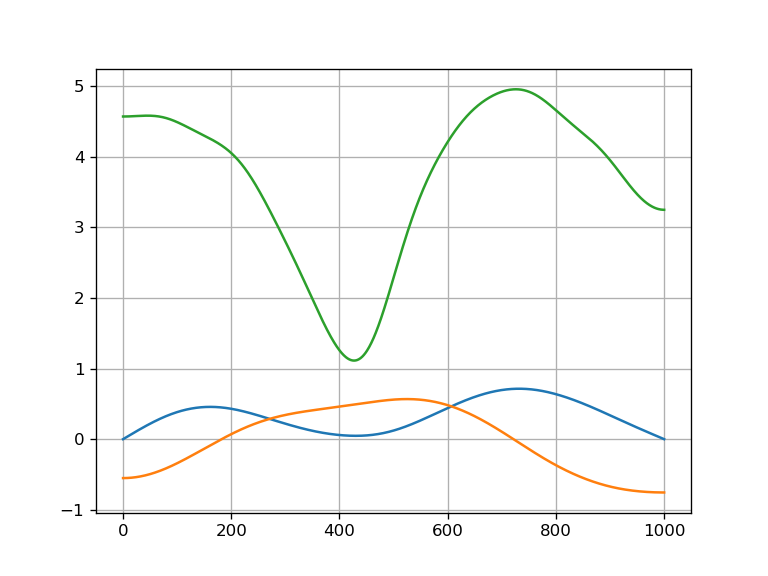

<IPython.core.display.Javascript object>


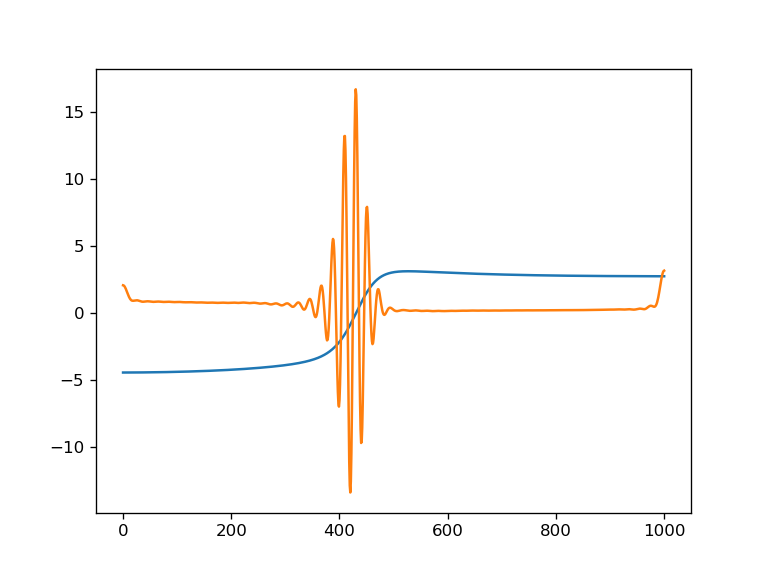

In [145]:
plt.figure()
plt.plot(P)
plt.plot(Z)
plt.plot(V)
plt.grid()
plt.figure()
plt.plot(H)
plt.plot(force)


<IPython.core.display.Javascript object>


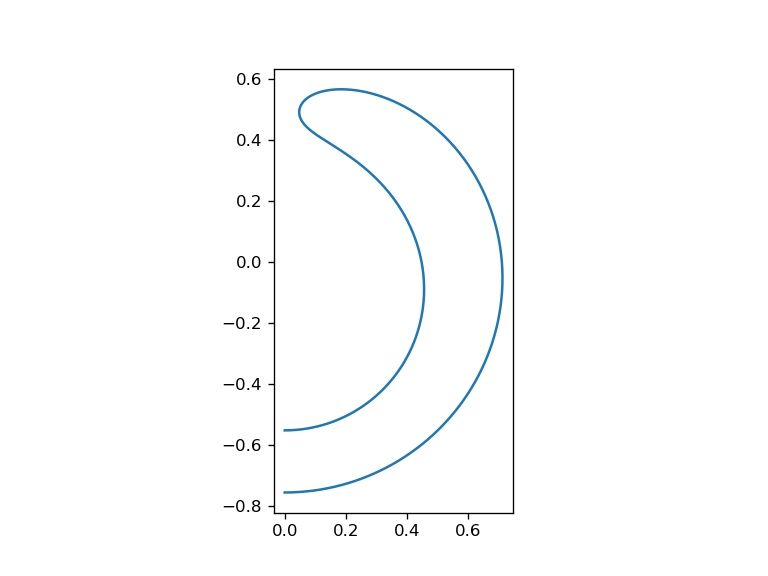

(-0.03570548974159179,
 0.7498152845734276,
 -0.8208420975164071,
 0.6335895088779894)

In [146]:
plt.figure()
plt.plot(P,Z)
plt.axis('scaled')

<IPython.core.display.Javascript object>


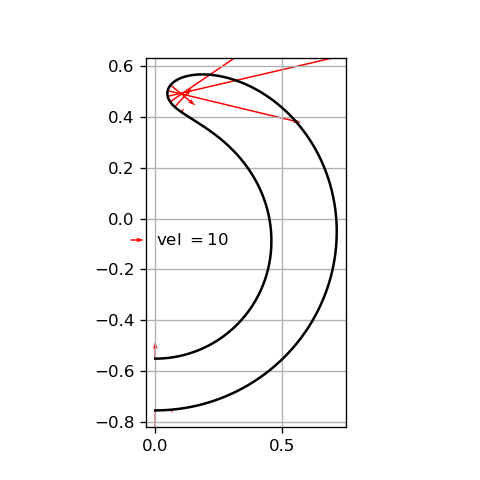

<IPython.core.display.Javascript object>


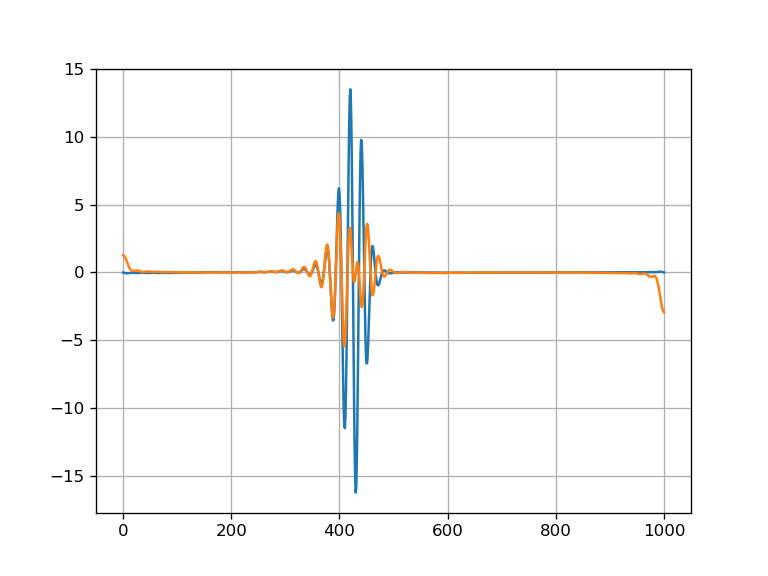

In [147]:
%matplotlib notebook
t_ = get_velo_with_nat_gauge(Pfur_0, Zfur_0,T_g)

fig = plt.figure(figsize = (4,4))
ax = fig.add_subplot(1, 1, 1)

#ax.scatter(p0, z0,s=6)
#qk = ax.quiverkey(Q, 0.4, 0.5, 100, r'$v=100$', labelpos='E',
#                  coordinates='figure')
plt.plot(P, Z,'k')
plt.grid()
Qnow = ax.quiver(P[::20], Z[::20], t_[0][::20],t_[1][::20], color='red')
qk = ax.quiverkey(Qnow, 0.3, 0.5, 1, r'vel $=10$', labelpos='E',
                  coordinates='figure')
ax.axis('scaled')
#plt.xlim(0,1.2)
#plt.ylim(-0.5,0.5)

#Qnow = ax.quiver(P[::N_int//n_int], Z[::N_int//n_int], 
#                 (force/V*(-Z1))[::N_int//n_int],(force/V*P1)[::N_int//n_int], color='blue')
#qk = ax.quiverkey(Qnow, 0.8, 0.8, 10, r'f $=10$', labelpos='E',
#                  coordinates='figure')


plt.figure()
plt.grid()
plt.plot(t_[0])
plt.plot(t_[1])

<IPython.core.display.Javascript object>


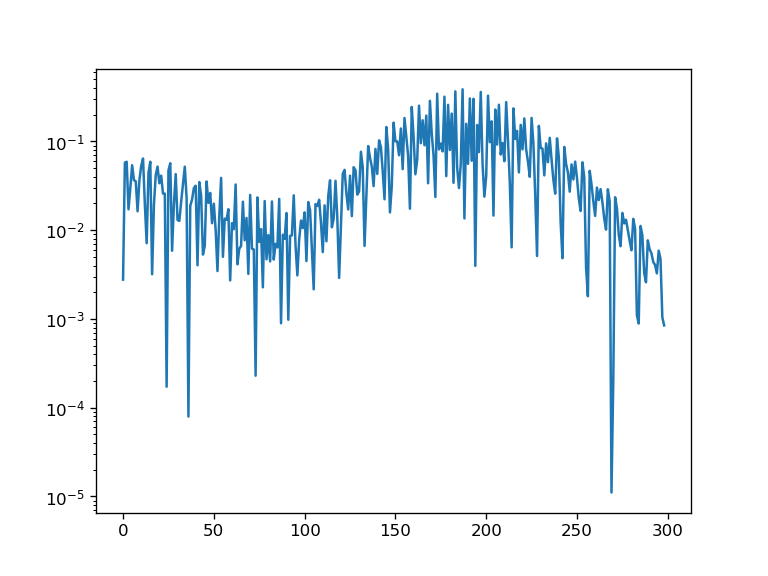

In [148]:
plt.figure()
plt.plot(abs(get_velo_with_nat_gauge_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))))
plt.yscale('log')

In [114]:
%timeit get_velo_with_nat_gauge_fur_1d(get_pz_from_PZ_fur(Pfur_0, Zfur_0))

1.49 ms ± 59.2 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


__________________________________________________

In [149]:
steps = np.logspace(-7,-5,2*N-1)[::-1]
j_fun = nd.Jacobian(get_velo_with_nat_gauge_fur_1d, step=steps)

In [150]:
jac_0 = j_fun(get_pz_from_PZ_fur(Pfur_0, Zfur_0))
eigs_0 = sc.linalg.eigvals(jac_0)
print(f'{eigs_0.real.min():.2e}',eigs_0.real.max())

-1.48e+10 210.9778225052725


<IPython.core.display.Javascript object>


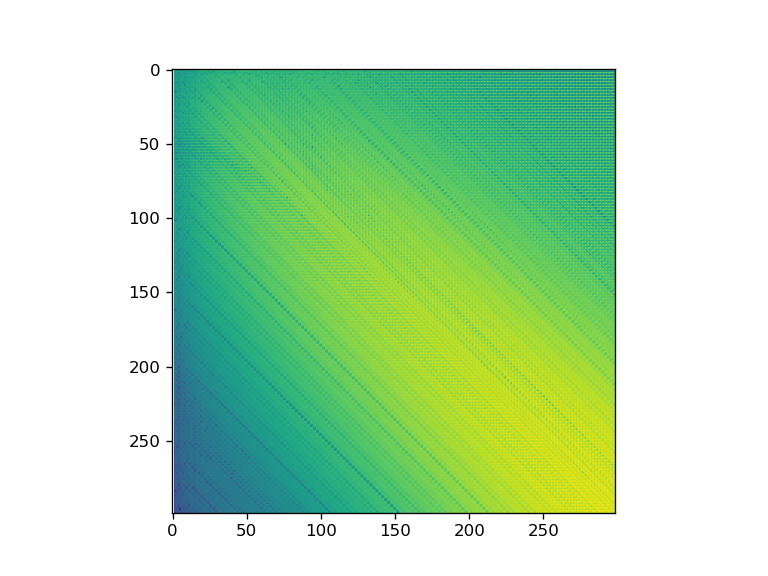

In [151]:
plt.figure()
plt.imshow(np.log10(abs(jac_0)))

In [152]:
t_max=0.1

In [157]:
atol = 1e-12
rtol = atol/10

In [158]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 200 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_velo_with_nat_gauge_fur_1d(pz)
jac = j_fun

In [159]:
sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_from_PZ_fur(Pfur_0, Zfur_0), 
                                   method='Radau', jac=lambda t,pz:jac(pz),atol=atol,rtol=rtol);

0.0
[-1.22352746e-03  2.18755829e-01  9.04167377e-02 -8.49209769e-02
 -3.02291987e-01  1.46442465e-01 -4.92012737e-03  5.66225270e-02
 -2.37529012e-02 -7.09738067e-03 -3.59075680e-02  8.10027296e-03
 -6.90606195e-04  2.00421585e-03  1.72060616e-03 -1.72824552e-04
  9.20323283e-04 -1.54228409e-03 -2.45138597e-04 -5.80671945e-05
 -2.78729890e-04  2.38788742e-04 -3.17723292e-05  3.15227069e-04
  1.72582507e-04 -2.76469755e-04 -2.05991378e-04 -2.96061539e-05
  8.99787253e-06  5.74126296e-05  1.22169656e-05 -5.54588397e-06
  8.59560417e-05 -6.08557457e-05  5.86129354e-05 -8.09309485e-05
 -3.30359969e-06  1.42744694e-05  2.59542040e-05  4.70209412e-07
 -7.86453143e-07  1.91786283e-07  1.99775133e-07  5.23910319e-08
  7.01734161e-07  7.80904645e-07 -4.50759641e-08 -1.10101092e-06
 -1.69306057e-06 -6.22317228e-08  3.11942208e-07  5.20638359e-07
  1.64118208e-06 -3.37280120e-08 -6.37928611e-07  4.95552389e-08
 -1.17403583e-06  3.80552707e-07 -1.83959155e-07  2.53243997e-08
  1.09347762e-07  5.0

0.00013459313202385012
[-1.22223722e-03  2.18754956e-01  9.04210890e-02 -8.49204720e-02
 -3.02293856e-01  1.46444249e-01 -4.91925491e-03  5.66218359e-02
 -2.37538009e-02 -7.09932162e-03 -3.59041901e-02  8.09793877e-03
 -6.90481491e-04  2.00489039e-03  1.72261994e-03 -1.71335458e-04
  9.20949724e-04 -1.54200238e-03 -2.44113366e-04 -6.00008254e-05
 -2.80273310e-04  2.37784802e-04 -3.15760128e-05  3.15758314e-04
  1.73821675e-04 -2.75626878e-04 -2.04344367e-04 -3.02476416e-05
  8.50234129e-06  5.65598701e-05  1.15713161e-05 -5.47248040e-06
  8.60645396e-05 -6.01584832e-05  5.95371770e-05 -8.08751309e-05
 -3.09847828e-06  1.37486960e-05  2.56492553e-05  1.29190795e-07
 -1.00899436e-06  4.00619666e-07  5.82580887e-07  2.98571553e-07
  1.03935312e-06  6.69569374e-07 -5.42112940e-08 -1.37520890e-06
 -1.92051187e-06 -8.81725014e-08  3.52744680e-07  6.78837121e-07
  1.83143862e-06  2.74884631e-08 -5.28266990e-07 -6.51110105e-08
 -1.26468773e-06  2.86764343e-07 -2.39756823e-07  6.10046113e-08
  

0.004863083153258193
[-1.18924413e-03  2.18760485e-01  9.05234759e-02 -8.48965301e-02
 -3.02315719e-01  1.46472063e-01 -4.90027703e-03  5.65795409e-02
 -2.37657534e-02 -7.12699386e-03 -3.58537850e-02  8.04514561e-03
 -6.76814267e-04  1.99071274e-03  1.75604534e-03 -1.67909335e-04
  9.50737602e-04 -1.54925847e-03 -2.41672818e-04 -7.61248912e-05
 -2.94349651e-04  2.35447874e-04 -3.35490774e-05  3.27013718e-04
  1.86151488e-04 -2.71649193e-04 -1.99361292e-04 -3.74671821e-05
  2.00242103e-06  5.03930161e-05  5.71729746e-06 -2.35519327e-06
  8.94368328e-05 -5.46851476e-05  6.51604992e-05 -8.12945359e-05
 -3.52810169e-06  9.45857906e-06  2.12327936e-05 -9.88432138e-07
 -2.24353531e-06  3.27078434e-06  3.40551530e-06  2.14374921e-06
  2.86455922e-06 -7.91013370e-07 -1.52821032e-06 -3.23777959e-06
 -3.79233681e-06  3.60523259e-07  8.02608660e-07  2.20007646e-06
  3.35538654e-06  2.21154657e-07 -3.37287911e-07 -1.11380521e-06
 -2.31896394e-06 -2.10296792e-07 -7.39146525e-07  6.59231597e-07
  7.

0.011484424753471351
[-1.14092609e-03  2.18768498e-01  9.06478696e-02 -8.48662522e-02
 -3.02335102e-01  1.46507878e-01 -4.88042746e-03  5.65245563e-02
 -2.37708877e-02 -7.15965938e-03 -3.57977945e-02  7.97961718e-03
 -6.54723564e-04  1.96593606e-03  1.79481483e-03 -1.62203867e-04
  9.92611542e-04 -1.56413193e-03 -2.41032927e-04 -9.51093052e-05
 -3.09324719e-04  2.34545086e-04 -3.43343867e-05  3.40062328e-04
  1.99055164e-04 -2.66527444e-04 -1.94269022e-04 -4.56031923e-05
 -6.25572421e-06  4.35981542e-05 -1.21386781e-06  1.61666777e-06
  9.34824446e-05 -4.82530436e-05  7.17350132e-05 -8.20522492e-05
 -4.28968018e-06  4.37527479e-06  1.60106736e-05 -2.12995061e-06
 -3.52661622e-06  6.76394255e-06  6.82284064e-06  4.22604205e-06
  4.91071429e-06 -2.62780189e-06 -3.39103573e-06 -5.39682150e-06
 -5.96575551e-06  9.91381299e-07  1.43443292e-06  4.01289965e-06
  5.17456162e-06  3.71518111e-07 -1.85974642e-07 -2.39833366e-06
 -3.60671726e-06 -7.55960227e-07 -1.28622655e-06  1.41827915e-06
  1.

0.017567133789700533
[-1.09961409e-03  2.18775342e-01  9.07518010e-02 -8.48409683e-02
 -3.02349625e-01  1.46538223e-01 -4.86488280e-03  5.64782522e-02
 -2.37746660e-02 -7.18773253e-03 -3.57509509e-02  7.92517361e-03
 -6.35235009e-04  1.94426597e-03  1.82685614e-03 -1.57329936e-04
  1.02797929e-03 -1.57640703e-03 -2.40220046e-04 -1.11199268e-04
 -3.22073378e-04  2.33795417e-04 -3.50416624e-05  3.51046785e-04
  2.09879338e-04 -2.62168963e-04 -1.89938751e-04 -5.24492033e-05
 -1.32010844e-05  3.78411389e-05 -7.08642615e-06  4.96519471e-06
  9.68865258e-05 -4.27990966e-05  7.73078353e-05 -8.26959542e-05
 -4.93238075e-06  5.64363001e-08  1.15767646e-05 -3.09504739e-06
 -4.61294745e-06  9.74435171e-06  9.73666905e-06  5.99565513e-06
  6.65026176e-06 -4.20861684e-06 -4.99196723e-06 -7.24076682e-06
 -7.82139271e-06  1.54566955e-06  1.98851297e-06  5.57151349e-06
  6.73797928e-06  4.88055748e-07 -6.80312105e-08 -3.51265036e-06
 -4.72312926e-06 -1.21791034e-06 -1.74956628e-06  2.08547741e-06
  2.

0.02373597734952946
[-1.06096517e-03  2.18781791e-01  9.08483783e-02 -8.48175060e-02
 -3.02362351e-01  1.46566512e-01 -4.85080321e-03  5.64350915e-02
 -2.37780806e-02 -7.21411772e-03 -3.57073089e-02  7.87477342e-03
 -6.16669276e-04  1.92376278e-03  1.85646395e-03 -1.52876918e-04
  1.06087629e-03 -1.58769426e-03 -2.39305176e-04 -1.26189089e-04
 -3.33975652e-04  2.33093397e-04 -3.57465074e-05  3.61286183e-04
  2.19938789e-04 -2.58098114e-04 -1.85899809e-04 -5.88305155e-05
 -1.96720968e-05  3.24704721e-05 -1.25659299e-05  8.09864330e-06
  1.00066610e-04 -3.76998623e-05  8.25165876e-05 -8.33108595e-05
 -5.54307034e-06 -3.99431730e-06  7.42069339e-06 -3.98719971e-06
 -5.61963624e-06  1.25530768e-05  1.24812067e-05  7.64977490e-06
  8.27660007e-06 -5.71176454e-06 -6.51233648e-06 -8.97535285e-06
 -9.56648994e-06  2.08463832e-06  2.52641953e-06  7.04773285e-06
  8.21819065e-06  5.84879855e-07  3.06141806e-08 -4.57720516e-06
 -5.78909137e-06 -1.64759527e-06 -2.18070947e-06  2.73078665e-06
  2.8

0.030233245015656992
[-1.02359269e-03  2.18788081e-01  9.09414265e-02 -8.47949161e-02
 -3.02374224e-01  1.46593748e-01 -4.83743716e-03  5.63933946e-02
 -2.37813388e-02 -7.23967482e-03 -3.56651702e-02  7.82635588e-03
 -5.98522175e-04  1.90385376e-03  1.88489271e-03 -1.48648625e-04
  1.09252141e-03 -1.59850742e-03 -2.38373518e-04 -1.40613833e-04
 -3.45459263e-04  2.32444493e-04 -3.64402676e-05  3.71171853e-04
  2.29622747e-04 -2.54183469e-04 -1.82021548e-04 -6.50011196e-05
 -2.59260815e-05  2.72960565e-05 -1.78459786e-05  1.11476945e-05
  1.03156111e-04 -3.27701752e-05  8.75505656e-05 -8.39297009e-05
 -6.15501775e-06 -7.92662037e-06  3.38866755e-06 -4.83248372e-06
 -6.57675553e-06  1.52948460e-05  1.51591469e-05  9.24453466e-06
  9.84483297e-06 -7.19378383e-06 -8.00949344e-06 -1.06610227e-05
 -1.12619077e-05  2.62938320e-06  3.06932879e-06  8.49312453e-06
  9.66697135e-06  6.64105361e-07  1.12077225e-07 -5.62891576e-06
 -6.84164230e-06 -2.05907501e-06 -2.59375324e-06  3.37629911e-06
  3.

0.03760267748330415
[-9.85020363e-04  2.18794635e-01  9.10372383e-02 -8.47716619e-02
 -3.02386225e-01  1.46621720e-01 -4.82381064e-03  5.63503446e-02
 -2.37846888e-02 -7.26605829e-03 -3.56216940e-02  7.77662646e-03
 -5.79654397e-04  1.88329153e-03  1.91409517e-03 -1.44350346e-04
  1.12501403e-03 -1.60960467e-03 -2.37417132e-04 -1.55421247e-04
 -3.57283894e-04  2.31823645e-04 -3.71533637e-05  3.81367795e-04
  2.39581578e-04 -2.50174794e-04 -1.78056368e-04 -7.13809670e-05
 -3.23882510e-05  2.19784302e-05 -2.32728269e-05  1.43241099e-05
  1.06369614e-04 -2.76832259e-05  9.27434650e-05 -8.46004224e-05
 -6.81579665e-06 -1.20035471e-05 -7.89001255e-07 -5.68246604e-06
 -7.54331444e-06  1.81547078e-05  1.79513014e-05  1.08832578e-05
  1.14565569e-05 -8.75610348e-06 -9.58582608e-06 -1.24087855e-05
 -1.30192896e-05  3.21868300e-06  3.65588045e-06  1.00037875e-05
  1.11806391e-05  7.29021150e-07  1.79811600e-07 -6.73834474e-06
 -7.95138922e-06 -2.47837588e-06 -3.01483944e-06  4.06587140e-06
  4.1

0.043831459080045675
[-9.55314838e-04  2.18799726e-01  9.11109124e-02 -8.47537823e-02
 -3.02395356e-01  1.46643159e-01 -4.81340385e-03  5.63171628e-02
 -2.37872706e-02 -7.28636755e-03 -3.55882064e-02  7.73846783e-03
 -5.65049724e-04  1.86747056e-03  1.93651130e-03 -1.41080738e-04
  1.14992135e-03 -1.61812116e-03 -2.36702251e-04 -1.66766182e-04
 -3.66370578e-04  2.31385425e-04 -3.76952513e-05  3.89217786e-04
  2.47228872e-04 -2.47112759e-04 -1.75031960e-04 -7.63055312e-05
 -3.73734856e-05  1.79004008e-05 -2.74350266e-05  1.67939608e-05
  1.08864835e-04 -2.37665104e-05  9.67405995e-05 -8.51415159e-05
 -7.34728552e-06 -1.51566723e-05 -4.01819352e-06 -6.31988204e-06
 -8.27132896e-06  2.03790097e-05  2.01221809e-05  1.21392914e-05
  1.26920786e-05 -9.98302515e-06 -1.08223975e-05 -1.37598967e-05
 -1.43775009e-05  3.69224820e-06  4.12672184e-06  1.11802399e-05
  1.23590603e-05  7.66543707e-07  2.19870833e-07 -7.60958168e-06
 -8.82248252e-06 -2.79698814e-06 -3.33495412e-06  4.61348657e-06
  4.

0.05412761343079587
[-9.11435003e-04  2.18807318e-01  9.12195959e-02 -8.47274065e-02
 -3.02408724e-01  1.46674661e-01 -4.79814585e-03  5.62680893e-02
 -2.37910959e-02 -7.31634137e-03 -3.55387178e-02  7.68229909e-03
 -5.43376547e-04  1.84414359e-03  1.96952531e-03 -1.36311531e-04
  1.18652919e-03 -1.63066534e-03 -2.35695444e-04 -1.83428574e-04
 -3.79760789e-04  2.30806488e-04 -3.84797921e-05  4.00811924e-04
  2.58491666e-04 -2.42632485e-04 -1.70613744e-04 -8.36005230e-05
 -4.47535537e-05  1.19052534e-05 -3.35545074e-05  2.04823677e-05
  1.12585650e-04 -1.79827958e-05  1.02641234e-04 -8.59818581e-05
 -8.17031920e-06 -1.98358355e-05 -8.80728969e-06 -7.23257349e-06
 -9.31919339e-06  2.37000526e-05  2.33622477e-05  1.39840264e-05
  1.45069882e-05 -1.18339931e-05 -1.26857615e-05 -1.57632046e-05
 -1.63908092e-05  4.42409052e-06  4.85354282e-06  1.29385780e-05
  1.41197505e-05  8.01256048e-07  2.58937204e-07 -8.92343013e-06
 -1.01354867e-05 -3.26006306e-06 -3.80046753e-06  5.44910436e-06
  5.5

0.06055157921577202
[-8.87025993e-04  2.18811579e-01  9.12799859e-02 -8.47127503e-02
 -3.02416110e-01  1.46692097e-01 -4.78971201e-03  5.62407580e-02
 -2.37932316e-02 -7.33299875e-03 -3.55111746e-02  7.65115087e-03
 -5.31273105e-04  1.83119409e-03  1.98784326e-03 -1.33688901e-04
  1.20679801e-03 -1.63762709e-03 -2.35163850e-04 -1.92647237e-04
 -3.87192375e-04  2.30520708e-04 -3.89070802e-05  4.07260809e-04
  2.64739815e-04 -2.40163022e-04 -1.68182076e-04 -8.76695843e-05
 -4.88675136e-05  8.58558041e-06 -3.69433149e-05  2.25552153e-05
  1.14673905e-04 -1.47667484e-05  1.05921355e-04 -8.64709249e-05
 -8.64813009e-06 -2.24496850e-05 -1.14810289e-05 -7.72496996e-06
 -9.88749383e-06  2.55657331e-05  2.51818057e-05  1.50043492e-05
  1.55109758e-05 -1.28836923e-05 -1.37413804e-05 -1.68811795e-05
 -1.75140980e-05  4.84809599e-06  5.27422536e-06  1.39271211e-05
  1.51093120e-05  8.09601549e-07  2.70029149e-07 -9.66812614e-06
 -1.08793806e-05 -3.51348798e-06 -4.05536959e-06  5.92779216e-06
  6.0

0.06935089721356712
[-8.56883259e-04  2.18816876e-01  9.13544987e-02 -8.46946661e-02
 -3.02425188e-01  1.46713543e-01 -4.77934746e-03  5.62069726e-02
 -2.37958774e-02 -7.35355177e-03 -3.54771461e-02  7.61277873e-03
 -5.16281985e-04  1.81523089e-03  2.01041977e-03 -1.30479689e-04
  1.23173444e-03 -1.64620927e-03 -2.34536752e-04 -2.03981620e-04
 -3.96352627e-04  2.30203923e-04 -3.94253412e-05  4.15223900e-04
  2.72438899e-04 -2.37136291e-04 -1.65205165e-04 -9.27054655e-05
 -5.39563712e-05  4.50143014e-06 -4.11127877e-05  2.51358849e-05
  1.17271011e-04 -1.07967704e-05  1.09969510e-04 -8.70963639e-05
 -9.25804319e-06 -2.56881408e-05 -1.47921882e-05 -8.31768428e-06
 -1.05746606e-05  2.78875916e-05  2.74456310e-05  1.62582936e-05
  1.67450108e-05 -1.41997710e-05 -1.50637903e-05 -1.82650533e-05
 -1.89042909e-05  5.38850519e-06  5.80999398e-06  1.51579793e-05
  1.63411391e-05  8.08885882e-07  2.73036517e-07 -1.06013279e-05
 -1.18112579e-05 -3.82210139e-06 -4.36593370e-06  6.53262847e-06
  6.6

0.08152083606877807
[-8.20728872e-04  2.18823283e-01  9.14437825e-02 -8.46729962e-02
 -3.02436015e-01  1.46739140e-01 -4.76698780e-03  5.61663993e-02
 -2.37990634e-02 -7.37817794e-03 -3.54363079e-02  7.56688744e-03
 -4.98237518e-04  1.79612600e-03  2.03743505e-03 -1.26673121e-04
  1.26150787e-03 -1.65648184e-03 -2.33827888e-04 -2.17503752e-04
 -4.07314633e-04  2.29876658e-04 -4.00331013e-05  4.24773885e-04
  2.81648847e-04 -2.33539410e-04 -1.61672511e-04 -9.87615335e-05
 -6.00722863e-05 -3.74633993e-07 -4.60910879e-05  2.82616007e-05
  1.20412649e-04 -6.03763696e-06  1.14821032e-04 -8.78779220e-05
 -1.00185796e-05 -2.95875746e-05 -1.87769852e-05 -9.00601453e-06
 -1.13773507e-05  3.06984078e-05  3.01852529e-05  1.77531684e-05
  1.82164022e-05 -1.58071224e-05 -1.66772882e-05 -1.99293697e-05
 -2.05758372e-05  6.06129053e-06  6.47641046e-06  1.66487783e-05
  1.78326758e-05  7.91732933e-07  2.60847367e-07 -1.17402970e-05
 -1.29481437e-05 -4.18565477e-06 -4.73202160e-06  7.27807892e-06
  7.3

0.09404915936133529
[-7.89269495e-04  2.18828905e-01  9.15213928e-02 -8.46541588e-02
 -3.02445384e-01  1.46761301e-01 -4.75629642e-03  5.61310510e-02
 -2.38018468e-02 -7.39958267e-03 -3.54007522e-02  7.52707357e-03
 -4.82480733e-04  1.77953961e-03  2.06088560e-03 -1.23398612e-04
  1.28729411e-03 -1.66540166e-03 -2.33249493e-04 -2.29205170e-04
 -4.16830465e-04  2.29638530e-04 -4.05496232e-05  4.33082208e-04
  2.89640661e-04 -2.30439490e-04 -1.58632332e-04 -1.04044929e-04
 -6.54043885e-05 -4.59716602e-06 -5.04024631e-05  3.10081462e-05
  1.23169672e-04 -1.89922074e-06  1.19038620e-04 -8.85858201e-05
 -1.07060279e-05 -3.29936577e-05 -2.22557016e-05 -9.58473926e-06
 -1.20565550e-05  3.31669150e-05  3.25903854e-05  1.90455011e-05
  1.94886660e-05 -1.72311911e-05 -1.81054006e-05 -2.13811767e-05
 -2.20336295e-05  6.66860328e-06  7.07745000e-06  1.79585475e-05
  1.91427071e-05  7.62149938e-07  2.36040441e-07 -1.27486514e-05
 -1.39542386e-05 -4.49587402e-06 -5.04462905e-06  7.94445523e-06
  8.0

In [160]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [957]:
np.save(f'dyn_prolate_rad_to_t={t_max}_N={N}_T_g={}rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

##### Continue

In [213]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))

In [214]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [215]:
t_end = 50

In [216]:
atol = 1e-7
rtol = atol/10

In [217]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 20 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_corr_velo_fur_1d(pz)
jac = j_corr_fun

In [218]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:jac(pz),atol=atol, rtol=rtol, max_step=3e-2);

10.0
[ 2.73360342e-01 -8.74275933e-02  1.08800069e-01  6.25781947e-02
 -1.84323200e-03 -1.98863586e-02 -6.32425560e-03  7.45005348e-03
  6.59264167e-03 -1.33464169e-03 -4.55619807e-03 -1.26954649e-03
  2.30820782e-03  1.93278857e-03 -5.78036419e-04 -1.61550592e-03
 -5.20977477e-04  1.02570079e-03  9.73613169e-04 -2.20286470e-04
 -9.68160749e-04 -2.36531699e-04  7.28118651e-04  5.49680804e-04
 -2.84116299e-04 -5.30422725e-04 -1.93152246e-05  3.80734813e-04
  1.74635717e-04 -1.87245936e-04 -1.80870496e-04  5.30593864e-05
  1.06277362e-04 -2.62319521e-06 -3.49196716e-05  1.45159778e-05
 -1.03754611e-05 -5.48400631e-05 -8.33746608e-06  5.13841926e-05
  4.27364018e-05  2.08847201e-05  1.24198390e-05 -3.88469478e-05
  3.36411246e-05  3.08264454e-05  7.78235887e-05 -1.68149075e-05
  1.22509021e-05 -1.35062062e-01  5.12078723e-02 -2.91017669e-01
 -2.65608487e-02  8.81164866e-03 -4.74963737e-03 -9.33869554e-03
 -2.61555822e-03  4.17580696e-03  3.45495080e-03 -1.03388309e-03
 -2.82633184e-03 -6.

10.50999999999999
[ 2.73284568e-01 -8.73889348e-02  1.08825995e-01  6.26023741e-02
 -1.79816632e-03 -1.99138074e-02 -6.36413542e-03  7.44528567e-03
  6.61851249e-03 -1.32237610e-03 -4.57094823e-03 -1.28717325e-03
  2.31145644e-03  1.94854632e-03 -5.72846932e-04 -1.62652465e-03
 -5.31680383e-04  1.02796879e-03  9.83249600e-04 -2.17356237e-04
 -9.74439013e-04 -2.42787353e-04  7.29256112e-04  5.54595757e-04
 -2.83439978e-04 -5.33905717e-04 -2.08480503e-05  3.82639407e-04
  1.75872322e-04 -1.88193174e-04 -1.81495746e-04  5.38159337e-05
  1.06435963e-04 -3.55774686e-06 -3.53140446e-05  1.52625578e-05
 -9.89276944e-06 -5.52317827e-05 -8.93570212e-06  5.13040777e-05
  4.28605022e-05  2.12382328e-05  1.26440842e-05 -3.92387300e-05
  3.35767699e-05  3.07542201e-05  7.82106391e-05 -1.70072908e-05
  1.22931176e-05 -1.34291784e-01  5.18446360e-02 -2.90983697e-01
 -2.66586426e-02  8.73058837e-03 -4.69622432e-03 -9.31072409e-03
 -2.61879208e-03  4.16345314e-03  3.46039087e-03 -1.02469085e-03
 -2.827

11.024651530771628
[ 2.73206149e-01 -8.73507927e-02  1.08851780e-01  6.26265772e-02
 -1.75198682e-03 -1.99413043e-02 -6.40512370e-03  7.44035122e-03
  6.64512177e-03 -1.30950942e-03 -4.58599162e-03 -1.30535132e-03
  2.31467428e-03  1.96476219e-03 -5.67384966e-04 -1.63776527e-03
 -5.42716248e-04  1.03025296e-03  9.93185627e-04 -2.14287716e-04
 -9.80898067e-04 -2.49254754e-04  7.30444058e-04  5.59723017e-04
 -2.82699428e-04 -5.37536317e-04 -2.25082902e-05  3.84603910e-04
  1.77243648e-04 -1.89123891e-04 -1.82224791e-04  5.45138713e-05
  1.06656897e-04 -4.41518634e-06 -3.57025553e-05  1.59646571e-05
 -9.41631196e-06 -5.56135124e-05 -9.53577769e-06  5.12217239e-05
  4.30303840e-05  2.16449922e-05  1.28738642e-05 -3.96764565e-05
  3.35210725e-05  3.07212077e-05  7.86487163e-05 -1.71910890e-05
  1.23447983e-05 -1.33497837e-01  5.24981036e-02 -2.90946280e-01
 -2.67604349e-02  8.64707172e-03 -4.64193759e-03 -9.28140890e-03
 -2.62243128e-03  4.15046554e-03  3.46569433e-03 -1.01512118e-03
 -2.82

11.549348469228317
[ 2.73124020e-01 -8.73129138e-02  1.08877538e-01  6.26510585e-02
 -1.70410197e-03 -1.99690797e-02 -6.44773092e-03  7.43516205e-03
  6.67280139e-03 -1.29584625e-03 -4.60149880e-03 -1.32432583e-03
  2.31788006e-03  1.98164202e-03 -5.61563206e-04 -1.64935971e-03
 -5.54234758e-04  1.03256774e-03  1.00354878e-03 -2.11027273e-04
 -9.87614580e-04 -2.56026160e-04  7.31689442e-04  5.65133481e-04
 -2.81875824e-04 -5.41362161e-04 -2.43257300e-05  3.86651688e-04
  1.78773636e-04 -1.90047369e-04 -1.83072179e-04  5.51590988e-05
  1.06946811e-04 -5.20601440e-06 -3.60941975e-05  1.66316385e-05
 -8.93497073e-06 -5.59910459e-05 -1.01512033e-05  5.11354260e-05
  4.32508149e-05  2.21094270e-05  1.31099447e-05 -4.01646708e-05
  3.34715369e-05  3.07257832e-05  7.91414387e-05 -1.73668588e-05
  1.24058990e-05 -1.32670225e-01  5.31761792e-02 -2.90904598e-01
 -2.68676285e-02  8.56004654e-03 -4.58614630e-03 -9.25033200e-03
 -2.62655114e-03  4.13663804e-03  3.47090159e-03 -1.00504073e-03
 -2.82

12.069999999999956
[ 2.73040140e-01 -8.72764505e-02  1.08902422e-01  6.26751683e-02
 -1.65568778e-03 -1.99963346e-02 -6.49089268e-03  7.42982137e-03
  6.70086204e-03 -1.28169586e-03 -4.61706771e-03 -1.34364151e-03
  2.32097408e-03  1.99876827e-03 -5.55509306e-04 -1.66101157e-03
 -5.65960103e-04  1.03484222e-03  1.01408369e-03 -2.07641787e-04
 -9.94417015e-04 -2.62943413e-04  7.32953212e-04  5.70697920e-04
 -2.80980560e-04 -5.45289033e-04 -2.62630955e-05  3.88729773e-04
  1.80429599e-04 -1.90937947e-04 -1.84020544e-04  5.57330132e-05
  1.07300738e-04 -5.91091702e-06 -3.64825130e-05  1.72478734e-05
 -8.45656987e-06 -5.63558036e-05 -1.07716141e-05  5.10463378e-05
  4.35174371e-05  2.26194805e-05  1.33452898e-05 -4.06902253e-05
  3.34272496e-05  3.07663656e-05  7.96749222e-05 -1.75290189e-05
  1.24743189e-05 -1.31829504e-01  5.38617203e-02 -2.90859361e-01
 -2.69776724e-02  8.47167420e-03 -4.53027668e-03 -9.21822311e-03
 -2.63107691e-03  4.12227277e-03  3.47586249e-03 -9.94687728e-04
 -2.82

12.554651530771595
[ 2.72959689e-01 -8.72436267e-02  1.08924850e-01  6.26974581e-02
 -1.60971319e-03 -2.00213884e-02 -6.53193577e-03  7.42464670e-03
  6.72756742e-03 -1.26794187e-03 -4.63173828e-03 -1.36210845e-03
  2.32376551e-03  2.01508144e-03 -5.49600530e-04 -1.67200444e-03
 -5.77170164e-04  1.03693262e-03  1.02413707e-03 -2.04337845e-04
 -1.00088126e-03 -2.69580969e-04  7.34150198e-04  5.76067413e-04
 -2.80067922e-04 -5.49068935e-04 -2.81966806e-05  3.90707109e-04
  1.82101821e-04 -1.91742734e-04 -1.85003916e-04  5.62064314e-05
  1.07691278e-04 -6.49705735e-06 -3.68465879e-05  1.77825687e-05
 -8.00690993e-06 -5.66876491e-05 -1.13624669e-05  5.09590707e-05
  4.38091572e-05  2.31391780e-05  1.35654410e-05 -4.12164948e-05
  3.33882641e-05  3.08352612e-05  8.02114040e-05 -1.76685407e-05
  1.25447255e-05 -1.31027857e-01  5.45122731e-02 -2.90813424e-01
 -2.70837051e-02  8.38743665e-03 -4.47773858e-03 -9.18709994e-03
 -2.63571488e-03  4.10825968e-03  3.48028949e-03 -9.84706786e-04
 -2.83

13.079348469228284
[ 2.72869685e-01 -8.72094418e-02  1.08948180e-01  6.27214367e-02
 -1.55881545e-03 -2.00481224e-02 -6.57741599e-03  7.41878580e-03
  6.75719104e-03 -1.25235047e-03 -4.64783984e-03 -1.38269825e-03
  2.32667970e-03  2.03319360e-03 -5.42873097e-04 -1.68408743e-03
 -5.89668548e-04  1.03916032e-03  1.03531975e-03 -2.00572678e-04
 -1.00803717e-03 -2.77010500e-04  7.35464866e-04  5.82107327e-04
 -2.78981978e-04 -5.53307928e-04 -3.04454872e-05  3.92897316e-04
  1.84065223e-04 -1.92585737e-04 -1.86184337e-04  5.66498474e-05
  1.08183033e-04 -7.05547455e-06 -3.72461801e-05  1.83203365e-05
 -7.51209183e-06 -5.70394659e-05 -1.20212591e-05  5.08582553e-05
  4.41732953e-05  2.37529381e-05  1.38057525e-05 -4.18278241e-05
  3.33461403e-05  3.09431872e-05  8.08369080e-05 -1.78067192e-05
  1.26282356e-05 -1.30136946e-01  5.52316044e-02 -2.90759063e-01
 -2.72028381e-02  8.29384847e-03 -4.42017216e-03 -9.15192850e-03
 -2.64124488e-03  4.09230491e-03  3.48486702e-03 -9.73485907e-04
 -2.83

13.599999999999923
[ 2.72776958e-01 -8.71770673e-02  1.08970195e-01  6.27450873e-02
 -1.50698280e-03 -2.00742013e-02 -6.62375705e-03  7.41266187e-03
  6.78741923e-03 -1.23607304e-03 -4.66407839e-03 -1.40382932e-03
  2.32944905e-03  2.05169272e-03 -5.35816895e-04 -1.69629479e-03
 -6.02494429e-04  1.04132929e-03  1.04676307e-03 -1.96616451e-04
 -1.01531967e-03 -2.84667494e-04  7.36786525e-04  5.88360721e-04
 -2.77789871e-04 -5.57680823e-04 -3.28546641e-05  3.95125871e-04
  1.86185556e-04 -1.93390480e-04 -1.87483704e-04  5.70140755e-05
  1.08745457e-04 -7.52956478e-06 -3.76506364e-05  1.88121027e-05
 -7.00992516e-06 -5.73816103e-05 -1.26992872e-05  5.07497555e-05
  4.45858604e-05  2.44183717e-05  1.40476762e-05 -4.24796336e-05
  3.33019369e-05  3.10848611e-05  8.15063484e-05 -1.79301007e-05
  1.27188279e-05 -1.29226131e-01  5.59629110e-02 -2.90699785e-01
 -2.73260774e-02  8.19819825e-03 -4.36219707e-03 -9.11533170e-03
 -2.64731658e-03  4.07555554e-03  3.48917818e-03 -9.61871062e-04
 -2.83

14.109999999999912
[ 2.72682287e-01 -8.71470299e-02  1.08990501e-01  6.27681294e-02
 -1.45472399e-03 -2.00992633e-02 -6.67048951e-03  7.40632025e-03
  6.81796307e-03 -1.21924638e-03 -4.68028597e-03 -1.42531020e-03
  2.33203299e-03  2.07040153e-03 -5.28488599e-04 -1.70850262e-03
 -6.15530359e-04  1.04341051e-03  1.05835776e-03 -1.92497920e-04
 -1.02265534e-03 -2.92484373e-04  7.38097524e-04  5.94771475e-04
 -2.76495561e-04 -5.62145841e-04 -3.54083118e-05  3.97368517e-04
  1.88447830e-04 -1.94144803e-04 -1.88892138e-04  5.72911808e-05
  1.09373197e-04 -7.91307504e-06 -3.80567082e-05  1.92528938e-05
 -6.50459913e-06 -5.77105504e-05 -1.33917506e-05  5.06330892e-05
  4.50418750e-05  2.51301663e-05  1.42899984e-05 -4.31654592e-05
  3.32537669e-05  3.12582703e-05  8.22135686e-05 -1.80370844e-05
  1.28155179e-05 -1.28304113e-01  5.66988526e-02 -2.90635876e-01
 -2.74523631e-02  8.10139655e-03 -4.30439949e-03 -9.07761719e-03
 -2.65390559e-03  4.05812304e-03  3.49316500e-03 -9.49963356e-04
 -2.83

14.609348469228252
[ 2.72585253e-01 -8.71194303e-02  1.09009018e-01  6.27905805e-02
 -1.40189650e-03 -2.01232878e-02 -6.71773232e-03  7.39973611e-03
  6.84892410e-03 -1.20180410e-03 -4.69650733e-03 -1.44721859e-03
  2.33443091e-03  2.08938083e-03 -5.20857674e-04 -1.72074608e-03
 -6.28821831e-04  1.04540603e-03  1.07014168e-03 -1.88197706e-04
 -1.03006586e-03 -3.00490326e-04  7.39399270e-04  6.01363687e-04
 -2.75089081e-04 -5.66717922e-04 -3.81208541e-05  3.99630251e-04
  1.90864319e-04 -1.94847120e-04 -1.90416491e-04  5.74778454e-05
  1.10067945e-04 -8.20550879e-06 -3.84659635e-05  1.96438384e-05
 -5.99451062e-06 -5.80270618e-05 -1.41019890e-05  5.05064808e-05
  4.55415685e-05  2.58917896e-05  1.45348676e-05 -4.38873576e-05
  3.31993879e-05  3.14635241e-05  8.29613722e-05 -1.81277608e-05
  1.29185451e-05 -1.27367825e-01  5.74415227e-02 -2.90566890e-01
 -2.75822259e-02  8.00311487e-03 -4.24661601e-03 -9.03861878e-03
 -2.66106607e-03  4.03990141e-03  3.49682488e-03 -9.37716150e-04
 -2.83

15.12999999999989
[ 2.72478599e-01 -8.70928285e-02  1.09026723e-01  6.28138771e-02
 -1.34476458e-03 -2.01477348e-02 -6.76882693e-03  7.39242478e-03
  6.88253900e-03 -1.18243893e-03 -4.71388397e-03 -1.47115468e-03
  2.33678574e-03  2.11000083e-03 -5.12347654e-04 -1.73389022e-03
 -6.43336891e-04  1.04744552e-03  1.08296830e-03 -1.83388115e-04
 -1.03808211e-03 -3.09274171e-04  7.40782156e-04  6.08627140e-04
 -2.73453493e-04 -5.71733431e-04 -4.12083873e-05  4.02071217e-04
  1.93629330e-04 -1.95536689e-04 -1.92180806e-04  5.75717061e-05
  1.10886240e-04 -8.41425252e-06 -3.89075745e-05  2.00059318e-05
 -5.44388077e-06 -5.83515902e-05 -1.48828305e-05  5.03584616e-05
  4.61240381e-05  2.67644074e-05  1.48015386e-05 -4.47004705e-05
  3.31322005e-05  3.17188137e-05  8.38082594e-05 -1.82063571e-05
  1.30358918e-05 -1.26349416e-01  5.82437632e-02 -2.90487135e-01
 -2.77253922e-02  7.89622057e-03 -4.18480024e-03 -8.99537877e-03
 -2.66940870e-03  4.01945263e-03  3.50035739e-03 -9.24219136e-04
 -2.830

15.63999999999988
[ 2.72367507e-01 -8.70692645e-02  1.09042323e-01  6.28365741e-02
 -1.28640639e-03 -2.01710137e-02 -6.82103589e-03  7.38477048e-03
  6.91707815e-03 -1.16210256e-03 -4.73149076e-03 -1.49590114e-03
  2.33894757e-03  2.13119833e-03 -5.03372933e-04 -1.74723801e-03
 -6.58333634e-04  1.04941214e-03  1.09617962e-03 -1.78301150e-04
 -1.04628856e-03 -3.18393214e-04  7.42174504e-04  6.16204065e-04
 -2.71657195e-04 -5.76942715e-04 -4.45351552e-05  4.04563278e-04
  1.96624645e-04 -1.96164844e-04 -1.94111712e-04  5.75486809e-05
  1.11793945e-04 -8.51122926e-06 -3.93580449e-05  2.03112703e-05
 -4.88310764e-06 -5.86644402e-05 -1.56953165e-05  5.01941772e-05
  4.67632931e-05  2.77108690e-05  1.50781956e-05 -4.55667702e-05
  3.30528806e-05  3.20157526e-05  8.47165133e-05 -1.82660086e-05
  1.31622147e-05 -1.25300998e-01  5.90632787e-02 -2.90399907e-01
 -2.78749254e-02  7.78616314e-03 -4.12229312e-03 -8.94994208e-03
 -2.67861941e-03  3.99767524e-03  3.50349690e-03 -9.10139540e-04
 -2.829

16.154651530771527
[ 2.72247103e-01 -8.70484510e-02  1.09056181e-01  6.28593115e-02
 -1.22465677e-03 -2.01937409e-02 -6.87633722e-03  7.37650644e-03
  6.95395503e-03 -1.13994615e-03 -4.75002967e-03 -1.52247116e-03
  2.34099314e-03  2.15383599e-03 -4.93558305e-04 -1.76132169e-03
 -6.74421464e-04  1.05138601e-03  1.11031661e-03 -1.72723670e-04
 -1.05502229e-03 -3.28223002e-04  7.43639809e-04  6.24418652e-04
 -2.69616600e-04 -5.82568610e-04 -4.82571008e-05  4.07208204e-04
  1.99995992e-04 -1.96745762e-04 -1.96305437e-04  5.73893151e-05
  1.12835576e-04 -8.48330788e-06 -3.98347412e-05  2.05632158e-05
 -4.29255852e-06 -5.89755893e-05 -1.65730221e-05  5.00048905e-05
  4.74891153e-05  2.87777010e-05  1.53783508e-05 -4.65252583e-05
  3.29557649e-05  3.23718024e-05  8.57294090e-05 -1.83065835e-05
  1.33033073e-05 -1.24179343e-01  5.99324824e-02 -2.90300940e-01
 -2.80373962e-02  7.66836712e-03 -4.05670010e-03 -8.90025237e-03
 -2.68919443e-03  3.97350845e-03  3.50627962e-03 -8.94882101e-04
 -2.82

16.67934846922825
[ 2.72113319e-01 -8.70309800e-02  1.09068282e-01  6.28822098e-02
 -1.15815640e-03 -2.02159858e-02 -6.93604102e-03  7.36749567e-03
  6.99423980e-03 -1.11530551e-03 -4.77001171e-03 -1.55163017e-03
  2.34296884e-03  2.17856300e-03 -4.82610100e-04 -1.77652829e-03
 -6.92056566e-04  1.05342906e-03  1.12579125e-03 -1.66489569e-04
 -1.06454255e-03 -3.39050728e-04  7.45236953e-04  6.33535238e-04
 -2.67258185e-04 -5.88794197e-04 -5.25160445e-05  4.10085291e-04
  2.03883099e-04 -1.97277676e-04 -1.98858429e-04  5.70562436e-05
  1.14056902e-04 -8.29744518e-06 -4.03496637e-05  2.07512834e-05
 -3.66121861e-06 -5.92888463e-05 -1.75415516e-05  4.97824219e-05
  4.83311744e-05  3.00103759e-05  1.57135697e-05 -4.76109673e-05
  3.28349958e-05  3.28083964e-05  8.68879270e-05 -1.83243323e-05
  1.34644925e-05 -1.22951229e-01  6.08746316e-02 -2.90186168e-01
 -2.82183446e-02  7.53927039e-03 -3.98642294e-03 -8.84450050e-03
 -2.70165451e-03  3.94594612e-03  3.50861043e-03 -8.77971561e-04
 -2.827

17.199999999999918
[ 2.71965880e-01 -8.70184203e-02  1.09078332e-01  6.29043981e-02
 -1.08789167e-03 -2.02369253e-02 -6.99944300e-03  7.35799816e-03
  7.03778599e-03 -1.08831049e-03 -4.79136335e-03 -1.58323132e-03
  2.34489481e-03  2.20527600e-03 -4.70594601e-04 -1.79279364e-03
 -7.11140343e-04  1.05556825e-03  1.14254748e-03 -1.59641876e-04
 -1.07483430e-03 -3.50823645e-04  7.46999021e-04  6.43549676e-04
 -2.64588211e-04 -5.95626445e-04 -5.73296495e-05  4.13195076e-04
  2.08321851e-04 -1.97741485e-04 -2.01803325e-04  5.65126309e-05
  1.15473764e-04 -7.91413205e-06 -4.08986916e-05  2.08520803e-05
 -3.00120868e-06 -5.95968610e-05 -1.85956856e-05  4.95258988e-05
  4.92979455e-05  3.14227930e-05  1.60856669e-05 -4.88289732e-05
  3.26888403e-05  3.33400628e-05  8.82029553e-05 -1.83134729e-05
  1.36465336e-05 -1.21620125e-01  6.18836453e-02 -2.90054790e-01
 -2.84182168e-02  7.39910387e-03 -3.91211077e-03 -8.78237990e-03
 -2.71623463e-03  3.91466665e-03  3.51023281e-03 -8.59445080e-04
 -2.82

17.684651530771585
[ 2.71810353e-01 -8.70124777e-02  1.09086278e-01  6.29240857e-02
 -1.01785681e-03 -2.02550890e-02 -7.06321074e-03  7.34880692e-03
  7.08274260e-03 -1.06028824e-03 -4.81325005e-03 -1.61582665e-03
  2.34680678e-03  2.23282142e-03 -4.58126289e-04 -1.80946090e-03
 -7.30789006e-04  1.05780187e-03  1.15986855e-03 -1.52543757e-04
 -1.08550194e-03 -3.62996402e-04  7.48920709e-04  6.54050125e-04
 -2.61752843e-04 -6.02807552e-04 -6.24977468e-05  4.16430872e-04
  2.13155456e-04 -1.98118314e-04 -2.05047974e-04  5.57598498e-05
  1.17042584e-04 -7.32062381e-06 -4.14572960e-05  2.08437695e-05
 -2.35250535e-06 -5.98825044e-05 -1.96853792e-05  4.92482869e-05
  5.03577461e-05  3.29689403e-05  1.64802062e-05 -5.01339784e-05
  3.25249480e-05  3.39606735e-05  8.96309042e-05 -1.82714984e-05
  1.38421401e-05 -1.20241526e-01  6.29141716e-02 -2.89912083e-01
 -2.86295233e-02  7.25351569e-03 -3.83723336e-03 -8.71603705e-03
 -2.73256116e-03  3.88058325e-03  3.51083048e-03 -8.40105305e-04
 -2.82

18.209348469228306
[ 2.71612305e-01 -8.70151833e-02  1.09094516e-01  6.29430856e-02
 -9.35993989e-04 -2.02726465e-02 -7.13900942e-03  7.33900341e-03
  7.13850533e-03 -1.02581077e-03 -4.84042581e-03 -1.65597140e-03
  2.34939664e-03  2.26691911e-03 -4.42850521e-04 -1.83009857e-03
 -7.54931603e-04  1.06081999e-03  1.18137085e-03 -1.43888216e-04
 -1.09888595e-03 -3.78006326e-04  7.51584574e-04  6.67277469e-04
 -2.58240555e-04 -6.11931325e-04 -6.91193841e-05  4.20539889e-04
  2.19486368e-04 -1.98489856e-04 -2.09367516e-04  5.45800143e-05
  1.19145193e-04 -6.30943535e-06 -4.21419639e-05  2.06725948e-05
 -1.60772409e-06 -6.01924149e-05 -2.10261686e-05  4.88965078e-05
  5.17617151e-05  3.50113684e-05  1.69806310e-05 -5.18192434e-05
  3.23133388e-05  3.48460917e-05  9.15040208e-05 -1.81810804e-05
  1.40933553e-05 -1.18524130e-01  6.41751554e-02 -2.89727109e-01
 -2.88992727e-02  7.07123936e-03 -3.74697756e-03 -8.63024813e-03
 -2.75475138e-03  3.83542566e-03  3.50984501e-03 -8.15913953e-04
 -2.81

18.729999999999976
[ 2.71364714e-01 -8.70335368e-02  1.09105856e-01  6.29560181e-02
 -8.47710119e-04 -2.02862911e-02 -7.22353539e-03  7.33116861e-03
  7.20576214e-03 -9.85743752e-04 -4.87383193e-03 -1.70343835e-03
  2.35359334e-03  2.30792239e-03 -4.25331732e-04 -1.85527658e-03
 -7.83381471e-04  1.06530753e-03  1.20731675e-03 -1.34093587e-04
 -1.11547270e-03 -3.95729032e-04  7.55521165e-04  6.83479257e-04
 -2.54283412e-04 -6.23347939e-04 -7.72524016e-05  4.25786514e-04
  2.27569369e-04 -1.98922638e-04 -2.15032948e-04  5.28621968e-05
  1.21942293e-04 -4.69779129e-06 -4.29737545e-05  2.02206845e-05
 -8.18904176e-07 -6.04988648e-05 -2.26003392e-05  4.84834039e-05
  5.35929181e-05  3.76564606e-05  1.75868202e-05 -5.39519641e-05
  3.20694696e-05  3.61160268e-05  9.39153221e-05 -1.80308247e-05
  1.44019003e-05 -1.16438211e-01  6.56683812e-02 -2.89497091e-01
 -2.92375872e-02  6.84780973e-03 -3.64179488e-03 -8.52076502e-03
 -2.78477563e-03  3.77585098e-03  3.50565321e-03 -7.86580636e-04
 -2.81

19.214651530771643
[ 2.71040603e-01 -8.70797055e-02  1.09129785e-01  6.29517634e-02
 -7.60662503e-04 -2.02910768e-02 -7.31294023e-03  7.33143831e-03
  7.28923520e-03 -9.40953205e-04 -4.91777131e-03 -1.75969550e-03
  2.36232197e-03  2.35869584e-03 -4.06476782e-04 -1.88787863e-03
 -8.16923126e-04  1.07337119e-03  1.23956295e-03 -1.23954369e-04
 -1.13731981e-03 -4.16568447e-04  7.62291253e-04  7.03875929e-04
 -2.50485853e-04 -6.38417712e-04 -8.71562125e-05  4.33157547e-04
  2.38173636e-04 -1.99791804e-04 -2.22841771e-04  5.04777007e-05
  1.25936489e-04 -2.13754177e-06 -4.41001612e-05  1.92474677e-05
 -2.61038916e-08 -6.07460431e-05 -2.44282594e-05  4.80240987e-05
  5.60806425e-05  4.12038899e-05  1.82994550e-05 -5.67684614e-05
  3.18360533e-05  3.80696056e-05  9.71307373e-05 -1.78359911e-05
  1.47656052e-05 -1.13813946e-01  6.74786913e-02 -2.89213329e-01
 -2.96827019e-02  6.56192298e-03 -3.51532310e-03 -8.37346490e-03
 -2.82844337e-03  3.69155834e-03  3.49478695e-03 -7.49910374e-04
 -2.80

19.739348469228364
[ 2.70338136e-01 -8.72392269e-02  1.09223943e-01  6.28470893e-02
 -6.86995628e-04 -2.02559276e-02 -7.41011845e-03  7.38292972e-03
  7.45074556e-03 -8.82719990e-04 -5.02004714e-03 -1.85536021e-03
  2.40143007e-03  2.45927700e-03 -3.86918503e-04 -1.96200892e-03
 -8.73351481e-04  1.10420722e-03  1.30359497e-03 -1.16364513e-04
 -1.18788218e-03 -4.50691186e-04  7.86244909e-04  7.44551380e-04
 -2.50696449e-04 -6.72743623e-04 -1.03550301e-04  4.53126017e-04
  2.60277245e-04 -2.04950050e-04 -2.41435299e-04  4.63216606e-05
  1.36629437e-04  4.49946018e-06 -4.75026356e-05  1.55153488e-05
  1.07628785e-06 -6.02486777e-05 -2.72076404e-05  4.72474252e-05
  6.13886486e-05  4.87741677e-05  1.92547716e-05 -6.30196742e-05
  3.17336269e-05  4.33789566e-05  1.03883808e-04 -1.79514356e-05
  1.50367523e-05 -1.08442259e-01  7.09456554e-02 -2.88729921e-01
 -3.06838124e-02  5.95344985e-03 -3.25503931e-03 -8.03178444e-03
 -2.94886966e-03  3.47132328e-03  3.45018321e-03 -6.70334939e-04
 -2.76

20.024651530771674
[ 2.69472124e-01 -8.73796953e-02  1.09011021e-01  6.26716006e-02
 -4.48374713e-04 -2.02123519e-02 -7.64640871e-03  7.39839558e-03
  7.73516173e-03 -7.19608067e-04 -5.17186748e-03 -2.05650993e-03
  2.43501820e-03  2.64847127e-03 -3.17662635e-04 -2.08534140e-03
 -9.96508752e-04  1.14296090e-03  1.42835286e-03 -8.35900825e-05
 -1.27664774e-03 -5.26073166e-04  8.20717696e-04  8.25831917e-04
 -2.37601900e-04 -7.33687456e-04 -1.45534380e-04  4.80857035e-04
  3.07485885e-04 -2.02295224e-04 -2.75087850e-04  2.76023559e-05
  1.49554224e-04  2.33179634e-05 -4.44218145e-05  8.22429850e-06
 -5.28293851e-06 -6.34647217e-05 -2.82680006e-05  5.11248906e-05
  7.21331898e-05  6.11726522e-05  2.19408560e-05 -7.08943764e-05
  2.98544247e-05  5.50023151e-05  1.17739566e-04 -1.32354242e-05
  1.37493678e-05 -9.85451161e-02  7.78659807e-02 -2.87436913e-01
 -3.26163955e-02  4.82061894e-03 -2.69394270e-03 -7.34631606e-03
 -3.15263644e-03  3.01918607e-03  3.35713835e-03 -4.77775322e-04
 -2.68

20.294651530771684
[ 2.68681350e-01 -8.67306474e-02  1.07241538e-01  6.32048822e-02
  1.42433586e-03 -2.03772364e-02 -8.95492657e-03  6.66948419e-03
  8.31112442e-03  7.22258389e-05 -5.23964304e-03 -2.73709068e-03
  2.13489487e-03  3.04706335e-03  1.40925463e-04 -2.17092441e-03
 -1.42591025e-03  9.76684733e-04  1.69622959e-03  2.05398191e-04
 -1.34262754e-03 -8.09793001e-04  7.18970131e-04  1.00986758e-03
 -5.30878186e-05 -7.87467052e-04 -3.26517383e-04  4.27420275e-04
  4.23561860e-04 -9.85726660e-05 -3.09008795e-04 -6.75589115e-05
  1.22700664e-04  7.34031114e-05  1.15909700e-06  5.53614254e-06
 -3.03956419e-05 -8.10797654e-05 -3.59442720e-05  5.12430969e-05
  9.03668069e-05  1.00432432e-04  5.84191237e-05 -7.15331568e-05
  4.32387909e-07  6.69399564e-05  1.59226464e-04  3.28754235e-05
  1.64012511e-05 -7.77738262e-02  9.61623390e-02 -2.83222772e-01
 -3.59439050e-02  2.40491294e-03 -1.31897008e-03 -6.13762730e-03
 -3.11781998e-03  2.39557325e-03  3.28862885e-03 -3.81673397e-05
 -2.45

20.515000000000043
[ 2.67143014e-01 -8.64239156e-02  1.06249437e-01  6.38745331e-02
  3.23989370e-03 -2.05185017e-02 -1.03079774e-02  5.89818626e-03
  8.84157862e-03  9.21265621e-04 -5.22947180e-03 -3.43133118e-03
  1.75104882e-03  3.41910911e-03  6.70752226e-04 -2.18436914e-03
 -1.88229120e-03  7.21041190e-04  1.93388065e-03  5.61881550e-04
 -1.33937610e-03 -1.11522103e-03  5.40586217e-04  1.16860692e-03
  1.82105990e-04 -7.92534453e-04 -5.20559552e-04  3.31006754e-04
  5.24567271e-04  2.27746549e-05 -3.25217125e-04 -1.55923755e-04
  9.85781343e-05  1.09257626e-04  1.84667848e-05 -2.49639376e-06
 -1.55660936e-05 -6.28549738e-05 -6.53444785e-05 -2.79217792e-06
  8.62022209e-05  1.61752331e-04  1.16679053e-04 -8.09174528e-05
 -5.24920885e-05  5.76134751e-05  1.93595731e-04  7.76612769e-05
  2.40795548e-05 -5.37865607e-02  1.16308789e-01 -2.78261187e-01
 -3.92915349e-02 -7.71275398e-04 -4.46017497e-04 -4.59233591e-03
 -2.69386998e-03  1.79823483e-03  2.90517351e-03  2.65577310e-04
 -2.06

20.608884405867517
[ 2.65792564e-01 -8.66338278e-02  1.06488567e-01  6.42777920e-02
  3.85359460e-03 -2.06080208e-02 -1.08231593e-02  5.64767144e-03
  9.06481644e-03  1.23920929e-03 -5.24241406e-03 -3.70561225e-03
  1.61068254e-03  3.57613559e-03  8.80878978e-04 -2.19515118e-03
 -2.06899873e-03  6.17708347e-04  2.03093675e-03  7.07755268e-04
 -1.33684502e-03 -1.23834130e-03  4.67224082e-04  1.22982942e-03
  2.73802435e-04 -7.93613053e-04 -5.91484028e-04  2.98224645e-04
  5.58532620e-04  5.70757019e-05 -3.33471671e-04 -1.72472202e-04
  1.04601152e-04  1.08138247e-04 -3.42343696e-06 -4.36381953e-06
  2.52830402e-05 -3.78587983e-05 -1.04074359e-04 -5.65754258e-05
  9.05693445e-05  2.12714171e-04  1.42400683e-04 -1.03603869e-04
 -7.81941984e-05  5.31200223e-05  2.09119582e-04  8.83577979e-05
  3.29855708e-05 -3.96054046e-02  1.25816348e-01 -2.76000370e-01
 -4.07693435e-02 -2.60821669e-03 -3.45481028e-04 -3.74412637e-03
 -2.30933917e-03  1.51639452e-03  2.55052937e-03  3.12443920e-04
 -1.79

20.66992503071237
[ 2.64252950e-01 -8.70537438e-02  1.07125872e-01  6.46807101e-02
  4.20571997e-03 -2.06938880e-02 -1.11334568e-02  5.52633945e-03
  9.21019687e-03  1.41705480e-03 -5.26527733e-03 -3.86992726e-03
  1.53748562e-03  3.67743345e-03  1.00310545e-03 -2.20874304e-03
 -2.18281951e-03  5.59879276e-04  2.09284836e-03  7.93561999e-04
 -1.33954894e-03 -1.31180556e-03  4.27606471e-04  1.26731625e-03
  3.23011442e-04 -7.97817330e-04 -6.27662479e-04  2.87022098e-04
  5.74661668e-04  6.39664501e-05 -3.40734948e-04 -1.65767946e-04
  1.20896140e-04  9.26779326e-05 -4.03113803e-05 -4.20489139e-07
  8.13142201e-05 -1.21741889e-05 -1.56806782e-04 -1.15892207e-04
  1.08169537e-04  2.74787844e-04  1.57239897e-04 -1.41675341e-04
 -9.49034724e-05  5.65022649e-05  2.25788078e-04  8.71835574e-05
  4.47521774e-05 -2.28700975e-02  1.32823247e-01 -2.74522023e-01
 -4.17749816e-02 -4.15164126e-03 -4.22025951e-04 -3.07888725e-03
 -1.94886570e-03  1.30093223e-03  2.20936162e-03  3.09722476e-04
 -1.545

20.719186246341405
[ 2.62432121e-01 -8.76468880e-02  1.08038871e-01  6.51838789e-02
  4.46014509e-03 -2.08164255e-02 -1.13993346e-02  5.44962699e-03
  9.33428073e-03  1.55484666e-03 -5.28169795e-03 -3.99512917e-03
  1.47486930e-03  3.74686536e-03  1.09840586e-03 -2.20709682e-03
 -2.26357452e-03  5.07041760e-04  2.12759393e-03  8.59193920e-04
 -1.32951207e-03 -1.35910508e-03  3.91880102e-04  1.28321076e-03
  3.55635885e-04 -7.92107488e-04 -6.42275061e-04  2.80334274e-04
  5.73096983e-04  5.47770904e-05 -3.41342485e-04 -1.37861557e-04
  1.45389946e-04  5.94050293e-05 -9.84528370e-05  9.35856520e-06
  1.65300901e-04  2.40068632e-05 -2.33545696e-04 -1.99207867e-04
  1.36559859e-04  3.60604713e-04  1.64612977e-04 -2.05806725e-04
 -1.03813910e-04  6.46890899e-05  2.43548747e-04  6.69072933e-05
  6.45112945e-05  3.10920801e-03  1.39716091e-01 -2.73005585e-01
 -4.26532390e-02 -5.80572217e-03 -6.50176416e-04 -2.39966599e-03
 -1.50433332e-03  1.11769090e-03  1.81298421e-03  2.50814671e-04
 -1.27

20.748700971997366
[ 2.61108525e-01 -8.80964111e-02  1.08772697e-01  6.55878134e-02
  4.56723956e-03 -2.09497701e-02 -1.15744733e-02  5.43159049e-03
  9.41457916e-03  1.62552597e-03 -5.28635930e-03 -4.05244934e-03
  1.43342172e-03  3.76159826e-03  1.14337677e-03 -2.18209731e-03
 -2.28384267e-03  4.67541654e-04  2.11471808e-03  8.86127550e-04
 -1.29819917e-03 -1.36019780e-03  3.62886869e-04  1.26294188e-03
  3.63893389e-04 -7.68668398e-04 -6.28281037e-04  2.73612544e-04
  5.49934271e-04  3.58297481e-05 -3.31484229e-04 -9.97657478e-05
  1.68162975e-04  2.20062660e-05 -1.56719737e-04  1.70967229e-05
  2.44597514e-04  6.28693548e-05 -2.99309905e-04 -2.77342984e-04
  1.55301483e-04  4.28757383e-04  1.58835919e-04 -2.69668637e-04
 -9.80944777e-05  6.83179720e-05  2.47205379e-04  2.69918153e-05
  8.50449664e-05  2.70758741e-02  1.44801478e-01 -2.71747937e-01
 -4.32408749e-02 -7.06140473e-03 -8.87075178e-04 -1.88804063e-03
 -1.12696766e-03  1.01933379e-03  1.49659166e-03  1.57960978e-04
 -1.09

20.77319903467755
[ 2.59698123e-01 -8.85908944e-02  1.09656318e-01  6.60595166e-02
  4.57851071e-03 -2.11582554e-02 -1.17267468e-02  5.48822138e-03
  9.49334168e-03  1.63736970e-03 -5.30130157e-03 -4.05813053e-03
  1.41537442e-03  3.72903511e-03  1.14167646e-03 -2.12895178e-03
 -2.23999581e-03  4.34362691e-04  2.04108146e-03  8.73161172e-04
 -1.23054172e-03 -1.30320377e-03  3.32294967e-04  1.18889557e-03
  3.44294254e-04 -7.12945837e-04 -5.72745333e-04  2.62126288e-04
  4.89728095e-04  5.19124403e-07 -3.01442876e-04 -3.74959541e-05
  1.90499523e-04 -3.45932239e-05 -2.27980248e-04  3.04163287e-05
  3.39554313e-04  1.08922631e-04 -3.72732188e-04 -3.65439310e-04
  1.72427649e-04  4.92106141e-04  1.32944125e-04 -3.47727267e-04
 -7.22531827e-05  6.71777674e-05  2.33695601e-04 -4.40080794e-05
  1.12781658e-04  5.38735164e-02  1.49895485e-01 -2.70461273e-01
 -4.37683980e-02 -8.37366887e-03 -1.18428256e-03 -1.35943110e-03
 -7.13853544e-04  9.49553876e-04  1.15736730e-03  2.06390935e-05
 -9.108

20.7850452493099
[ 2.58790494e-01 -8.89241154e-02  1.10283260e-01  6.63906561e-02
  4.53514336e-03 -2.13301679e-02 -1.18076952e-02  5.57022604e-03
  9.54370486e-03  1.60666345e-03 -5.32039386e-03 -4.03012451e-03
  1.42041066e-03  3.67997834e-03  1.11169693e-03 -2.07678992e-03
 -2.17102380e-03  4.16200929e-04  1.95360848e-03  8.38949228e-04
 -1.16228180e-03 -1.22773729e-03  3.11274191e-04  1.10497364e-03
  3.13111272e-04 -6.55235633e-04 -5.09529957e-04  2.50635844e-04
  4.26549950e-04 -3.09440498e-05 -2.67671870e-04  1.52561967e-05
  2.00203342e-04 -8.11739695e-05 -2.74551148e-04  4.39514510e-05
  4.01103438e-04  1.36073501e-04 -4.17441090e-04 -4.16629816e-04
  1.81070883e-04  5.19202175e-04  1.03702684e-04 -3.95848896e-04
 -4.39824587e-05  6.20951767e-05  2.12132695e-04 -1.01732503e-04
  1.32377239e-04  6.98051880e-02  1.52826311e-01 -2.69745488e-01
 -4.40375764e-02 -9.17413599e-03 -1.39255304e-03 -1.04354554e-03
 -4.59890931e-04  9.22896518e-04  9.51475705e-04 -7.92168214e-05
 -8.0626

20.796093029338028
[ 2.57690460e-01 -8.93517234e-02  1.11085150e-01  6.68246796e-02
  4.46244769e-03 -2.15614332e-02 -1.19020034e-02  5.69684718e-03
  9.60706490e-03  1.54708487e-03 -5.34620409e-03 -3.97400738e-03
  1.43174714e-03  3.59455168e-03  1.05962639e-03 -1.98781048e-03
 -2.05285828e-03  3.85927509e-04  1.80469840e-03  7.79086337e-04
 -1.04746414e-03 -1.09850040e-03  2.78215564e-04  9.63719848e-04
  2.59090526e-04 -5.59778727e-04 -4.04787448e-04  2.30552782e-04
  3.23989431e-04 -7.73334081e-05 -2.11368480e-04  9.12829152e-05
  2.06138145e-04 -1.46680011e-04 -3.29391186e-04  6.43069515e-05
  4.71411030e-04  1.65169563e-04 -4.63096214e-04 -4.67863819e-04
  1.84599940e-04  5.30193529e-04  5.83585356e-05 -4.42357408e-04
 -2.60399671e-06  4.93843008e-05  1.70614024e-04 -1.76675039e-04
  1.53465089e-04  8.65294450e-02  1.56030061e-01 -2.69010051e-01
 -4.43084683e-02 -1.01058185e-02 -1.66015508e-03 -6.86209747e-04
 -1.69576164e-04  9.06222747e-04  7.22806760e-04 -2.01809002e-04
 -6.91

20.804068482951596
[ 2.56695509e-01 -8.97701273e-02  1.11820722e-01  6.72533221e-02
  4.42224485e-03 -2.17674427e-02 -1.20011017e-02  5.80657805e-03
  9.66906969e-03  1.50002378e-03 -5.35902316e-03 -3.91788312e-03
  1.42951634e-03  3.49922687e-03  1.01862859e-03 -1.87578793e-03
 -1.92731954e-03  3.35782680e-04  1.63203829e-03  7.21077046e-04
 -9.07611172e-04 -9.53275041e-04  2.33116778e-04  8.00090802e-04
  2.01219220e-04 -4.47864089e-04 -2.87306900e-04  2.04333642e-04
  2.08715560e-04 -1.25124087e-04 -1.47408158e-04  1.69122629e-04
  2.06667202e-04 -2.11505499e-04 -3.76895402e-04  8.28828297e-05
  5.27649001e-04  1.90332001e-04 -4.90334272e-04 -5.03151274e-04
  1.74127199e-04  5.14667060e-04  1.49163093e-05 -4.64736269e-04
  3.23372531e-05  2.99540246e-05  1.18368039e-04 -2.40642249e-04
  1.63526752e-04  9.90048848e-02  1.58734316e-01 -2.68432689e-01
 -4.45430026e-02 -1.09454123e-02 -1.91827381e-03 -3.75427966e-04
  8.40183426e-05  9.02147099e-04  5.37109723e-04 -3.06867018e-04
 -5.98

20.80681187858203
[ 2.56343934e-01 -8.99269892e-02  1.12076409e-01  6.74131862e-02
  4.42349837e-03 -2.18333348e-02 -1.20417162e-02  5.83786908e-03
  9.69250281e-03  1.49096353e-03 -5.35846529e-03 -3.90005877e-03
  1.42287343e-03  3.46356782e-03  1.00988129e-03 -1.82832431e-03
 -1.88212701e-03  3.10167796e-04  1.56358079e-03  7.02575026e-04
 -8.49333387e-04 -8.97437828e-04  2.12222859e-04  7.34921354e-04
  1.80276365e-04 -4.02482797e-04 -2.41904446e-04  1.92666390e-04
  1.63700304e-04 -1.42496568e-04 -1.22227113e-04  1.97733490e-04
  2.05606417e-04 -2.34820657e-04 -3.92651372e-04  8.88580470e-05
  5.44887885e-04  1.99177022e-04 -4.95569140e-04 -5.12766590e-04
  1.66137107e-04  5.02676771e-04  4.44576335e-07 -4.66746470e-04
  4.19774572e-05  2.13525021e-05  9.69401481e-05 -2.60571016e-04
  1.63366044e-04  1.02820534e-01  1.59670522e-01 -2.68243266e-01
 -4.46334884e-02 -1.12466508e-02 -2.01189230e-03 -2.66068592e-04
  1.72640864e-04  9.01639501e-04  4.76937885e-04 -3.40255619e-04
 -5.674

20.806965316949384
[ 2.56333478e-01 -8.99325404e-02  1.12083837e-01  6.74213116e-02
  4.42430109e-03 -2.18376063e-02 -1.20452201e-02  5.83919164e-03
  9.69461860e-03  1.49140371e-03 -5.35840256e-03 -3.89979021e-03
  1.42199709e-03  3.46183837e-03  1.00997821e-03 -1.82551468e-03
 -1.87996403e-03  3.08393213e-04  1.55982239e-03  7.01839955e-04
 -8.45948416e-04 -8.94452484e-04  2.10901753e-04  7.31278865e-04
  1.79180334e-04 -3.99913683e-04 -2.39357605e-04  1.92041262e-04
  1.61171189e-04 -1.43566997e-04 -1.20893386e-04  1.99426269e-04
  2.05733285e-04 -2.36083275e-04 -3.93745151e-04  8.89525033e-05
  5.45919705e-04  2.00045236e-04 -4.95637599e-04 -5.13602765e-04
  1.65166515e-04  5.01999368e-04  3.77993990e-07 -4.66099587e-04
  4.24149599e-05  2.02218776e-05  9.56350376e-05 -2.60986725e-04
  1.63983019e-04  1.02988675e-01  1.59716542e-01 -2.68224870e-01
 -4.46351931e-02 -1.12615149e-02 -2.02021099e-03 -2.61976539e-04
  1.80212197e-04  9.04950535e-04  4.73392513e-04 -3.44924835e-04
 -5.67

20.806977243987944
[ 2.56277557e-01 -8.99481536e-02  1.12126181e-01  6.74106664e-02
  4.41720159e-03 -2.18157217e-02 -1.20207253e-02  5.83587801e-03
  9.67021736e-03  1.47673026e-03 -5.34802246e-03 -3.87955123e-03
  1.42785059e-03  3.44834174e-03  9.94855953e-04 -1.82436923e-03
 -1.86531016e-03  3.17972229e-04  1.55311924e-03  6.87966239e-04
 -8.49576992e-04 -8.83861438e-04  2.21818640e-04  7.28848559e-04
  1.67078689e-04 -4.06013936e-04 -2.32038716e-04  2.02900404e-04
  1.61636422e-04 -1.53605052e-04 -1.28165462e-04  2.04045299e-04
  2.15747887e-04 -2.33790611e-04 -4.01716503e-04  8.15556876e-05
  5.48607226e-04  2.08700037e-04 -4.92634291e-04 -5.19759276e-04
  1.58551092e-04  5.03549491e-04  7.21175655e-06 -4.63718225e-04
  3.74202653e-05  1.54305290e-05  9.67987435e-05 -2.56835814e-04
  1.65747535e-04  1.03285476e-01  1.59772607e-01 -2.68387973e-01
 -4.47581572e-02 -1.12401265e-02 -1.87710309e-03 -2.02947232e-04
  7.30463444e-05  7.80936412e-04  4.95660999e-04 -2.17517200e-04
 -5.08

20.806978608113166
[ 2.55933527e-01 -9.00742811e-02  1.12421119e-01  6.74463427e-02
  4.38053035e-03 -2.17836988e-02 -1.19514173e-02  5.84181766e-03
  9.60336898e-03  1.42730700e-03 -5.31706127e-03 -3.81204438e-03
  1.44417490e-03  3.39571673e-03  9.43848800e-04 -1.80897712e-03
 -1.80645950e-03  3.43421271e-04  1.51449844e-03  6.36970475e-04
 -8.47491808e-04 -8.33198183e-04  2.54387408e-04  7.02161362e-04
  1.17482849e-04 -4.13965273e-04 -1.89497981e-04  2.39484758e-04
  1.45323574e-04 -2.00017782e-04 -1.43783793e-04  2.38369048e-04
  2.54023577e-04 -2.41228290e-04 -4.43768799e-04  6.05785293e-05
  5.75265613e-04  2.46928649e-04 -4.92787845e-04 -5.57093839e-04
  1.33453738e-04  5.22984451e-04  4.47371680e-05 -4.57313243e-04
  6.04418540e-06 -1.19075443e-05  1.08069556e-04 -2.22542213e-04
  1.78275384e-04  1.04197882e-01  1.59852071e-01 -2.68842873e-01
 -4.49439447e-02 -1.12492170e-02 -1.63087945e-03 -8.69909388e-05
 -1.44807404e-04  5.16742978e-04  5.45827845e-04  7.32480723e-05
 -3.72

20.80697869932343
[ 2.55005843e-01 -9.04297963e-02  1.13229965e-01  6.75919716e-02
  4.29297208e-03 -2.17438869e-02 -1.18144275e-02  5.86001421e-03
  9.46971392e-03  1.33185085e-03 -5.24356045e-03 -3.67481645e-03
  1.45837374e-03  3.27302434e-03  8.53182397e-04 -1.74883118e-03
 -1.68185678e-03  3.65988794e-04  1.41100891e-03  5.48053143e-04
 -8.07065816e-04 -7.21905236e-04  2.88405860e-04  6.18565367e-04
  3.07031315e-05 -3.91297153e-04 -9.23754370e-05  2.81645026e-04
  8.10924155e-05 -2.81968812e-04 -1.36918628e-04  3.20257221e-04
  3.01439220e-04 -2.87349799e-04 -5.18863750e-04  5.48766022e-05
  6.42328505e-04  2.96578071e-04 -5.22896959e-04 -6.24059865e-04
  1.16702207e-04  5.74818380e-04  9.52536834e-05 -4.73042532e-04
 -5.25702191e-05 -3.96963087e-05  1.42913009e-04 -1.70321439e-04
  1.82311556e-04  1.06024437e-01  1.59876510e-01 -2.69624888e-01
 -4.49838729e-02 -1.13964010e-02 -1.49279365e-03  1.50392697e-05
 -3.62419162e-04  2.38310439e-04  6.10761584e-04  4.11314723e-04
 -2.226

20.806978767980432
[ 2.55449786e-01 -9.02671388e-02  1.12836809e-01  6.75447196e-02
  4.33913662e-03 -2.17890893e-02 -1.19017253e-02  5.86347820e-03
  9.56267212e-03  1.38442856e-03 -5.30183595e-03 -3.76157211e-03
  1.46007925e-03  3.35696854e-03  9.04359046e-04 -1.79659213e-03
 -1.76077546e-03  3.61023568e-04  1.48240063e-03  5.98808021e-04
 -8.41945454e-04 -7.92675063e-04  2.75807192e-04  6.77390703e-04
  8.05168252e-05 -4.14711826e-04 -1.54522315e-04  2.63496162e-04
  1.27810914e-04 -2.34674059e-04 -1.50156410e-04  2.67271270e-04
  2.79437380e-04 -2.51915784e-04 -4.75235925e-04  4.98620975e-05
  5.98175598e-04  2.72486264e-04 -4.97461922e-04 -5.84731637e-04
  1.19077179e-04  5.39615089e-04  6.97877211e-05 -4.56129004e-04
 -1.64437457e-05 -2.95612544e-05  1.17242952e-04 -1.98183963e-04
  1.84072628e-04  1.05067066e-01  1.59851582e-01 -2.69189307e-01
 -4.49229220e-02 -1.13397583e-02 -1.61429506e-03 -5.14993758e-05
 -2.11996881e-04  4.17152868e-04  5.62287199e-04  1.95343538e-04
 -3.10

20.80697896804271
[ 2.56025141e-01 -9.00483954e-02  1.12335625e-01  6.74587137e-02
  4.39692459e-03 -2.18162674e-02 -1.19938581e-02  5.84857329e-03
  9.65083255e-03  1.45251161e-03 -5.34596920e-03 -3.85570115e-03
  1.44235930e-03  3.43626032e-03  9.72942326e-04 -1.82827952e-03
 -1.84750882e-03  3.34168176e-04  1.54773588e-03  6.68546903e-04
 -8.58202616e-04 -8.71146249e-04  2.39031953e-04  7.28609591e-04
  1.50282436e-04 -4.17515967e-04 -2.23814784e-04  2.19773842e-04
  1.65422450e-04 -1.67303899e-04 -1.41357999e-04  2.08134017e-04
  2.31351124e-04 -2.26966155e-04 -4.12126877e-04  6.78322784e-05
  5.49252341e-04  2.22353963e-04 -4.83930323e-04 -5.26993398e-04
  1.45195961e-04  5.01346284e-04  1.84378141e-05 -4.53974329e-04
  3.38736377e-05  3.94401638e-06  9.20587210e-05 -2.49175203e-04
  1.74787164e-04  1.03812922e-01  1.59798813e-01 -2.68616822e-01
 -4.48052154e-02 -1.12730881e-02 -1.80692540e-03 -1.59585965e-04
 -1.73351491e-06  6.82202572e-04  5.09099827e-04 -1.11380790e-04
 -4.536

20.806982372330168
[ 2.56170210e-01 -8.99948083e-02  1.12210722e-01  6.74417816e-02
  4.41359446e-03 -2.18276103e-02 -1.20238135e-02  5.84404554e-03
  9.67944817e-03  1.47610916e-03 -5.35789169e-03 -3.88681503e-03
  1.43201627e-03  3.45885578e-03  9.98795643e-04 -1.83182619e-03
 -1.87497015e-03  3.18119855e-04  1.56291136e-03  6.95004631e-04
 -8.54271173e-04 -8.94320348e-04  2.18917950e-04  7.37246812e-04
  1.75980011e-04 -4.08147873e-04 -2.42514104e-04  1.97699862e-04
  1.68555003e-04 -1.43574487e-04 -1.28235241e-04  1.93883463e-04
  2.08815302e-04 -2.28352202e-04 -3.90979529e-04  8.35433890e-05
  5.39121958e-04  1.99963354e-04 -4.89188326e-04 -5.08362205e-04
  1.63254979e-04  4.95288588e-04 -4.04857808e-06 -4.65012449e-04
  4.57172865e-05  2.18465421e-05  9.21339676e-05 -2.67393887e-04
  1.63254812e-04  1.03387749e-01  1.59750350e-01 -2.68387916e-01
 -4.46852416e-02 -1.12810159e-02 -1.96031401e-03 -2.30156834e-04
  1.24821163e-04  8.37731218e-04  4.82418643e-04 -2.80797007e-04
 -5.35

20.80698793252321
[ 2.56310651e-01 -8.99446119e-02  1.12099200e-01  6.74350644e-02
  4.42693282e-03 -2.18485415e-02 -1.20558525e-02  5.84379946e-03
  9.70901555e-03  1.49746403e-03 -5.36771603e-03 -3.91225501e-03
  1.42149550e-03  3.47305529e-03  1.01875549e-03 -1.82947407e-03
 -1.89112971e-03  3.03979352e-04  1.56727886e-03  7.11454209e-04
 -8.46307088e-04 -9.04028716e-04  2.04595496e-04  7.36314387e-04
  1.88771038e-04 -3.98406861e-04 -2.47770188e-04  1.85021165e-04
  1.64883829e-04 -1.34206441e-04 -1.18530286e-04  1.91649531e-04
  1.98373447e-04 -2.33061900e-04 -3.84387116e-04  9.19890346e-05
  5.38428343e-04  1.92037575e-04 -4.93293634e-04 -5.03845058e-04
  1.69410435e-04  4.94931593e-04 -9.46127354e-06 -4.67850064e-04
  4.80316806e-05  2.45345805e-05  9.24574189e-05 -2.67900278e-04
  1.61213235e-04  1.02969283e-01  1.59698824e-01 -2.68158703e-01
 -4.45588203e-02 -1.12899375e-02 -2.11370952e-03 -2.98089158e-04
  2.46451606e-04  9.82484745e-04  4.59212391e-04 -4.27723666e-04
 -6.062

20.806998262247905
[ 2.56395501e-01 -8.99144687e-02  1.12036980e-01  6.74325395e-02
  4.43140829e-03 -2.18601152e-02 -1.20693823e-02  5.84268495e-03
  9.71679650e-03  1.50439571e-03 -5.36608736e-03 -3.91542533e-03
  1.41650037e-03  3.47037125e-03  1.02089040e-03 -1.82464539e-03
 -1.88861272e-03  3.01512183e-04  1.56259720e-03  7.09844364e-04
 -8.43107527e-04 -8.99777912e-04  2.05109046e-04  7.32573275e-04
  1.85104243e-04 -3.97738200e-04 -2.43494958e-04  1.87875070e-04
  1.62814656e-04 -1.38875104e-04 -1.20135693e-04  1.95278666e-04
  2.03025593e-04 -2.33178848e-04 -3.89566946e-04  8.78444886e-05
  5.40833862e-04  1.98682823e-04 -4.90590680e-04 -5.09175688e-04
  1.61912030e-04  4.94720259e-04 -7.35573320e-07 -4.58782307e-04
  4.81486414e-05  1.55573074e-05  8.97000415e-05 -2.60218916e-04
  1.69099135e-04  1.02814832e-01  1.59699288e-01 -2.68084894e-01
 -4.45547908e-02 -1.12767317e-02 -2.11839597e-03 -2.99517038e-04
  2.55411927e-04  9.88181487e-04  4.57863106e-04 -4.26834873e-04
 -6.04

20.80700011221874
[ 2.56417725e-01 -8.99052150e-02  1.12019765e-01  6.74260826e-02
  4.43173125e-03 -2.18555711e-02 -1.20670091e-02  5.83905300e-03
  9.71129918e-03  1.50367931e-03 -5.36172546e-03 -3.91167674e-03
  1.41562679e-03  3.46672522e-03  1.01890142e-03 -1.82320073e-03
 -1.88589550e-03  3.02371316e-04  1.56091442e-03  7.07798398e-04
 -8.43206187e-04 -8.98028881e-04  2.06537775e-04  7.32045183e-04
  1.83357091e-04 -3.98565914e-04 -2.42454699e-04  1.89454268e-04
  1.62962704e-04 -1.40345594e-04 -1.21372751e-04  1.95876272e-04
  2.04714954e-04 -2.32618892e-04 -3.90926513e-04  8.63377128e-05
  5.41200076e-04  2.00441194e-04 -4.89772431e-04 -5.10342380e-04
  1.60273581e-04  4.94623947e-04  7.93626985e-07 -4.57360096e-04
  4.79301080e-05  1.40651346e-05  8.97983020e-05 -2.59846532e-04
  1.70502387e-04  1.02818469e-01  1.59713634e-01 -2.68093997e-01
 -4.45843381e-02 -1.12659214e-02 -2.08495372e-03 -2.85963635e-04
  2.33420949e-04  9.62325103e-04  4.62584233e-04 -4.00294635e-04
 -5.922

20.807009406927396
[ 2.56376760e-01 -8.99133897e-02  1.12052345e-01  6.74075863e-02
  4.42288712e-03 -2.18268328e-02 -1.20359297e-02  5.83282712e-03
  9.67765579e-03  1.48476824e-03 -5.34563491e-03 -3.88297255e-03
  1.42248396e-03  3.44581837e-03  9.97191284e-04 -1.81969527e-03
 -1.86293819e-03  3.15715968e-04  1.54860649e-03  6.86063545e-04
 -8.46822930e-04 -8.79459028e-04  2.23124666e-04  7.25527590e-04
  1.62614011e-04 -4.06569986e-04 -2.27681868e-04  2.07441246e-04
  1.60799282e-04 -1.59444500e-04 -1.32226725e-04  2.07241742e-04
  2.23007977e-04 -2.31504377e-04 -4.08118958e-04  7.38245920e-05
  5.49762664e-04  2.18337424e-04 -4.86393437e-04 -5.25655872e-04
  1.46924565e-04  5.00818281e-04  1.78055085e-05 -4.52274629e-04
  3.48924054e-05  8.07596166e-07  9.40972503e-05 -2.45833740e-04
  1.76498421e-04  1.03151053e-01  1.59789085e-01 -2.68295643e-01
 -4.47575767e-02 -1.12279870e-02 -1.88215531e-03 -2.03207814e-04
  8.36216600e-05  7.88517006e-04  4.94804111e-04 -2.18901119e-04
 -5.08

20.80700969877633
[ 2.55990100e-01 -9.00599789e-02  1.12385972e-01  6.74630596e-02
  4.38389714e-03 -2.18071308e-02 -1.19721854e-02  5.84408053e-03
  9.61802880e-03  1.43659029e-03 -5.31834344e-03 -3.81880522e-03
  1.43829568e-03  3.39468304e-03  9.48195974e-04 -1.80305149e-03
 -1.80482844e-03  3.38664512e-04  1.50827339e-03  6.36455586e-04
 -8.41484295e-04 -8.27630475e-04  2.52962689e-04  6.95383237e-04
  1.13314654e-04 -4.10575681e-04 -1.82502681e-04  2.41814835e-04
  1.40100534e-04 -2.06776339e-04 -1.44000885e-04  2.45305469e-04
  2.60026392e-04 -2.43722900e-04 -4.52276326e-04  5.63267100e-05
  5.80981980e-04  2.56081712e-04 -4.91500065e-04 -5.65753798e-04
  1.25018902e-04  5.25125394e-04  5.51024056e-05 -4.51780972e-04
 -1.82462504e-06 -2.63061290e-05  1.10025607e-04 -2.07662101e-04
  1.88062459e-04  1.04050886e-01  1.59842574e-01 -2.68718651e-01
 -4.48789902e-02 -1.12614529e-02 -1.70586009e-03 -1.11915333e-04
 -8.98494048e-05  5.72466243e-04  5.35863234e-04  2.50648602e-05
 -3.936

20.80700980354041
[ 2.55239812e-01 -9.03514415e-02  1.13037662e-01  6.75923998e-02
  4.31499629e-03 -2.17888456e-02 -1.18728162e-02  5.86503169e-03
  9.52493283e-03  1.36343374e-03 -5.26992788e-03 -3.71859146e-03
  1.45272996e-03  3.30693955e-03  8.79506045e-04 -1.76176626e-03
 -1.71290659e-03  3.57825896e-04  1.43299585e-03  5.69051834e-04
 -8.13417253e-04 -7.44562151e-04  2.80140862e-04  6.33624157e-04
  4.70827049e-05 -3.94851945e-04 -1.09021258e-04  2.74953949e-04
  9.18527806e-05 -2.69967974e-04 -1.39650592e-04  3.08240572e-04
  2.97281656e-04 -2.79143296e-04 -5.10950201e-04  5.17070598e-05
  6.33617788e-04  2.94861866e-04 -5.15761203e-04 -6.18441669e-04
  1.12981778e-04  5.66919533e-04  9.38265922e-05 -4.67134944e-04
 -5.05799283e-05 -4.85887267e-05  1.38821538e-04 -1.65096353e-04
  1.91587336e-04  1.05472550e-01  1.59849765e-01 -2.69307652e-01
 -4.48755948e-02 -1.13914519e-02 -1.63870969e-03 -4.50694842e-05
 -2.31517351e-04  3.83000791e-04  5.77393913e-04  2.58449726e-04
 -2.867

20.807011250376274
[ 2.55227500e-01 -9.03657927e-02  1.13047656e-01  6.76214004e-02
  4.31852927e-03 -2.18207735e-02 -1.18988873e-02  5.87760500e-03
  9.55691027e-03  1.37533718e-03 -5.28819327e-03 -3.74066489e-03
  1.45248779e-03  3.32508973e-03  8.92068770e-04 -1.76843075e-03
 -1.72834930e-03  3.53088909e-04  1.44325572e-03  5.80386107e-04
 -8.15038990e-04 -7.56078811e-04  2.73757308e-04  6.40272546e-04
  5.76206811e-05 -3.94318392e-04 -1.19172571e-04  2.67785078e-04
  9.74285944e-05 -2.58861351e-04 -1.38242814e-04  2.97487552e-04
  2.88701686e-04 -2.73076479e-04 -4.97720390e-04  5.35108590e-05
  6.20080168e-04  2.84037610e-04 -5.07748045e-04 -6.00840218e-04
  1.15577714e-04  5.48458372e-04  7.89479287e-05 -4.53327899e-04
 -1.96907096e-05 -4.09012789e-05  1.10189192e-04 -1.87991861e-04
  1.93161731e-04  1.05429298e-01  1.59831276e-01 -2.69219825e-01
 -4.47928795e-02 -1.14271166e-02 -1.74342188e-03 -7.73007068e-05
 -1.54764781e-04  4.54512360e-04  5.52231902e-04  1.83750703e-04
 -3.07

20.807011971485334
[ 2.55299106e-01 -9.03425922e-02  1.12993198e-01  6.76229311e-02
  4.32842330e-03 -2.18333175e-02 -1.19219745e-02  5.87415707e-03
  9.57584483e-03  1.39332098e-03 -5.29176283e-03 -3.75916786e-03
  1.44134407e-03  3.33358803e-03  9.08086983e-04 -1.76438433e-03
 -1.74016382e-03  3.41347319e-04  1.44550424e-03  5.92681407e-04
 -8.08857610e-04 -7.62823066e-04  2.63590354e-04  6.39669402e-04
  6.61041586e-05 -3.88138313e-04 -1.22845531e-04  2.59984808e-04
  9.56345443e-05 -2.52779810e-04 -1.33007478e-04  2.95198566e-04
  2.82318286e-04 -2.74599301e-04 -4.92390518e-04  5.81203891e-05
  6.16950085e-04  2.77182767e-04 -5.08193704e-04 -5.92626610e-04
  1.21064029e-04  5.41256102e-04  6.70853850e-05 -4.50502324e-04
 -8.25510463e-07 -3.42650172e-05  8.57894777e-05 -1.96275652e-04
  2.01733115e-04  1.05234503e-01  1.59807591e-01 -2.69113210e-01
 -4.47332305e-02 -1.14312676e-02 -1.81501597e-03 -1.09831404e-04
 -1.00658976e-04  5.16156044e-04  5.43746443e-04  1.25940515e-04
 -3.33

20.8070121832812
[ 2.55403503e-01 -9.03029140e-02  1.12905384e-01  6.76071519e-02
  4.33905723e-03 -2.18360864e-02 -1.19380014e-02  5.86916789e-03
  9.58890161e-03  1.40629867e-03 -5.29607991e-03 -3.77388934e-03
  1.43592807e-03  3.34390083e-03  9.19431995e-04 -1.76683198e-03
 -1.75227303e-03  3.36185965e-04  1.45337748e-03  6.02446999e-04
 -8.10167305e-04 -7.72660443e-04  2.58699404e-04  6.45827990e-04
  7.43275491e-05 -3.88744037e-04 -1.30876481e-04  2.55631186e-04
  1.00324027e-04 -2.45763026e-04 -1.33078633e-04  2.88660994e-04
  2.78224214e-04 -2.71029121e-04 -4.86240573e-04  5.87410906e-05
  6.11350565e-04  2.72753292e-04 -5.05687118e-04 -5.86115814e-04
  1.23137974e-04  5.35568559e-04  6.03796220e-05 -4.48622395e-04
  8.60539170e-06 -3.12008333e-05  7.43032539e-05 -2.00859960e-04
  2.07172574e-04  1.05030740e-01  1.59802450e-01 -2.69027638e-01
 -4.47249883e-02 -1.14150657e-02 -1.83220939e-03 -1.23029929e-04
 -7.79443389e-05  5.45884654e-04  5.39514009e-04  9.35456319e-05
 -3.4887

20.807012303957748
[ 2.56128478e-01 -9.00224278e-02  1.12271979e-01  6.74863875e-02
  4.40538877e-03 -2.18600270e-02 -1.20367907e-02  5.85336426e-03
  9.68419663e-03  1.47542122e-03 -5.34926283e-03 -3.87314746e-03
  1.42747316e-03  3.43506807e-03  9.84388133e-04 -1.81477712e-03
 -1.84533823e-03  3.23102288e-04  1.53458190e-03  6.67870138e-04
 -8.45943954e-04 -8.59516352e-04  2.36809152e-04  7.15386769e-04
  1.40816806e-04 -4.12390180e-04 -2.10278291e-04  2.26323809e-04
  1.57303136e-04 -1.80457464e-04 -1.44640508e-04  2.18732006e-04
  2.43238214e-04 -2.27597026e-04 -4.24275794e-04  5.84957952e-05
  5.52636164e-04  2.33760568e-04 -4.76713363e-04 -5.29924415e-04
  1.34513808e-04  4.91172838e-04  1.92823262e-05 -4.37295854e-04
  5.11415606e-05 -1.12448552e-05  5.02241468e-05 -2.42633302e-04
  2.07504275e-04  1.03647345e-01  1.59796286e-01 -2.68444355e-01
 -4.47247536e-02 -1.12911100e-02 -1.90437557e-03 -1.90102077e-04
  6.61306505e-05  7.37682102e-04  4.95806643e-04 -1.45792707e-04
 -4.59

20.80701572819182
[ 2.56630922e-01 -8.98278177e-02  1.11839025e-01  6.74007563e-02
  4.45190670e-03 -2.18692018e-02 -1.21025385e-02  5.83207902e-03
  9.73971598e-03  1.52878612e-03 -5.37037600e-03 -3.93833004e-03
  1.40696381e-03  3.48557203e-03  1.03733390e-03 -1.83037379e-03
 -1.90765344e-03  2.97107408e-04  1.57888928e-03  7.23457650e-04
 -8.52512315e-04 -9.19636124e-04  2.03238561e-04  7.52743178e-04
  1.99311230e-04 -4.10581699e-04 -2.67193079e-04  1.86404552e-04
  1.87293856e-04 -1.21052614e-04 -1.34643320e-04  1.66570670e-04
  1.98574062e-04 -2.05994335e-04 -3.65600597e-04  7.64458296e-05
  5.06958576e-04  1.85270423e-04 -4.64620369e-04 -4.74401180e-04
  1.60661673e-04  4.55569458e-04 -3.05285484e-05 -4.42246843e-04
  8.49335410e-05  1.33485011e-05  4.45791606e-05 -2.83042905e-04
  1.93887430e-04  1.02556349e-01  1.59747416e-01 -2.67945477e-01
 -4.46194487e-02 -1.12342506e-02 -2.07273654e-03 -2.83594813e-04
  2.46599994e-04  9.67902064e-04  4.51637301e-04 -4.11688754e-04
 -5.879

20.807019469133355
[ 2.56746342e-01 -8.97836129e-02  1.11744527e-01  6.73833647e-02
  4.46157544e-03 -2.18718269e-02 -1.21170736e-02  5.82605985e-03
  9.74989055e-03  1.54101795e-03 -5.37137141e-03 -3.95036179e-03
  1.39985295e-03  3.49215001e-03  1.04869867e-03 -1.82909706e-03
 -1.91768131e-03  2.89078081e-04  1.58329434e-03  7.34345844e-04
 -8.49410746e-04 -9.28334796e-04  1.94484185e-04  7.55484182e-04
  2.09779952e-04 -4.06374471e-04 -2.74634948e-04  1.77362316e-04
  1.88704549e-04 -1.11319995e-04 -1.29590258e-04  1.60362306e-04
  1.89663867e-04 -2.05701614e-04 -3.56753837e-04  8.17132468e-05
  5.01865966e-04  1.77235645e-04 -4.64702391e-04 -4.67193666e-04
  1.65004962e-04  4.51940988e-04 -3.64886549e-05 -4.44639469e-04
  8.43919072e-05  1.39263799e-05  5.21055511e-05 -2.83309575e-04
  1.88222428e-04  1.02271518e-01  1.59724212e-01 -2.67806160e-01
 -4.45668488e-02 -1.12281107e-02 -2.14081624e-03 -3.16211990e-04
  3.06603267e-04  1.04240522e-03  4.39866476e-04 -4.90856936e-04
 -6.27

20.807020470133747
[ 2.56799073e-01 -8.97599838e-02  1.11700341e-01  6.73627306e-02
  4.46310888e-03 -2.18575014e-02 -1.21086196e-02  5.81885843e-03
  9.73735140e-03  1.53766659e-03 -5.36340441e-03 -3.94172773e-03
  1.40021280e-03  3.48543997e-03  1.04332510e-03 -1.82770855e-03
 -1.91175770e-03  2.92536313e-04  1.58077592e-03  7.29184404e-04
 -8.50976626e-04 -9.24762689e-04  1.98759612e-04  7.55357897e-04
  2.05796187e-04 -4.09231900e-04 -2.73017302e-04  1.81156193e-04
  1.90103396e-04 -1.13723606e-04 -1.32622900e-04  1.60088900e-04
  1.92437118e-04 -2.02970326e-04 -3.57459833e-04  7.78414562e-05
  4.99776299e-04  1.80667695e-04 -4.59769404e-04 -4.68560335e-04
  1.58103926e-04  4.49837597e-04 -2.92342595e-05 -4.38638236e-04
  7.79686586e-05  4.39273031e-06  6.39245004e-05 -2.75554867e-04
  1.80875294e-04  1.02279497e-01  1.59756846e-01 -2.67837348e-01
 -4.46437486e-02 -1.11994534e-02 -2.05537343e-03 -2.82224995e-04
  2.51970552e-04  9.79441672e-04  4.50465411e-04 -4.26791812e-04
 -5.97

20.807024021460904
[ 2.57099561e-01 -8.96379289e-02  1.11454891e-01  6.72952584e-02
  4.48547939e-03 -2.18414396e-02 -1.21282480e-02  5.79604596e-03
  9.74314988e-03  1.56173883e-03 -5.35353197e-03 -3.95772997e-03
  1.38020744e-03  3.48697449e-03  1.06356645e-03 -1.81512753e-03
 -1.92241243e-03  2.72743003e-04  1.57708814e-03  7.46257961e-04
 -8.35109505e-04 -9.30629914e-04  1.78883319e-04  7.47276544e-04
  2.19984731e-04 -3.91265722e-04 -2.74688855e-04  1.62041278e-04
  1.78556661e-04 -1.02635256e-04 -1.13562064e-04  1.62081016e-04
  1.75108257e-04 -2.16513746e-04 -3.49810333e-04  9.57383106e-05
  5.04375857e-04  1.67154780e-04 -4.72807655e-04 -4.64916728e-04
  1.72107217e-04  4.55942927e-04 -3.70942866e-05 -4.48656881e-04
  7.80527797e-05  1.39984734e-05  7.47990275e-05 -2.80776438e-04
  1.67273583e-04  1.01682700e-01  1.59733552e-01 -2.67583445e-01
 -4.46020528e-02 -1.11566749e-02 -2.12010627e-03 -3.27484817e-04
  3.24864667e-04  1.08325984e-03  4.42593187e-04 -5.36385300e-04
 -6.61

20.807024355107362
[ 2.56587713e-01 -8.98550301e-02  1.11913626e-01  6.74327400e-02
  4.45261102e-03 -2.18710119e-02 -1.21117315e-02  5.80848670e-03
  9.72650575e-03  1.55328853e-03 -5.33071007e-03 -3.93917675e-03
  1.35762815e-03  3.45095384e-03  1.06986902e-03 -1.76898988e-03
 -1.90136575e-03  2.34746358e-04  1.53060281e-03  7.57530161e-04
 -7.78868370e-04 -9.06564550e-04  1.35361665e-04  6.94551017e-04
  2.31252191e-04 -3.29845584e-04 -2.46958846e-04  1.17247721e-04
  1.21751168e-04 -9.35805309e-05 -5.05226062e-05  1.93151813e-04
  1.31658310e-04 -2.75055452e-04 -3.43640914e-04  1.57811827e-04
  5.37370814e-04  1.26515817e-04 -5.30698346e-04 -4.61053425e-04
  2.31036917e-04  4.88526610e-04 -7.45636318e-05 -5.03699114e-04
  8.18783984e-05  7.26056664e-05  1.03483305e-04 -3.17502223e-04
  1.18994068e-04  1.01753405e-01  1.59460928e-01 -2.67349969e-01
 -4.39228254e-02 -1.14251365e-02 -2.85577992e-03 -6.02529209e-04
  7.81150172e-04  1.61657109e-03  3.68163273e-04 -1.07004297e-03
 -9.32

20.807024412365344
[ 2.55734573e-01 -9.02038338e-02  1.12636413e-01  6.76262722e-02
  4.39090760e-03 -2.18995978e-02 -1.20514823e-02  5.84779364e-03
  9.68607580e-03  1.49993387e-03 -5.32082127e-03 -3.88672596e-03
  1.37627935e-03  3.41408810e-03  1.03368881e-03 -1.75514529e-03
 -1.86166843e-03  2.43833447e-04  1.50043923e-03  7.32481996e-04
 -7.65632178e-04 -8.76394058e-04  1.39758995e-04  6.69507647e-04
  2.13818051e-04 -3.16369756e-04 -2.23749265e-04  1.17350956e-04
  1.00520809e-04 -1.04892207e-04 -3.68913222e-05  2.10832682e-04
  1.28620047e-04 -2.93144202e-04 -3.50820138e-04  1.71051657e-04
  5.51724977e-04  1.21765406e-04 -5.47354619e-04 -4.65770068e-04
  2.44851478e-04  5.00506049e-04 -8.27122848e-05 -5.20119481e-04
  8.57820609e-05  9.69325097e-05  1.18936236e-04 -3.24772922e-04
  9.74498398e-05  1.02826894e-01  1.59326867e-01 -2.67618951e-01
 -4.35424945e-02 -1.16823958e-02 -3.23477873e-03 -7.02141812e-04
  9.64087631e-04  1.79441301e-03  3.27300420e-04 -1.24392445e-03
 -1.00

20.80702445241352
[ 2.55352923e-01 -9.03582284e-02  1.12957597e-01  6.77090736e-02
  4.36255761e-03 -2.19095262e-02 -1.20213185e-02  5.86560342e-03
  9.66552129e-03  1.47371580e-03 -5.31630684e-03 -3.86094155e-03
  1.38679549e-03  3.39727172e-03  1.01493994e-03 -1.75087006e-03
 -1.84278960e-03  2.50878930e-04  1.48816707e-03  7.19084225e-04
 -7.62663932e-04 -8.62824591e-04  1.44870775e-04  6.60546376e-04
  2.04412121e-04 -3.13801243e-04 -2.14175254e-04  1.20360669e-04
  9.39336687e-05 -1.10926446e-04 -3.43993804e-05  2.17281691e-04
  1.29951487e-04 -2.97976178e-04 -3.54597598e-04  1.73383013e-04
  5.56425352e-04  1.22021115e-04 -5.51677581e-04 -4.68113571e-04
  2.48064817e-04  5.04160295e-04 -8.49870808e-05 -5.25271277e-04
  8.78443079e-05  1.06813849e-04  1.26330180e-04 -3.26011992e-04
  8.84826809e-05  1.03351071e-01  1.59281999e-01 -2.67768056e-01
 -4.34063566e-02 -1.17901367e-02 -3.36609539e-03 -7.29482107e-04
  1.02044593e-03  1.84125475e-03  3.11541871e-04 -1.28994526e-03
 -1.016

20.807024458119432
[ 2.54727646e-01 -9.06037590e-02  1.13505022e-01  6.78237675e-02
  4.31118915e-03 -2.18967411e-02 -1.19503950e-02  5.87429730e-03
  9.59444407e-03  1.42978227e-03 -5.26892282e-03 -3.79205424e-03
  1.37862231e-03  3.32547491e-03  9.81744554e-04 -1.70038847e-03
 -1.78146505e-03  2.38471546e-04  1.42250460e-03  6.91616264e-04
 -7.16745542e-04 -8.09018866e-04  1.33456058e-04  6.02750119e-04
  1.80624022e-04 -2.73507114e-04 -1.67639456e-04  1.10411759e-04
  4.43894410e-05 -1.31165258e-04 -2.64334651e-07  2.56437108e-04
  1.21699289e-04 -3.39087038e-04 -3.71645157e-04  2.01287123e-04
  5.89013950e-04  1.15552796e-04 -5.85835857e-04 -4.82285381e-04
  2.71498626e-04  5.30785713e-04 -9.19912574e-05 -5.54488420e-04
  7.95019241e-05  1.31408796e-04  1.50338679e-04 -3.31929312e-04
  6.54171964e-05  1.03972685e-01  1.59108229e-01 -2.67835483e-01
 -4.29536484e-02 -1.20291929e-02 -3.83324077e-03 -8.80870305e-04
  1.27698783e-03  2.12237935e-03  2.66684720e-04 -1.56480140e-03
 -1.14

20.807024458470284
[ 2.53907188e-01 -9.09167080e-02  1.14231223e-01  6.79506304e-02
  4.23864223e-03 -2.18541652e-02 -1.18351851e-02  5.87431950e-03
  9.47199868e-03  1.36438322e-03 -5.18373557e-03 -3.67955187e-03
  1.36017295e-03  3.20547364e-03  9.28866187e-04 -1.61612986e-03
 -1.68086839e-03  2.18556312e-04  1.31566829e-03  6.45580914e-04
 -6.44381428e-04 -7.21693868e-04  1.18559817e-04  5.12280989e-04
  1.39784768e-04 -2.14297760e-04 -9.41481418e-05  1.00265059e-04
 -2.91503219e-05 -1.66010154e-04  4.58212305e-05  3.15619866e-04
  1.15529940e-04 -3.96005557e-04 -4.00344536e-04  2.35359726e-04
  6.35353395e-04  1.12410430e-04 -6.29506581e-04 -5.05057288e-04
  2.97516219e-04  5.65965211e-04 -9.60056245e-05 -5.89000477e-04
  6.54273503e-05  1.56100877e-04  1.78106269e-04 -3.35324995e-04
  4.54263204e-05  1.04765936e-01  1.58858409e-01 -2.67897667e-01
 -4.23123387e-02 -1.23604083e-02 -4.49468320e-03 -1.09764933e-03
  1.64233377e-03  2.52456445e-03  2.04025599e-04 -1.95632800e-03
 -1.33

In [219]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)

In [647]:
t_max=t_end

In [648]:
np.save(f'dyn_rad_corr_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

**Continue with more N**
_______

In [582]:
t_j=2.
j=np.argmin(np.abs(t_j-sol_t))

In [585]:
N = 110
n_int=300
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

In [583]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [584]:
N_old = (pz_start.shape[0]+1)//2
N_old

160

In [589]:
### Resize down n###
pz_start = np.zeros(2*N-1)
pz_start[:N-1] = sol_y[:,j][:N-1]
pz_start[N-1:] = sol_y[:,j][N_old-1:N_old-1+N]

In [ ]:
### Resize ###
pz_start = np.zeros(2*N-1)
pz_start[:N_old-1] = sol_y[:,j][:N_old-1]
pz_start[N-1:N-1 +N_old] = sol_y[:,j][N_old-1:]

In [594]:
t_end = 3.

In [223]:
atol = 1e-9
rtol = atol/10

In [225]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:jac(pz),atol=atol, rtol=rtol);

1.0
[ 2.75822553e-01 -8.67587030e-02  1.05933503e-01  6.35235278e-02
 -9.56306407e-04 -1.97063473e-02 -5.87041344e-03  6.86280265e-03
  6.07059009e-03 -1.44414341e-03 -4.27236526e-03 -1.15032907e-03
  2.17818018e-03  1.74556371e-03 -6.27732892e-04 -1.50008946e-03
 -2.92537778e-04  9.05769969e-04  6.51539418e-04 -3.30316676e-04
 -6.36014273e-04 -7.54141203e-05  4.31082814e-04  2.71996706e-04
 -1.85275188e-04 -2.98015151e-04 -1.07505266e-05  2.20874923e-04
  1.20542251e-04 -1.07903287e-04 -1.47850595e-04  7.66615601e-06
  1.18542533e-04  5.49038763e-05 -6.42567704e-05 -7.60619406e-05
  1.11773796e-05  6.56035793e-05  2.51155783e-05 -3.88425546e-05
 -4.00259422e-05  1.00591343e-05  3.70549997e-05  1.12512105e-05
 -2.37202463e-05 -2.13500957e-05  7.86572844e-06  2.12273453e-05
  4.76481469e-06 -1.45853080e-05 -1.14639540e-05  5.76548848e-06
  1.22762142e-05  1.76971966e-06 -9.00950132e-06 -6.15965519e-06
  4.07637978e-06  7.14272579e-06  4.38805295e-07 -5.58149039e-06
 -3.29276615e-06  2.8

In [173]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:jac(pz),atol=atol, rtol=rtol);

0.5110969000517941
[ 3.18183004e-01 -7.30113939e-02  6.43801302e-02  5.66328299e-02
  8.63472910e-03 -1.66220937e-02 -7.72575031e-03  2.99726733e-03
  4.35426901e-03  6.18534942e-05 -2.08585905e-03 -9.87974113e-04
  6.44572972e-04  8.00584947e-04  2.01432771e-05 -4.33554907e-04
 -2.15496720e-04  1.41783604e-04  1.91246980e-04  1.08667521e-05
 -1.05879217e-04 -5.81534471e-05  3.39229700e-05  5.13588144e-05
  5.21322295e-06 -2.82685595e-05 -1.72518192e-05  8.47453804e-06
  1.47851550e-05  2.22512689e-06 -7.92644438e-06 -5.40301228e-06
  2.14829156e-06  4.43438852e-06  9.13659422e-07 -2.30199914e-06
 -1.74725867e-06  5.49843949e-07  1.38060275e-06  3.62910719e-07
 -6.84104339e-07 -5.81173949e-07  1.33822118e-07  4.37481068e-07
  1.40637391e-07 -2.05738161e-07 -1.95930787e-07  2.99611455e-08
  1.40716168e-07  5.37179004e-08 -6.23143557e-08 -6.67858877e-08
  5.35502254e-09  4.57254636e-08  2.03187813e-08 -1.88983508e-08
 -2.29407713e-08  2.58600891e-10  1.49618190e-08  7.63058222e-09
 -5.70

0.7001385397990026
[ 2.87746679e-01 -8.24523430e-02  9.35630539e-02  6.21797850e-02
  2.43282922e-03 -1.89079353e-02 -6.75278055e-03  5.28836555e-03
  5.56119082e-03 -7.71885068e-04 -3.45276668e-03 -1.22542513e-03
  1.49144664e-03  1.40573454e-03 -2.71062505e-04 -1.03340242e-03
 -3.21858829e-04  5.17317413e-04  4.65415352e-04 -1.18157679e-04
 -3.72377410e-04 -1.04304948e-04  2.03471630e-04  1.73777318e-04
 -5.41381185e-05 -1.48658831e-04 -3.70042080e-05  8.61480558e-05
  6.99710700e-05 -2.57506578e-05 -6.30937689e-05 -1.37933587e-05
  3.83289691e-05  2.96023020e-05 -1.25527568e-05 -2.79496048e-05
 -5.26376259e-06  1.76773261e-05  1.29819467e-05 -6.24123962e-06
 -1.27653888e-05 -2.02367840e-06  8.36161301e-06  5.83723797e-06
 -3.15206137e-06 -5.96587980e-06 -7.67082779e-07  4.03487664e-06
  2.67546279e-06 -1.61125714e-06 -2.83853964e-06 -2.79489249e-07
  1.97774644e-06  1.24438100e-06 -8.31579320e-07 -1.36995333e-06
 -9.32276131e-08  9.81682196e-07  5.85391909e-07 -4.32551490e-07
 -6.68

1.0
[ 2.75813729e-01 -8.67532997e-02  1.05923443e-01  6.35167875e-02
 -9.55631722e-04 -1.97088728e-02 -5.86567818e-03  6.86542031e-03
  6.07097051e-03 -1.44505924e-03 -4.27179398e-03 -1.14908370e-03
  2.17880497e-03  1.74510219e-03 -6.28171435e-04 -1.49980590e-03
 -2.91914433e-04  9.05944853e-04  6.51219085e-04 -3.30549802e-04
 -6.35818551e-04 -7.50806495e-05  4.31132475e-04  2.71786379e-04
 -1.85396361e-04 -2.97880953e-04 -1.05630120e-05  2.20880947e-04
  1.20406095e-04 -1.07964574e-04 -1.47759473e-04  7.77524628e-06
  1.18532691e-04  5.48171682e-05 -6.42873580e-05 -7.59991680e-05
  1.12410106e-05  6.55902849e-05  2.50598388e-05 -3.88563040e-05
 -3.99831363e-05  1.00968529e-05  3.70418622e-05  1.12156717e-05
 -2.37255551e-05 -2.13204207e-05  7.88784853e-06  2.12160529e-05
  4.74180539e-06 -1.45860113e-05 -1.14432763e-05  5.77852340e-06
  1.22665645e-05  1.75477185e-06 -9.00791901e-06 -6.14466619e-06
  4.08376830e-06  7.13442021e-06  4.28753979e-07 -5.57841268e-06
 -3.28139476e-06  2.8

In [636]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [601]:
np.save(f'dyn_rad_corr_ad_for_t={t_j}to{t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

#### Lsoda

In [610]:
t_max=1e-2

In [622]:
atol = 1e-9
rtol = atol/10

In [474]:
max_step=1e-3

In [623]:
ev = 0
def fun(t,pz):
    global ev
    if ev % 500 == 0:
        print(t)
    ev+=1
    return get_velo_norm_fur_1d(pz)

In [625]:
sol_ls = sc.integrate.solve_ivp(fun, (0., t_max), np.concatenate([P_fur0[1::], Z_fur0]), 
                                   method='LSODA', jac=lambda t,pz:j_fun(pz),atol=atol,rtol=rtol);

In [626]:
sol_t = sol_ls.t.copy()
sol_y = sol_ls.y.copy()

In [562]:
np.save(f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

#### Continue

In [923]:
t_max=0.8

In [924]:
sol = np.load(
    f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={120}_BDF_atol={atol:.2e}.npy', allow_pickle=True).item()
sol_t = sol['t']
sol_y = sol['y']    

FileNotFoundError: [Errno 2] No such file or directory: 'dyn_bdf_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.8_N=100_n_int=120_BDF_atol=1.00e-11.npy'

In [935]:
t_j=0.1
j=np.argmin(np.abs(t_j-sol_t))

In [936]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [937]:
P_fur = np.zeros(N)
P_fur[1:80] = pz_start[:80-1]
Z_fur = np.zeros(N)

Z_fur[:80] = pz_start[80-1:]

In [939]:
pz_start=np.concatenate([P_fur[1:],Z_fur])

In [938]:
t_end = 0.4

In [893]:
max_step=1e-3

In [794]:
sol_bdf = sc.integrate.solve_ivp(fun, 
          (t_start, t_end), pz_start, 
           method='BDF', jac=lambda t,pz:j_fun(pz),atol=atol, rtol=rtol, max_step=max_step);

0.09990299052484966
0.3073783922862111


In [795]:
sol_t = np.concatenate((sol_t[:j], sol_bdf.t))
sol_y = np.concatenate((sol_y[:,:j], sol_bdf.y), axis=1)

In [941]:
sol_rad = sc.integrate.solve_ivp(fun, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:j_fun(pz),atol=atol, rtol=rtol);

0.09990299052484966
0.1134085975817034
0.12370725509625843
0.13378057066713664
0.14687165270807095
0.1585991894627676
0.17158628071898674
0.18753794894768902
0.20133143147563318
0.21183176150725397
0.2262821951508643
0.23886948227520027
0.2561093947914113
0.25970967286134167
0.28052852223893326
0.2853130314704104
0.29091374899649153
0.3013529558434423
0.30876078624520226
0.318043926598215
0.326075113573858
0.3336495168613456
0.3431911429828813
0.3550897878120852
0.35941254836036085
0.37214528117998985
0.37648923868558126
0.3869106219520993
0.3950419570339412


In [942]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [943]:
np.save(f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_from_{t_start:.2e}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

In [897]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)

In [743]:
sol_bdf = sc.integrate.solve_ivp(lambda t,pz: get_velo_norm_fur_1d(pz), 
          (t_start, t_end), pz_start, 
           method='BDF', jac=lambda t,pz:j_fun(pz),atol=atol, rtol=rtol);

In [744]:
sol_bdf

  message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 1.000e+00  1.000e+00 ...  1.963e+01  2.000e+01]
        y: [[ 1.001e+00  1.001e+00 ...  9.981e-01  9.981e-01]
            [-8.303e-03 -8.306e-03 ... -2.039e-02 -2.039e-02]
            ...
            [ 1.354e-08  1.354e-08 ...  7.666e-08  7.721e-08]
            [ 5.369e-09  5.370e-09 ...  1.558e-08  1.372e-08]]
      sol: None
 t_events: None
 y_events: None
     nfev: 325
     njev: 34
      nlu: 95

In [749]:
sol_t = np.concatenate((sol_t, sol_bdf.t))
sol_y = np.concatenate((sol_y, sol_bdf.y), axis=1)

In [848]:
np.save(f'dyn_bdf_p1={p1:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_end}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

In [849]:
t_max = t_end

### Dynamic analys

#### Upload data

In [184]:
data = np.load('dyn_rad_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=1.0_N=80_n_int=120_rad_atol=1.00e-09.npy', allow_pickle=True).item()
sol_y = data['y']
sol_t=data['t']

t_max = np.max(sol_t)
N = 80
n_int=120



In [63]:
data = np.load('dyn_stoma_corr_to_t=10_N=80_n_int=340_N_sigma=160rad_atol=1.00e-09.npy' ,allow_pickle=True).item()
sol_y = data['y']
sol_t=data['t']

t_max = np.max(sol_t)

N = 80
n_int=340

In [56]:
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

In [57]:
weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

#### Analys

<IPython.core.display.Javascript object>


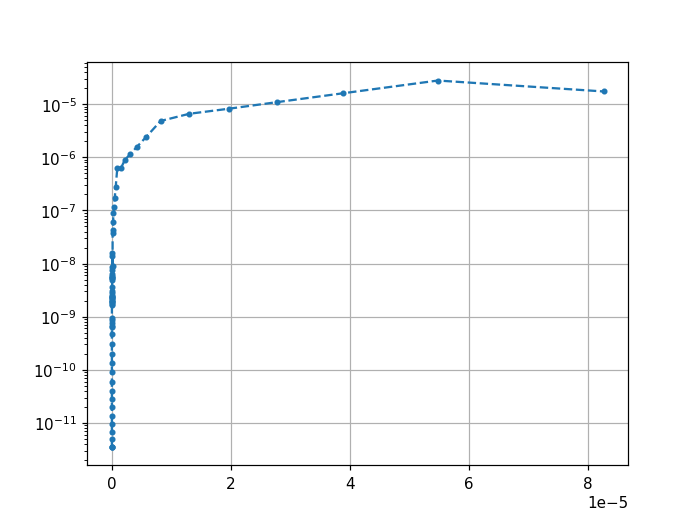

In [1212]:
plt.figure()
plt.plot(sol_t[:-1], sol_t[1:]-sol_t[:-1],'.--')
plt.grid()
plt.yscale('log')

<IPython.core.display.Javascript object>


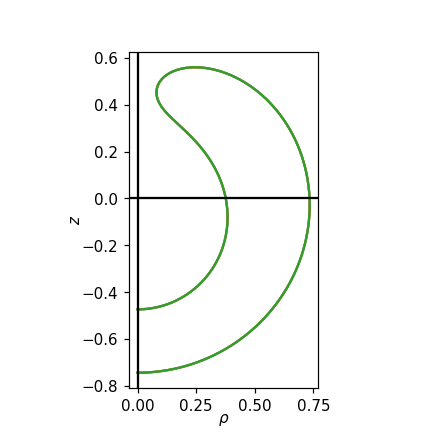

Text(0, 0.5, '$z$')

In [653]:
%matplotlib notebook
plt.figure(figsize=(4,4))
for t_j in np.linspace(0,t_max,3):#range(len(sol_radau.t)):
    j = np.argmin(np.abs(sol_t-t_j))

    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])
    
    P = get_int_field(-P_fur_j*1j)
    Z = get_int_field(Z_fur_j)
    
    plt.plot(P,Z, label=f't={sol_t[j]:.2f}')


    
    
plt.axis('scaled')
#plt.legend(ncol=2)
plt.axvline(0, color='k')
plt.axhline(0, color='k')

plt.xlabel(r'$\rho$', labelpad=-1)
plt.ylabel(r'$z$', labelpad=-1)


#P_fur0 = np.zeros(N)
#P_fur0[1::]=sol_y[:N-1,0]
#Z_fur0=sol_y[N-1:,0]

#Vol0, Sqr0,V_cal0 = get_VolSqr(P_fur0, Z_fur0)
#plt.grid()
#plt.title(fr'form '+'\n'+fr' $V={Vol0:.2f}, S={Sqr0:.2f}$, '+r'$\mathcal{V}=$'+fr'${V_cal0:.3f}$')

In [1119]:
dZ_arr = []
t_arr = []
En_arr = []
S_arr = []
V_arr = []
Press_arr = []
Sigma_arr = []
for j in range(len(sol_t)):

    P_fur_j,Z_fur_j = get_PZ_fur_from_pz_sym(sol_y[:,j])

    
    P = get_int_field(-P_fur_j*1j)
    Z = get_int_field(Z_fur_j)
    
    #plt.scatter(t_j,Z[0]-Z[-1],lw=1.5, label=f't={sol_t[j]:.2f}',color='k')
    t_arr.append(sol_t[j])
    dZ_arr.append(Z[0]-Z[-1])
    
    En_arr.append(get_Energy(P_fur_j,Z_fur_j))
    
    Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
    S_arr.append(Sqr)
    V_arr.append(Vol)
    
    Sigma,Pressure = get_Sigma_Pressure_from_arr(P_fur_j,Z_fur_j)
    Sigma_arr.append(Sigma)
    Press_arr.append(Pressure)

<IPython.core.display.Javascript object>


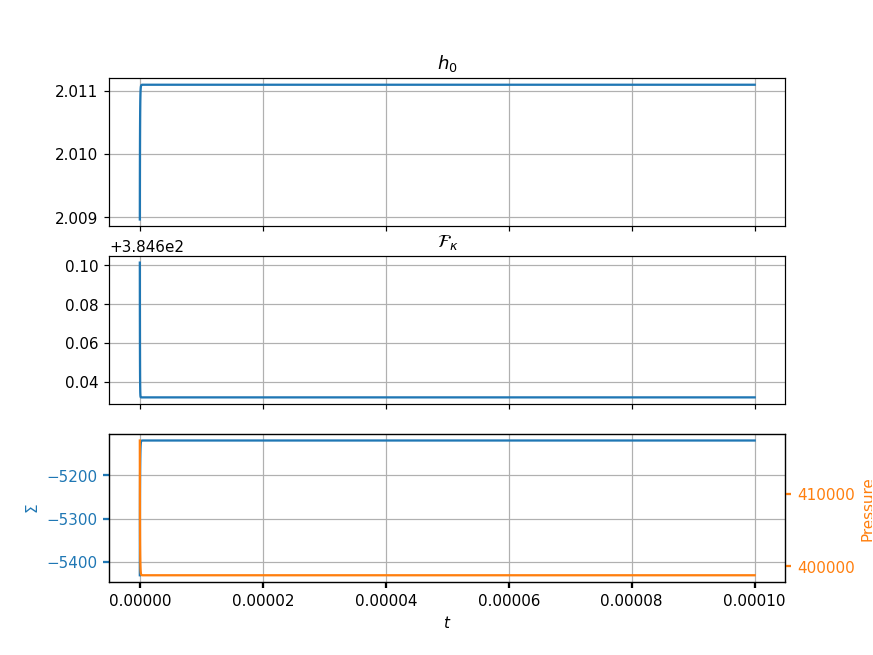

Text(0.5, 0, '$t$')

In [1120]:
fig,axs = plt.subplots(3,1,figsize=(8,6), sharex=True)

t_arr =np.array(t_arr)#.append(t_j)
dZ_arr = np.array(dZ_arr)#.append(Z[0]-Z[-1])
axs[0].plot(t_arr,dZ_arr)
axs[0].grid()
#axs[0].axhline(0, color='k')
axs[0].set_title(r'$h_0$')

# plt.figure()
# plt.plot(t_arr[1:],abs((dZ_arr[1:]-dZ_arr[:-1])/(t_arr[1:]-t_arr[:-1])))
# plt.grid()
# plt.yscale('log')



En_arr = np.array(En_arr)
S_arr = np.array(S_arr)
V_arr = np.array(V_arr)
axs[1].plot(t_arr,En_arr)
axs[1].set_title(r'$\mathcal{F}_\kappa$')

axs[1].grid()

#axs[1].set_xlabel(r'$t$')



p1,= axs[2].plot(t_arr,Sigma_arr)
axs[2].grid()
axs[2].set_ylabel(r'$\Sigma $')


twin1 = axs[2].twinx()

p2, = twin1.plot(t_arr,Press_arr,color='C1')




twin1.set_ylabel(r'Pressure')

axs[2].yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())

tkw = dict(size=4, width=1.5)
axs[2].tick_params(axis='y', colors=p1.get_color(), **tkw)
twin1.tick_params(axis='y', colors=p2.get_color(), **tkw)
axs[2].tick_params(axis='x', **tkw)
axs[2].set_xlabel(r'$t$')

<IPython.core.display.Javascript object>


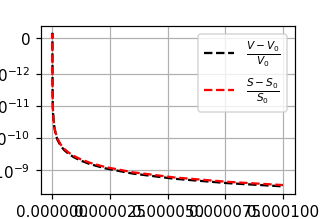

In [1121]:
%matplotlib notebook
Vol0, Sqr0 = get_VolSqr(Pfur_0, Zfur_0)
plt.figure(figsize=(3,2))
plt.grid()
Vol_ar=[]
Sqr_ar=[]
for j in range(len(sol_t)):
    P_fur_j,Z_fur_j = get_PZ_fur_from_pz_sym(sol_y[:,j])
    Vol,Sqr = get_VolSqr(P_fur_j, Z_fur_j)
    Vol_ar.append(Vol)
    Sqr_ar.append(Sqr)
Vol_ar=np.array(Vol_ar)
Sqr_ar=np.array(Sqr_ar)   
plt.plot(sol_t, Vol_ar/Vol0-1,'--', color='k', label=r'$\frac{V-V_0}{V_0}$')
plt.plot(sol_t, Sqr_ar/Sqr0-1,'--', color='r', label=r'$\frac{S-S_0}{S_0}$')

plt.legend()
plt.xlabel(r'$t$')
plt.yscale('symlog', linthresh=1e-12)

<IPython.core.display.Javascript object>


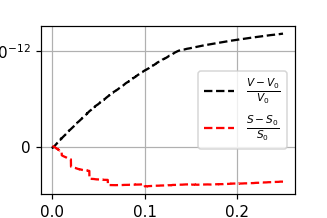

In [788]:
%matplotlib notebook
Vol0, Sqr0 = get_VolSqr(Pfur_0, Zfur_0)
plt.figure(figsize=(3,2))
plt.grid()
Vol_ar=[]
Sqr_ar=[]
for j in range(len(sol_t)):
    P_fur_j,Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])
    Vol,Sqr = get_VolSqr(P_fur_j, Z_fur_j)
    Vol_ar.append(Vol)
    Sqr_ar.append(Sqr)
Vol_ar=np.array(Vol_ar)
Sqr_ar=np.array(Sqr_ar)   
plt.plot(sol_t, Vol_ar/Vol0-1,'--', color='k', label=r'$\frac{V-V_0}{V_0}$')
plt.plot(sol_t, Sqr_ar/Sqr0-1,'--', color='r', label=r'$\frac{S-S_0}{S_0}$')

plt.legend()
plt.xlabel(r'$t$')
plt.yscale('symlog', linthresh=1e-12)

In [543]:
%matplotlib inline
@interact(i=(0,len(sol_t)-1,1))
def plot_PZ_fur(i):
    fig, ax = plt.subplots(figsize=(6,4))
    ax.grid()    
    ax.plot(np.abs(sol_y[:,i]),'.--',lw=1.5)
    ax.set_title(f't={sol_t[i]}')
    #ax.axis('scaled')
    ax.set_xlim(0, N)
    ax.set_ylim(1e-19, 1e0)
    ax.set_yscale('log')
    #ax.axis('scaled')


interactive(children=(IntSlider(value=106, description='i', max=213), Output()), _dom_classes=('widget-interac…

In [653]:
%matplotlib inline


@interact(k=(0, N-1))
def plot_sol_k(k):
    fig, axs = plt.subplots(1, 2, figsize=(8, 3))
    fig.tight_layout(pad=3.0)
    axs[0].plot(sol_t, sol_y[k+N-1, :], label=fr'Z[{k}]')
    axs[1].plot(sol_t[1:], np.abs(
        (sol_y[k+N-1, 1:]-sol_y[k+N-1, :-1])/(sol_t[1:]-sol_t[:-1])))
    if k > 0:
        axs[0].plot(sol_t, sol_y[k-1, :], label=fr'P[{k}]')
        axs[1].plot(sol_t[1:], np.abs(
            (sol_y[k-1, 1:]-sol_y[k-1, :-1])/(sol_t[1:]-sol_t[:-1])))

    axs[0].grid()
    axs[0].legend()

    axs[1].set_yscale('log')
    #axs[1].set_ylim(1e-11, 1e0)
    axs[1].set_ylabel(r'$|\partial_t|$')
    axs[1].grid()

interactive(children=(IntSlider(value=19, description='k', max=39), Output()), _dom_classes=('widget-interact'…

### State analys

In [572]:
t_max

0.01

In [172]:
# t_j=t_max
# j=np.argmin(np.abs(t_j-sol_t))
# P_fur_j, Z_fur_j = get_PZ_fur_from_pz(sol_y[:,j])

ValueError: could not broadcast input array from shape (75,) into shape (74,)

In [1151]:
t_j=t_max
j=np.argmin(np.abs(t_j-sol_t))
P_fur_j, Z_fur_j = get_PZ_fur_from_pz_sym(sol_y[:,j])

In [1214]:
t_j=1e-5
j=np.argmin(np.abs(t_j-sol_t))
P_fur_j, Z_fur_j = get_PZ_fur_from_pz_sym(sol_y[:,j])

In [1215]:
pz_end = sol_y[:,j]

In [1216]:
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.1846620624585849

In [1217]:
np.save(f'prolate_equilib_Vcal={Vcal:.4e}_N={(len(pz_end)+1)//2}.npy', pz_end)

In [1032]:
#np.save(f'stoma_equilib_Vcal={Vcal:.3e}_N={(len(pz_end)+1)//2}.npy', pz_end)

<IPython.core.display.Javascript object>


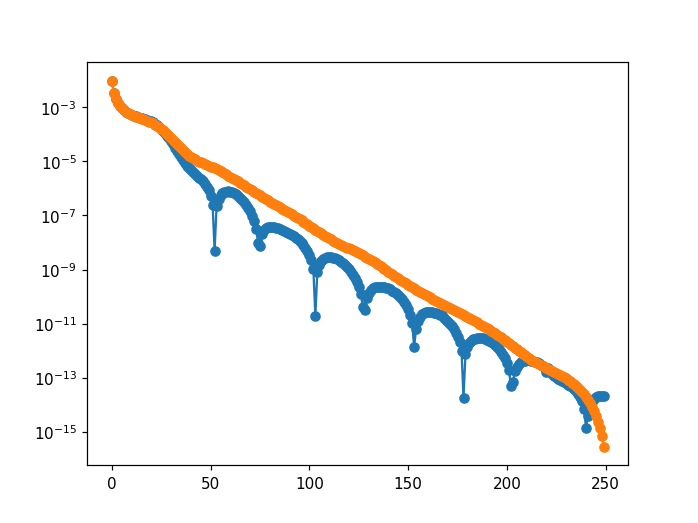

In [1218]:
plt.figure()
plt.plot(abs(Pfur_0)[1::2],'o-')
plt.plot(abs(P_fur_j)[1::2],'o-')

#plt.plot(abs(Zfur_0)[1::2],'.--')
#plt.plot(abs(Z_fur_j)[1::2],'.--')
plt.yscale('log')

In [1158]:
P0 = get_int_field(-1j*Pfur_0)
Z0 = get_int_field(Zfur_0)

P, P1,P2,P3,P4 = get_int_fields(-1j*Pfur_0)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Zfur_0)
V0 = np.sqrt(P1**2+Z1**2)

H0, force0 = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

In [1219]:
P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j)
Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j)
V = np.sqrt(P1**2+Z1**2)

H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 

<IPython.core.display.Javascript object>


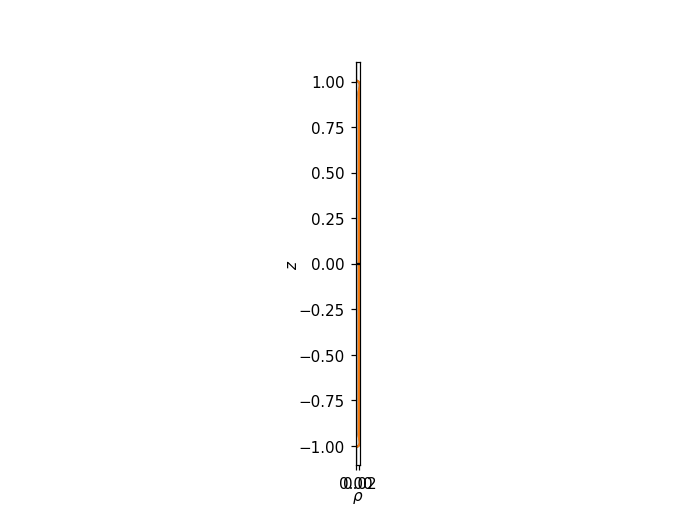

Text(0, 0.5, '$z$')

In [1160]:
%matplotlib notebook
plt.figure()

plt.plot(P0,Z0)


plt.plot(P,Z)
#plt.plot(P[::10],Z[::10],'.')

plt.axis('scaled')
#plt.legend(ncol=2)
plt.axvline(0, color='k')
plt.axhline(0, color='k')

plt.xlabel(r'$\rho$', labelpad=-1)
plt.ylabel(r'$z$', labelpad=-1)


In [281]:
# P_fur_j_cut, Z_fur_j_cut = get_PZ_fur_from_pz(sol_y[:81,j])

# P_cut, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j_cut)
# Z_cut, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j_cut)
# V_cut = np.sqrt(P1**2+Z1**2)

# H_cut, force_cut = get_H_force(P_cut,P1,P2,P3,P4,Z_cut,Z1,Z2,Z3,Z4) 
# plt.figure()

# plt.plot(P0,Z0)


# plt.plot(P,Z,'--')
# plt.plot(P_cut,Z_cut)


# plt.axis('scaled')
# #plt.legend(ncol=2)
# plt.axvline(0, color='k')
# plt.axhline(0, color='k')

# plt.xlabel(r'$\rho$', labelpad=-1)
# plt.ylabel(r'$z$', labelpad=-1)


In [1220]:
Sigma,Pressure= get_Sigma_Pressure(H,force,P,V)

In [1221]:
((force-force[::-1])/force)[:7]

array([ 8.89573577e-16,  3.12959750e-14, -1.66498644e-15,  5.43811193e-15,
        8.06324146e-16, -1.86284009e-15,  1.98118093e-15])

<IPython.core.display.Javascript object>


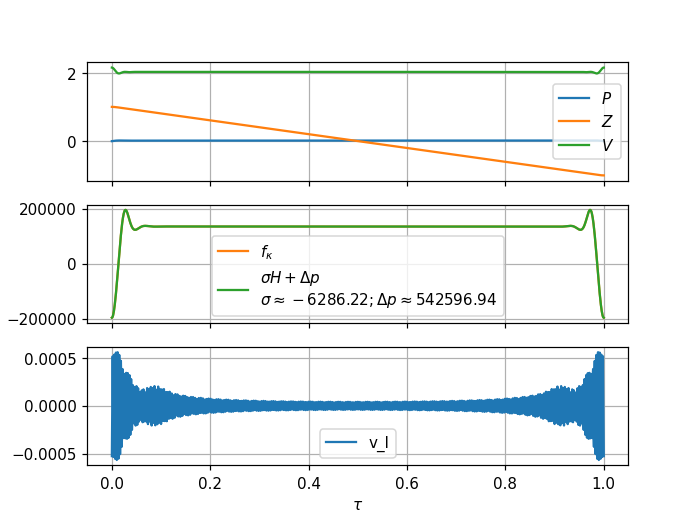

Text(0.5, 0, '$\\tau$')

In [1222]:
%matplotlib notebook
fig,axs = plt.subplots(3,1, sharex=True)
axs[0].plot(Tau_int,P)
axs[0].plot(Tau_int,Z)
axs[0].plot(Tau_int,V)
axs[0].grid()
axs[0].legend([r'$P$',r'$Z$',r'$V$'])

#axs[1].plot(H)

axs[1].plot(Tau_int,force, label=r'$f_\kappa$',color='C1')
axs[1].plot(Tau_int,Sigma*H+Pressure, 
            label=fr'$\sigma H + \Delta p$'+'\n'fr'$\sigma\approx{Sigma:.2f}; \Delta p \approx{Pressure:.2f}$',
            color='C2')
axs[1].legend()
axs[1].grid()

axs[2].plot(Tau_int,get_normal_velo(H, force, P, V), label='v_l')
#axs[2].plot(Tau_int,get_normal_velo(H, force, P, V)[::-1], label='v_l_inv')
#axs[2].plot(Tau_int,get_normal_velo((H+H[::-1])/2, (force+force[::-1])/2, (P+P[::-1])/2, (V+V[::-1])/2)[::-1], label='v_l_mean')

axs[2].legend()
axs[2].grid()
axs[2].set_xlabel(r'$\tau$')

<IPython.core.display.Javascript object>


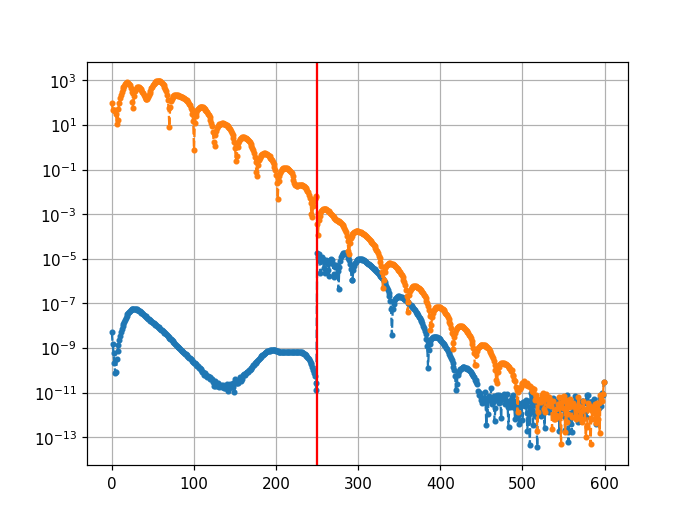

<IPython.core.display.Javascript object>


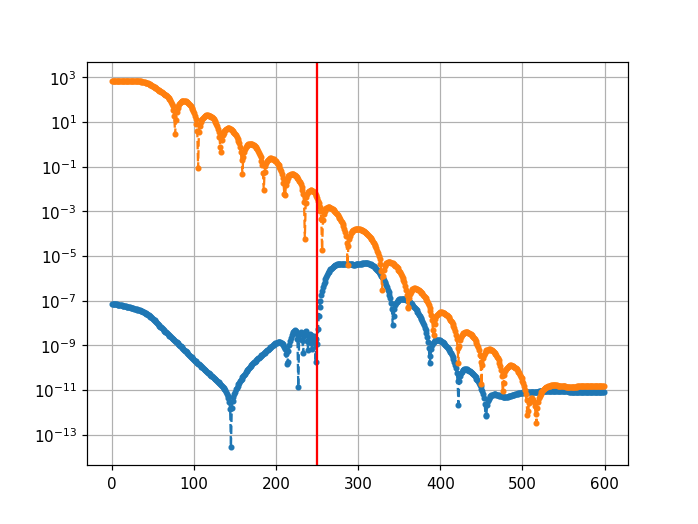

In [1223]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0])[::2],'.--')
plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[0])[::2],'.--')
plt.yscale('log')
plt.grid()
plt.axvline(N//2, color='red')

plt.figure()

plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[1])[1::2],'.--')
plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[1])[1::2],'.--')

plt.yscale('log')
plt.grid()
plt.axvline(N//2, color='red')


<IPython.core.display.Javascript object>


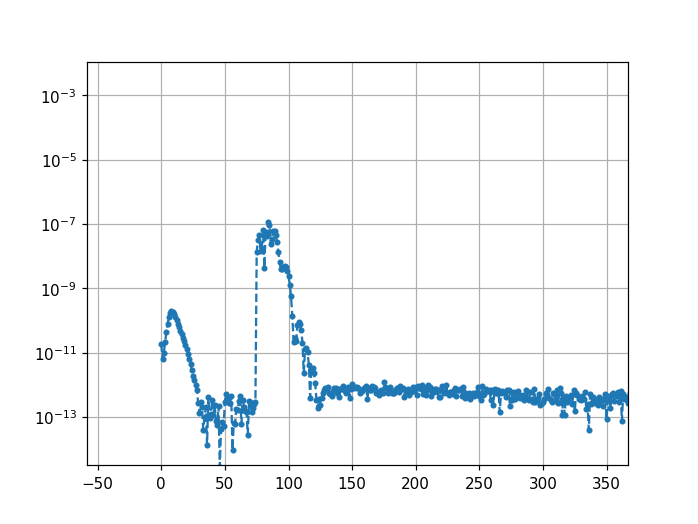

<IPython.core.display.Javascript object>


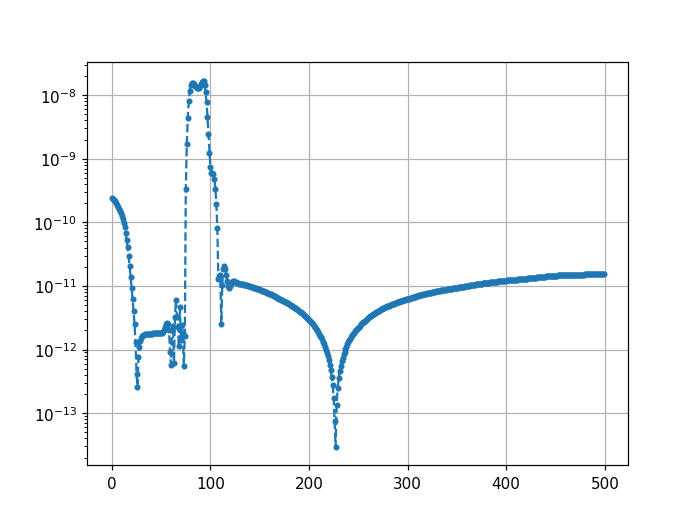

In [53]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0])[::2],'.--')
#plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[0])[::2],'.--')
plt.yscale('log')
plt.grid()
plt.figure()

plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[1])[1::2],'.--')
#plt.plot(abs(get_normal_velo_projects_full(Pfur_0, Zfur_0)[1])[1::2],'.--')

plt.yscale('log')
plt.grid()

In [945]:
H1 = (Z1*P2-P1*Z2)/V**3
H2 = -Z1/P/V

<IPython.core.display.Javascript object>


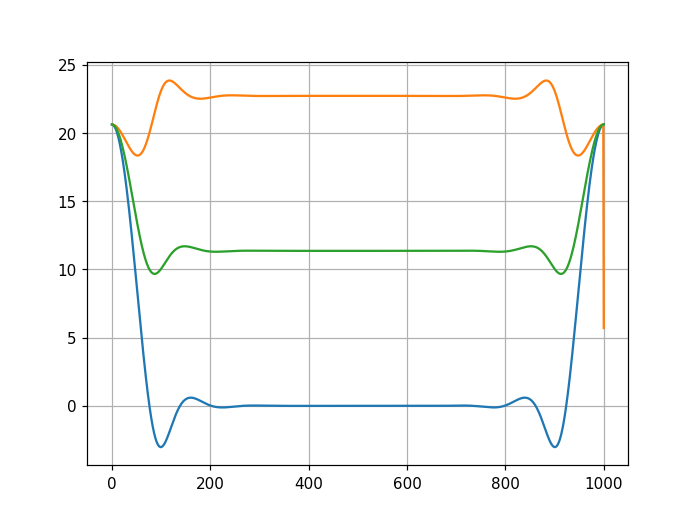

In [55]:
plt.figure()
plt.plot(H1)
plt.plot(H2)
plt.grid()
plt.plot(H/2)

<IPython.core.display.Javascript object>


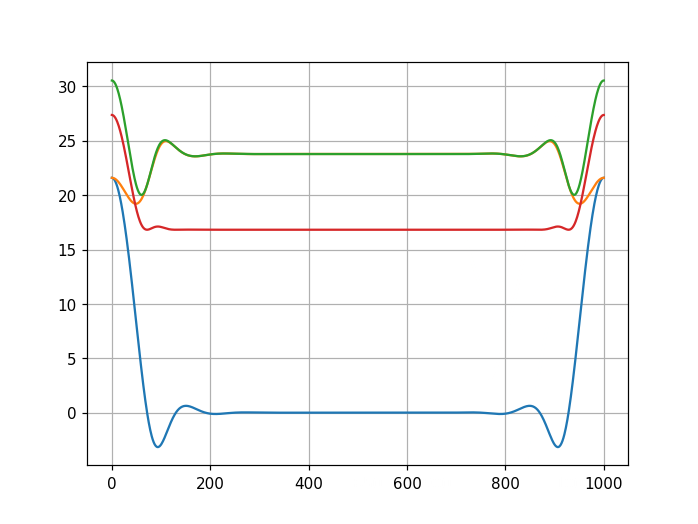

In [353]:
plt.figure()
a_H = get_a_H(P_fur_j, Z_fur_j)
H1,dl_H1 = get_H1_dl_H1_from_ar(P_fur_j, Z_fur_j)
_,H2 = get_H12_from_ar(P_fur_j, Z_fur_j)
#a_loc = 1/(H1**4 + dl_H1**2+H2**4)**(1/4)
r0 = P[N_int//2]
alpha=2
a_loc = 1/np.sqrt(H1**2+1/r0**2/alpha) 
plt.plot(H1)
plt.plot(H2)
plt.plot(1/a_H)
plt.plot(1/a_loc)

#plt.plot(get_a_H(P_fur_j, Z_fur_j))
#plt.plot(a_loc)
plt.grid()

#### Jac_normal

In [600]:
N_jac = 150

In [601]:
J = get_J_norm(P_fur_j,Z_fur_j, N_jac)

<IPython.core.display.Javascript object>


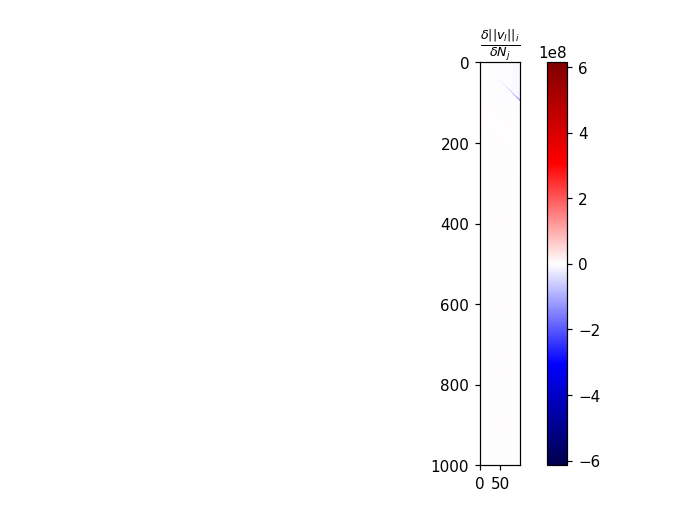

<IPython.core.display.Javascript object>


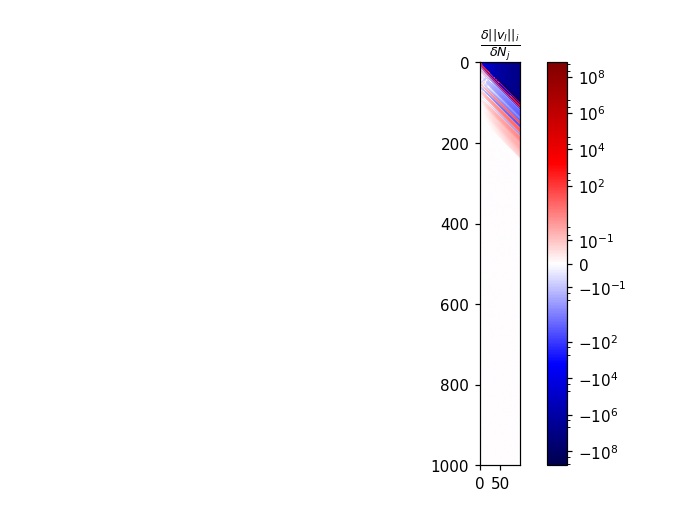

In [406]:
plt.figure()
plt.title(r'$\frac{\delta ||v_l||_i}{\delta N_j}$')
plt.imshow(J, norm=colors.CenteredNorm(0), cmap='seismic')
plt.colorbar()




lnrwidth=1e-2
gain=np.max(abs(J))

plt.figure()
plt.title(r'$\frac{\delta ||v_l||_i}{\delta N_j}$')
plt.imshow(J, norm=colors.AsinhNorm(linear_width=lnrwidth,
                                             vmin=-gain, vmax=gain), cmap='seismic')
plt.colorbar()

In [602]:
w,U = sc.linalg.eig(J[:N_jac])

<IPython.core.display.Javascript object>


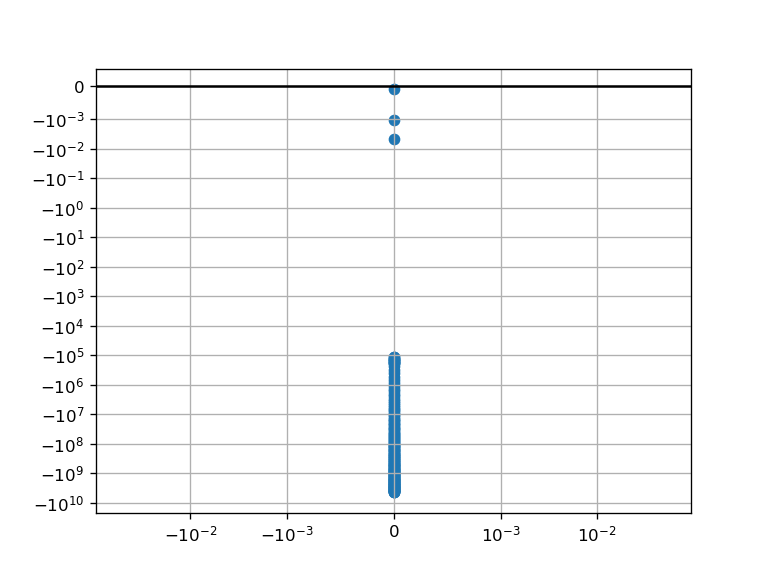

In [603]:
plt.figure()
plt.scatter(w.imag, w.real)
plt.grid()
plt.yscale('symlog', linthresh=1e-3)
plt.xscale('symlog', linthresh=1e-3)
plt.axhline(0, color='k')

In [604]:
N_jac_arr = np.arange(6,N_jac,1)

w_arr = np.zeros((6,len(N_jac_arr)))

for i in tqdm(range(len(N_jac_arr))):
    N_jac_ = N_jac_arr[i]
    w_,U_ = sc.linalg.eig(J[:N_jac_,:N_jac_])
    w_arr[:,i]=np.sort(-abs(w_))[-6:]

  0%|          | 0/144 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


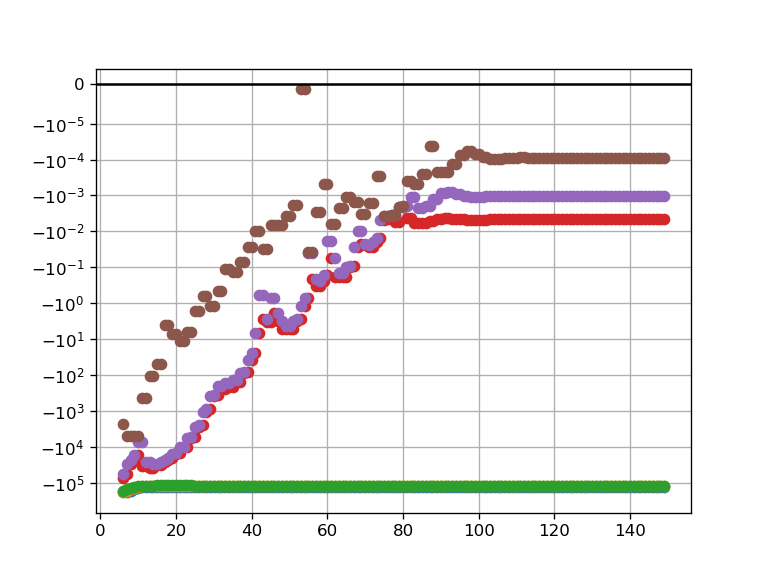

In [605]:
plt.figure()
for i in range(6):
    plt.plot(N_jac_arr,w_arr[i,:],'o')
plt.grid()
plt.yscale('symlog', linthresh=1e-5)
plt.axhline(0, color='k')

<IPython.core.display.Javascript object>


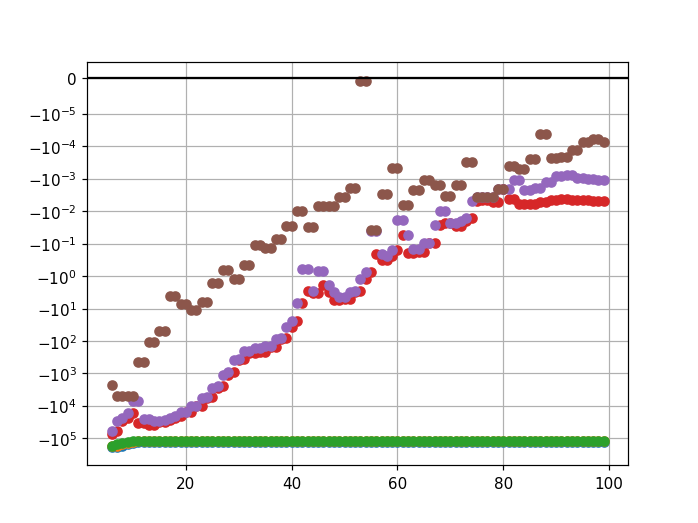

In [559]:
plt.figure()
for i in range(6):
    plt.plot(N_jac_arr,w_arr[i,:],'o')
plt.grid()
plt.yscale('symlog', linthresh=1e-5)
plt.axhline(0, color='k')

In [413]:

N_jac_arr = np.arange(10,N_jac,1)

s_arr = np.zeros((10,len(N_jac_arr)))

for i in tqdm(range(len(N_jac_arr))):
    N_jac_ = N_jac_arr[i]
    s = sc.linalg.svdvals(J[:,:N_jac_])
    s_arr[:,i]=np.sort(s.real)[:10]

  0%|          | 0/90 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


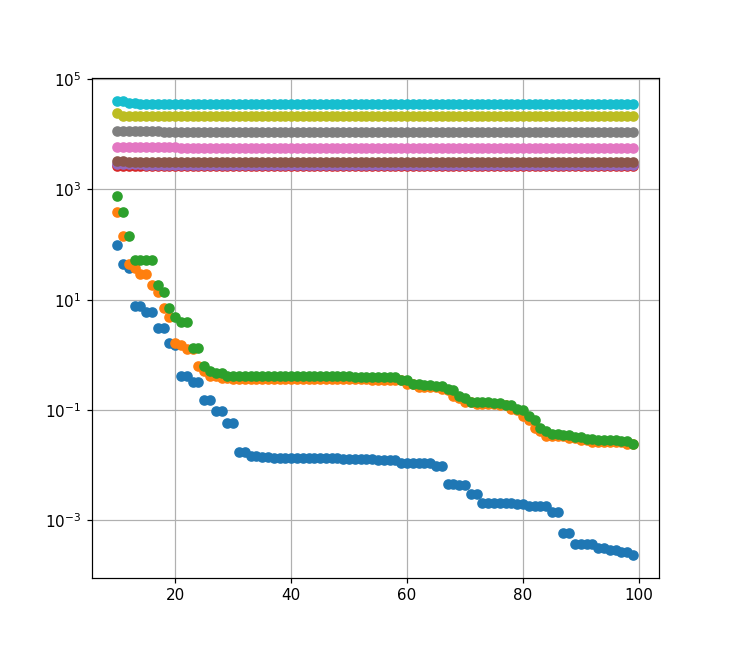

In [414]:
plt.figure()
for i in range(10):
    plt.plot(N_jac_arr,s_arr[i,:],'o')
plt.grid()
plt.yscale('log')
plt.axhline(0, color='k')

In [606]:
l_rho = -Z1/V;l_z = P1/V;

In [607]:
%matplotlib inline
@interact(m=(0,6), scale=(10,200,10))
def plot_m_pert(m,scale):
    w_m = np.sort(w)[::-1][m]
    #index_m = np.argmin(np.abs(w - w_m))
    index_m, = np.where(np.isclose(w, w_m))
    
    v_m = U[:, index_m].real.reshape(-1)
    plt.figure()
    plt.plot(v_m, '.--',label=f'w={w_m.real:.2e}')
    plt.yscale('symlog', linthresh=1e-4)
    plt.legend(loc='upper right')
    plt.grid()
    
    v_m /= scale
    dN = get_int_field(v_m)
    plt.figure()
    
    P_corr = P+l_rho*dN; Z_corr = Z+l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')
    
    plt.figure()
    
    P_corr = P-l_rho*dN; Z_corr = Z-l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')

interactive(children=(IntSlider(value=3, description='m', max=6), IntSlider(value=100, description='scale', ma…

In [416]:
%matplotlib inline
@interact(m=(0,6), scale=(10,200,10))
def plot_m_pert(m,scale):
    w_m = np.sort(w)[::-1][m]
    #index_m = np.argmin(np.abs(w - w_m))
    index_m, = np.where(np.isclose(w, w_m))
    
    v_m = U[:, index_m].real.reshape(-1)
    plt.figure()
    plt.plot(v_m, '.--',label=f'w={w_m.real:.2e}')
    plt.yscale('symlog', linthresh=1e-4)
    plt.legend(loc='upper right')
    plt.grid()
    
    v_m /= scale
    dN = get_int_field(v_m)
    plt.figure()
    
    P_corr = P+l_rho*dN; Z_corr = Z+l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')
    
    plt.figure()
    
    P_corr = P-l_rho*dN; Z_corr = Z-l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')

interactive(children=(IntSlider(value=3, description='m', max=6), IntSlider(value=100, description='scale', ma…

In [245]:
%matplotlib inline
@interact(m=(0,6), scale=(10,200,10))
def plot_m_pert(m,scale):
    w_m = np.sort(w)[::-1][m]
    #index_m = np.argmin(np.abs(w - w_m))
    index_m, = np.where(np.isclose(w, w_m))
    
    v_m = U[:, index_m].real.reshape(-1)
    plt.figure()
    plt.plot(v_m, '.--',label=f'w={w_m.real:.2e}')
    plt.yscale('symlog', linthresh=1e-4)
    plt.legend(loc='upper right')
    plt.grid()
    
    v_m /= scale
    dN = get_int_field(v_m)
    plt.figure()
    
    P_corr = P+l_rho*dN; Z_corr = Z+l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')
    
    plt.figure()
    
    P_corr = P-l_rho*dN; Z_corr = Z-l_z*dN
    plt.plot(np.hstack([-P[::-1],P]),np.hstack([Z[::-1],Z]),'--')
    plt.plot(np.hstack([-P_corr[::-1],P_corr]),np.hstack([Z_corr[::-1],Z_corr]))
    
    plt.title(f'w={w_m.real:.2e}')
    plt.axvline(0, color='k', lw=1)
    plt.axis('scaled')

interactive(children=(IntSlider(value=3, description='m', max=6), IntSlider(value=100, description='scale', ma…

In [612]:
U_zero = U[:,abs(w)<1e-2]
U_zero.shape

(150, 3)

In [613]:
VarE = -get_force_proj_N(P,P1,Z,Z1, force, N_jac)
VarVol = get_Var_Vol_proj_N(P,P1,Z,Z1, N_jac)
VarSqr = get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_jac)
VarVcal = VarVol/Vol - 3/2 * VarSqr/Sqr
VarVcal *= Vcal

In [614]:
VarE_zero = VarE.T @ U_zero
VarVol_zero = VarVol.T @ U_zero
VarSqr_zero = VarSqr.T @ U_zero

In [615]:
sc.linalg.svdvals(np.vstack([VarE_zero,VarVol_zero, VarSqr_zero]))

array([2.87583742e+02, 9.99022628e-01, 7.79405833e-17])

$$
\delta \mathcal{V}= \mathcal{V}\left(\frac{\delta V}{V} -\frac{3}{2}\frac{\delta S}{S}\right)
$$

In [616]:
VarVcal_zero = VarVol_zero/Vol - 3/2 * VarSqr_zero/Sqr
VarVcal_zero *= Vcal

In [508]:
step_sizes=np.logspace(-9,-4,20)
for step_size in step_sizes:
    m=3
    w_m = np.sort(w)[::-1][m]
    #index_m = np.argmin(np.abs(w - w_m))
    index_m, = np.where(np.isclose(w, w_m))
    
    delta_N_fur = U[:, index_m].real.reshape(-1)*step_size
    
    
    delta_N = get_int_field(delta_N_fur)
    
    ### find new fields ###
    P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N
    
    P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:400]).real
    Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:400].real
    Vol_j = get_VolSqr(P_fur_j, Z_fur_j)[0]
    Vol_new_pl,Sqr_new_pl = get_VolSqr(P_fur_new, Z_fur_new)
    
    ### find new fields ###
    P_new = P-l_rho*delta_N;Z_new = Z-l_z*delta_N
    
    P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:400]).real
    Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:400].real
    Vol_new_m,Sqr_new_m = get_VolSqr(P_fur_new, Z_fur_new)
    
    #print((Vol_new_pl-Vol_new_m)/step_size/2, VarVol.T @ delta_N_fur/step_size *(2*np.pi))
    print((Sqr_new_pl-Sqr_new_m)/step_size/2, VarSqr.T @ delta_N_fur/step_size *(2*np.pi))
    #print((get_Energy(P_fur_new, Z_fur_new)-get_Energy(P_fur_j, Z_fur_j))/step_size, VarE.T @ delta_N_fur/step_size *(2*np.pi))

3.375077994860476e-05 3.3106958663540015e-05
3.3434236703711264e-05 3.31069586639093e-05
3.277978588676359e-05 3.3106958659843055e-05
3.302645919182882e-05 3.310695866206901e-05
3.320328772398674e-05 3.310695865969635e-05
3.318105856223465e-05 3.310695866400452e-05
3.3136702463773676e-05 3.310695866481458e-05
3.312817185312431e-05 3.310695866439824e-05
3.3114796408460354e-05 3.310695866499649e-05
3.310912539302693e-05 3.3106958662696926e-05
3.310754241888358e-05 3.310695866379798e-05
3.310466863465739e-05 3.310695865997189e-05
3.3107949920321995e-05 3.3106958664839825e-05
3.310612222184651e-05 3.310695865867147e-05
3.310382294412835e-05 3.310695866420198e-05
3.309683992739187e-05 3.3106958661674476e-05
3.307284030526367e-05 3.310695866554268e-05
3.2992439510458686e-05 3.310695865845607e-05
3.2722347006608136e-05 3.3106958658055484e-05
3.181463092971626e-05 3.310695866427679e-05


In [617]:
_,sng,U_sng =sc.linalg.svd(np.vstack([VarVcal_zero]))
vec = U_sng[0]

In [618]:
VarVcal_zero.T @ U_sng[0], VarVcal_zero.T @ U_sng[1], VarVcal_zero.T @ U_sng[2]

(0.6437100228550863, 0.0, -5.84885779199751e-17)

In [619]:
VarE_zero.T @ U_sng[0], VarE_zero.T @ U_sng[1], VarE_zero.T @ U_sng[2]

(-287.5791128317192, 6.887823644774471e-13, 4.923653105777352e-13)

In [621]:
step_size=5e-3

In [622]:
delta_N_fur = (step_size/(VarVcal_zero.T @ U_sng[0])*(U_zero @ U_sng[0])).real/(2*np.pi)
delta_N = get_int_field(delta_N_fur)
print(VarVcal.T @ delta_N_fur*2*np.pi)
### find new fields ###
P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N

P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real


0.005000000000000004


In [623]:
Vol_new,Sqr_new = get_VolSqr(P_fur_new,Z_fur_new)
Vcal_new = Vol_new/4/np.pi*3/(Sqr_new/4/np.pi)**(3/2)

Vcal_new-Vcal

0.004953321543907596

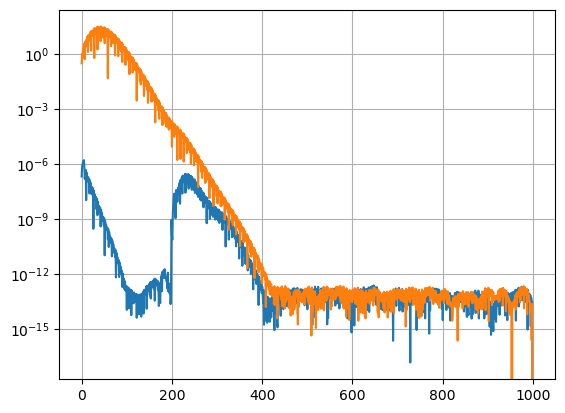

In [623]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0]))
plt.plot(abs(get_normal_velo_projects_full(P_fur_new, Z_fur_new)[0]))

plt.yscale('log')
plt.grid()

<IPython.core.display.Javascript object>


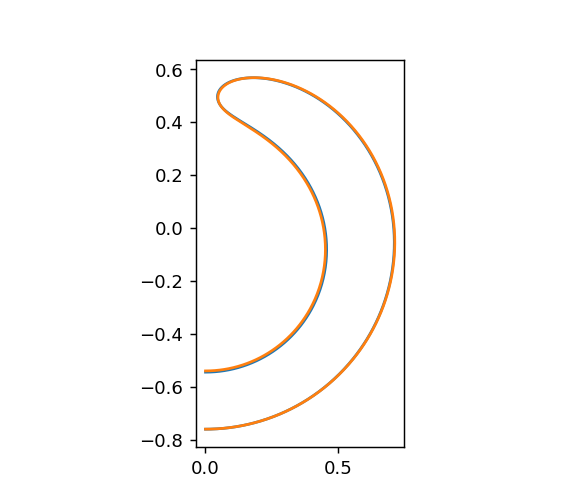

(-0.03575169531079537,
 0.7507856015267027,
 -0.8255105889537315,
 0.6350398031089611)

In [531]:
plt.figure()
plt.plot(P,Z)
plt.plot(P_new, Z_new)
plt.axis('scaled')

#### Jac_normal sym

In [1224]:
N_jac = N

In [1226]:
J = get_J_norm(P_fur_j,Z_fur_j, N_jac)

In [1227]:
J_sym = J[::2,::2]

In [1228]:
w_sym,U_sym = sc.linalg.eig(J_sym[:N_jac//2])
w,U = sc.linalg.eig(J[:N_jac])

In [ ]:
%matplotlib notebook
plt.figure()
plt.scatter(w.imag, w.real)
plt.scatter(w_sym.imag, w_sym.real,s=8,color='red')

#plt.grid()
plt.yscale('symlog', linthresh=1e-3)
plt.xscale('symlog', linthresh=1e-3)
plt.axhline(0, color='k')
plt.grid()

In [ ]:
N_jac_sym_arr = np.arange(6,N_jac//2,1)

w_arr = np.zeros((6,len(N_jac_sym_arr)))

for i in tqdm(range(len(N_jac_sym_arr))):
    N_jac_sym_ = N_jac_sym_arr[i]
    w_,U_ = sc.linalg.eig(J_sym[:N_jac_sym_,:N_jac_sym_])
    w_arr[:,i]=np.sort(w_.real)[-6:]

<IPython.core.display.Javascript object>


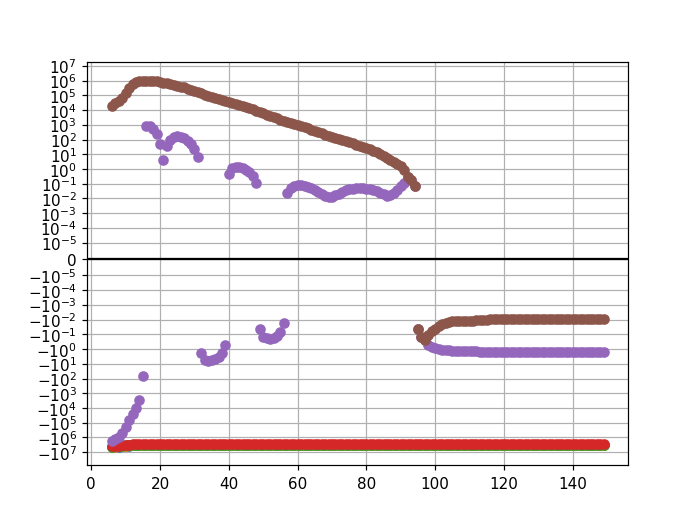

In [831]:
plt.figure()
for i in range(6):
    plt.plot(N_jac_sym_arr,w_arr[i,:],'o')
plt.grid()
plt.yscale('symlog', linthresh=1e-5)
plt.axhline(0, color='k')

In [1229]:
l_rho = -Z1/V;l_z = P1/V;

In [1171]:
U_sym_zero = U_sym[:,abs(w_sym)<1e-1]
U_sym_zero.shape

(220, 0)

In [1230]:
U_sym,s,Vh = sc.linalg.svd(J_sym)
print(s[-1:-4:-1])
U_sym_zero = Vh[s<1e2].T
U_sym_zero.shape

[1.02265792e+00 9.51542941e+01 3.28450407e+07]


(250, 2)

In [1231]:
VarE = -get_force_proj_N(P,P1,Z,Z1, force, N_jac)
VarVol = get_Var_Vol_proj_N(P,P1,Z,Z1, N_jac)
VarSqr = get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_jac)
VarVcal = VarVol/Vol - 3/2 * VarSqr/Sqr
VarVcal *= Vcal

VarE_sym=VarE[::2]
VarVcal_sym = VarVcal[::2]


In [1232]:
VarVcal_sym_zero = VarVcal_sym.T @ U_sym_zero

In [1233]:
_,sng,U_sng =sc.linalg.svd(np.vstack([VarVcal_sym_zero]))

In [1234]:
VarVcal_sym_zero.T @ U_sng[0], VarVcal_sym_zero.T @ U_sng[1]

(-0.9766422501628111, 1.6653345369377348e-16)

In [1235]:
step_size=-1e-2

In [1236]:
delta_N_fur_sym = (step_size/(VarVcal_sym_zero.T @ U_sng[0])*(U_sym_zero @ U_sng[0])).real/(2*np.pi)
delta_N_fur = np.zeros(2*len(delta_N_fur_sym))
delta_N_fur[::2]=delta_N_fur_sym

delta_N = get_int_field(delta_N_fur)
print(VarVcal.T @ delta_N_fur*2*np.pi)
### find new fields ###
P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N

P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real


-0.010000000000000002


In [1237]:
Vol_new,Sqr_new = get_VolSqr(P_fur_new,Z_fur_new)
Vcal_new = Vol_new/4/np.pi*3/(Sqr_new/4/np.pi)**(3/2)
Vcal_new-Vcal

-0.01025999900016139

<IPython.core.display.Javascript object>


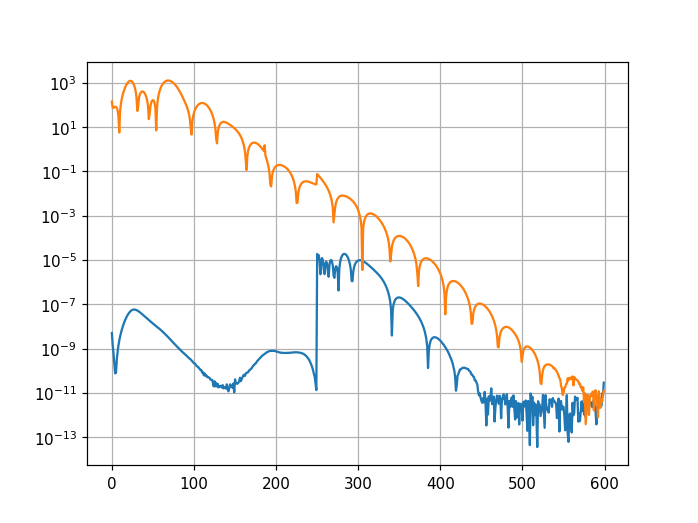

In [1238]:
plt.figure()
plt.plot(abs(get_normal_velo_projects_full(P_fur_j, Z_fur_j)[0][::2]))
plt.plot(abs(get_normal_velo_projects_full(P_fur_new, Z_fur_new)[0][::2]))

plt.yscale('log')
plt.grid()

<IPython.core.display.Javascript object>


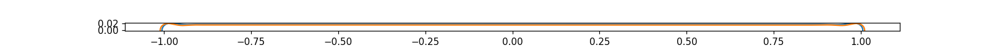

(-1.1117507717400819,
 1.1117507717400819,
 -0.0010599317399375367,
 0.022258566538688268)

In [1182]:
plt.figure()
plt.plot(Z,P)
plt.plot(Z_new,P_new)
plt.axis('scaled')

### Find brunch

In [766]:
t_max=0.01
#step_size=-5e-3

In [290]:
P_fur_new,Z_fur_new = get_PZ_fur_from_pz_sym(np.load('oblate_equilib_Vcal=5.432e-01_N=75.npy'))
Vol,Sqr = get_VolSqr(P_fur_new,Z_fur_new)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.5432000089241511

In [304]:
P_fur_j,Z_fur_j = get_PZ_fur_from_pz_sym(np.load('oblate_equilib_Vcal=5.050e-01_N=75.npy'))
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.5049789580788704

In [771]:
P_fur_j,Z_fur_j = get_PZ_fur_from_pz_sym(np.load('prolate_equilib_Vcal=3.376e-01_N=75.npy'))
Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
Vcal

0.33758172780972484

In [767]:
def fun_a(t,pz):
    return get_normal_velo_sym_fur_1d(pz)

In [293]:
while Vcal>0.5:
    Pfur_0,Zfur_0 = P_fur_new.copy(), Z_fur_new.copy()
    Pfur_0,Zfur_0 = make_constant_v_repar(Pfur_0,Zfur_0, N)
    
    sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_sym_from_PZ_fur(Pfur_0, Zfur_0), 
                               method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

    sol_t = sol_rad.t.copy()
    sol_y = sol_rad.y.copy()


    t_j=t_max
    j=np.argmin(np.abs(t_j-sol_t))
    P_fur_j, Z_fur_j = get_PZ_fur_from_pz_sym(sol_y[:,j])



    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j)
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 


    pz_end = sol_y[:,j]
    Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
    Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
    print(f'Vcal={Vcal:.3e}','|',f'v_max={abs(get_normal_velo(H,force, P,V)).max():.1e}')
    if abs(get_normal_velo(H,force, P,V)).max()>1e-5:
        t_max *=1.1
        print(f'Extend t_max={t_max}')
        
    np.save(f'oblate_equilib_Vcal={Vcal:.3e}_N={(len(pz_end)+1)//2}.npy', pz_end)

    J = get_J_norm(P_fur_j,Z_fur_j, N_jac)
    J_sym = J[::2,::2]
    w_sym,U_sym = sc.linalg.eig(J_sym[:N_jac//2])


    U_sym_zero = U_sym[:,abs(w_sym)<1e-4]
    U_sym_zero.shape

    VarE = -get_force_proj_N(P,P1,Z,Z1, force, N_jac)
    VarVol = get_Var_Vol_proj_N(P,P1,Z,Z1, N_jac)
    VarSqr = get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_jac)
    VarVcal = VarVol/Vol - 3/2 * VarSqr/Sqr
    VarVcal *= Vcal

    VarVcal_sym = VarVcal[::2]


    VarVcal_sym_zero = VarVcal_sym.T @ U_sym_zero

    _,sng,U_sng =sc.linalg.svd(np.vstack([VarVcal_zero]))
    vec = U_sng[0]

    delta_N_fur_sym = (step_size/(VarVcal_sym_zero.T @ U_sng[0])*(U_sym_zero @ U_sng[0])).real/(2*np.pi)
    delta_N_fur = np.zeros(2*len(delta_N_fur_sym))
    delta_N_fur[::2]=delta_N_fur_sym

    delta_N = get_int_field(delta_N_fur)
    ### find new fields ###
    P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N

    P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
    Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real

Vcal=5.432e-01 | v_max=2.9e-09
Vcal=5.412e-01 | v_max=1.9e-08
Vcal=5.392e-01 | v_max=3.8e-09
Vcal=5.372e-01 | v_max=3.4e-09
Vcal=5.352e-01 | v_max=7.4e-09
Vcal=5.332e-01 | v_max=2.8e-09
Vcal=5.312e-01 | v_max=2.5e-09
Vcal=5.311e-01 | v_max=1.7e-08
Vcal=5.291e-01 | v_max=1.8e-08
Vcal=5.271e-01 | v_max=6.0e-09
Vcal=5.251e-01 | v_max=4.3e-08
Vcal=5.231e-01 | v_max=4.4e-09
Vcal=5.210e-01 | v_max=2.3e-08
Vcal=5.190e-01 | v_max=3.2e-08
Vcal=5.170e-01 | v_max=1.4e-08
Vcal=5.150e-01 | v_max=8.1e-09
Vcal=5.130e-01 | v_max=3.2e-08
Vcal=5.110e-01 | v_max=1.1e-08
Vcal=5.090e-01 | v_max=6.0e-09
Vcal=5.070e-01 | v_max=2.2e-08
Vcal=5.050e-01 | v_max=3.1e-08
Vcal=5.030e-01 | v_max=3.2e-08
Vcal=5.010e-01 | v_max=1.6e-08
Vcal=4.990e-01 | v_max=6.2e-09


In [768]:
Vcal

0.37822676287110824

In [440]:
t_max=0.01

In [47]:
P_fur_j,Z_fur_j = get_PZ_fur_from_pz_sym(np.load('prolate_equilib_Vcal=3.274e-01_N=75.npy'))

In [770]:
while Vcal>0.3:
    Pfur_0,Zfur_0 = P_fur_new.copy(), Z_fur_new.copy()
    Pfur_0,Zfur_0 = make_constant_v_repar(Pfur_0,Zfur_0, N)
    
    sol_rad = sc.integrate.solve_ivp(fun_a, (0., t_max), get_pz_sym_from_PZ_fur(Pfur_0, Zfur_0), 
                               method='Radau', jac=lambda t,pz:jac(pz),atol=atol_arr,rtol=rtol);

    sol_t = sol_rad.t.copy()
    sol_y = sol_rad.y.copy()


    t_j=t_max
    j=np.argmin(np.abs(t_j-sol_t))
    P_fur_j, Z_fur_j = get_PZ_fur_from_pz_sym(sol_y[:,j])



    P, P1,P2,P3,P4 = get_int_fields(-1j*P_fur_j)
    Z, Z1,Z2,Z3,Z4 = get_int_fields(Z_fur_j)
    V = np.sqrt(P1**2+Z1**2)
    l_rho = -Z1/V;l_z = P1/V;
    H, force = get_H_force(P,P1,P2,P3,P4,Z,Z1,Z2,Z3,Z4) 


    pz_end = sol_y[:,j]
    Vol,Sqr = get_VolSqr(P_fur_j,Z_fur_j)
    Vcal = Vol/4/np.pi*3/(Sqr/4/np.pi)**(3/2)
    print(f'Vcal={Vcal:.3e}','|',f'v_max={abs(get_normal_velo(H,force, P,V)).max():.1e}')
    if abs(get_normal_velo(H,force, P,V)).max()>1e-7:
        t_max *=1.1
        print(f'Extend t_max={t_max}')
        
    np.save(f'prolate_equilib_Vcal={Vcal:.3e}_N={(len(pz_end)+1)//2}.npy', pz_end)

    J = get_J_norm(P_fur_j,Z_fur_j, N_jac)
    J_sym = J[::2,::2]
    w_sym,U_sym = sc.linalg.eig(J_sym[:N_jac//2])


    U_sym_zero = U_sym[:,abs(w_sym)<2e-2]
    U_sym_zero.shape

    VarE = -get_force_proj_N(P,P1,Z,Z1, force, N_jac)
    VarVol = get_Var_Vol_proj_N(P,P1,Z,Z1, N_jac)
    VarSqr = get_Var_Sqr_proj_N(P,P1,Z,Z1,H, N_jac)
    VarVcal = VarVol/Vol - 3/2 * VarSqr/Sqr
    VarVcal *= Vcal

    VarVcal_sym = VarVcal[::2]


    VarVcal_sym_zero = VarVcal_sym.T @ U_sym_zero

    _,sng,U_sng =sc.linalg.svd(np.vstack([VarVcal_sym_zero]))


    delta_N_fur_sym = (step_size/(VarVcal_sym_zero.T @ U_sng[0])*(U_sym_zero @ U_sng[0])).real/(2*np.pi)
    delta_N_fur = np.zeros(2*len(delta_N_fur_sym))
    delta_N_fur[::2]=delta_N_fur_sym

    delta_N = get_int_field(delta_N_fur)
    ### find new fields ###
    P_new = P+l_rho*delta_N;Z_new = Z+l_z*delta_N

    P_fur_new = (1j*np.fft.rfft(get_ext_array(P_new,'p'), norm='forward')[:N]).real
    Z_fur_new = np.fft.rfft(get_ext_array(Z_new,'z'), norm='forward')[:N].real

Vcal=3.681e-01 | v_max=3.6e-08
Vcal=3.579e-01 | v_max=2.4e-08
Vcal=3.478e-01 | v_max=9.1e-08
Vcal=3.376e-01 | v_max=1.7e-07
Extend t_max=0.011000000000000001
Vcal=3.274e-01 | v_max=6.9e-07
Extend t_max=0.012100000000000001
Vcal=3.172e-01 | v_max=2.7e-06
Extend t_max=0.013310000000000002
Vcal=3.070e-01 | v_max=9.2e-06
Extend t_max=0.014641000000000003
Vcal=2.967e-01 | v_max=5.6e-05
Extend t_max=0.016105100000000004


### Continue intagrate with more N

In [42]:
data = np.load('dyn_rad_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=1.0_N=80_n_int=120_rad_atol=1.00e-09.npy', allow_pickle=True).item()
sol_y = data['y']
sol_t=data['t']

t_max = np.max(sol_t)

In [509]:
N = 160
n_int=300

In [510]:
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

In [511]:
weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

In [512]:
t_j=2.
j=np.argmin(np.abs(t_j-sol_t))

In [380]:
N = 120
n_int=300
j_N = np.arange(N+1)
tau_N = j_N/N
N_int = n_int*20

Tau_int = np.arange(N_int+1)/(N_int)
tau_int = np.arange(n_int+1)/(n_int)

dtau_int = tau_int.reshape(-1,1) - Tau_int.reshape(1,-1) 

Kron = (np.abs(dtau_int)<1e-6)
AKron = ~Kron

weights_simp1 = np.zeros_like(Tau_int)
weights_simp2 = np.zeros_like(Tau_int)

weights_simp1 +=1
weights_simp1[0]=1/2; weights_simp1[-1]=1/2

weights_simp2[::2] +=1
weights_simp2[::2][0]=1/2; weights_simp2[::2][-1]=1/2

weights_simp = 4/3*weights_simp1 - 2/3*weights_simp2
weights_simp /= N_int

In [513]:
t_start = sol_t[j]
pz_start = sol_y[:,j]

In [514]:
N_old = (pz_start.shape[0]+1)//2
N_old

120

In [515]:
### Resize ###
pz_start = np.zeros(2*N-1)
pz_start[:N_old-1] = sol_y[:,j][:N_old-1]
pz_start[N-1:N-1 +N_old] = sol_y[:,j][N_old-1:]

In [133]:
ev = 0
def fun_a(t,pz):
    global ev
    if ev % 500 == 0:
        print(t)
        print(pz)
    ev+=1
    return get_velo_a_fur_1d(pz)

In [134]:
t_end = 2.

In [135]:
atol = 1e-9
rtol = atol/10

In [86]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:j_a_fun(pz),atol=atol, rtol=rtol);

0.19456005535713722
[ 4.68945895e-01 -6.44248843e-02  9.36665693e-03  1.25062256e-02
  1.81155125e-03  2.33054832e-03  3.33924336e-04 -5.05820479e-03
 -2.30426361e-03  2.61364560e-04  1.19525954e-03  4.49617355e-04
  4.58022828e-05 -1.89900496e-04 -1.38368881e-04 -4.72437726e-05
  3.17663923e-05  5.45062307e-05  2.05197357e-05 -1.14158125e-05
 -1.94776949e-05 -5.98727607e-06  3.98337736e-06  4.85877652e-06
  1.65096146e-06 -3.95139830e-07 -9.16260926e-07 -9.02529610e-07
 -3.24431286e-07  3.36822227e-07  5.02975664e-07  1.28963799e-07
 -1.88380915e-07 -1.62888293e-07 -5.51588565e-09  5.16768776e-08
  2.26793718e-08  5.44969168e-09  5.14367961e-09 -4.29033625e-09
 -1.38025294e-08 -5.97373172e-09  6.77503520e-09  7.14843057e-09
 -5.57044397e-10 -3.54295096e-09 -8.43915754e-10  9.90566146e-10
  1.59492316e-10 -3.71485811e-10  1.97147162e-10  4.30721985e-10
 -1.39326218e-10 -3.77636253e-10 -5.79359730e-11  2.23267811e-10
  6.16307498e-11 -9.06759797e-11 -6.52045228e-11  4.51715521e-11
  5.3

In [137]:
sol_rad = sc.integrate.solve_ivp(fun_a, 
          (t_start, t_end), pz_start, 
           method='Radau', jac=lambda t,pz:j_a_fun(pz),atol=atol, rtol=rtol);

0.7
[ 3.73983512e-01 -7.70426161e-02  3.75241746e-02  2.68817925e-02
  1.28425198e-02 -1.80873615e-03 -9.14641245e-03 -9.88644252e-03
 -8.97869178e-04  4.72898683e-03  3.91758030e-03 -6.38410388e-05
 -2.21112767e-03 -1.60398751e-03  1.09734846e-04  1.05135201e-03
  7.55366473e-04 -7.30886133e-05 -5.46986751e-04 -3.85817912e-04
  5.58033846e-05  3.00224883e-04  1.99439420e-04 -4.27347816e-05
 -1.66737986e-04 -1.03378738e-04  2.94512422e-05  9.29307399e-05
  5.46544839e-05 -1.89523015e-05 -5.25423064e-05 -2.96167143e-05
  1.20628499e-05  3.02278363e-05  1.62337365e-05 -7.74363407e-06
 -1.75607070e-05 -8.90758932e-06  4.95722839e-06  1.02394109e-05
  4.90119641e-06 -3.13994893e-06 -5.99648456e-06 -2.71645280e-06
  1.97755228e-06  3.53434567e-06  1.51365066e-06 -1.24664118e-06
 -2.09484247e-06 -8.43680352e-07  7.86665963e-07  1.24548482e-06
  4.69284614e-07 -4.95761923e-07 -7.42275269e-07 -2.60920583e-07
  3.11748845e-07  4.43530339e-07  1.44888867e-07 -1.96047786e-07
 -2.65878081e-07 -8.0

1.4185969155969322
[ 3.14633338e-01 -8.04433280e-02  6.70224962e-02  3.57649310e-02
  1.19110278e-02 -1.23172659e-02 -1.96598455e-02 -7.67510729e-03
  8.60251104e-03  1.16327827e-02  1.85617129e-03 -7.47936212e-03
 -6.82009721e-03  6.82196559e-04  5.80321478e-03  3.79405750e-03
 -1.74790187e-03 -4.40697903e-03 -1.95279839e-03  2.11455146e-03
  3.25888861e-03  7.55115701e-04 -2.15247124e-03 -2.32058459e-03
  1.75377792e-05  1.99192787e-03  1.54856452e-03 -4.98300380e-04
 -1.72855487e-03 -9.33930668e-04  7.63976755e-04  1.41744859e-03
  4.57191391e-04 -8.79320133e-04 -1.10041088e-03 -1.03347243e-04
  8.88358265e-04  7.99943533e-04 -1.46809344e-04 -8.27406757e-04
 -5.31986303e-04  3.09291734e-04  7.22492815e-04  3.03946155e-04
 -4.01031160e-04 -5.94912073e-04 -1.19595981e-04  4.36914760e-04
  4.59971427e-04 -2.16597620e-05 -4.31160948e-04 -3.29226903e-04
  1.22518734e-04  3.96047068e-04  2.10364408e-04 -1.87556525e-04
 -3.42241787e-04 -1.08185918e-04  2.22281838e-04  2.78600013e-04
  2.51

In [87]:
sol_t = sol_rad.t.copy()
sol_y = sol_rad.y.copy()

In [140]:
sol_t = np.concatenate((sol_t[:j], sol_rad.t))
sol_y = np.concatenate((sol_y[:,:j], sol_rad.y), axis=1)

In [256]:
t_max = t_end

In [254]:
np.save(f'dyn_corr_rad_to_t=1_{t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', {'t':sol_t,'y':sol_y})

## Sheme comp

In [312]:
t_max=5e-3

In [313]:
atol_list_bdf=[1e-7,1e-8,1e-9,1e-10]
atol_list_radau=[1e-7,1e-8,1e-9,1e-10]

In [215]:
f'dyn_rk_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rk_max_step={max_step:.2e}.npy'


'dyn_rk_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.005_N=70_n_int=100_rk_max_step=2.00e-07.npy'

In [231]:
f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy'

'dyn_bdf_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.005_N=70_n_int=100_BDF_atol=1.00e-08.npy'

In [288]:
f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy'

'dyn_rad_p1=1.000_p2=-0.100_z1=0.130_z2=-0.300_to_t=0.005_N=70_n_int=100_rad_atol=1.00e-09.npy'

In [315]:
max_step=2e-7

In [329]:
%matplotlib inline
@interact(k=(0,N-1))
def plot_sol_k(k):
    fig, axs = plt.subplots(1,2, figsize=(10,3))
    fig.tight_layout(pad=3.0)
    for atol in atol_list_bdf:
        sol = np.load(
            f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy', allow_pickle=True).item()
        sol_t = sol['t']
        sol_y = sol['y']    
        

        axs[0].plot(sol_t, sol_y[k+N-1,:], label=fr'{atol:.2e}')
        if k > 0:
            axs[1].plot(sol_t, sol_y[k-1, :])
        
    for atol in atol_list_radau:
        sol = np.load(
            f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', allow_pickle=True).item()
        sol_t = sol['t']
        sol_y = sol['y']    

        axs[0].plot(sol_t, sol_y[k+N-1,:], '--',label=fr'{atol:.2e}')
        if k > 0:
            axs[1].plot(sol_t, sol_y[k-1, :],'--')      
    ### RK ###    
    sol = np.load(
        f'dyn_rk_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rk_max_step={max_step:.2e}.npy'
                , allow_pickle=True).item()
    sol_t = sol['t']
    sol_y = sol['y']
    axs[0].plot(sol_t, sol_y[k+N-1,:],color='red' ,lw=2,label=fr'RK')
    if k > 0:
        axs[1].plot(sol_t, sol_y[k-1, :],lw=2, color='red')
    axs[0].grid()
    axs[1].grid()
        
    axs[0].set_xlim(0, t_max)
    axs[1].set_xlim(0, t_max)
    axs[0].legend(ncol=3)

interactive(children=(IntSlider(value=34, description='k', max=69), Output()), _dom_classes=('widget-interact'…

<IPython.core.display.Javascript object>


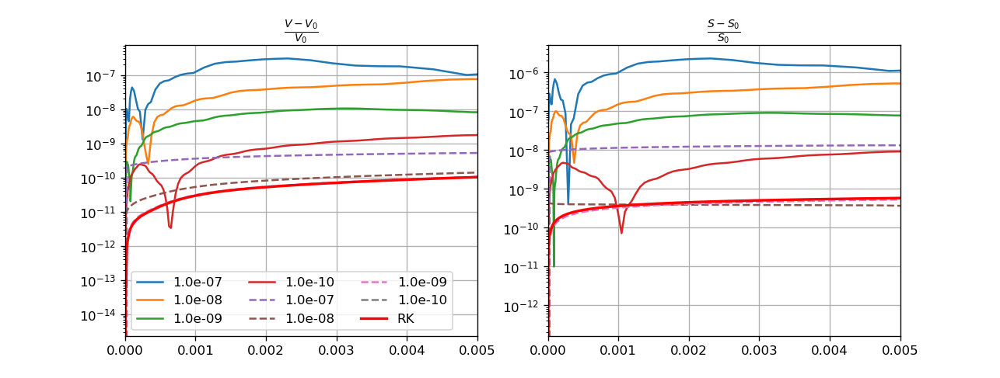

(0.0, 0.005)

In [333]:
%matplotlib notebook


fig,axs = plt.subplots(1,2,figsize=(8,4))
axs[0].grid()
axs[1].grid()
### BDF ###
for atol in atol_list_bdf:
    sol = np.load(
        f'dyn_bdf_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_BDF_atol={atol:.2e}.npy', allow_pickle=True).item()
    sol_t = sol['t']
    sol_y = sol['y']    
    
    Vol_ar=[]
    Sqr_ar=[]
    for j in range(len(sol_t)):
        P_fur_j = np.zeros(N)
        P_fur_j[1::]=sol_y[:N-1,j]
        Z_fur_j=sol_y[N-1:,j]
        
        Vol,Sqr,_ = get_VolSqr(P_fur_j, Z_fur_j)
        Vol_ar.append(Vol)
        Sqr_ar.append(Sqr)
    Vol_ar=np.array(Vol_ar)
    Sqr_ar=np.array(Sqr_ar)   
    axs[0].plot(sol_t, np.abs(Vol_ar/Vol0-1),'-', label=fr'{atol:.1e}')
    axs[1].plot(sol_t, np.abs(Sqr_ar/Sqr0-1),'-')


### Radau ###
for atol in atol_list_radau:
    sol = np.load(
        f'dyn_rad_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rad_atol={atol:.2e}.npy', allow_pickle=True).item()
    sol_t = sol['t']
    sol_y = sol['y']   
    
    Vol_ar=[]
    Sqr_ar=[]
    for j in range(len(sol_t)):
        P_fur_j = np.zeros(N)
        P_fur_j[1::]=sol_y[:N-1,j]
        Z_fur_j=sol_y[N-1:,j]
        
        Vol,Sqr,_ = get_VolSqr(P_fur_j, Z_fur_j)
        Vol_ar.append(Vol)
        Sqr_ar.append(Sqr)
    Vol_ar=np.array(Vol_ar)
    Sqr_ar=np.array(Sqr_ar)   
    axs[0].plot(sol_t, np.abs(Vol_ar/Vol0-1),'--', label=fr'{atol:.1e}')
    axs[1].plot(sol_t, np.abs(Sqr_ar/Sqr0-1),'--')


### RK ###    
sol = np.load(
    f'dyn_rk_p1={p1:.3f}_p2={p2:.3f}_z1={z1:.3f}_z2={z2:.3f}_to_t={t_max}_N={N}_n_int={n_int}_rk_max_step={max_step:.2e}.npy'
            , allow_pickle=True).item()
sol_t = sol['t']
sol_y = sol['y']

Vol_ar=[]
Sqr_ar=[]
for j in range(len(sol_t)):
    P_fur_j = np.zeros(N)
    P_fur_j[1::]=sol_y[:N-1,j]
    Z_fur_j=sol_y[N-1:,j]
    
    Vol,Sqr,_ = get_VolSqr(P_fur_j, Z_fur_j)
    Vol_ar.append(Vol)
    Sqr_ar.append(Sqr)
Vol_ar=np.array(Vol_ar)
Sqr_ar=np.array(Sqr_ar)   
axs[0].plot(sol_t, np.abs(Vol_ar/Vol0-1),'-',color='red',lw=2, label=fr'RK')
axs[1].plot(sol_t, np.abs(Sqr_ar/Sqr0-1),'-',color='red',lw=2)

axs[0].legend(ncol=3)
#plt.xlabel(r'$t$')
#plt.yscale('log')
axs[0].set_title(r'$\frac{V-V_0}{V_0}$')
axs[1].set_title(r'$\frac{S-S_0}{S_0}$')
axs[0].set_yscale('log')
axs[1].set_yscale('log')
#axs[0].set_ylim(1e-7,1e-4)
#axs[1].set_ylim(1e-7,1e-4)
axs[0].set_xlim(0, t_max)
axs[1].set_xlim(0, t_max)
